In [2]:
import logging
import numpy as np
import matplotlib.pyplot as plt
import tectosaur
import tectosaur.mesh.mesh_gen

from scipy.sparse.linalg import spsolve
from scipy.integrate import RK45
from scipy.optimize import fsolve

from tectosaur.mesh.combined_mesh import CombinedMesh
from tectosaur.ops.mass_op import MassOp
from tectosaur.ops.sparse_integral_op import SparseIntegralOp, FMMFarfieldBuilder
from tectosaur.constraint_builders import free_edge_constraints
from tectosaur.constraints import build_constraint_matrix
from tectosaur.util.geometry import unscaled_normals

import qd_newton

In [3]:
siay = 60 * 60 * 24 * 365.25
sm = 3e10                  # Shear modulus (Pa)
pr = 0.25                  # Poisson ratio 
density = 2700             # rock density (kg/m^3)
cs = np.sqrt(sm / density) # Shear wave speed (m/s)
eta = sm / (2 * cs)        # The radiation damping coefficient (kg / (m^2 * s))
cfg = dict(
    preconditioner = 'none',
    quad_mass_order = 4,
    quad_vertadj_order = 8,
    quad_far_order = 3,
    quad_near_order = 5,
    quad_near_threshold = 2.5,
    float_type = np.float32,
    use_fmm = False,
    fmm_order = 150,
    fmm_mac = 3.0,
    pts_per_cell = 450,
    log_level = logging.INFO
)
tectosaur.logger.setLevel(cfg['log_level'])


def make_integral_op(m, k_name, k_params, cfg, name1, name2):
    if cfg['use_fmm']:
        farfield = FMMFarfieldBuilder(
            cfg['fmm_order'], cfg['fmm_mac'], cfg['pts_per_cell']
        )
    else:
        farfield = None
    return SparseIntegralOp(
        cfg['quad_vertadj_order'], cfg['quad_far_order'],
        cfg['quad_near_order'], cfg['quad_near_threshold'],
        k_name, k_params, m.pts, m.tris, cfg['float_type'],
        farfield_op_type = farfield,
        obs_subset = m.get_tri_idxs(name1),
        src_subset = m.get_tri_idxs(name2)
    )

def make_mass_op(m, cfg):
    return MassOp(cfg['quad_mass_order'], m.pts, m.tris)

In [4]:
n_fault = 75
L = 10 * 1000 # 10 km
W = 10 * 1000 # 10 km
fault_m = tectosaur.mesh.mesh_gen.make_rect(n_fault, n_fault, [
    [-L, 0, W], [-L, 0, -W],
    [L, 0, -W], [L, 0, W]
])
m = CombinedMesh.from_named_pieces([('fault', fault_m)])
tri_normals = unscaled_normals(m.pts[m.tris])

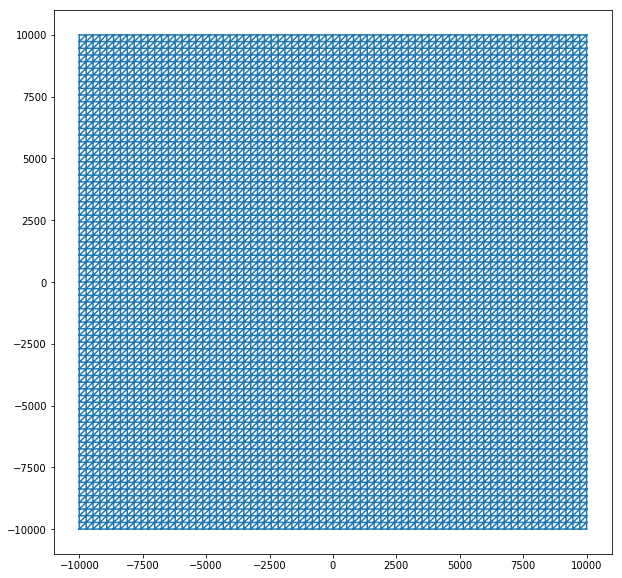

In [16]:
plt.figure(figsize = (10,10))
plt.triplot(m.pts[:,0], m.pts[:,2], m.tris)
plt.show()

In [5]:
cs = free_edge_constraints(m.get_tris('fault'))
cm, c_rhs = build_constraint_matrix(cs, m.n_dofs('fault'))

In [6]:
constrained_slip = np.ones(cm.shape[1])
ones_interior = cm.dot(constrained_slip)
slip100_interior = ones_interior.copy()
slip100_interior.reshape(-1,3)[:,1] = 0.0
slip100_interior.reshape(-1,3)[:,2] = 0.0

slip100 = slip100_interior.copy()
slip100.reshape(-1,3)[:,0] = 1.0

In [7]:
def plot_fields(field, ds = None):
    field_reshape = field.reshape(m.tris.shape[0],3,-1)
    n_fields = field_reshape.shape[2]
    plt.figure(figsize = (6 * n_fields,5))
    if ds is None:
        ds = range(n_fields)
    for d in ds:
        plt.subplot(1, n_fields, d + 1)
        pt_field = np.empty((m.pts.shape[0], n_fields))
        pt_field[m.tris] = field_reshape
        f = pt_field[:,d]
        min_f = np.min(f)
        max_f = np.max(f)
        if min_f == max_f:
            min_f -= 1e-10
            max_f += 1e-10
        levels = np.linspace(min_f, max_f, 21)
        plt.tricontourf(m.pts[:,0], m.pts[:,2], m.tris, f, levels = levels, extend = 'both', cmap = 'seismic')
        plt.colorbar()
    plt.show()
#plot_fields(slip100)

Setup the (slip -> traction) operator

In [8]:
hypersingular_op = make_integral_op(m, 'elasticH3', [sm, pr], cfg, 'fault', 'fault')
traction_mass_op = make_mass_op(m, cfg)
def slip_to_traction(slip):
    rhs = hypersingular_op.dot(slip)
    return spsolve(traction_mass_op.mat, rhs)

[4849632:INFO:tectosaur.util.cuda]
    Initialized CUDA on gpu: 0


Define the frictional parameters and equations

In [9]:
plate_rate = 1e-9  # (m/s), equivalent to ~31.5 mm/yr
a = 0.025          # direct velocity strengthening effect
b = 0.02           # state-based velocity weakening effect
Dc = 0.2           # state evolution length scale (m)
f0 = 0.6           # baseline coefficient of friction
V0 = 1e-6          # when V = V0, f = f0, V is (m/s)
additional_normal_stress = 50e6 #TODO: only necessary b/c full space model.


# Rate-state friction law w/ Rice et al 2001 regularization so that 
# it is nonsingular at V = 0
def F(V, sigma_n, state):
    f = a * np.arcsinh(V / (2 * V0) * np.exp(state / a))
    # the frictional stress is equal to the friction coefficient * the normal stress.
    return f * sigma_n

#https://www.wolframalpha.com/input/?i=d%5Ba*Q*arcsinh(x+%2F+(2*y)+*+exp(s%2Fa))%5D%2Fdx
def dFdV(V, sigma_n, state):
    expsa = np.exp(state / a)
    inside_sqrt = 1 + ((V * expsa) ** 2 / (4 * V0 ** 2))
    return a * expsa * sigma_n / (2 * V0 * np.sqrt(inside_sqrt))

# State evolution law -- aging law.
def G(V, state):
    return (b * V0 / Dc) * (np.exp((f0 - state) / b) - (V / V0))

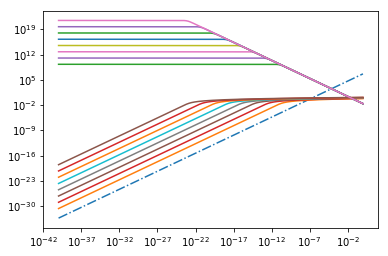

In [13]:
vv = 10 ** np.linspace(-40,0,1000)
plt.loglog(vv, eta * vv, '-.')
for S in np.linspace(0.3, 1.0, 8):
    ff = F(vv, 1.0, S)
    plt.loglog(vv, ff)
    plt.loglog(vv, dFdV(vv, 1.0, S))
plt.show()

Check that the "process zone" and $k_{crit}$ are good. See section 6 in Erickson et al 2014

In [10]:
mesh_L = min(L, W) / n_fault
Lb = sm * Dc / (additional_normal_stress * b)
hstar = (np.pi * sm * Dc) / (additional_normal_stress * (b - a))
print(mesh_L, Lb, hstar)

133.33333333333334 6000.0 -75398.223686155


Set up initial conditions. The edges of the fault should move at the plate rate and the interior should be moving at 1/1000th the plate rate. Then, solve for the corresponding steady state.

In [11]:
V = plate_rate * slip100
def steady_state(V):
    V_mag = np.linalg.norm(V)
    def f(state):
        return G(V_mag, state)
    return fsolve(f, 0.0, maxfev = 10000)[0]
steady_state = np.array([steady_state(V.reshape(-1,3)[i,:]) for i in range(V.shape[0] // 3)])

In [12]:
from tectosaur.util.timer import Timer
def get_slip_state(y):
    return y[:V.size], y[V.size:]

def get_plate_motion(t):
    return t * plate_rate * slip100

def get_slip_deficit(t, slip):
    return get_plate_motion(t).reshape(-1) - slip

def elastic_solve(slip_deficit):
    return slip_to_traction(slip_deficit).reshape((-1,3))

def rate_state_solve(traction, state):
    V = np.empty_like(slip100)
    qd_newton.rate_state_solver(
        tri_normals, traction, state, V, 
        eta, a, V0, additional_normal_stress, 
        1e-12, 50
    )
    V = (1 - slip100_interior) * plate_rate + ones_interior * V
    #TODO: Unconstrained slip
#     V.reshape((-1,3))[:,1] = 0.0
#     V.reshape((-1,3))[:,2] = 0.0
    return V

def state_evolution(V, state):
    V_mag = np.linalg.norm(V.reshape(-1,3), axis = 1)
    return G(V_mag, state)
    
def f(t, y):
    slip, state = get_slip_state(y)
    assert(state.shape[0] == m.tris.shape[0] * 3)
    slip_deficit = get_slip_deficit(t, slip)
#     plot_fields(slip_deficit)
    
    traction = elastic_solve(slip_deficit)
    V = rate_state_solve(traction, state)
    
    dstatedt = state_evolution(V, state)
    return np.concatenate((V, dstatedt))

initial_conditions = np.concatenate((V.flatten().copy(), steady_state))
integrator = RK45(f, 1, initial_conditions, 1e20, atol = 1e-11, rtol = 1e-11)

1 3.70658073891e-08
2 9.08430031399e-08
3 6.28614960648e-07
4 6.00633453573e-06
5 5.97835302865e-05
6 0.000597555487795
7 0.00597527506287
8 0.0597524708137
9 0.537953200932
10 0.747164391196
11 0.925702913528
12 1.07071492233
13 1.18876693798
14 1.27846415895
15 1.37889086184
16 1.46044259976
17 1.52985184919
18 1.56210888968
19 1.58788977401
20 1.61367065833
21 1.63945154266
22 1.66811345739
23 1.69677537211
24 1.71435203332
25 1.73380211395
26 1.75325219458
27 1.76596189482
28 1.77679486423
29 1.78762783365
30 1.79846080306
31 1.80929377248
32 1.82012674189
33 1.8278516322
34 1.83701915956
35 1.84055128986
36 1.84422243687
37 1.84789358388
38 1.85255808095
39 1.85508573043
40 1.85761337991
41 1.86033792659
42 1.86391014171
43 1.86844968849
44 1.8743258226
45 1.88086980309
46 1.88812769561
47 1.89022208877
48 1.89231648193
49 1.89450791118
50 1.89728577071
51 1.90059840093
52 1.90404098333
53 1.90817044235
54 1.91314232349
55 1.91811420464
56 1.92362168165
57 1.9295584226
58 1.932156

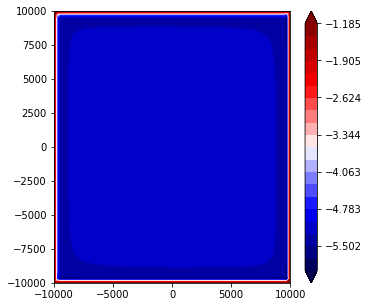

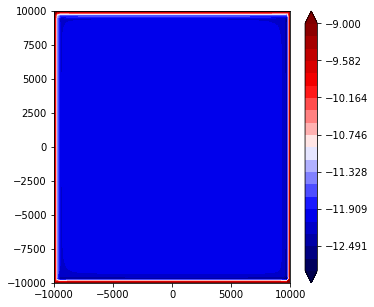

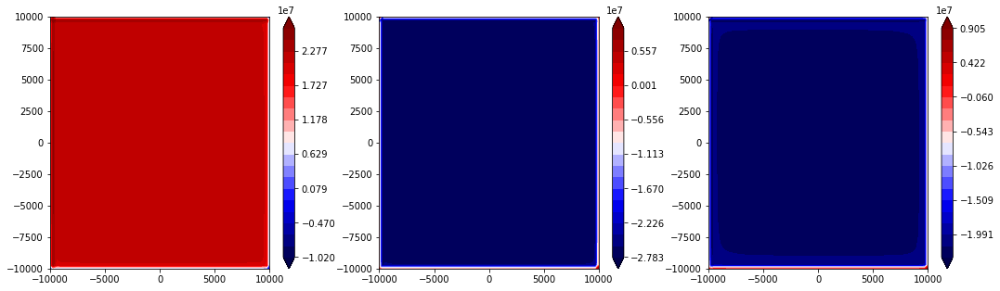

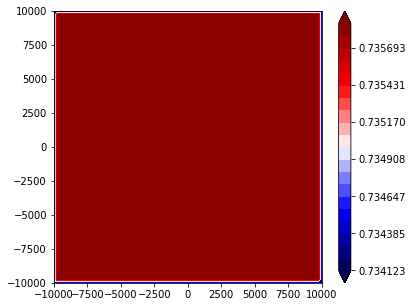

101 2.0729057757
102 2.07643287668
103 2.07995997765
104 2.08348707863
105 2.08701417961
106 2.09054128058
107 2.0935449666
108 2.0966173641
109 2.09983552381
110 2.10305368352
111 2.10628280909
112 2.10910075508
113 2.11203379511
114 2.11469184111
115 2.11734988712
116 2.12000793312
117 2.12277203407
118 2.12522370479
119 2.127798393
120 2.13045834857
121 2.13193086552
122 2.13273282895
123 2.13353479239
124 2.13434600158
125 2.13528836621
126 2.13633872127
127 2.13755505399
128 2.13900247264
129 2.14061715323
130 2.14243579943
131 2.14435854847
132 2.14628129751
133 2.14828865484
134 2.15042178367
135 2.1525549125
136 2.15468804133
137 2.15682117016
138 2.15895429899
139 2.16113030861
140 2.16330631823
141 2.16548232785
142 2.16769031859
143 2.16989830933
144 2.17210630007
145 2.17431429082
146 2.17652228156
147 2.1787302723
148 2.18093826305
149 2.18314625379
150 2.18535424453
151 2.18756223528
152 2.18977022602
153 2.19197821676
154 2.19418620751
155 2.19639419825
156 2.19860218899

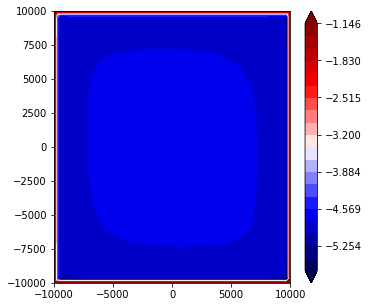

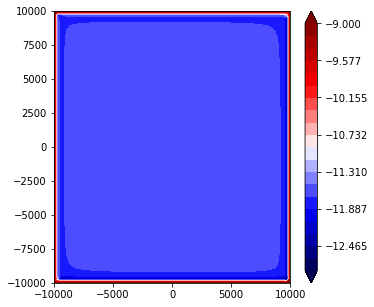

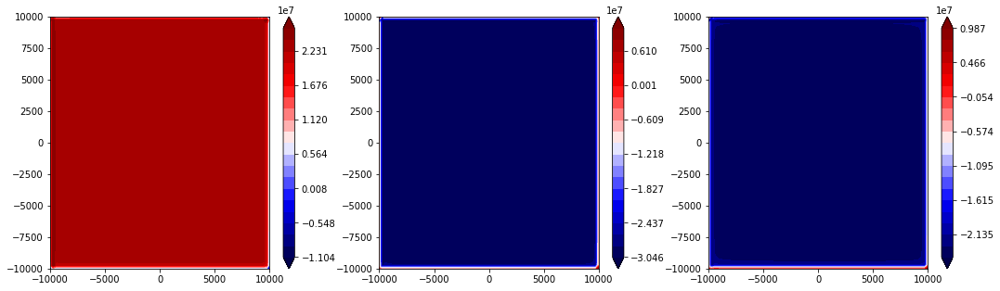

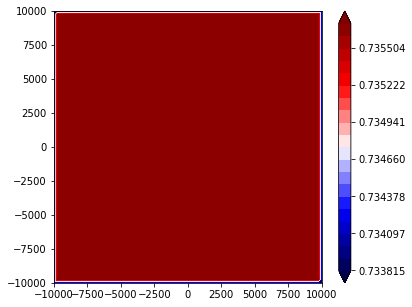

201 2.26620049093
202 2.26743761354
203 2.26870819153
204 2.26999271188
205 2.27129253998
206 2.27259236809
207 2.2738921962
208 2.2751920243
209 2.27649185241
210 2.27732059812
211 2.27796241092
212 2.27860422372
213 2.2792464765
214 2.27991095829
215 2.28065481491
216 2.28147441848
217 2.28229650455
218 2.28311859063
219 2.28400615006
220 2.28491783354
221 2.28583507409
222 2.28678570266
223 2.28777648293
224 2.28881125613
225 2.28984602932
226 2.29088080252
227 2.29152135962
228 2.29196980607
229 2.29241825252
230 2.29286669897
231 2.29333829619
232 2.29380989341
233 2.29435124508
234 2.29497531816
235 2.29559939124
236 2.29633048928
237 2.29710452498
238 2.2979209582
239 2.29877623725
240 2.29968719529
241 2.30059815332
242 2.30154637364
243 2.30249459397
244 2.30344281429
245 2.30439103461
246 2.30535670164
247 2.30634761471
248 2.30736493451
249 2.30838225431
250 2.30939957412
251 2.31041800279
252 2.31143643146
253 2.31245486013
254 2.31323304594
255 2.31402700452
256 2.31482096

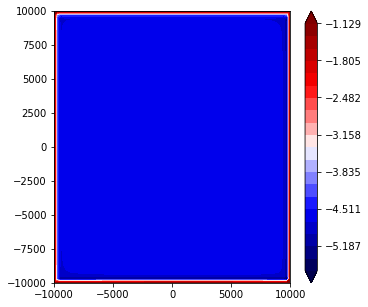

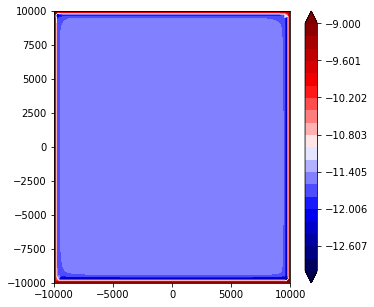

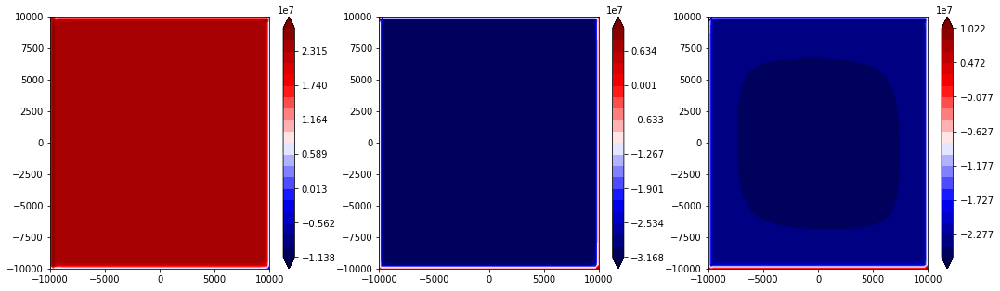

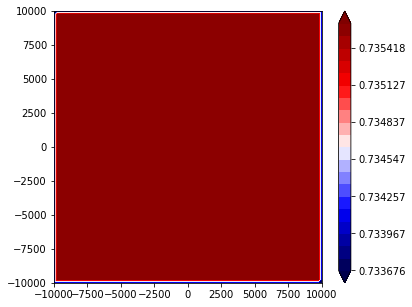

301 2.35658084061
302 2.35733819631
303 2.35809555202
304 2.35889481355
305 2.35969407508
306 2.36051453439
307 2.36133499371
308 2.36215545302
309 2.36297591233
310 2.36379637164
311 2.36461683095
312 2.36543729027
313 2.36625774958
314 2.36707820889
315 2.3678986682
316 2.36871912752
317 2.36953958683
318 2.37036004614
319 2.37118050545
320 2.37200096476
321 2.37282142408
322 2.37364188339
323 2.3744623427
324 2.37528280201
325 2.37610326132
326 2.37692372064
327 2.37774417995
328 2.37856463926
329 2.37938509857
330 2.38020555788
331 2.3810260172
332 2.38184647651
333 2.38266693582
334 2.38348739513
335 2.38430785444
336 2.38512831376
337 2.38594877307
338 2.38676923238
339 2.38750069224
340 2.3882321521
341 2.38896428919
342 2.38969642628
343 2.39042856338
344 2.39116070047
345 2.39189283756
346 2.39262497465
347 2.39335711175
348 2.39408924884
349 2.39482138593
350 2.39555352302
351 2.39628566011
352 2.39701779721
353 2.3977499343
354 2.39848207139
355 2.39921420848
356 2.399946345

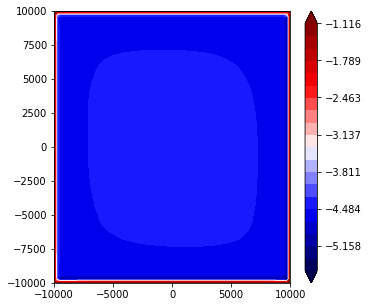

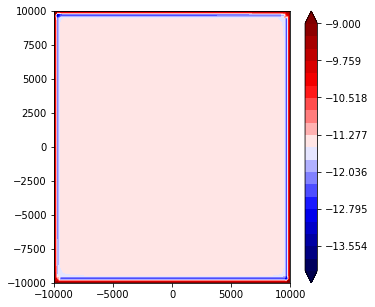

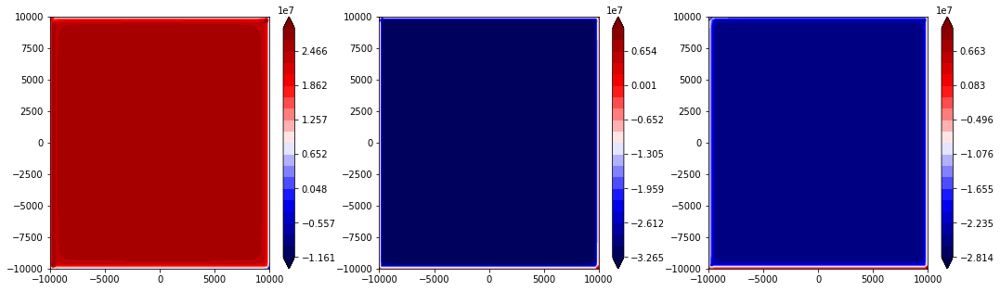

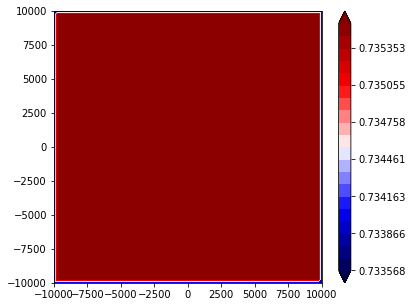

401 2.42796587882
402 2.42853867486
403 2.42911147089
404 2.42968426693
405 2.43025706297
406 2.43082985901
407 2.43140265505
408 2.43197545109
409 2.43254824713
410 2.43312104317
411 2.43369383921
412 2.43426663525
413 2.43483943128
414 2.43541222732
415 2.43598502336
416 2.4365578194
417 2.43713061544
418 2.43762509659
419 2.43811957774
420 2.4386140589
421 2.43911219362
422 2.43961032834
423 2.44010846307
424 2.44060659779
425 2.44110473252
426 2.4416079937
427 2.44211125489
428 2.44261451608
429 2.44311777727
430 2.44362103845
431 2.44412429964
432 2.44462756083
433 2.44513082202
434 2.4456340832
435 2.44613734439
436 2.44664060558
437 2.44714386677
438 2.44764712795
439 2.44815600022
440 2.4486648725
441 2.44917374477
442 2.44968261704
443 2.45019148931
444 2.45070036158
445 2.45120923385
446 2.45171810612
447 2.45222697839
448 2.45273585066
449 2.45315942497
450 2.45353161054
451 2.4539037961
452 2.45427882745
453 2.45465385879
454 2.45504980328
455 2.45544574777
456 2.4558416922

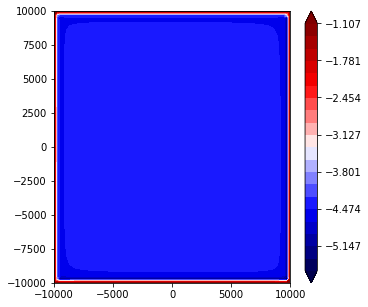

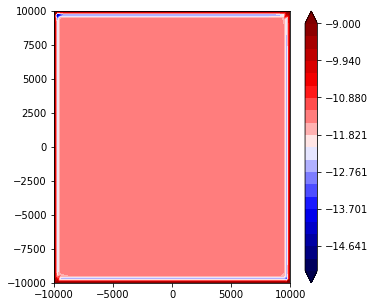

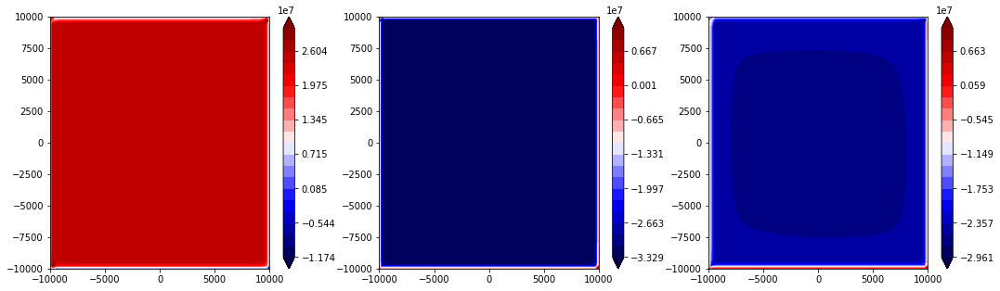

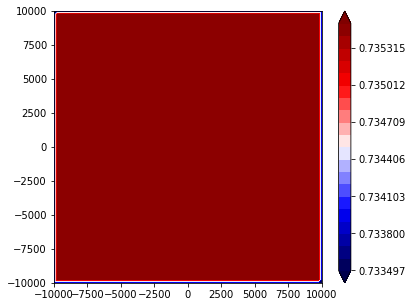

501 2.47568729562
502 2.47613699547
503 2.47658669532
504 2.47703639517
505 2.47748609502
506 2.47793579487
507 2.47833801168
508 2.47874022849
509 2.47914244529
510 2.4795446621
511 2.47994687891
512 2.48034909572
513 2.48075848611
514 2.48116787651
515 2.48157726691
516 2.48198665731
517 2.48239604771
518 2.48280543811
519 2.4832148285
520 2.4836242189
521 2.4840336093
522 2.4844429997
523 2.4848523901
524 2.48526178049
525 2.48567117089
526 2.48608056129
527 2.48649133089
528 2.48690210049
529 2.48731287009
530 2.48772363969
531 2.48813440929
532 2.48854517889
533 2.48895594848
534 2.48936671808
535 2.48977748768
536 2.49018825728
537 2.49059902688
538 2.49100979648
539 2.49142056608
540 2.49183133568
541 2.49224210528
542 2.49265287488
543 2.49306364448
544 2.49343150057
545 2.49379935666
546 2.49416721275
547 2.49453506885
548 2.49490292494
549 2.49527126119
550 2.49563959745
551 2.4960079337
552 2.49637626995
553 2.49674460621
554 2.49711294246
555 2.49748127872
556 2.49785214909

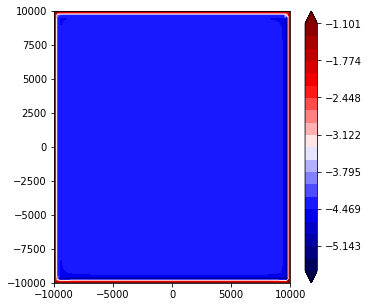

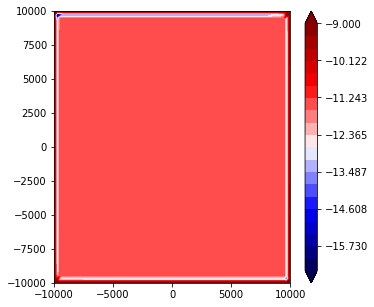

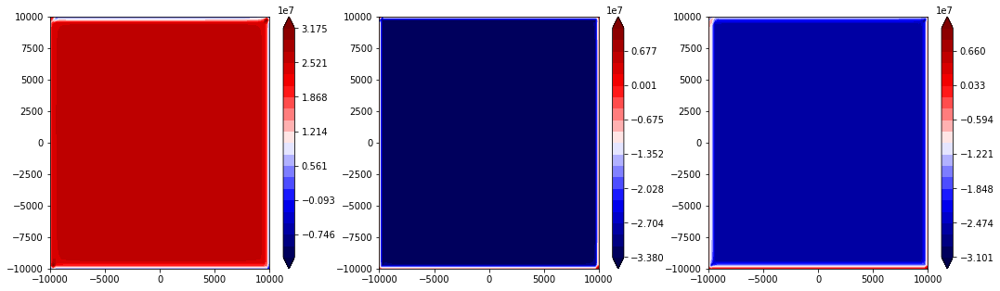

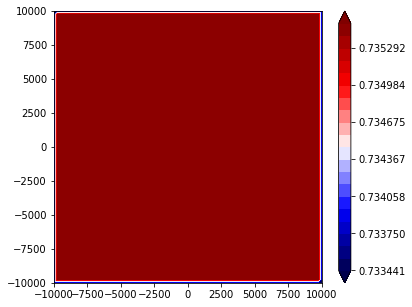

601 2.51333707255
602 2.5136574789
603 2.51397788525
604 2.51425336107
605 2.51446079463
606 2.5146682282
607 2.51487566176
608 2.51504648887
609 2.51519737697
610 2.51534826506
611 2.51549915316
612 2.51565231607
613 2.51580932689
614 2.5159663377
615 2.5161316843
616 2.5163067979
617 2.51648191151
618 2.51666156805
619 2.51684897817
620 2.51704718674
621 2.5172453953
622 2.51744630425
623 2.51765028685
624 2.51786199744
625 2.51808007137
626 2.51829814529
627 2.51851621921
628 2.51873429314
629 2.51895572394
630 2.51918615817
631 2.5194165924
632 2.51964702664
633 2.51987897579
634 2.52011931101
635 2.52036920981
636 2.52063093178
637 2.52089285966
638 2.52116364514
639 2.52143443062
640 2.52170521609
641 2.52197600157
642 2.52224930342
643 2.52252552659
644 2.52280174977
645 2.52307797295
646 2.52335565244
647 2.52363681592
648 2.5239179794
649 2.52419914288
650 2.52448030636
651 2.52476416141
652 2.52504801647
653 2.5253323259
654 2.52561663533
655 2.52590094476
656 2.52618525419
6

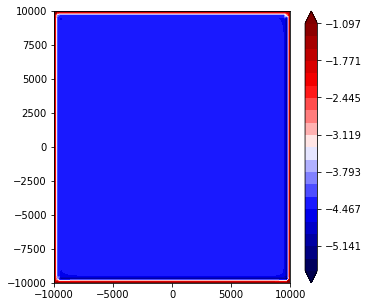

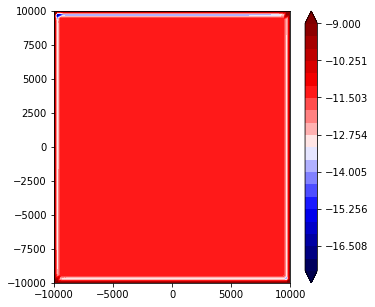

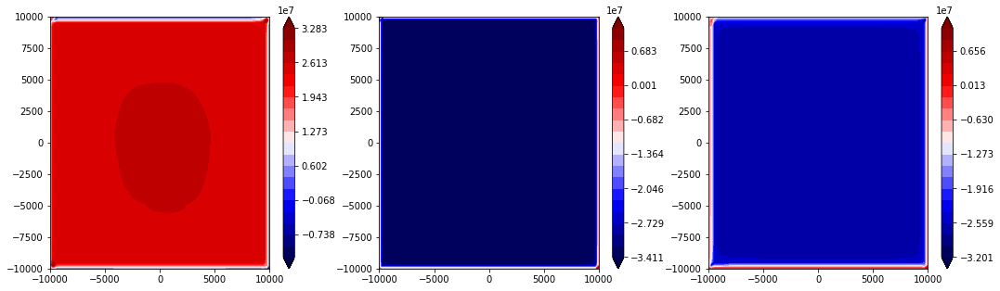

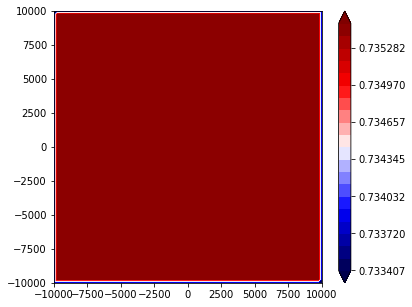

701 2.536580106
702 2.53685079028
703 2.53712147456
704 2.53739215884
705 2.53766284312
706 2.53793828079
707 2.53821371845
708 2.53848915612
709 2.53876459378
710 2.53904003144
711 2.53931818856
712 2.53959634567
713 2.53987450278
714 2.5401526599
715 2.54043081701
716 2.54070897412
717 2.54098713124
718 2.54126623047
719 2.54154532971
720 2.54182442895
721 2.54210352818
722 2.54238344367
723 2.54266556317
724 2.54294768267
725 2.54322980217
726 2.54351192167
727 2.54379404117
728 2.54407616067
729 2.54435828017
730 2.54464039966
731 2.54492251916
732 2.54520463866
733 2.54548675816
734 2.54576887766
735 2.54605099716
736 2.54633311666
737 2.54661523616
738 2.54689735566
739 2.54717947516
740 2.54746159466
741 2.54774371416
742 2.54802583365
743 2.54830795315
744 2.54859007265
745 2.54887219215
746 2.54915431165
747 2.54943643115
748 2.54971855065
749 2.55000067015
750 2.55028278965
751 2.55056490915
752 2.55084702865
753 2.55112914815
754 2.55141126765
755 2.55169338714
756 2.5519755

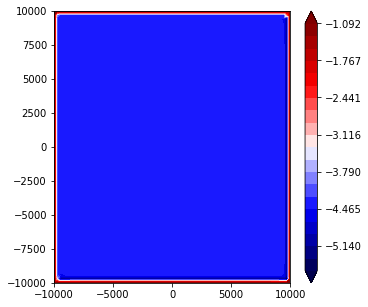

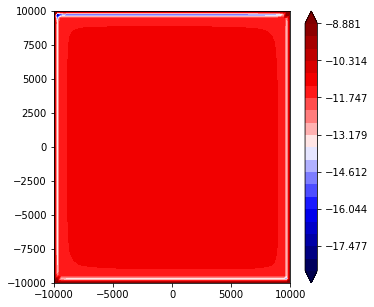

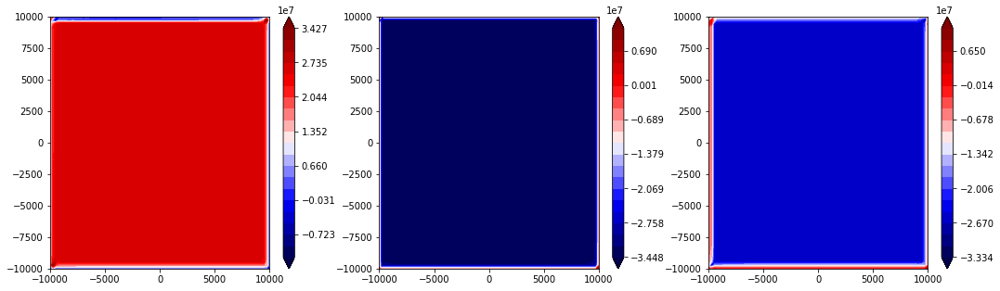

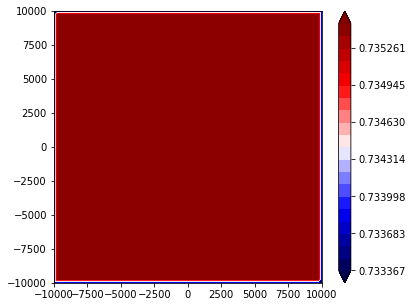

801 2.56398005333
802 2.56419713264
803 2.56441421195
804 2.56463129126
805 2.56484837058
806 2.56506943987
807 2.56529468674
808 2.56552529509
809 2.56575590344
810 2.56598651179
811 2.56621714391
812 2.56644777603
813 2.56667840815
814 2.56690907703
815 2.56713974592
816 2.5673704148
817 2.56760146947
818 2.56783252415
819 2.56806357883
820 2.5682946335
821 2.56852568818
822 2.56875674286
823 2.56898779754
824 2.56921885221
825 2.56945189729
826 2.56968494238
827 2.56991798746
828 2.57015103254
829 2.57038407762
830 2.5706171227
831 2.57085016778
832 2.57108321286
833 2.57131625795
834 2.57154930303
835 2.57178234811
836 2.57201539319
837 2.57224843827
838 2.57248148335
839 2.57271452844
840 2.57294757352
841 2.5731806186
842 2.57341366368
843 2.57364670876
844 2.57387975384
845 2.57411279892
846 2.57434584401
847 2.57448206605
848 2.57461828809
849 2.57476000605
850 2.5749112754
851 2.57506254475
852 2.57522531384
853 2.57539458768
854 2.5755706756
855 2.57575240764
856 2.5759413984

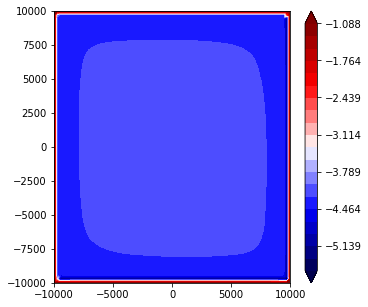

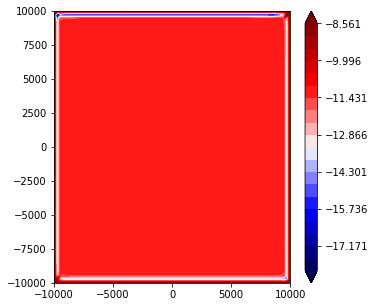

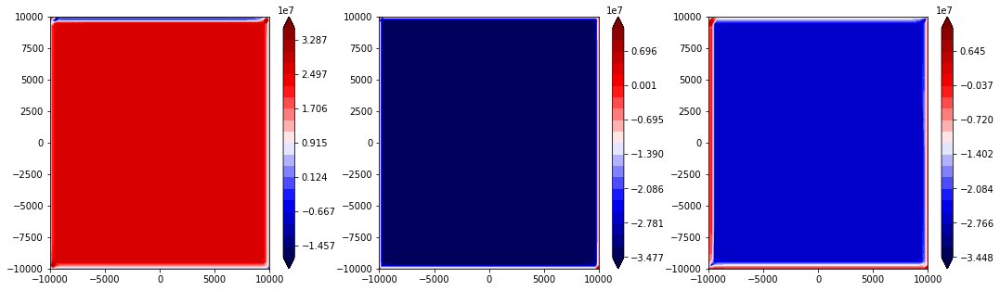

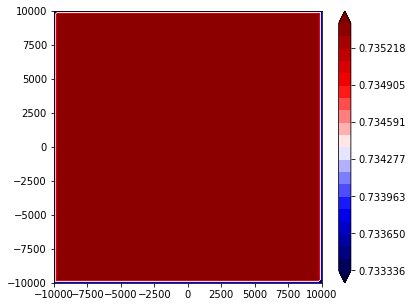

901 2.58520643437
902 2.58541377468
903 2.58559745306
904 2.58578113143
905 2.58596832649
906 2.58615552155
907 2.5863427166
908 2.58652991166
909 2.58671710672
910 2.58690430177
911 2.58709149683
912 2.58727869189
913 2.58746760153
914 2.58765956947
915 2.58785153742
916 2.58804350536
917 2.58823547331
918 2.58842744125
919 2.58861940919
920 2.58881137714
921 2.58900334508
922 2.58919531303
923 2.58938728097
924 2.58958007041
925 2.58977285985
926 2.58996564928
927 2.59015843872
928 2.59035122815
929 2.59054401759
930 2.59073680703
931 2.59092959646
932 2.5911223859
933 2.59131517533
934 2.59150796477
935 2.59170075421
936 2.59189354364
937 2.59208633308
938 2.59227912252
939 2.59247191195
940 2.59266470139
941 2.59285749082
942 2.59305028026
943 2.5932430697
944 2.59343585913
945 2.59362864857
946 2.593821438
947 2.59401422744
948 2.59420701688
949 2.59439980631
950 2.59454277163
951 2.59465765284
952 2.59477562809
953 2.5948834613
954 2.59499129451
955 2.59510791288
956 2.5952245312

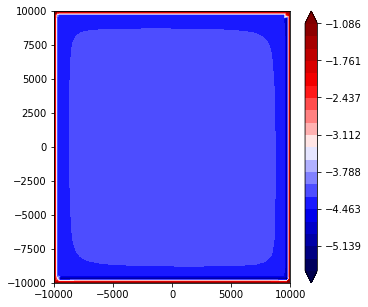

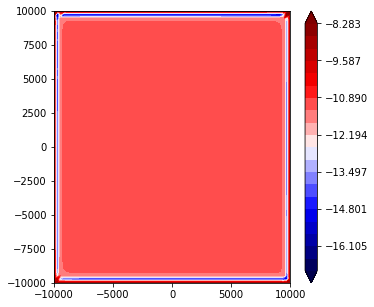

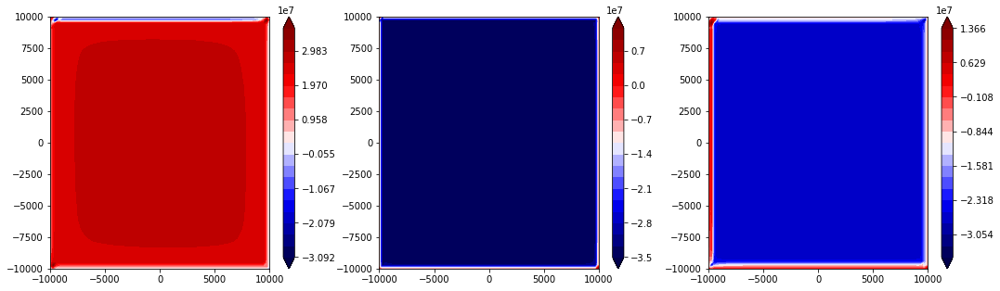

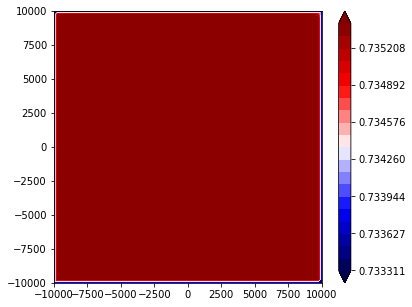

1001 2.60231845139
1002 2.60247470079
1003 2.60263095019
1004 2.60278719959
1005 2.60292567835
1006 2.60306415711
1007 2.60320263586
1008 2.60334111462
1009 2.60347959338
1010 2.60361807213
1011 2.60375655089
1012 2.60389759194
1013 2.604038633
1014 2.60417967405
1015 2.60432071511
1016 2.60446175616
1017 2.60460279722
1018 2.60474383827
1019 2.60488487933
1020 2.60502599837
1021 2.60516711742
1022 2.60530876685
1023 2.60545041628
1024 2.60559206571
1025 2.60573371514
1026 2.60587536457
1027 2.60602032968
1028 2.6061652948
1029 2.60631025992
1030 2.60645879441
1031 2.60661138373
1032 2.60676397304
1033 2.60691810969
1034 2.60707224634
1035 2.607226383
1036 2.60738051965
1037 2.6075346563
1038 2.60768879295
1039 2.6078429296
1040 2.60799706625
1041 2.6081512029
1042 2.60830575029
1043 2.60846033013
1044 2.60861526405
1045 2.60877019797
1046 2.6089251319
1047 2.60908006582
1048 2.60923630465
1049 2.60939472677
1050 2.60955314889
1051 2.60971334986
1052 2.60987355083
1053 2.6100337518
105

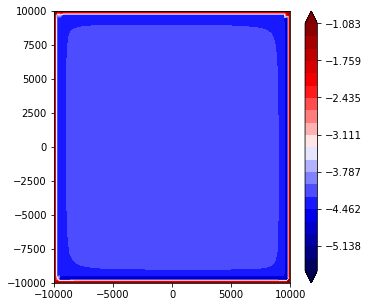

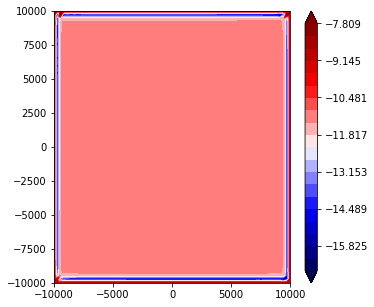

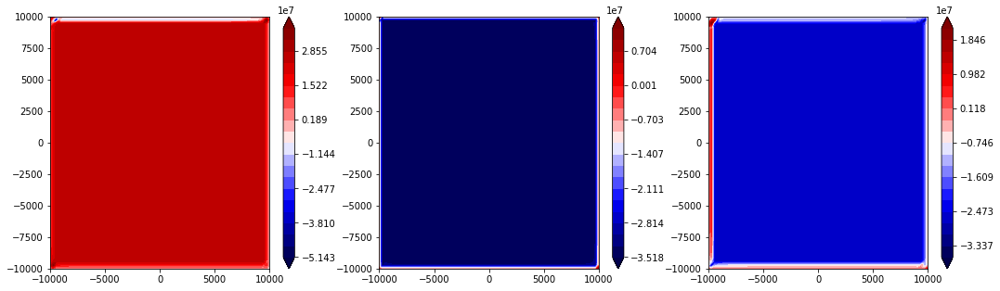

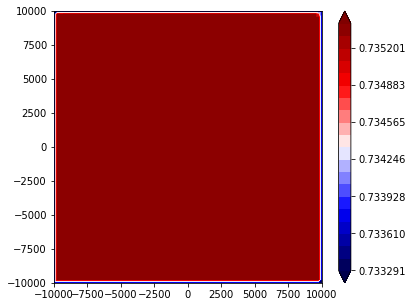

1101 2.61586337423
1102 2.61590550468
1103 2.61593866027
1104 2.61597182193
1105 2.61599264566
1106 2.61601212265
1107 2.61602698184
1108 2.6160386508
1109 2.61605031977
1110 2.61605766124
1111 2.6160639185
1112 2.61606920026
1113 2.61607332124
1114 2.61607679835
1115 2.61607968678
1116 2.61608203598
1117 2.61608390041
1118 2.61608537106
1119 2.61608660265
1120 2.61608760525
1121 2.61608842025
1122 2.61608913088
1123 2.61608972699
1124 2.61609021886
1125 2.6160906052
1126 2.61609091642
1127 2.61609116351
1128 2.61609138501
1129 2.61609156238
1130 2.6160917025
1131 2.61609182437
1132 2.61609192381
1133 2.61609202325
1134 2.61609208487
1135 2.61609214998
1136 2.61609219108
1137 2.61609222639
1138 2.61609225532
1139 2.61609228426
1140 2.6160923018
1141 2.6160923169
1142 2.61609232922
1143 2.61609234154
1144 2.61609234966
1145 2.61609235664
1146 2.61609236244
1147 2.61609236723
1148 2.61609237069
1149 2.61609237382
1150 2.61609237694
1151 2.61609237913
1152 2.61609238097
1153 2.61609238244

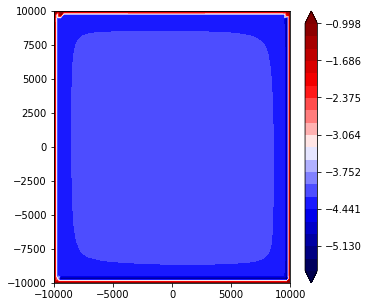

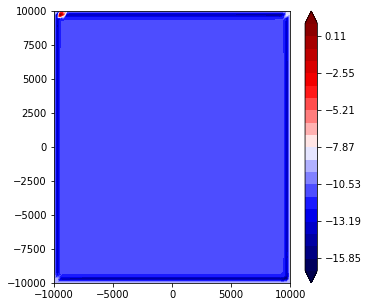

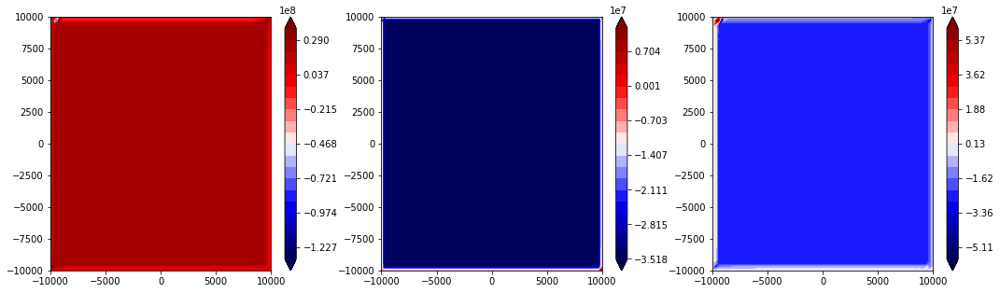

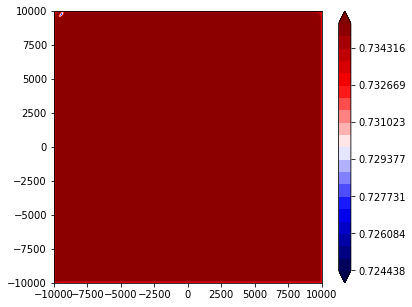

1201 2.61609239332
1202 2.61609239338
1203 2.61609239342
1204 2.61609239347
1205 2.61609239351
1206 2.61609239355
1207 2.61609239359
1208 2.61609239364
1209 2.61609239368
1210 2.61609239372
1211 2.61609239376
1212 2.61609239381
1213 2.61609239385
1214 2.61609239389
1215 2.61609239393
1216 2.61609239397
1217 2.616092394
1218 2.61609239402
1219 2.61609239404
1220 2.61609239407
1221 2.61609239409
1222 2.61609239412
1223 2.61609239415
1224 2.61609239418
1225 2.61609239421
1226 2.61609239424
1227 2.61609239428
1228 2.6160923943
1229 2.61609239432
1230 2.61609239433
1231 2.61609239434
1232 2.61609239436
1233 2.61609239437
1234 2.61609239438
1235 2.61609239439
1236 2.6160923944
1237 2.61609239441
1238 2.61609239442
1239 2.61609239443
1240 2.61609239443
1241 2.61609239444
1242 2.61609239445
1243 2.61609239446
1244 2.61609239447
1245 2.61609239447
1246 2.61609239448
1247 2.61609239449
1248 2.6160923945
1249 2.61609239451
1250 2.61609239451
1251 2.61609239452
1252 2.61609239453
1253 2.6160923945

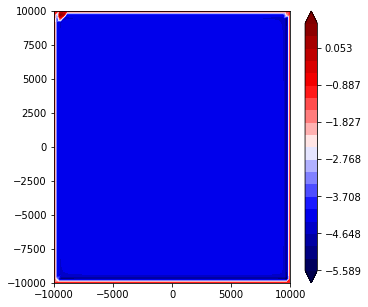

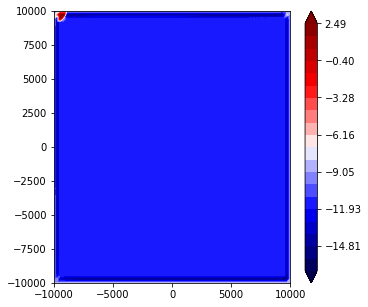

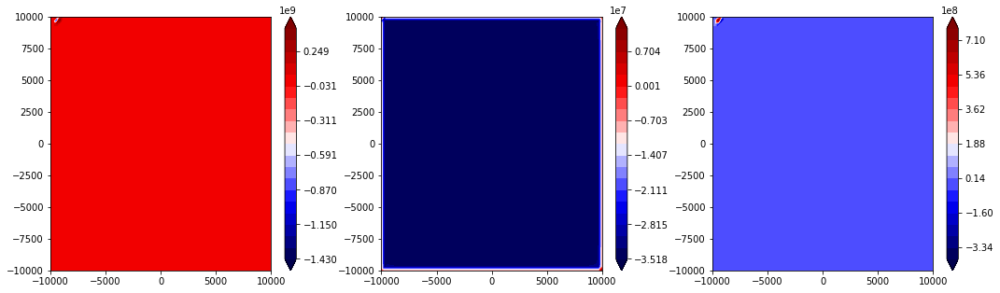

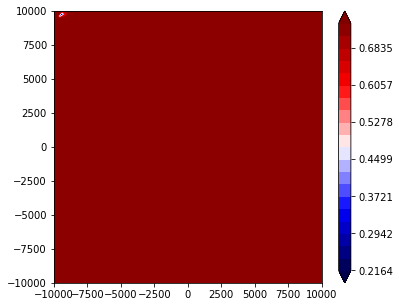

1301 2.61609239494
1302 2.61609239495
1303 2.61609239495
1304 2.61609239496
1305 2.61609239496
1306 2.61609239497
1307 2.61609239497
1308 2.61609239498
1309 2.61609239498
1310 2.61609239499
1311 2.61609239499
1312 2.616092395
1313 2.616092395
1314 2.61609239501
1315 2.61609239502
1316 2.61609239502
1317 2.61609239503
1318 2.61609239504
1319 2.61609239504
1320 2.61609239505
1321 2.61609239506
1322 2.61609239506
1323 2.61609239507
1324 2.61609239507
1325 2.61609239508
1326 2.61609239508
1327 2.61609239509
1328 2.61609239509
1329 2.61609239509
1330 2.6160923951
1331 2.6160923951
1332 2.61609239511
1333 2.61609239511
1334 2.61609239512
1335 2.61609239512
1336 2.61609239513
1337 2.61609239514
1338 2.61609239514
1339 2.61609239515
1340 2.61609239515
1341 2.61609239516
1342 2.61609239517
1343 2.61609239517
1344 2.61609239518
1345 2.61609239518
1346 2.61609239519
1347 2.61609239519
1348 2.6160923952
1349 2.61609239521
1350 2.61609239521
1351 2.61609239522
1352 2.61609239522
1353 2.61609239523


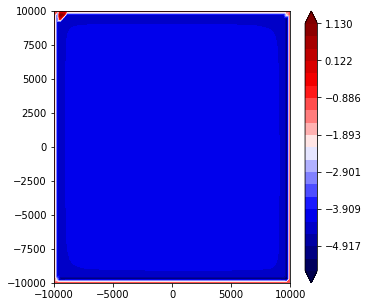

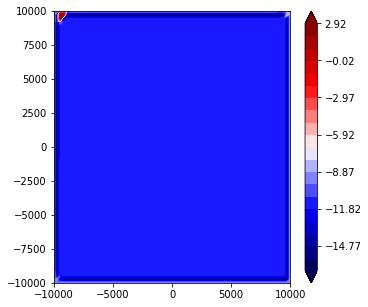

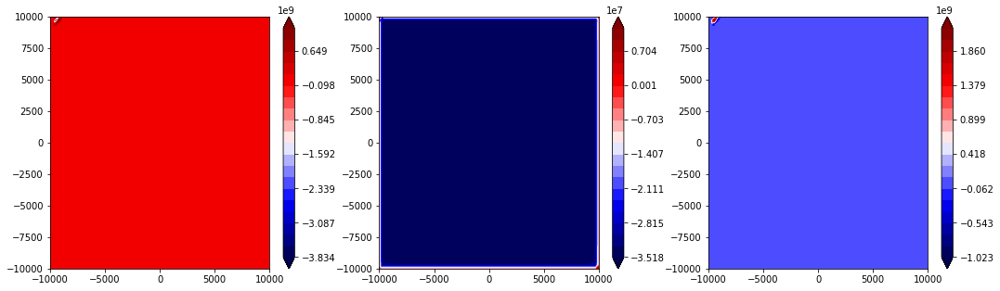

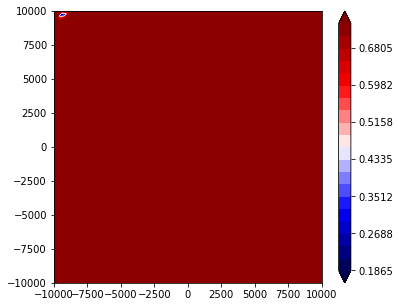

1401 2.61609239546
1402 2.61609239546
1403 2.61609239547
1404 2.61609239547
1405 2.61609239547
1406 2.61609239548
1407 2.61609239548
1408 2.61609239549
1409 2.61609239549
1410 2.61609239549
1411 2.6160923955
1412 2.6160923955
1413 2.6160923955
1414 2.61609239551
1415 2.61609239551
1416 2.61609239552
1417 2.61609239552
1418 2.61609239552
1419 2.61609239553
1420 2.61609239553
1421 2.61609239554
1422 2.61609239554
1423 2.61609239554
1424 2.61609239555
1425 2.61609239555
1426 2.61609239556
1427 2.61609239556
1428 2.61609239556
1429 2.61609239557
1430 2.61609239557
1431 2.61609239558
1432 2.61609239558
1433 2.61609239558
1434 2.61609239559
1435 2.61609239559
1436 2.61609239559
1437 2.6160923956
1438 2.6160923956
1439 2.61609239561
1440 2.61609239561
1441 2.61609239561
1442 2.61609239562
1443 2.61609239562
1444 2.61609239562
1445 2.61609239563
1446 2.61609239563
1447 2.61609239563
1448 2.61609239564
1449 2.61609239564
1450 2.61609239564
1451 2.61609239565
1452 2.61609239565
1453 2.6160923956

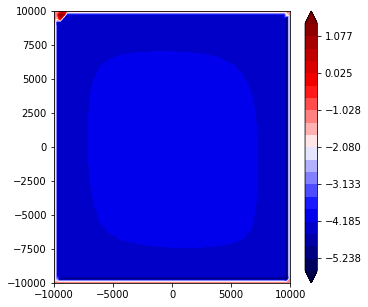

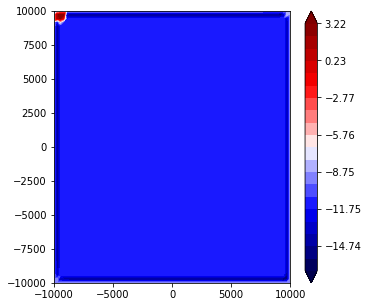

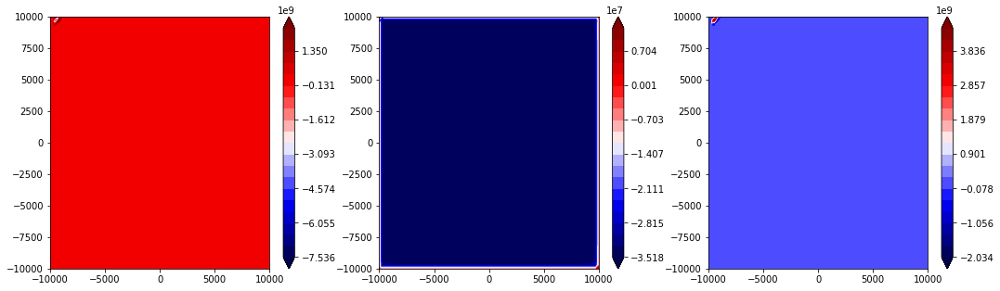

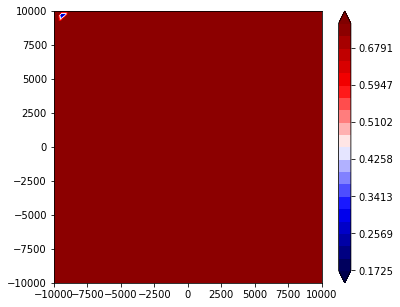

1501 2.61609239581
1502 2.61609239581
1503 2.61609239582
1504 2.61609239582
1505 2.61609239582
1506 2.61609239582
1507 2.61609239583
1508 2.61609239583
1509 2.61609239583
1510 2.61609239584
1511 2.61609239584
1512 2.61609239584
1513 2.61609239585
1514 2.61609239585
1515 2.61609239585
1516 2.61609239585
1517 2.61609239586
1518 2.61609239586
1519 2.61609239586
1520 2.61609239586
1521 2.61609239587
1522 2.61609239587
1523 2.61609239587
1524 2.61609239588
1525 2.61609239588
1526 2.61609239588
1527 2.61609239588
1528 2.61609239589
1529 2.61609239589
1530 2.61609239589
1531 2.61609239589
1532 2.6160923959
1533 2.6160923959
1534 2.6160923959
1535 2.6160923959
1536 2.61609239591
1537 2.61609239591
1538 2.61609239591
1539 2.61609239592
1540 2.61609239592
1541 2.61609239592
1542 2.61609239592
1543 2.61609239592
1544 2.61609239593
1545 2.61609239593
1546 2.61609239593
1547 2.61609239593
1548 2.61609239594
1549 2.61609239594
1550 2.61609239594
1551 2.61609239594
1552 2.61609239595
1553 2.616092395

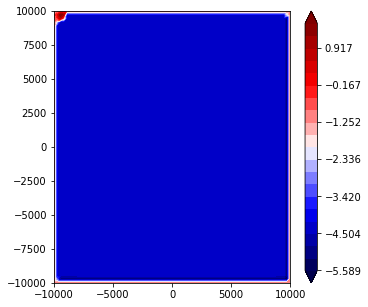

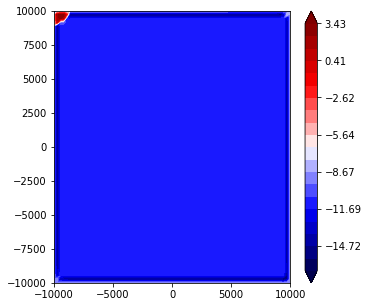

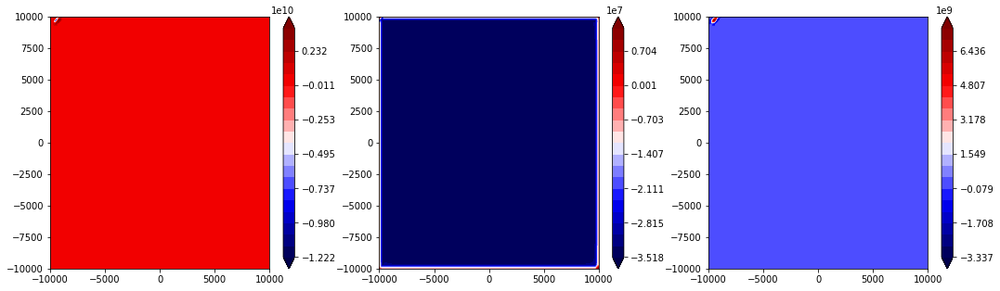

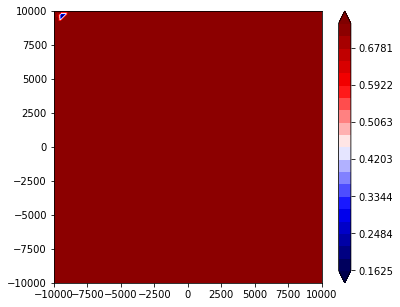

1601 2.61609239606
1602 2.61609239606
1603 2.61609239606
1604 2.61609239606
1605 2.61609239607
1606 2.61609239607
1607 2.61609239607
1608 2.61609239607
1609 2.61609239607
1610 2.61609239608
1611 2.61609239608
1612 2.61609239608
1613 2.61609239608
1614 2.61609239608
1615 2.61609239609
1616 2.61609239609
1617 2.61609239609
1618 2.61609239609
1619 2.6160923961
1620 2.6160923961
1621 2.6160923961
1622 2.6160923961
1623 2.6160923961
1624 2.61609239611
1625 2.61609239611
1626 2.61609239611
1627 2.61609239611
1628 2.61609239611
1629 2.61609239612
1630 2.61609239612
1631 2.61609239612
1632 2.61609239612
1633 2.61609239612
1634 2.61609239613
1635 2.61609239613
1636 2.61609239613
1637 2.61609239613
1638 2.61609239613
1639 2.61609239613
1640 2.61609239614
1641 2.61609239614
1642 2.61609239614
1643 2.61609239614
1644 2.61609239614
1645 2.61609239615
1646 2.61609239615
1647 2.61609239615
1648 2.61609239615
1649 2.61609239615
1650 2.61609239616
1651 2.61609239616
1652 2.61609239616
1653 2.6160923961

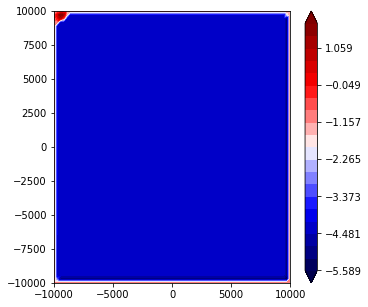

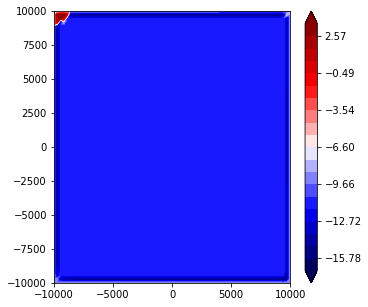

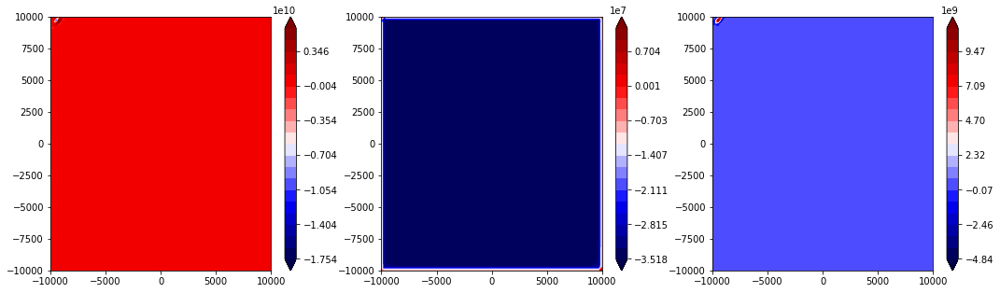

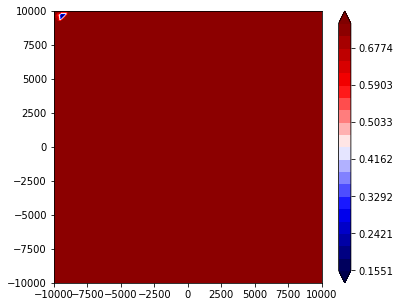

1701 2.61609239624
1702 2.61609239624
1703 2.61609239625
1704 2.61609239625
1705 2.61609239625
1706 2.61609239625
1707 2.61609239625
1708 2.61609239625
1709 2.61609239626
1710 2.61609239626
1711 2.61609239626
1712 2.61609239626
1713 2.61609239626
1714 2.61609239626
1715 2.61609239627
1716 2.61609239627
1717 2.61609239627
1718 2.61609239627
1719 2.61609239627
1720 2.61609239627
1721 2.61609239628
1722 2.61609239628
1723 2.61609239628
1724 2.61609239628
1725 2.61609239628
1726 2.61609239628
1727 2.61609239628
1728 2.61609239629
1729 2.61609239629
1730 2.61609239629
1731 2.61609239629
1732 2.61609239629
1733 2.61609239629
1734 2.6160923963
1735 2.6160923963
1736 2.6160923963
1737 2.6160923963
1738 2.6160923963
1739 2.6160923963
1740 2.6160923963
1741 2.61609239631
1742 2.61609239631
1743 2.61609239631
1744 2.61609239631
1745 2.61609239631
1746 2.61609239631
1747 2.61609239632
1748 2.61609239632
1749 2.61609239632
1750 2.61609239632
1751 2.61609239632
1752 2.61609239632
1753 2.61609239632


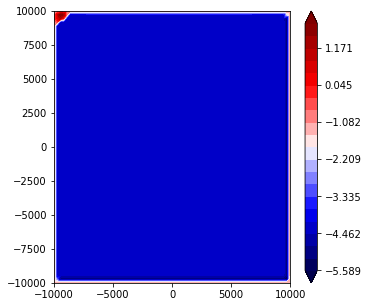

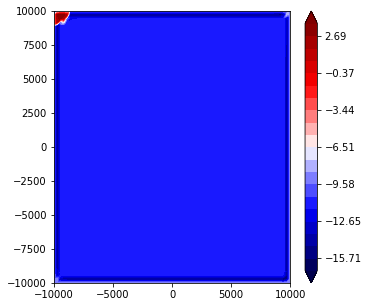

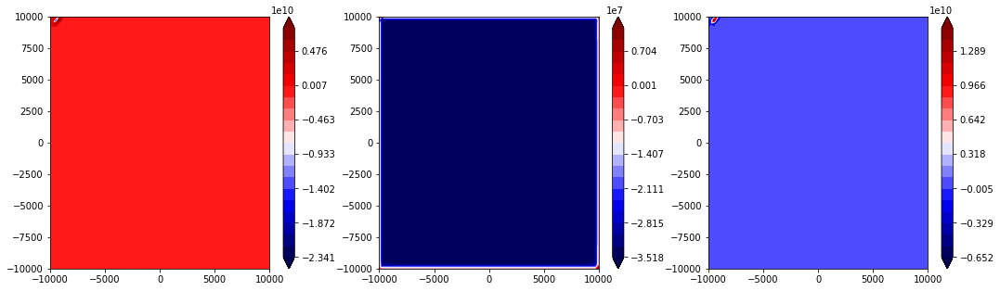

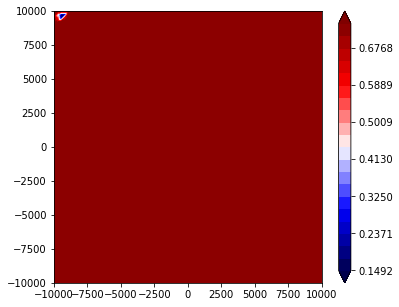

1801 2.61609239639
1802 2.61609239639
1803 2.61609239639
1804 2.61609239639
1805 2.6160923964
1806 2.6160923964
1807 2.6160923964
1808 2.6160923964
1809 2.6160923964
1810 2.6160923964
1811 2.6160923964
1812 2.61609239641
1813 2.61609239641
1814 2.61609239641
1815 2.61609239641
1816 2.61609239641
1817 2.61609239641
1818 2.61609239641
1819 2.61609239641
1820 2.61609239642
1821 2.61609239642
1822 2.61609239642
1823 2.61609239642
1824 2.61609239642
1825 2.61609239642
1826 2.61609239642
1827 2.61609239642
1828 2.61609239643
1829 2.61609239643
1830 2.61609239643
1831 2.61609239643
1832 2.61609239643
1833 2.61609239643
1834 2.61609239643
1835 2.61609239643
1836 2.61609239644
1837 2.61609239644
1838 2.61609239644
1839 2.61609239644
1840 2.61609239644
1841 2.61609239644
1842 2.61609239644
1843 2.61609239644
1844 2.61609239645
1845 2.61609239645
1846 2.61609239645
1847 2.61609239645
1848 2.61609239645
1849 2.61609239645
1850 2.61609239645
1851 2.61609239645
1852 2.61609239646
1853 2.61609239646


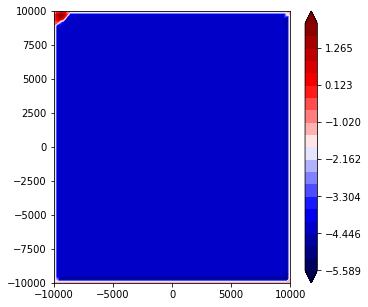

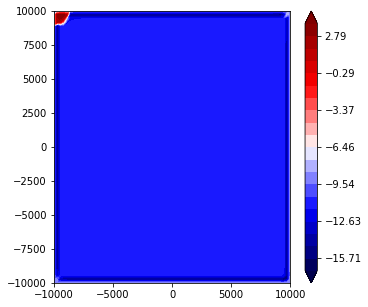

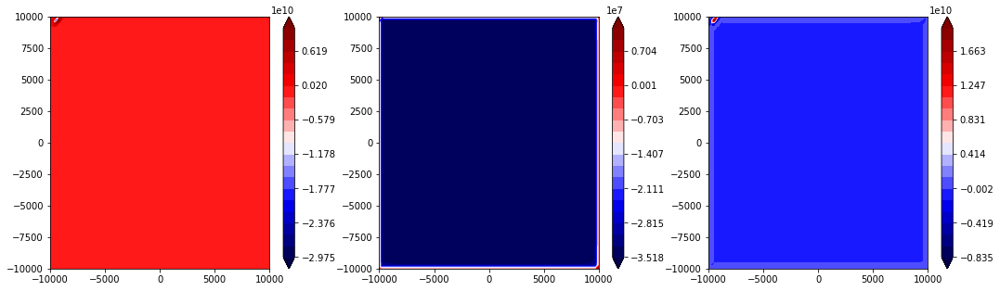

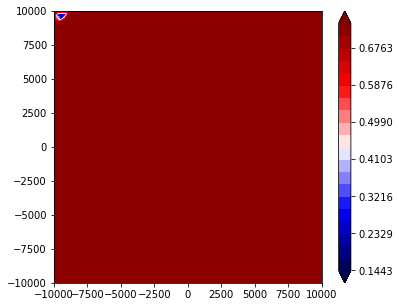

1901 2.61609239651
1902 2.61609239651
1903 2.61609239651
1904 2.61609239652
1905 2.61609239652
1906 2.61609239652
1907 2.61609239652
1908 2.61609239652
1909 2.61609239652
1910 2.61609239652
1911 2.61609239652
1912 2.61609239652
1913 2.61609239653
1914 2.61609239653
1915 2.61609239653
1916 2.61609239653
1917 2.61609239653
1918 2.61609239653
1919 2.61609239653
1920 2.61609239653
1921 2.61609239653
1922 2.61609239653
1923 2.61609239654
1924 2.61609239654
1925 2.61609239654
1926 2.61609239654
1927 2.61609239654
1928 2.61609239654
1929 2.61609239654
1930 2.61609239654
1931 2.61609239654
1932 2.61609239655
1933 2.61609239655
1934 2.61609239655
1935 2.61609239655
1936 2.61609239655
1937 2.61609239655
1938 2.61609239655
1939 2.61609239655
1940 2.61609239655
1941 2.61609239655
1942 2.61609239656
1943 2.61609239656
1944 2.61609239656
1945 2.61609239656
1946 2.61609239656
1947 2.61609239656
1948 2.61609239656
1949 2.61609239656
1950 2.61609239656
1951 2.61609239656
1952 2.61609239657
1953 2.61609

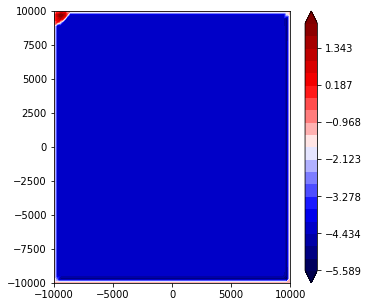

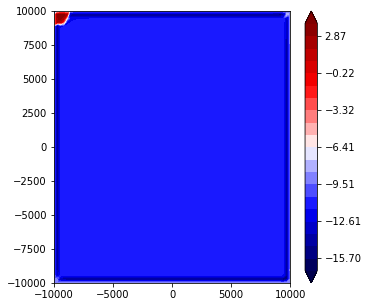

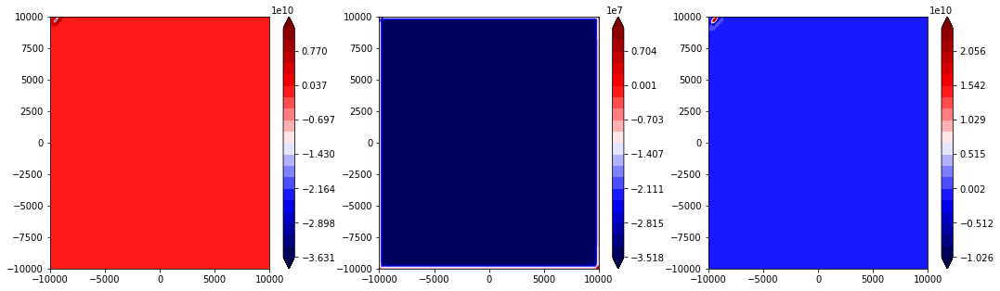

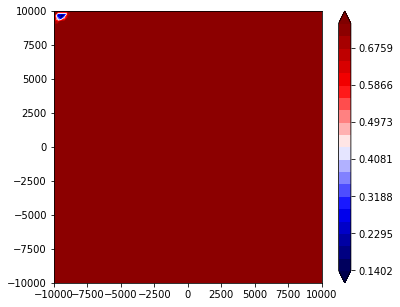

2001 2.61609239661
2002 2.61609239661
2003 2.61609239662
2004 2.61609239662
2005 2.61609239662
2006 2.61609239662
2007 2.61609239662
2008 2.61609239662
2009 2.61609239662
2010 2.61609239662
2011 2.61609239662
2012 2.61609239662
2013 2.61609239662
2014 2.61609239662
2015 2.61609239663
2016 2.61609239663
2017 2.61609239663
2018 2.61609239663
2019 2.61609239663
2020 2.61609239663
2021 2.61609239663
2022 2.61609239663
2023 2.61609239663
2024 2.61609239663
2025 2.61609239663
2026 2.61609239664
2027 2.61609239664
2028 2.61609239664
2029 2.61609239664
2030 2.61609239664
2031 2.61609239664
2032 2.61609239664
2033 2.61609239664
2034 2.61609239664
2035 2.61609239664
2036 2.61609239664
2037 2.61609239665
2038 2.61609239665
2039 2.61609239665
2040 2.61609239665
2041 2.61609239665
2042 2.61609239665
2043 2.61609239665
2044 2.61609239665
2045 2.61609239665
2046 2.61609239665
2047 2.61609239665
2048 2.61609239665
2049 2.61609239666
2050 2.61609239666
2051 2.61609239666
2052 2.61609239666
2053 2.61609

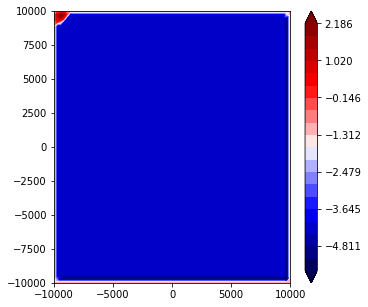

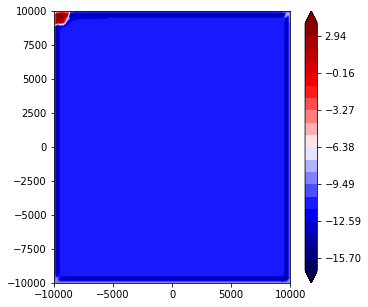

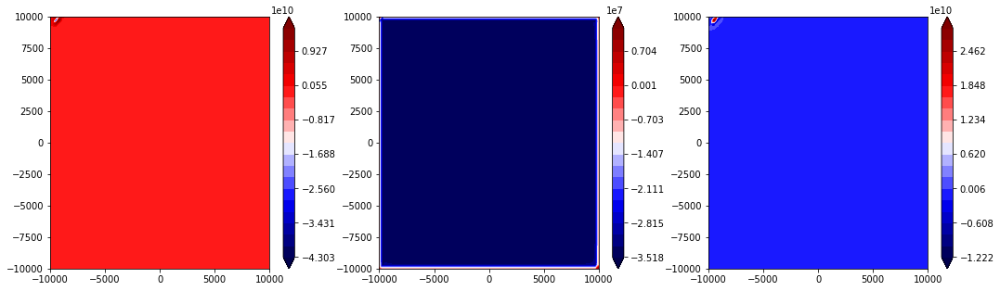

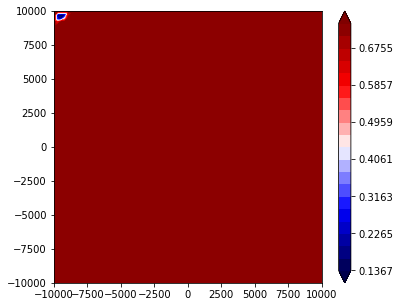

2101 2.6160923967
2102 2.6160923967
2103 2.6160923967
2104 2.6160923967
2105 2.6160923967
2106 2.6160923967
2107 2.6160923967
2108 2.6160923967
2109 2.61609239671
2110 2.61609239671
2111 2.61609239671
2112 2.61609239671
2113 2.61609239671
2114 2.61609239671
2115 2.61609239671
2116 2.61609239671
2117 2.61609239671
2118 2.61609239671
2119 2.61609239671
2120 2.61609239671
2121 2.61609239672
2122 2.61609239672
2123 2.61609239672
2124 2.61609239672
2125 2.61609239672
2126 2.61609239672
2127 2.61609239672
2128 2.61609239672
2129 2.61609239672
2130 2.61609239672
2131 2.61609239672
2132 2.61609239672
2133 2.61609239672
2134 2.61609239673
2135 2.61609239673
2136 2.61609239673
2137 2.61609239673
2138 2.61609239673
2139 2.61609239673
2140 2.61609239673
2141 2.61609239673
2142 2.61609239673
2143 2.61609239673
2144 2.61609239673
2145 2.61609239673
2146 2.61609239673
2147 2.61609239674
2148 2.61609239674
2149 2.61609239674
2150 2.61609239674
2151 2.61609239674
2152 2.61609239674
2153 2.61609239674
2

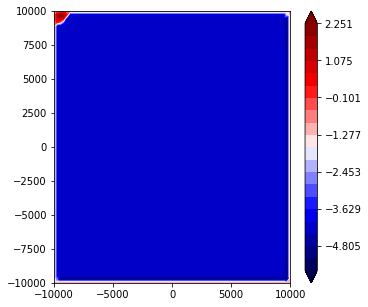

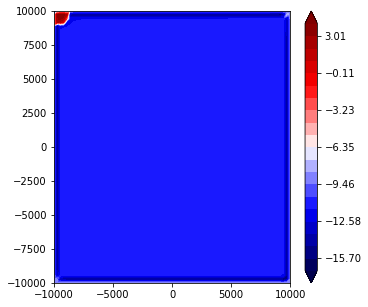

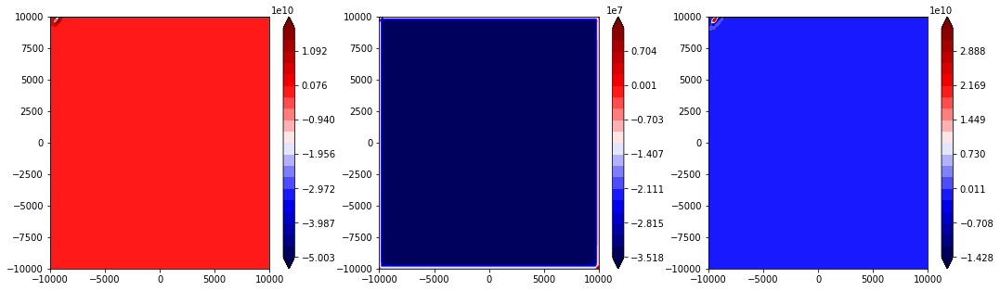

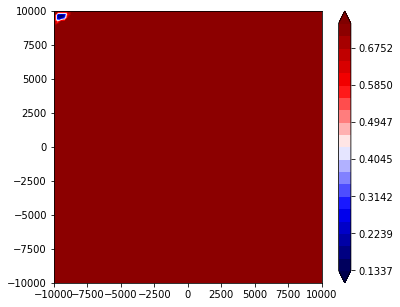

2201 2.61609239678
2202 2.61609239678
2203 2.61609239678
2204 2.61609239678
2205 2.61609239678
2206 2.61609239678
2207 2.61609239678
2208 2.61609239678
2209 2.61609239678
2210 2.61609239678
2211 2.61609239678
2212 2.61609239678
2213 2.61609239678
2214 2.61609239678
2215 2.61609239679
2216 2.61609239679
2217 2.61609239679
2218 2.61609239679
2219 2.61609239679
2220 2.61609239679
2221 2.61609239679
2222 2.61609239679
2223 2.61609239679
2224 2.61609239679
2225 2.61609239679
2226 2.61609239679
2227 2.61609239679
2228 2.61609239679
2229 2.61609239679
2230 2.6160923968
2231 2.6160923968
2232 2.6160923968
2233 2.6160923968
2234 2.6160923968
2235 2.6160923968
2236 2.6160923968
2237 2.6160923968
2238 2.6160923968
2239 2.6160923968
2240 2.6160923968
2241 2.6160923968
2242 2.6160923968
2243 2.6160923968
2244 2.6160923968
2245 2.61609239681
2246 2.61609239681
2247 2.61609239681
2248 2.61609239681
2249 2.61609239681
2250 2.61609239681
2251 2.61609239681
2252 2.61609239681
2253 2.61609239681
2254 2.6

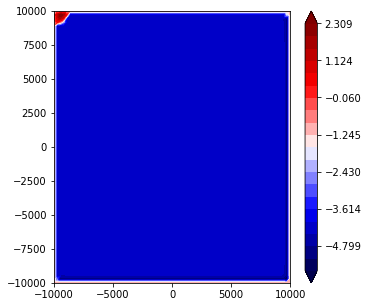

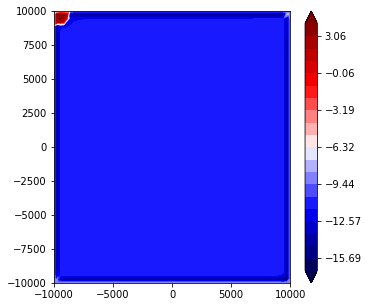

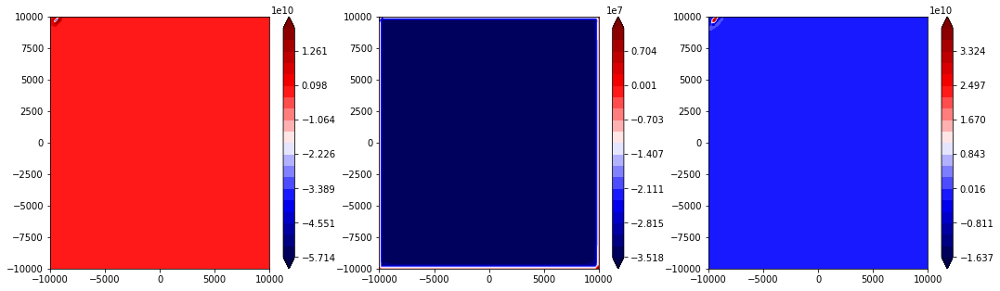

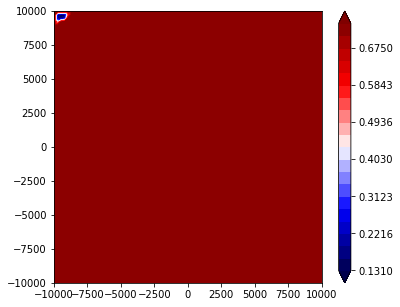

2301 2.61609239684
2302 2.61609239684
2303 2.61609239684
2304 2.61609239684
2305 2.61609239685
2306 2.61609239685
2307 2.61609239685
2308 2.61609239685
2309 2.61609239685
2310 2.61609239685
2311 2.61609239685
2312 2.61609239685
2313 2.61609239685
2314 2.61609239685
2315 2.61609239685
2316 2.61609239685
2317 2.61609239685
2318 2.61609239685
2319 2.61609239686
2320 2.61609239686
2321 2.61609239686
2322 2.61609239686
2323 2.61609239686
2324 2.61609239686
2325 2.61609239686
2326 2.61609239686
2327 2.61609239686
2328 2.61609239686
2329 2.61609239686
2330 2.61609239686
2331 2.61609239686
2332 2.61609239686
2333 2.61609239686
2334 2.61609239686
2335 2.61609239687
2336 2.61609239687
2337 2.61609239687
2338 2.61609239687
2339 2.61609239687
2340 2.61609239687
2341 2.61609239687
2342 2.61609239687
2343 2.61609239687
2344 2.61609239687
2345 2.61609239687
2346 2.61609239687
2347 2.61609239687
2348 2.61609239687
2349 2.61609239687
2350 2.61609239687
2351 2.61609239688
2352 2.61609239688
2353 2.61609

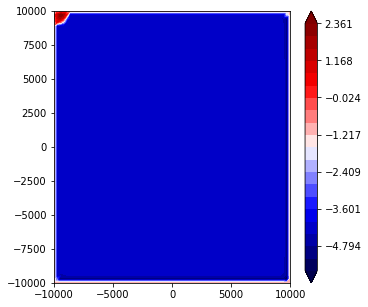

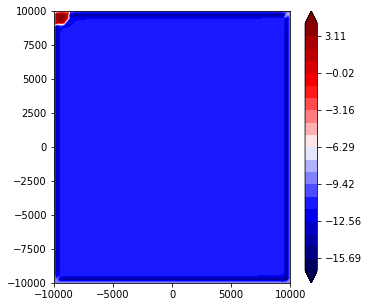

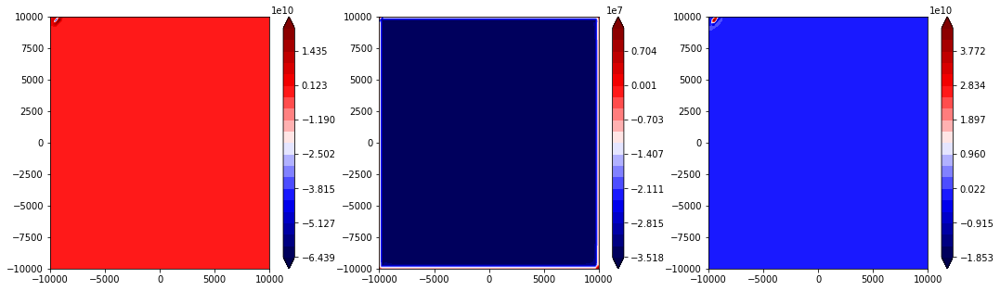

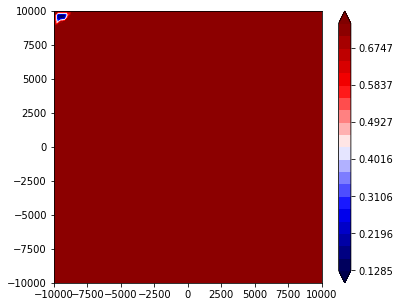

2401 2.6160923969
2402 2.6160923969
2403 2.6160923969
2404 2.6160923969
2405 2.61609239691
2406 2.61609239691
2407 2.61609239691
2408 2.61609239691
2409 2.61609239691
2410 2.61609239691
2411 2.61609239691
2412 2.61609239691
2413 2.61609239691
2414 2.61609239691
2415 2.61609239691
2416 2.61609239691
2417 2.61609239691
2418 2.61609239691
2419 2.61609239691
2420 2.61609239691
2421 2.61609239691
2422 2.61609239691
2423 2.61609239692
2424 2.61609239692
2425 2.61609239692
2426 2.61609239692
2427 2.61609239692
2428 2.61609239692
2429 2.61609239692
2430 2.61609239692
2431 2.61609239692
2432 2.61609239692
2433 2.61609239692
2434 2.61609239692
2435 2.61609239692
2436 2.61609239692
2437 2.61609239692
2438 2.61609239692
2439 2.61609239692
2440 2.61609239692
2441 2.61609239693
2442 2.61609239693
2443 2.61609239693
2444 2.61609239693
2445 2.61609239693
2446 2.61609239693
2447 2.61609239693
2448 2.61609239693
2449 2.61609239693
2450 2.61609239693
2451 2.61609239693
2452 2.61609239693
2453 2.616092396

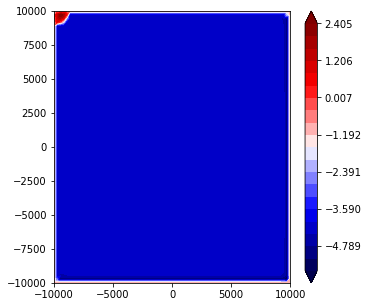

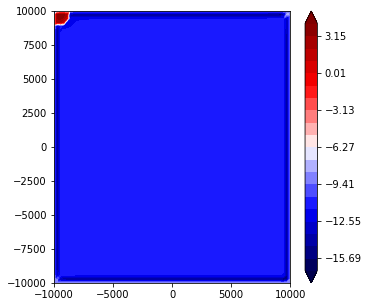

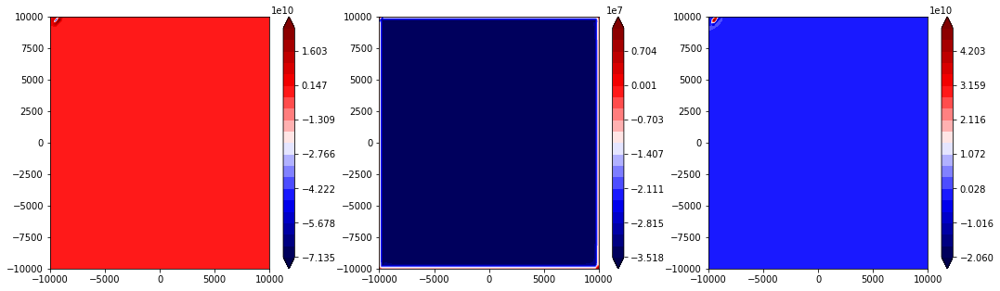

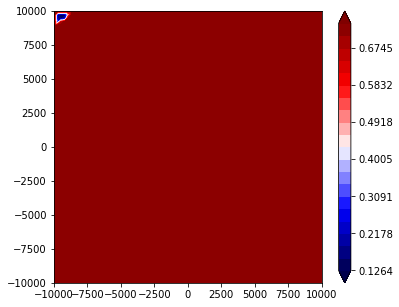

2501 2.61609239696
2502 2.61609239696
2503 2.61609239696
2504 2.61609239696
2505 2.61609239696
2506 2.61609239696
2507 2.61609239696
2508 2.61609239696
2509 2.61609239696
2510 2.61609239696
2511 2.61609239696
2512 2.61609239696
2513 2.61609239696
2514 2.61609239696
2515 2.61609239696
2516 2.61609239696
2517 2.61609239696
2518 2.61609239696
2519 2.61609239696
2520 2.61609239696
2521 2.61609239697
2522 2.61609239697
2523 2.61609239697
2524 2.61609239697
2525 2.61609239697
2526 2.61609239697
2527 2.61609239697
2528 2.61609239697
2529 2.61609239697
2530 2.61609239697
2531 2.61609239697
2532 2.61609239697
2533 2.61609239697
2534 2.61609239697
2535 2.61609239697
2536 2.61609239697
2537 2.61609239697
2538 2.61609239697
2539 2.61609239697
2540 2.61609239698
2541 2.61609239698
2542 2.61609239698
2543 2.61609239698
2544 2.61609239698
2545 2.61609239698
2546 2.61609239698
2547 2.61609239698
2548 2.61609239698
2549 2.61609239698
2550 2.61609239698
2551 2.61609239698
2552 2.61609239698
2553 2.61609

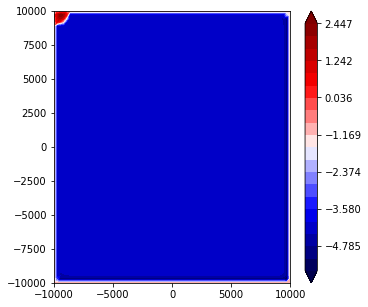

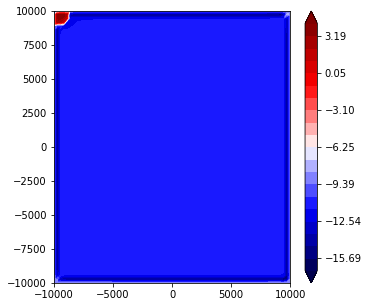

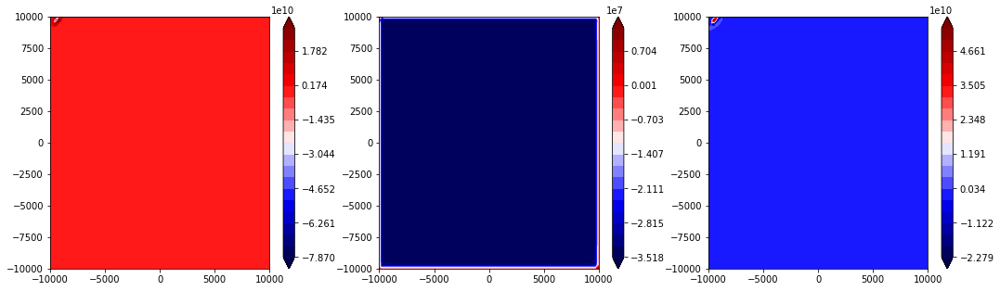

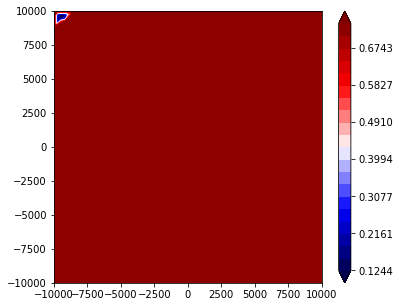

2601 2.616092397
2602 2.61609239701
2603 2.61609239701
2604 2.61609239701
2605 2.61609239701
2606 2.61609239701
2607 2.61609239701
2608 2.61609239701
2609 2.61609239701
2610 2.61609239701
2611 2.61609239701
2612 2.61609239701
2613 2.61609239701
2614 2.61609239701
2615 2.61609239701
2616 2.61609239701
2617 2.61609239701
2618 2.61609239701
2619 2.61609239701
2620 2.61609239701
2621 2.61609239701
2622 2.61609239701
2623 2.61609239702
2624 2.61609239702
2625 2.61609239702
2626 2.61609239702
2627 2.61609239702
2628 2.61609239702
2629 2.61609239702
2630 2.61609239702
2631 2.61609239702
2632 2.61609239702
2633 2.61609239702
2634 2.61609239702
2635 2.61609239702
2636 2.61609239702
2637 2.61609239702
2638 2.61609239702
2639 2.61609239702
2640 2.61609239702
2641 2.61609239702
2642 2.61609239702
2643 2.61609239702
2644 2.61609239702
2645 2.61609239702
2646 2.61609239703
2647 2.61609239703
2648 2.61609239703
2649 2.61609239703
2650 2.61609239703
2651 2.61609239703
2652 2.61609239703
2653 2.6160923

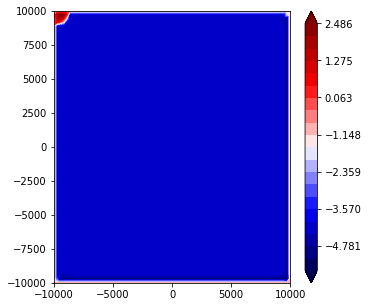

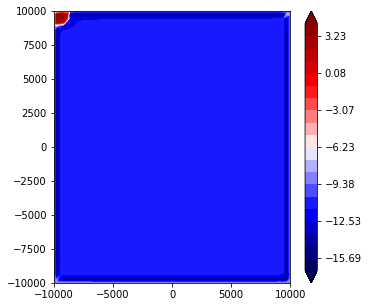

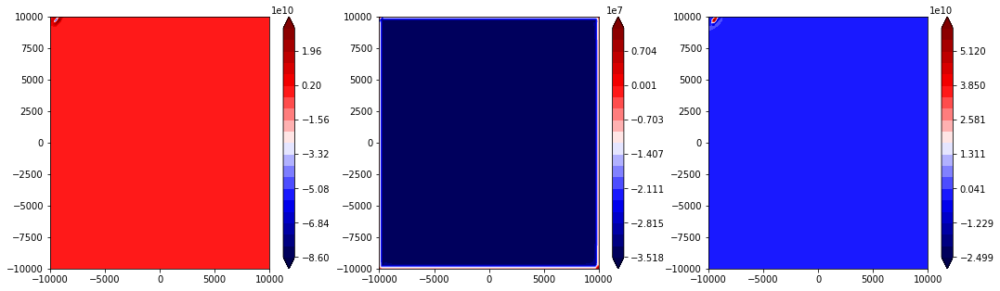

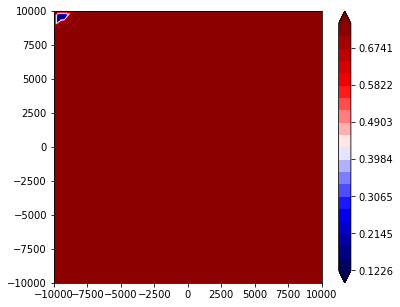

2701 2.61609239705
2702 2.61609239705
2703 2.61609239705
2704 2.61609239705
2705 2.61609239705
2706 2.61609239705
2707 2.61609239705
2708 2.61609239705
2709 2.61609239705
2710 2.61609239705
2711 2.61609239705
2712 2.61609239705
2713 2.61609239705
2714 2.61609239706
2715 2.61609239706
2716 2.61609239706
2717 2.61609239706
2718 2.61609239706
2719 2.61609239706
2720 2.61609239706
2721 2.61609239706
2722 2.61609239706
2723 2.61609239706
2724 2.61609239706
2725 2.61609239706
2726 2.61609239706
2727 2.61609239706
2728 2.61609239706
2729 2.61609239706
2730 2.61609239706
2731 2.61609239706
2732 2.61609239706
2733 2.61609239706
2734 2.61609239706
2735 2.61609239706
2736 2.61609239706
2737 2.61609239707
2738 2.61609239707
2739 2.61609239707
2740 2.61609239707
2741 2.61609239707
2742 2.61609239707
2743 2.61609239707
2744 2.61609239707
2745 2.61609239707
2746 2.61609239707
2747 2.61609239707
2748 2.61609239707
2749 2.61609239707
2750 2.61609239707
2751 2.61609239707
2752 2.61609239707
2753 2.61609

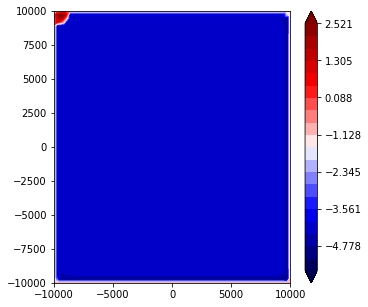

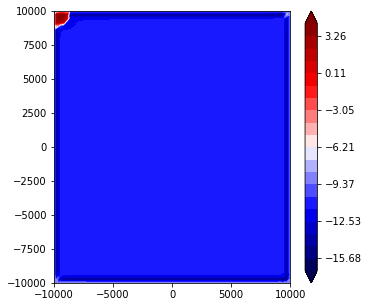

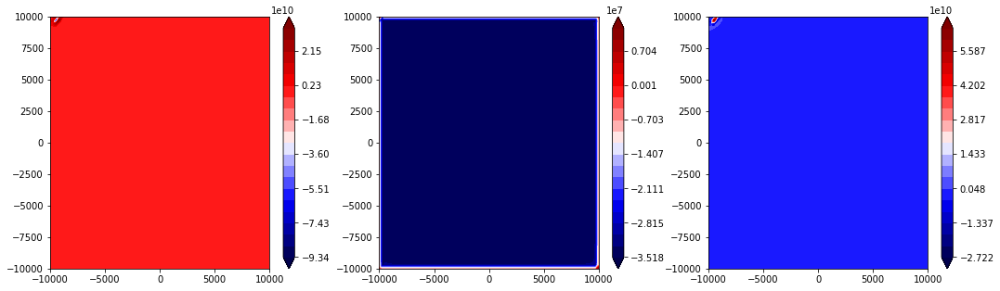

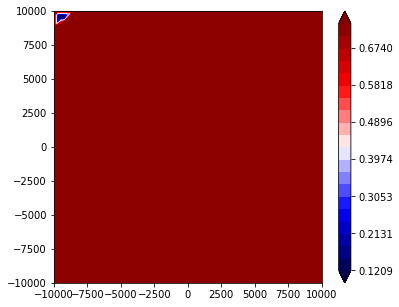

2801 2.61609239709
2802 2.61609239709
2803 2.61609239709
2804 2.61609239709
2805 2.61609239709
2806 2.61609239709
2807 2.61609239709
2808 2.61609239709
2809 2.61609239709
2810 2.6160923971
2811 2.6160923971
2812 2.6160923971
2813 2.6160923971
2814 2.6160923971
2815 2.6160923971
2816 2.6160923971
2817 2.6160923971
2818 2.6160923971
2819 2.6160923971
2820 2.6160923971
2821 2.6160923971
2822 2.6160923971
2823 2.6160923971
2824 2.6160923971
2825 2.6160923971
2826 2.6160923971
2827 2.6160923971
2828 2.6160923971
2829 2.6160923971
2830 2.6160923971
2831 2.6160923971
2832 2.6160923971
2833 2.6160923971
2834 2.6160923971
2835 2.61609239711
2836 2.61609239711
2837 2.61609239711
2838 2.61609239711
2839 2.61609239711
2840 2.61609239711
2841 2.61609239711
2842 2.61609239711
2843 2.61609239711
2844 2.61609239711
2845 2.61609239711
2846 2.61609239711
2847 2.61609239711
2848 2.61609239711
2849 2.61609239711
2850 2.61609239711
2851 2.61609239711
2852 2.61609239711
2853 2.61609239711
2854 2.61609239711

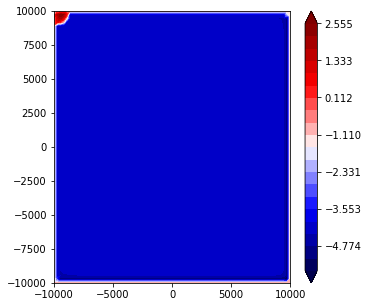

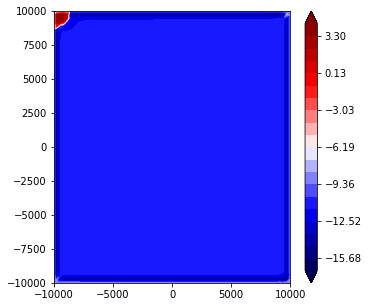

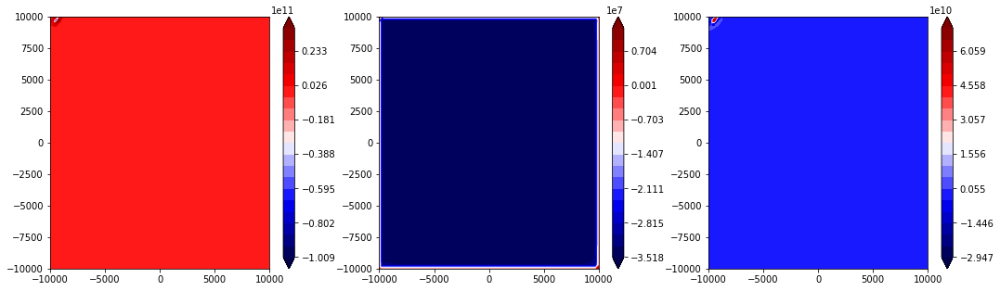

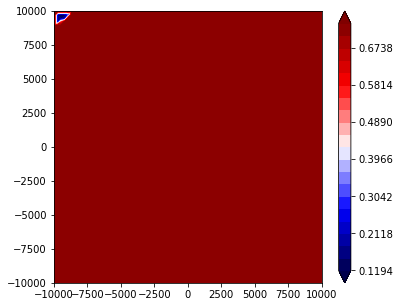

2901 2.61609239713
2902 2.61609239713
2903 2.61609239713
2904 2.61609239713
2905 2.61609239713
2906 2.61609239713
2907 2.61609239713
2908 2.61609239713
2909 2.61609239713
2910 2.61609239713
2911 2.61609239713
2912 2.61609239713
2913 2.61609239713
2914 2.61609239714
2915 2.61609239714
2916 2.61609239714
2917 2.61609239714
2918 2.61609239714
2919 2.61609239714
2920 2.61609239714
2921 2.61609239714
2922 2.61609239714
2923 2.61609239714
2924 2.61609239714
2925 2.61609239714
2926 2.61609239714
2927 2.61609239714
2928 2.61609239714
2929 2.61609239714
2930 2.61609239714
2931 2.61609239714
2932 2.61609239714
2933 2.61609239714
2934 2.61609239714
2935 2.61609239714
2936 2.61609239714
2937 2.61609239714
2938 2.61609239714
2939 2.61609239714
2940 2.61609239714
2941 2.61609239715
2942 2.61609239715
2943 2.61609239715
2944 2.61609239715
2945 2.61609239715
2946 2.61609239715
2947 2.61609239715
2948 2.61609239715
2949 2.61609239715
2950 2.61609239715
2951 2.61609239715
2952 2.61609239715
2953 2.61609

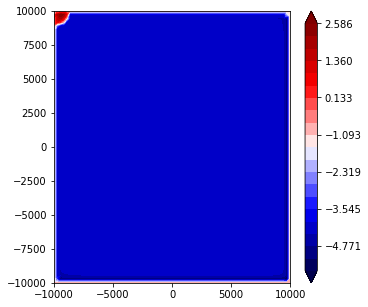

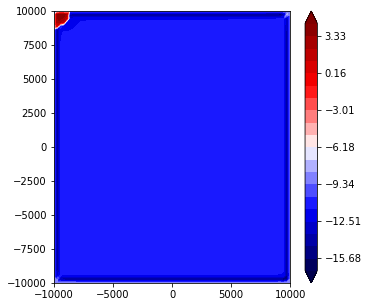

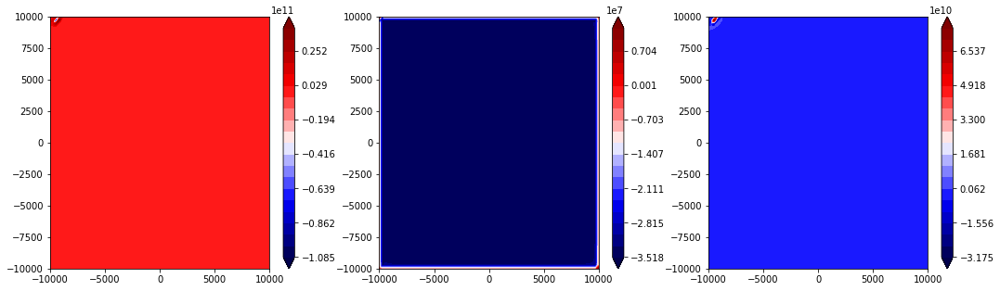

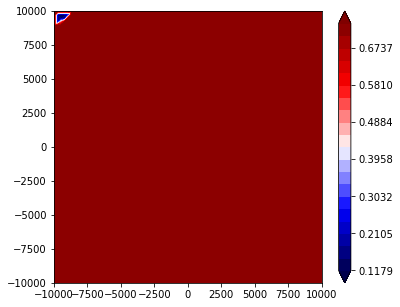

3001 2.61609239717
3002 2.61609239717
3003 2.61609239717
3004 2.61609239717
3005 2.61609239717
3006 2.61609239717
3007 2.61609239717
3008 2.61609239717
3009 2.61609239717
3010 2.61609239717
3011 2.61609239717
3012 2.61609239717
3013 2.61609239717
3014 2.61609239717
3015 2.61609239717
3016 2.61609239717
3017 2.61609239717
3018 2.61609239717
3019 2.61609239717
3020 2.61609239717
3021 2.61609239717
3022 2.61609239717
3023 2.61609239717
3024 2.61609239717
3025 2.61609239717
3026 2.61609239718
3027 2.61609239718
3028 2.61609239718
3029 2.61609239718
3030 2.61609239718
3031 2.61609239718
3032 2.61609239718
3033 2.61609239718
3034 2.61609239718
3035 2.61609239718
3036 2.61609239718
3037 2.61609239718
3038 2.61609239718
3039 2.61609239718
3040 2.61609239718
3041 2.61609239718
3042 2.61609239718
3043 2.61609239718
3044 2.61609239718
3045 2.61609239718
3046 2.61609239718
3047 2.61609239718
3048 2.61609239718
3049 2.61609239718
3050 2.61609239718
3051 2.61609239718
3052 2.61609239718
3053 2.61609

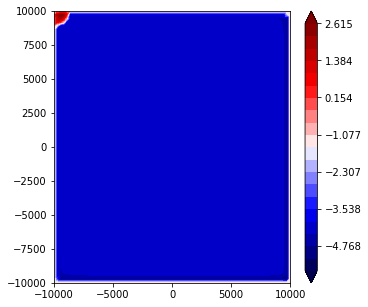

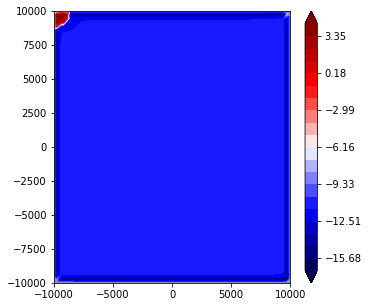

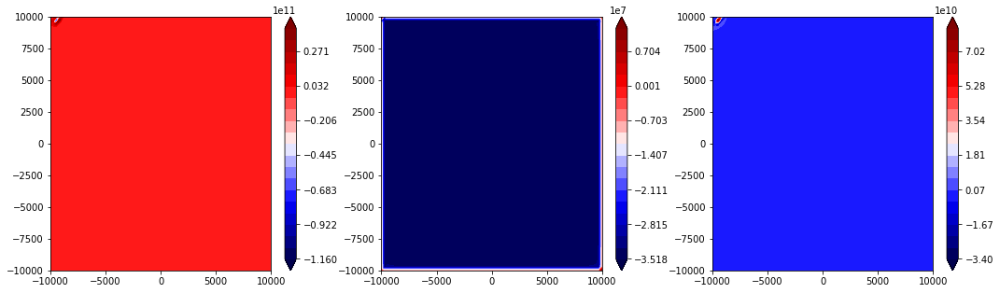

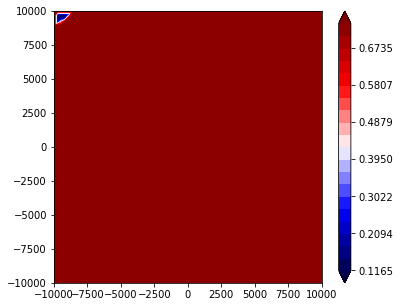

3101 2.6160923972
3102 2.6160923972
3103 2.6160923972
3104 2.6160923972
3105 2.6160923972
3106 2.6160923972
3107 2.6160923972
3108 2.6160923972
3109 2.6160923972
3110 2.6160923972
3111 2.6160923972
3112 2.6160923972
3113 2.6160923972
3114 2.6160923972
3115 2.6160923972
3116 2.61609239721
3117 2.61609239721
3118 2.61609239721
3119 2.61609239721
3120 2.61609239721
3121 2.61609239721
3122 2.61609239721
3123 2.61609239721
3124 2.61609239721
3125 2.61609239721
3126 2.61609239721
3127 2.61609239721
3128 2.61609239721
3129 2.61609239721
3130 2.61609239721
3131 2.61609239721
3132 2.61609239721
3133 2.61609239721
3134 2.61609239721
3135 2.61609239721
3136 2.61609239721
3137 2.61609239721
3138 2.61609239721
3139 2.61609239721
3140 2.61609239721
3141 2.61609239721
3142 2.61609239721
3143 2.61609239721
3144 2.61609239721
3145 2.61609239721
3146 2.61609239721
3147 2.61609239721
3148 2.61609239722
3149 2.61609239722
3150 2.61609239722
3151 2.61609239722
3152 2.61609239722
3153 2.61609239722
3154 2.6

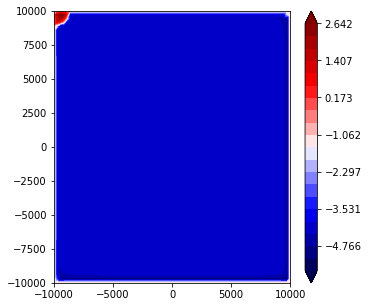

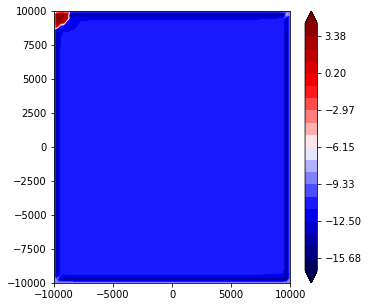

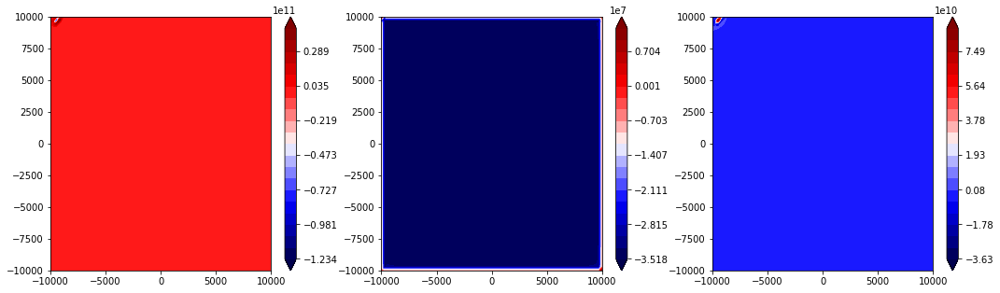

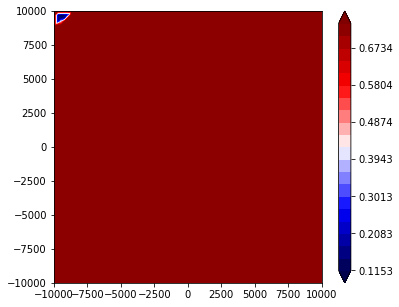

3201 2.61609239723
3202 2.61609239723
3203 2.61609239723
3204 2.61609239723
3205 2.61609239723
3206 2.61609239723
3207 2.61609239723
3208 2.61609239723
3209 2.61609239723
3210 2.61609239723
3211 2.61609239723
3212 2.61609239724
3213 2.61609239724
3214 2.61609239724
3215 2.61609239724
3216 2.61609239724
3217 2.61609239724
3218 2.61609239724
3219 2.61609239724
3220 2.61609239724
3221 2.61609239724
3222 2.61609239724
3223 2.61609239724
3224 2.61609239724
3225 2.61609239724
3226 2.61609239724
3227 2.61609239724
3228 2.61609239724
3229 2.61609239724
3230 2.61609239724
3231 2.61609239724
3232 2.61609239724
3233 2.61609239724
3234 2.61609239724
3235 2.61609239724
3236 2.61609239724
3237 2.61609239724
3238 2.61609239724
3239 2.61609239724
3240 2.61609239724
3241 2.61609239724
3242 2.61609239724
3243 2.61609239724
3244 2.61609239724
3245 2.61609239725
3246 2.61609239725
3247 2.61609239725
3248 2.61609239725
3249 2.61609239725
3250 2.61609239725
3251 2.61609239725
3252 2.61609239725
3253 2.61609

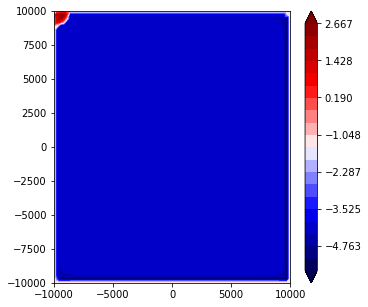

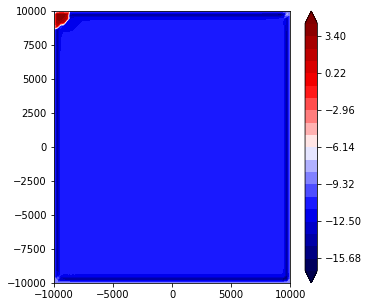

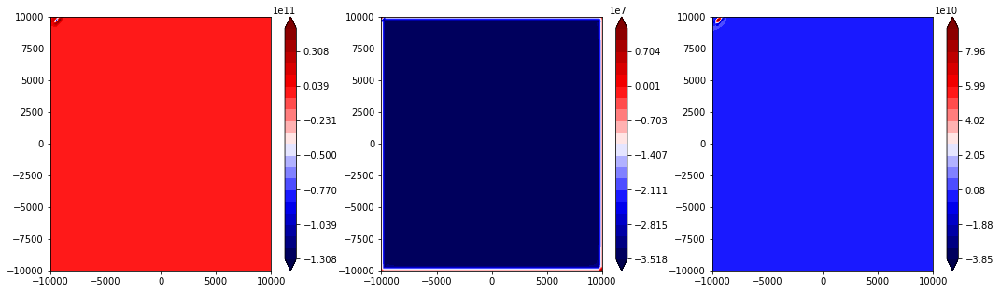

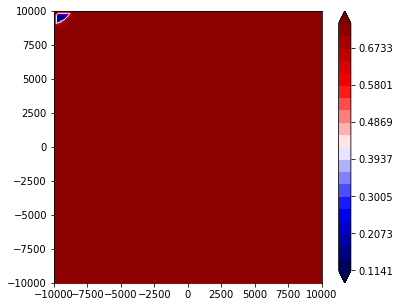

3301 2.61609239726
3302 2.61609239726
3303 2.61609239726
3304 2.61609239726
3305 2.61609239726
3306 2.61609239726
3307 2.61609239726
3308 2.61609239726
3309 2.61609239726
3310 2.61609239726
3311 2.61609239726
3312 2.61609239726
3313 2.61609239726
3314 2.61609239726
3315 2.61609239726
3316 2.61609239727
3317 2.61609239727
3318 2.61609239727
3319 2.61609239727
3320 2.61609239727
3321 2.61609239727
3322 2.61609239727
3323 2.61609239727
3324 2.61609239727
3325 2.61609239727
3326 2.61609239727
3327 2.61609239727
3328 2.61609239727
3329 2.61609239727
3330 2.61609239727
3331 2.61609239727
3332 2.61609239727
3333 2.61609239727
3334 2.61609239727
3335 2.61609239727
3336 2.61609239727
3337 2.61609239727
3338 2.61609239727
3339 2.61609239727
3340 2.61609239727
3341 2.61609239727
3342 2.61609239727
3343 2.61609239727
3344 2.61609239727
3345 2.61609239727
3346 2.61609239727
3347 2.61609239727
3348 2.61609239727
3349 2.61609239727
3350 2.61609239727
3351 2.61609239727
3352 2.61609239727
3353 2.61609

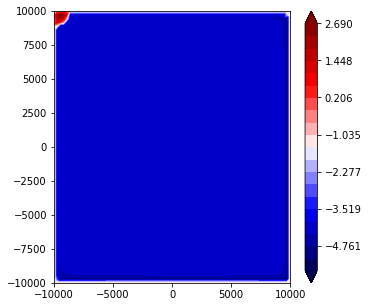

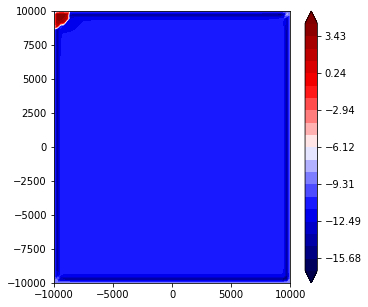

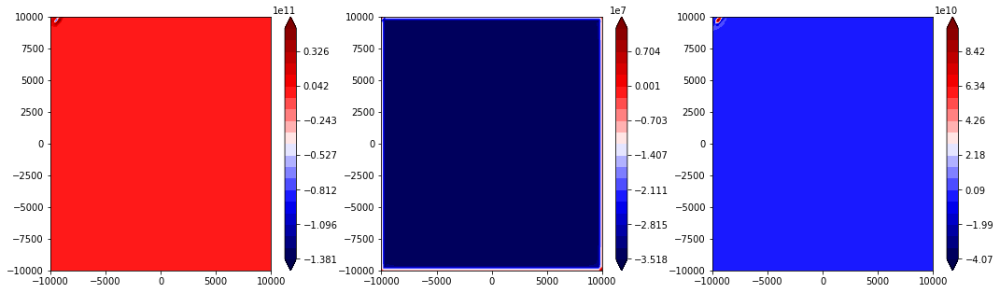

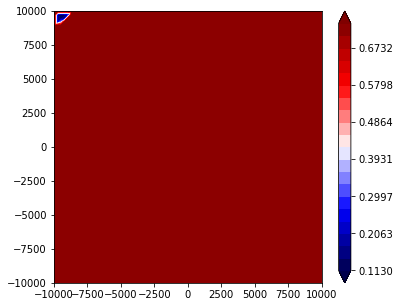

3401 2.61609239729
3402 2.61609239729
3403 2.61609239729
3404 2.61609239729
3405 2.61609239729
3406 2.61609239729
3407 2.61609239729
3408 2.61609239729
3409 2.61609239729
3410 2.61609239729
3411 2.61609239729
3412 2.61609239729
3413 2.61609239729
3414 2.61609239729
3415 2.61609239729
3416 2.61609239729
3417 2.61609239729
3418 2.61609239729
3419 2.61609239729
3420 2.61609239729
3421 2.61609239729
3422 2.61609239729
3423 2.61609239729
3424 2.61609239729
3425 2.61609239729
3426 2.61609239729
3427 2.61609239729
3428 2.6160923973
3429 2.6160923973
3430 2.6160923973
3431 2.6160923973
3432 2.6160923973
3433 2.6160923973
3434 2.6160923973
3435 2.6160923973
3436 2.6160923973
3437 2.6160923973
3438 2.6160923973
3439 2.6160923973
3440 2.6160923973
3441 2.6160923973
3442 2.6160923973
3443 2.6160923973
3444 2.6160923973
3445 2.6160923973
3446 2.6160923973
3447 2.6160923973
3448 2.6160923973
3449 2.6160923973
3450 2.6160923973
3451 2.6160923973
3452 2.6160923973
3453 2.6160923973
3454 2.6160923973
3

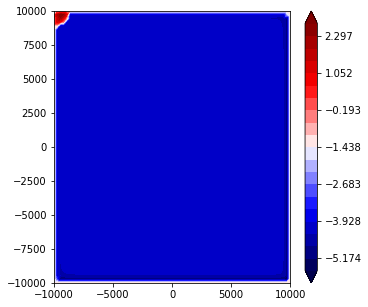

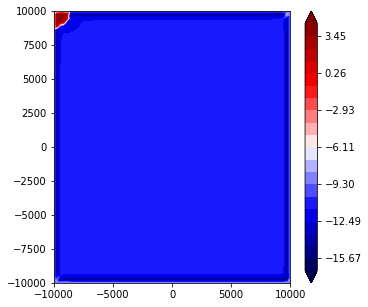

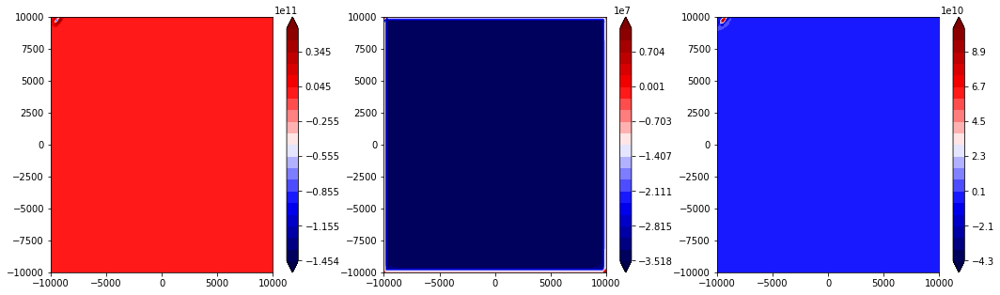

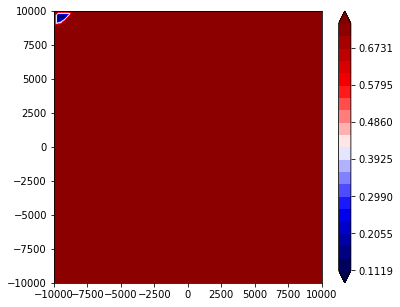

3501 2.61609239731
3502 2.61609239731
3503 2.61609239731
3504 2.61609239731
3505 2.61609239732
3506 2.61609239732
3507 2.61609239732
3508 2.61609239732
3509 2.61609239732
3510 2.61609239732
3511 2.61609239732
3512 2.61609239732
3513 2.61609239732
3514 2.61609239732
3515 2.61609239732
3516 2.61609239732
3517 2.61609239732
3518 2.61609239732
3519 2.61609239732
3520 2.61609239732
3521 2.61609239732
3522 2.61609239732
3523 2.61609239732
3524 2.61609239732
3525 2.61609239732
3526 2.61609239732
3527 2.61609239732
3528 2.61609239732
3529 2.61609239732
3530 2.61609239732
3531 2.61609239732
3532 2.61609239732
3533 2.61609239732
3534 2.61609239732
3535 2.61609239732
3536 2.61609239732
3537 2.61609239732
3538 2.61609239732
3539 2.61609239732
3540 2.61609239732
3541 2.61609239732
3542 2.61609239732
3543 2.61609239733
3544 2.61609239733
3545 2.61609239733
3546 2.61609239733
3547 2.61609239733
3548 2.61609239733
3549 2.61609239733
3550 2.61609239733
3551 2.61609239733
3552 2.61609239733
3553 2.61609

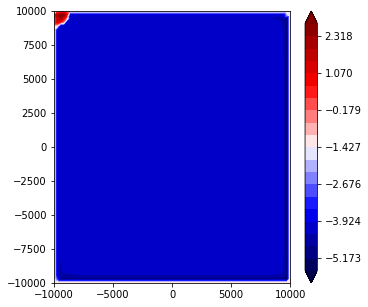

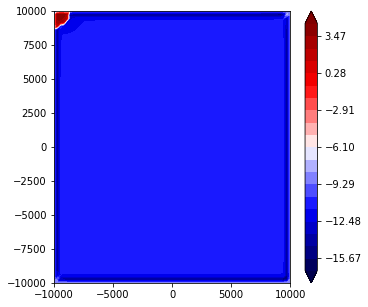

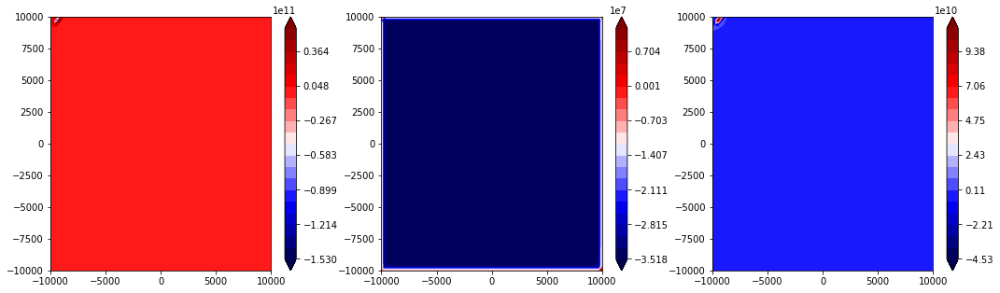

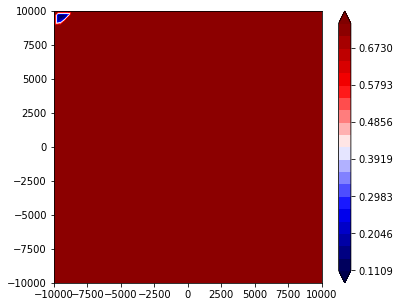

3601 2.61609239734
3602 2.61609239734
3603 2.61609239734
3604 2.61609239734
3605 2.61609239734
3606 2.61609239734
3607 2.61609239734
3608 2.61609239734
3609 2.61609239734
3610 2.61609239734
3611 2.61609239734
3612 2.61609239734
3613 2.61609239734
3614 2.61609239734
3615 2.61609239734
3616 2.61609239734
3617 2.61609239734
3618 2.61609239734
3619 2.61609239734
3620 2.61609239734
3621 2.61609239734
3622 2.61609239734
3623 2.61609239734
3624 2.61609239735
3625 2.61609239735
3626 2.61609239735
3627 2.61609239735
3628 2.61609239735
3629 2.61609239735
3630 2.61609239735
3631 2.61609239735
3632 2.61609239735
3633 2.61609239735
3634 2.61609239735
3635 2.61609239735
3636 2.61609239735
3637 2.61609239735
3638 2.61609239735
3639 2.61609239735
3640 2.61609239735
3641 2.61609239735
3642 2.61609239735
3643 2.61609239735
3644 2.61609239735
3645 2.61609239735
3646 2.61609239735
3647 2.61609239735
3648 2.61609239735
3649 2.61609239735
3650 2.61609239735
3651 2.61609239735
3652 2.61609239735
3653 2.61609

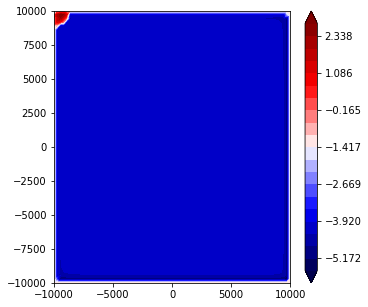

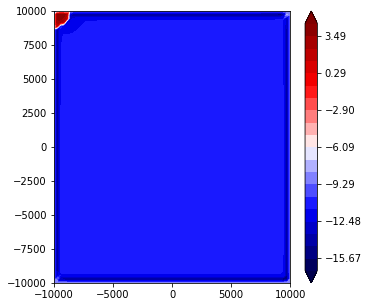

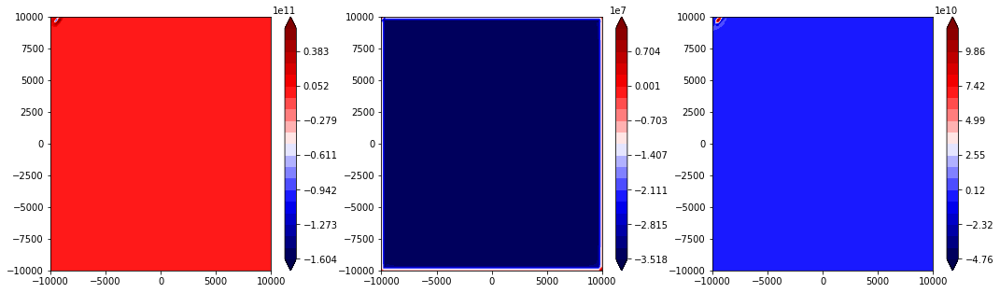

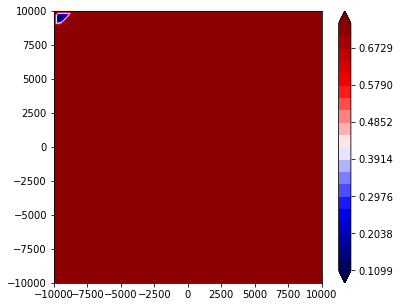

3701 2.61609239736
3702 2.61609239736
3703 2.61609239736
3704 2.61609239736
3705 2.61609239736
3706 2.61609239736
3707 2.61609239736
3708 2.61609239736
3709 2.61609239736
3710 2.61609239737
3711 2.61609239737
3712 2.61609239737
3713 2.61609239737
3714 2.61609239737
3715 2.61609239737
3716 2.61609239737
3717 2.61609239737
3718 2.61609239737
3719 2.61609239737
3720 2.61609239737
3721 2.61609239737
3722 2.61609239737
3723 2.61609239737
3724 2.61609239737
3725 2.61609239737
3726 2.61609239737
3727 2.61609239737
3728 2.61609239737
3729 2.61609239737
3730 2.61609239737
3731 2.61609239737
3732 2.61609239737
3733 2.61609239737
3734 2.61609239737
3735 2.61609239737
3736 2.61609239737
3737 2.61609239737
3738 2.61609239737
3739 2.61609239737
3740 2.61609239737
3741 2.61609239737
3742 2.61609239737
3743 2.61609239737
3744 2.61609239737
3745 2.61609239737
3746 2.61609239737
3747 2.61609239737
3748 2.61609239737
3749 2.61609239737
3750 2.61609239737
3751 2.61609239737
3752 2.61609239737
3753 2.61609

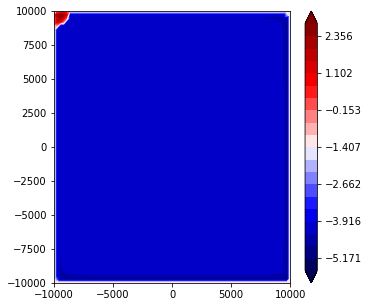

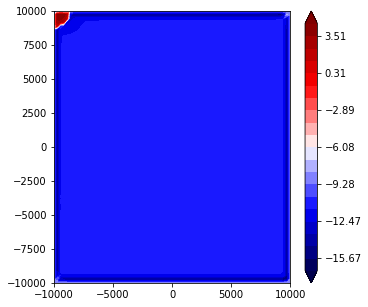

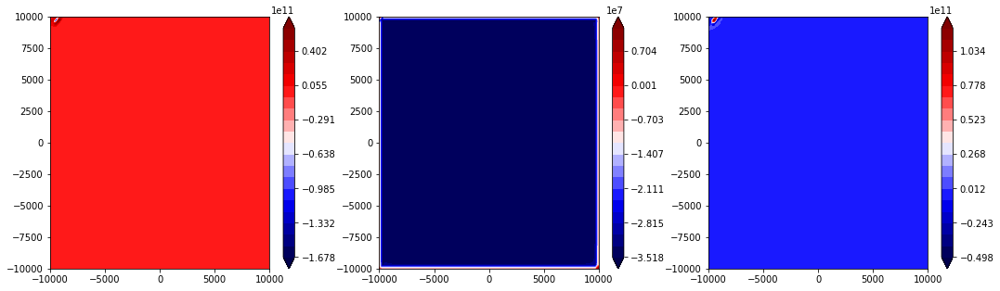

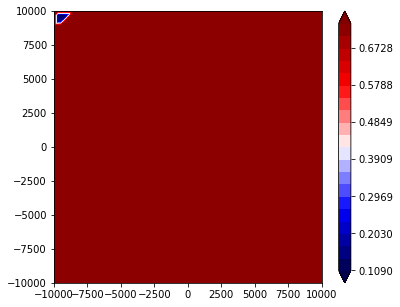

3801 2.61609239739
3802 2.61609239739
3803 2.61609239739
3804 2.61609239739
3805 2.61609239739
3806 2.61609239739
3807 2.61609239739
3808 2.61609239739
3809 2.61609239739
3810 2.61609239739
3811 2.61609239739
3812 2.61609239739
3813 2.61609239739
3814 2.61609239739
3815 2.61609239739
3816 2.61609239739
3817 2.61609239739
3818 2.61609239739
3819 2.61609239739
3820 2.61609239739
3821 2.61609239739
3822 2.61609239739
3823 2.61609239739
3824 2.61609239739
3825 2.61609239739
3826 2.61609239739
3827 2.61609239739
3828 2.61609239739
3829 2.61609239739
3830 2.61609239739
3831 2.61609239739
3832 2.61609239739
3833 2.61609239739
3834 2.61609239739
3835 2.61609239739
3836 2.61609239739
3837 2.61609239739
3838 2.61609239739
3839 2.61609239739
3840 2.61609239739
3841 2.61609239739
3842 2.6160923974
3843 2.6160923974
3844 2.6160923974
3845 2.6160923974
3846 2.6160923974
3847 2.6160923974
3848 2.6160923974
3849 2.6160923974
3850 2.6160923974
3851 2.6160923974
3852 2.6160923974
3853 2.6160923974
3854 

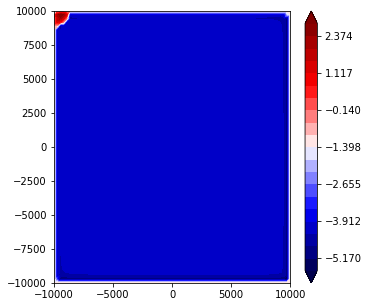

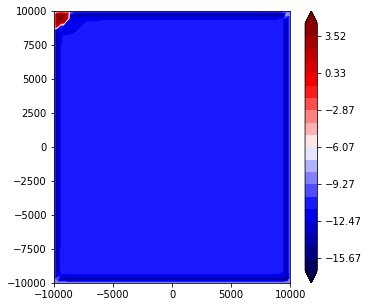

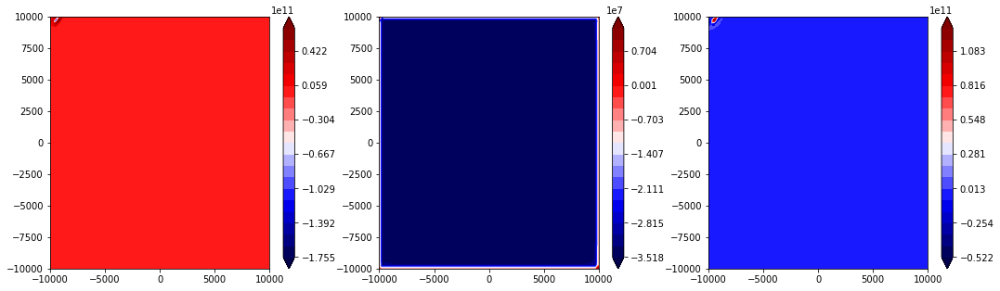

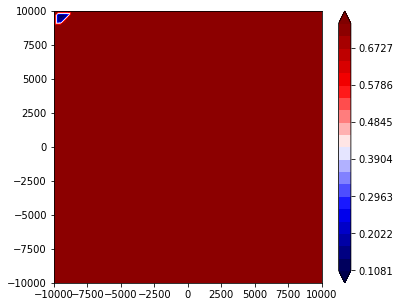

3901 2.61609239741
3902 2.61609239741
3903 2.61609239741
3904 2.61609239741
3905 2.61609239741
3906 2.61609239741
3907 2.61609239741
3908 2.61609239741
3909 2.61609239741
3910 2.61609239741
3911 2.61609239741
3912 2.61609239741
3913 2.61609239741
3914 2.61609239741
3915 2.61609239741
3916 2.61609239741
3917 2.61609239741
3918 2.61609239741
3919 2.61609239741
3920 2.61609239741
3921 2.61609239741
3922 2.61609239741
3923 2.61609239741
3924 2.61609239741
3925 2.61609239741
3926 2.61609239741
3927 2.61609239741
3928 2.61609239741
3929 2.61609239741
3930 2.61609239741
3931 2.61609239741
3932 2.61609239742
3933 2.61609239742
3934 2.61609239742
3935 2.61609239742
3936 2.61609239742
3937 2.61609239742
3938 2.61609239742
3939 2.61609239742
3940 2.61609239742
3941 2.61609239742
3942 2.61609239742
3943 2.61609239742
3944 2.61609239742
3945 2.61609239742
3946 2.61609239742
3947 2.61609239742
3948 2.61609239742
3949 2.61609239742
3950 2.61609239742
3951 2.61609239742
3952 2.61609239742
3953 2.61609

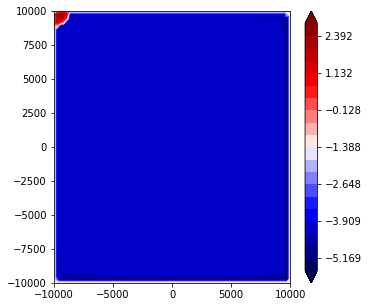

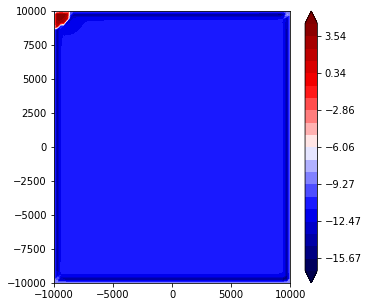

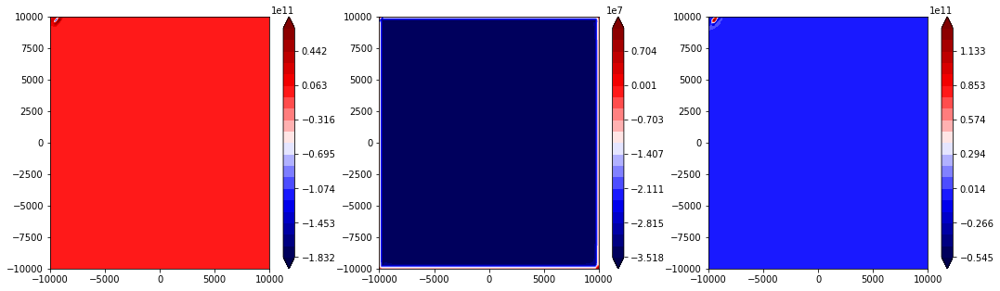

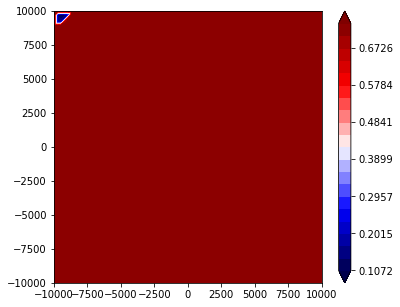

4001 2.61609239743
4002 2.61609239743
4003 2.61609239743
4004 2.61609239743
4005 2.61609239743
4006 2.61609239743
4007 2.61609239743
4008 2.61609239743
4009 2.61609239743
4010 2.61609239743
4011 2.61609239743
4012 2.61609239743
4013 2.61609239743
4014 2.61609239743
4015 2.61609239743
4016 2.61609239743
4017 2.61609239743
4018 2.61609239743
4019 2.61609239743
4020 2.61609239743
4021 2.61609239743
4022 2.61609239743
4023 2.61609239743
4024 2.61609239743
4025 2.61609239743
4026 2.61609239743
4027 2.61609239744
4028 2.61609239744
4029 2.61609239744
4030 2.61609239744
4031 2.61609239744
4032 2.61609239744
4033 2.61609239744
4034 2.61609239744
4035 2.61609239744
4036 2.61609239744
4037 2.61609239744
4038 2.61609239744
4039 2.61609239744
4040 2.61609239744
4041 2.61609239744
4042 2.61609239744
4043 2.61609239744
4044 2.61609239744
4045 2.61609239744
4046 2.61609239744
4047 2.61609239744
4048 2.61609239744
4049 2.61609239744
4050 2.61609239744
4051 2.61609239744
4052 2.61609239744
4053 2.61609

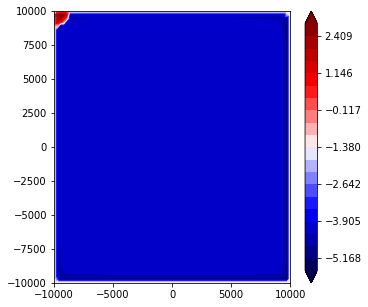

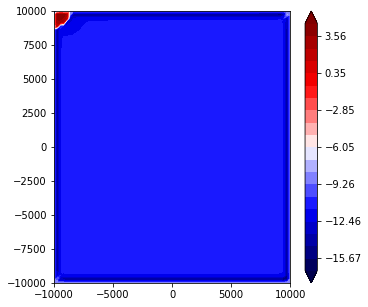

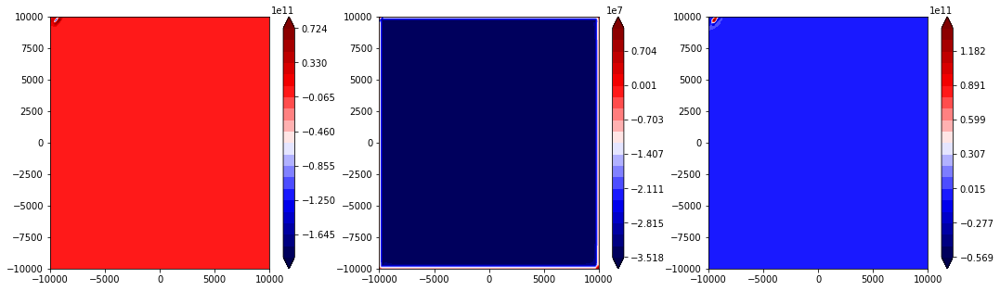

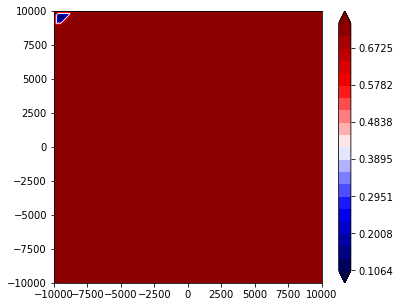

4101 2.61609239745
4102 2.61609239745
4103 2.61609239745
4104 2.61609239745
4105 2.61609239745
4106 2.61609239745
4107 2.61609239745
4108 2.61609239745
4109 2.61609239745
4110 2.61609239745
4111 2.61609239745
4112 2.61609239745
4113 2.61609239745
4114 2.61609239745
4115 2.61609239745
4116 2.61609239745
4117 2.61609239745
4118 2.61609239745
4119 2.61609239745
4120 2.61609239745
4121 2.61609239745
4122 2.61609239745
4123 2.61609239745
4124 2.61609239745
4125 2.61609239746
4126 2.61609239746
4127 2.61609239746
4128 2.61609239746
4129 2.61609239746
4130 2.61609239746
4131 2.61609239746
4132 2.61609239746
4133 2.61609239746
4134 2.61609239746
4135 2.61609239746
4136 2.61609239746
4137 2.61609239746
4138 2.61609239746
4139 2.61609239746
4140 2.61609239746
4141 2.61609239746
4142 2.61609239746
4143 2.61609239746
4144 2.61609239746
4145 2.61609239746
4146 2.61609239746
4147 2.61609239746
4148 2.61609239746
4149 2.61609239746
4150 2.61609239746
4151 2.61609239746
4152 2.61609239746
4153 2.61609

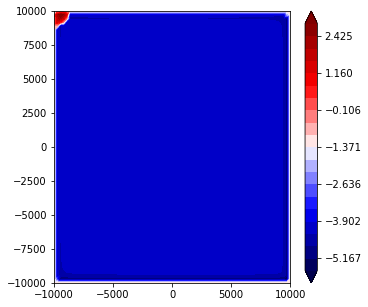

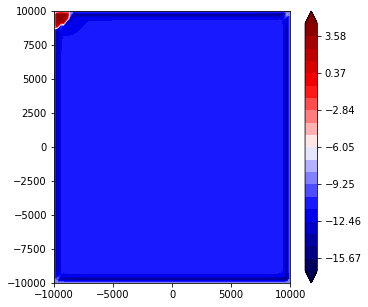

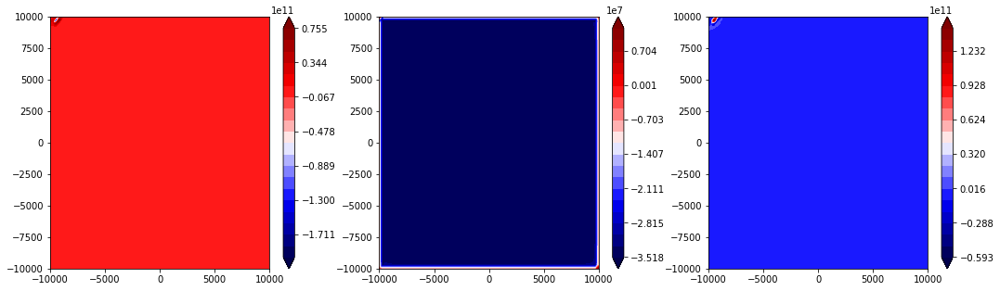

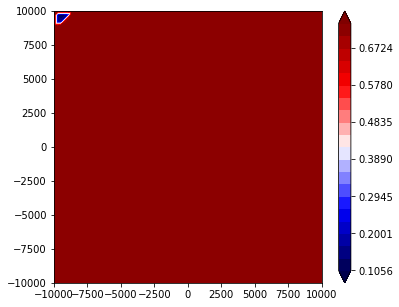

4201 2.61609239747
4202 2.61609239747
4203 2.61609239747
4204 2.61609239747
4205 2.61609239747
4206 2.61609239747
4207 2.61609239747
4208 2.61609239747
4209 2.61609239747
4210 2.61609239747
4211 2.61609239747
4212 2.61609239747
4213 2.61609239747
4214 2.61609239747
4215 2.61609239747
4216 2.61609239747
4217 2.61609239747
4218 2.61609239747
4219 2.61609239747
4220 2.61609239747
4221 2.61609239747
4222 2.61609239747
4223 2.61609239747
4224 2.61609239747
4225 2.61609239747
4226 2.61609239747
4227 2.61609239747
4228 2.61609239748
4229 2.61609239748
4230 2.61609239748
4231 2.61609239748
4232 2.61609239748
4233 2.61609239748
4234 2.61609239748
4235 2.61609239748
4236 2.61609239748
4237 2.61609239748
4238 2.61609239748
4239 2.61609239748
4240 2.61609239748
4241 2.61609239748
4242 2.61609239748
4243 2.61609239748
4244 2.61609239748
4245 2.61609239748
4246 2.61609239748
4247 2.61609239748
4248 2.61609239748
4249 2.61609239748
4250 2.61609239748
4251 2.61609239748
4252 2.61609239748
4253 2.61609

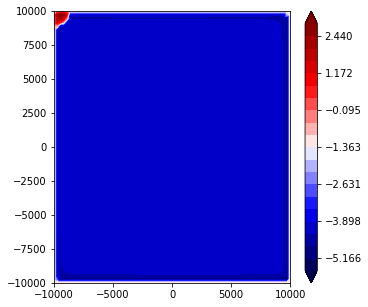

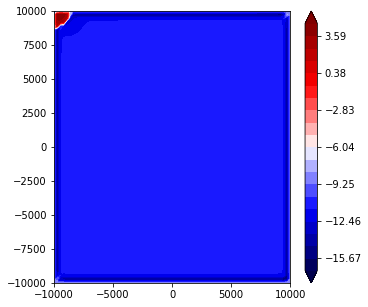

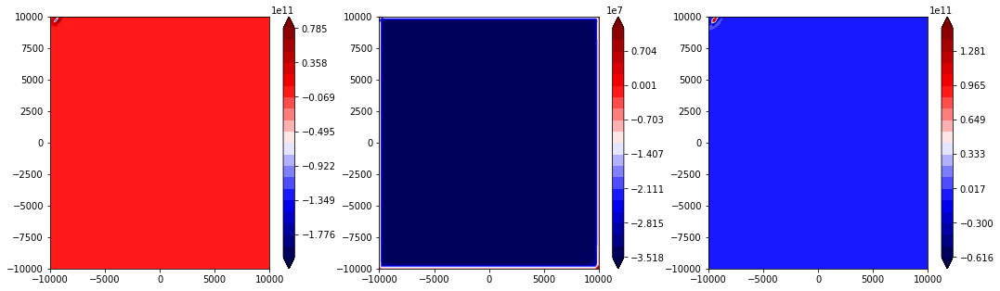

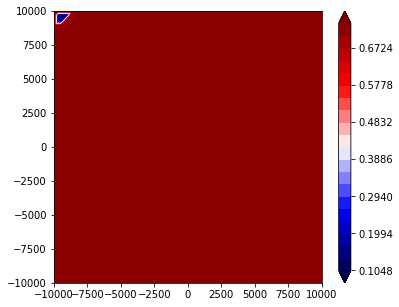

4301 2.61609239749
4302 2.61609239749
4303 2.61609239749
4304 2.61609239749
4305 2.61609239749
4306 2.61609239749
4307 2.61609239749
4308 2.61609239749
4309 2.61609239749
4310 2.61609239749
4311 2.61609239749
4312 2.61609239749
4313 2.61609239749
4314 2.61609239749
4315 2.61609239749
4316 2.61609239749
4317 2.61609239749
4318 2.61609239749
4319 2.61609239749
4320 2.61609239749
4321 2.61609239749
4322 2.61609239749
4323 2.61609239749
4324 2.61609239749
4325 2.61609239749
4326 2.61609239749
4327 2.61609239749
4328 2.61609239749
4329 2.61609239749
4330 2.61609239749
4331 2.61609239749
4332 2.61609239749
4333 2.61609239749
4334 2.61609239749
4335 2.6160923975
4336 2.6160923975
4337 2.6160923975
4338 2.6160923975
4339 2.6160923975
4340 2.6160923975
4341 2.6160923975
4342 2.6160923975
4343 2.6160923975
4344 2.6160923975
4345 2.6160923975
4346 2.6160923975
4347 2.6160923975
4348 2.6160923975
4349 2.6160923975
4350 2.6160923975
4351 2.6160923975
4352 2.6160923975
4353 2.6160923975
4354 2.61609

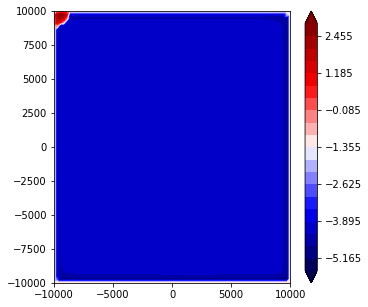

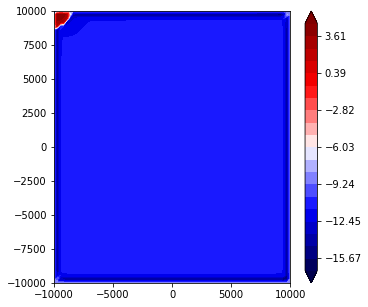

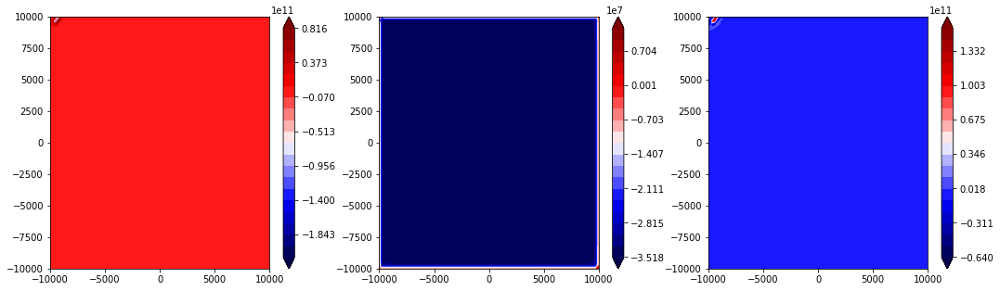

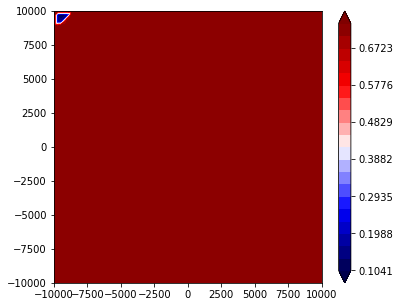

4401 2.61609239751
4402 2.61609239751
4403 2.61609239751
4404 2.61609239751
4405 2.61609239751
4406 2.61609239751
4407 2.61609239751
4408 2.61609239751
4409 2.61609239751
4410 2.61609239751
4411 2.61609239751
4412 2.61609239751
4413 2.61609239751
4414 2.61609239751
4415 2.61609239751
4416 2.61609239751
4417 2.61609239751
4418 2.61609239751
4419 2.61609239751
4420 2.61609239751
4421 2.61609239751
4422 2.61609239751
4423 2.61609239751
4424 2.61609239751
4425 2.61609239751
4426 2.61609239751
4427 2.61609239751
4428 2.61609239751
4429 2.61609239751
4430 2.61609239751
4431 2.61609239751
4432 2.61609239751
4433 2.61609239751
4434 2.61609239751
4435 2.61609239751
4436 2.61609239751
4437 2.61609239751
4438 2.61609239751
4439 2.61609239751
4440 2.61609239751
4441 2.61609239751
4442 2.61609239751
4443 2.61609239751
4444 2.61609239752
4445 2.61609239752
4446 2.61609239752
4447 2.61609239752
4448 2.61609239752
4449 2.61609239752
4450 2.61609239752
4451 2.61609239752
4452 2.61609239752
4453 2.61609

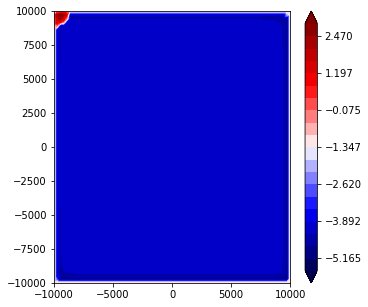

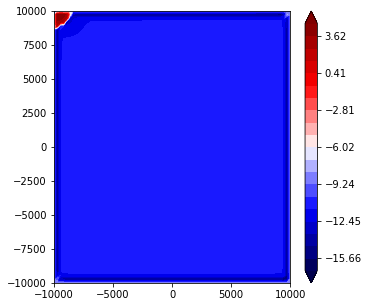

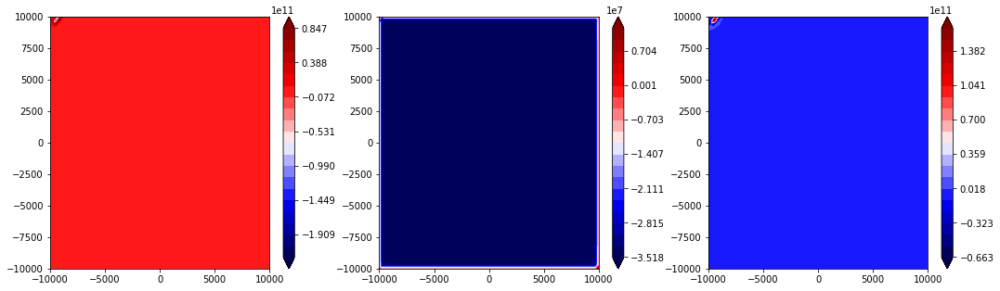

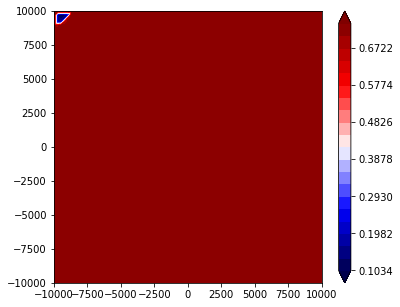

4501 2.61609239753
4502 2.61609239753
4503 2.61609239753
4504 2.61609239753
4505 2.61609239753
4506 2.61609239753
4507 2.61609239753
4508 2.61609239753
4509 2.61609239753
4510 2.61609239753
4511 2.61609239753
4512 2.61609239753
4513 2.61609239753
4514 2.61609239753
4515 2.61609239753
4516 2.61609239753
4517 2.61609239753
4518 2.61609239753
4519 2.61609239753
4520 2.61609239753
4521 2.61609239753
4522 2.61609239753
4523 2.61609239753
4524 2.61609239753
4525 2.61609239753
4526 2.61609239753
4527 2.61609239753
4528 2.61609239753
4529 2.61609239753
4530 2.61609239753
4531 2.61609239753
4532 2.61609239753
4533 2.61609239753
4534 2.61609239753
4535 2.61609239753
4536 2.61609239753
4537 2.61609239753
4538 2.61609239753
4539 2.61609239753
4540 2.61609239753
4541 2.61609239753
4542 2.61609239753
4543 2.61609239753
4544 2.61609239753
4545 2.61609239753
4546 2.61609239753
4547 2.61609239753
4548 2.61609239753
4549 2.61609239753
4550 2.61609239753
4551 2.61609239753
4552 2.61609239753
4553 2.61609

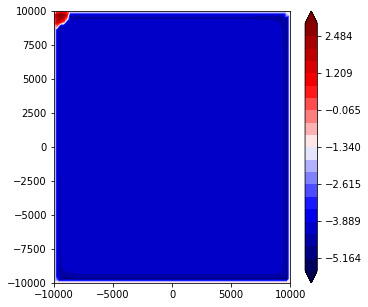

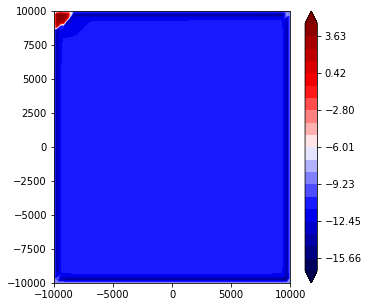

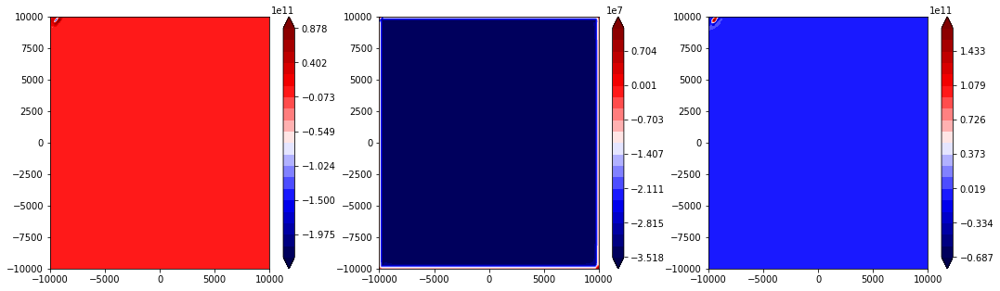

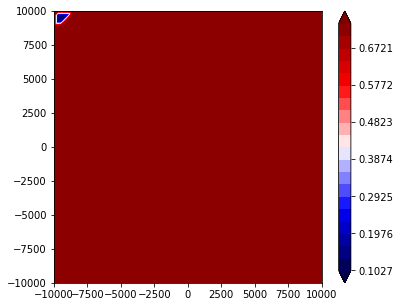

4601 2.61609239754
4602 2.61609239754
4603 2.61609239754
4604 2.61609239754
4605 2.61609239754
4606 2.61609239754
4607 2.61609239754
4608 2.61609239754
4609 2.61609239754
4610 2.61609239754
4611 2.61609239754
4612 2.61609239754
4613 2.61609239754
4614 2.61609239754
4615 2.61609239754
4616 2.61609239754
4617 2.61609239754
4618 2.61609239755
4619 2.61609239755
4620 2.61609239755
4621 2.61609239755
4622 2.61609239755
4623 2.61609239755
4624 2.61609239755
4625 2.61609239755
4626 2.61609239755
4627 2.61609239755
4628 2.61609239755
4629 2.61609239755
4630 2.61609239755
4631 2.61609239755
4632 2.61609239755
4633 2.61609239755
4634 2.61609239755
4635 2.61609239755
4636 2.61609239755
4637 2.61609239755
4638 2.61609239755
4639 2.61609239755
4640 2.61609239755
4641 2.61609239755
4642 2.61609239755
4643 2.61609239755
4644 2.61609239755
4645 2.61609239755
4646 2.61609239755
4647 2.61609239755
4648 2.61609239755
4649 2.61609239755
4650 2.61609239755
4651 2.61609239755
4652 2.61609239755
4653 2.61609

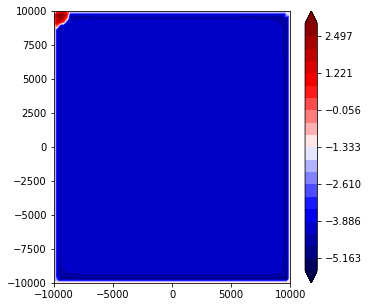

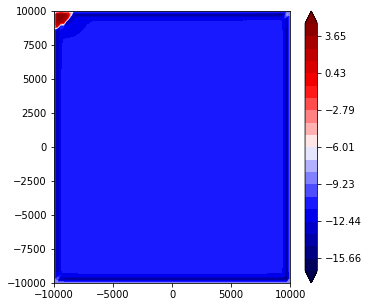

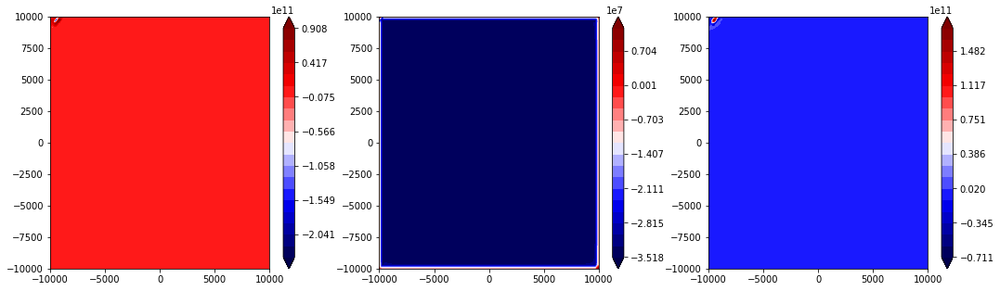

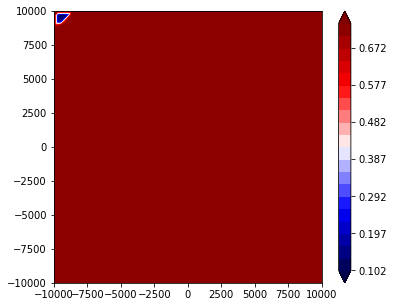

4701 2.61609239756
4702 2.61609239756
4703 2.61609239756
4704 2.61609239756
4705 2.61609239756
4706 2.61609239756
4707 2.61609239756
4708 2.61609239756
4709 2.61609239756
4710 2.61609239756
4711 2.61609239756
4712 2.61609239756
4713 2.61609239756
4714 2.61609239756
4715 2.61609239756
4716 2.61609239756
4717 2.61609239756
4718 2.61609239756
4719 2.61609239756
4720 2.61609239756
4721 2.61609239756
4722 2.61609239756
4723 2.61609239756
4724 2.61609239756
4725 2.61609239756
4726 2.61609239756
4727 2.61609239756
4728 2.61609239756
4729 2.61609239756
4730 2.61609239756
4731 2.61609239756
4732 2.61609239756
4733 2.61609239756
4734 2.61609239756
4735 2.61609239756
4736 2.61609239756
4737 2.61609239756
4738 2.61609239756
4739 2.61609239756
4740 2.61609239756
4741 2.61609239757
4742 2.61609239757
4743 2.61609239757
4744 2.61609239757
4745 2.61609239757
4746 2.61609239757
4747 2.61609239757
4748 2.61609239757
4749 2.61609239757
4750 2.61609239757
4751 2.61609239757
4752 2.61609239757
4753 2.61609

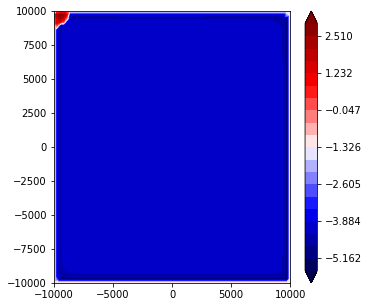

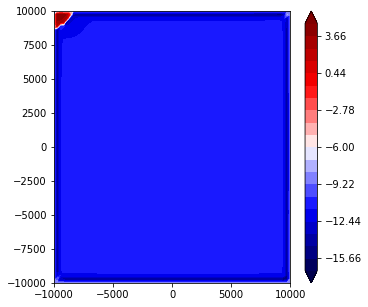

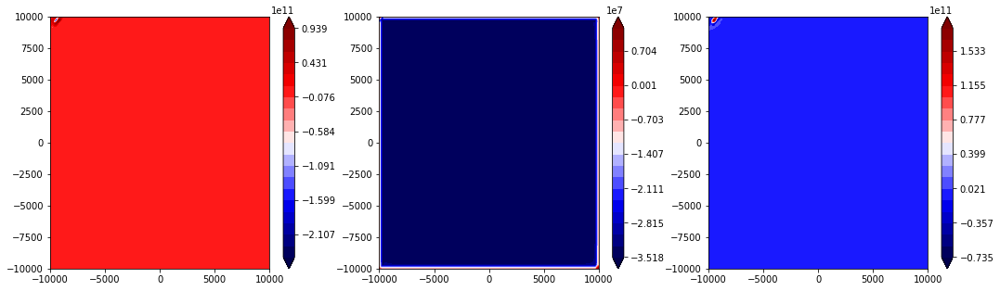

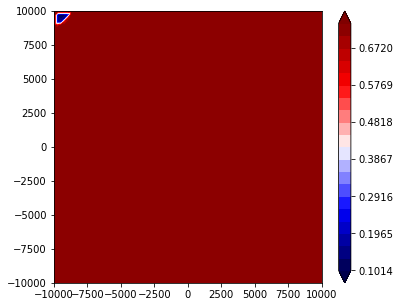

4801 2.61609239757
4802 2.61609239757
4803 2.61609239757
4804 2.61609239758
4805 2.61609239758
4806 2.61609239758
4807 2.61609239758
4808 2.61609239758
4809 2.61609239758
4810 2.61609239758
4811 2.61609239758
4812 2.61609239758
4813 2.61609239758
4814 2.61609239758
4815 2.61609239758
4816 2.61609239758
4817 2.61609239758
4818 2.61609239758
4819 2.61609239758
4820 2.61609239758
4821 2.61609239758
4822 2.61609239758
4823 2.61609239758
4824 2.61609239758
4825 2.61609239758
4826 2.61609239758
4827 2.61609239758
4828 2.61609239758
4829 2.61609239758
4830 2.61609239758
4831 2.61609239758
4832 2.61609239758
4833 2.61609239758
4834 2.61609239758
4835 2.61609239758
4836 2.61609239758
4837 2.61609239758
4838 2.61609239758
4839 2.61609239758
4840 2.61609239758
4841 2.61609239758
4842 2.61609239758
4843 2.61609239758
4844 2.61609239758
4845 2.61609239758
4846 2.61609239758
4847 2.61609239758
4848 2.61609239758
4849 2.61609239758
4850 2.61609239758
4851 2.61609239758
4852 2.61609239758
4853 2.61609

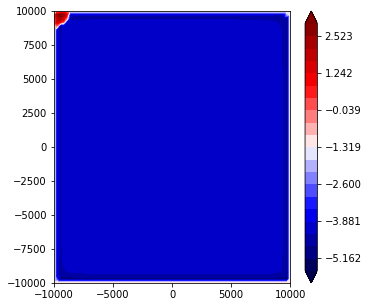

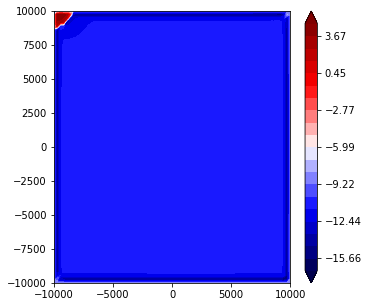

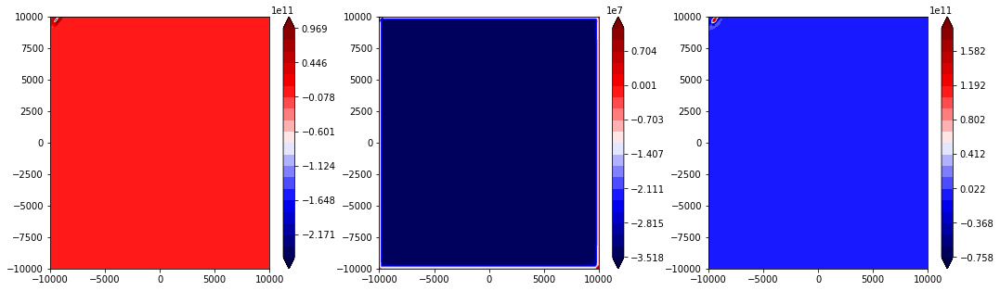

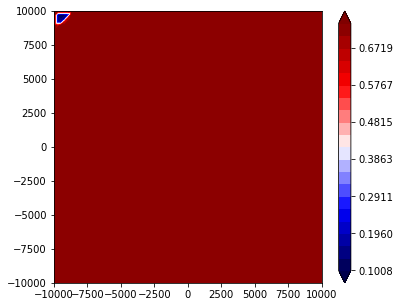

4901 2.61609239759
4902 2.61609239759
4903 2.61609239759
4904 2.61609239759
4905 2.61609239759
4906 2.61609239759
4907 2.61609239759
4908 2.61609239759
4909 2.61609239759
4910 2.61609239759
4911 2.61609239759
4912 2.61609239759
4913 2.61609239759
4914 2.61609239759
4915 2.61609239759
4916 2.61609239759
4917 2.61609239759
4918 2.61609239759
4919 2.61609239759
4920 2.61609239759
4921 2.61609239759
4922 2.61609239759
4923 2.61609239759
4924 2.61609239759
4925 2.61609239759
4926 2.61609239759
4927 2.61609239759
4928 2.61609239759
4929 2.61609239759
4930 2.61609239759
4931 2.61609239759
4932 2.61609239759
4933 2.61609239759
4934 2.61609239759
4935 2.6160923976
4936 2.6160923976
4937 2.6160923976
4938 2.6160923976
4939 2.6160923976
4940 2.6160923976
4941 2.6160923976
4942 2.6160923976
4943 2.6160923976
4944 2.6160923976
4945 2.6160923976
4946 2.6160923976
4947 2.6160923976
4948 2.6160923976
4949 2.6160923976
4950 2.6160923976
4951 2.6160923976
4952 2.6160923976
4953 2.6160923976
4954 2.61609

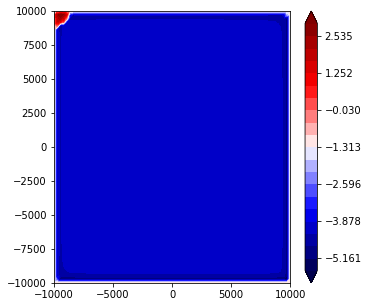

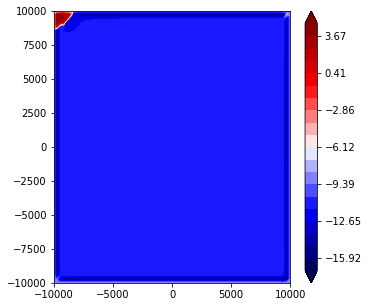

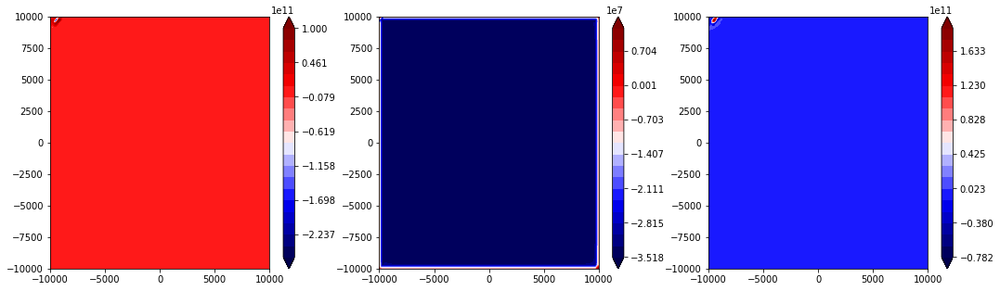

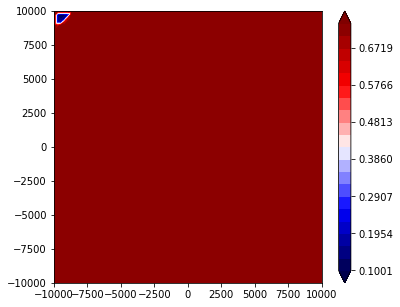

5001 2.6160923976
5002 2.61609239761
5003 2.61609239761
5004 2.61609239761
5005 2.61609239761
5006 2.61609239761
5007 2.61609239761
5008 2.61609239761
5009 2.61609239761
5010 2.61609239761
5011 2.61609239761
5012 2.61609239761
5013 2.61609239761
5014 2.61609239761
5015 2.61609239761
5016 2.61609239761
5017 2.61609239761
5018 2.61609239761
5019 2.61609239761
5020 2.61609239761
5021 2.61609239761
5022 2.61609239761
5023 2.61609239761
5024 2.61609239761
5025 2.61609239761
5026 2.61609239761
5027 2.61609239761
5028 2.61609239761
5029 2.61609239761
5030 2.61609239761
5031 2.61609239761
5032 2.61609239761
5033 2.61609239761
5034 2.61609239761
5035 2.61609239761
5036 2.61609239761
5037 2.61609239761
5038 2.61609239761
5039 2.61609239761
5040 2.61609239761
5041 2.61609239761
5042 2.61609239761
5043 2.61609239761
5044 2.61609239761
5045 2.61609239761
5046 2.61609239761
5047 2.61609239761
5048 2.61609239761
5049 2.61609239761
5050 2.61609239761
5051 2.61609239761
5052 2.61609239761
5053 2.616092

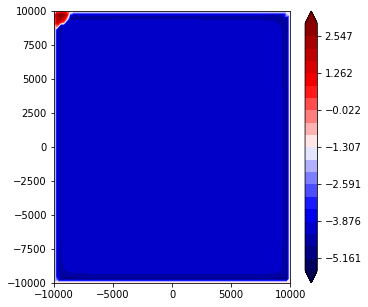

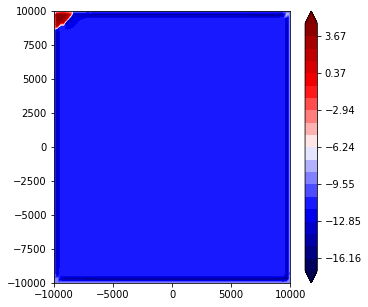

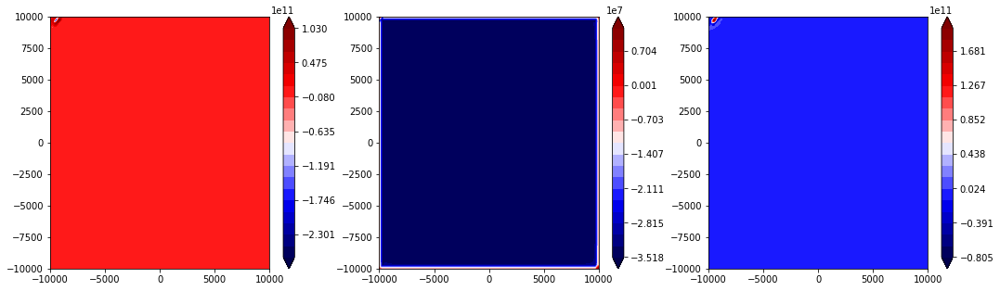

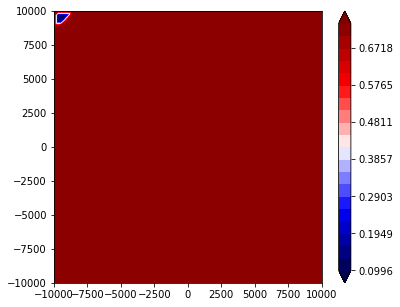

5101 2.61609239762
5102 2.61609239762
5103 2.61609239762
5104 2.61609239762
5105 2.61609239762
5106 2.61609239762
5107 2.61609239762
5108 2.61609239762
5109 2.61609239762
5110 2.61609239762
5111 2.61609239762
5112 2.61609239762
5113 2.61609239762
5114 2.61609239762
5115 2.61609239762
5116 2.61609239762
5117 2.61609239762
5118 2.61609239762
5119 2.61609239762
5120 2.61609239762
5121 2.61609239762
5122 2.61609239762
5123 2.61609239762
5124 2.61609239762
5125 2.61609239762
5126 2.61609239762
5127 2.61609239762
5128 2.61609239762
5129 2.61609239762
5130 2.61609239762
5131 2.61609239762
5132 2.61609239762
5133 2.61609239762
5134 2.61609239762
5135 2.61609239762
5136 2.61609239762
5137 2.61609239762
5138 2.61609239762
5139 2.61609239762
5140 2.61609239762
5141 2.61609239762
5142 2.61609239762
5143 2.61609239762
5144 2.61609239763
5145 2.61609239763
5146 2.61609239763
5147 2.61609239763
5148 2.61609239763
5149 2.61609239763
5150 2.61609239763
5151 2.61609239763
5152 2.61609239763
5153 2.61609

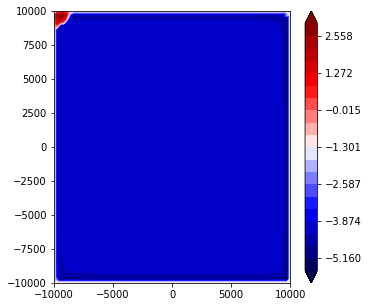

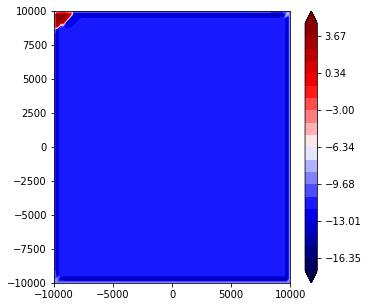

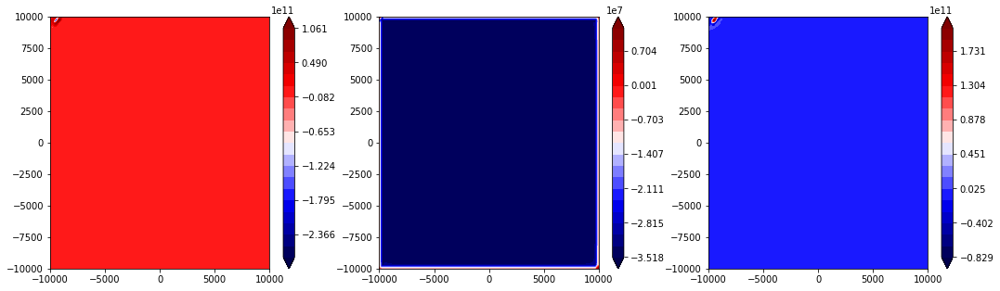

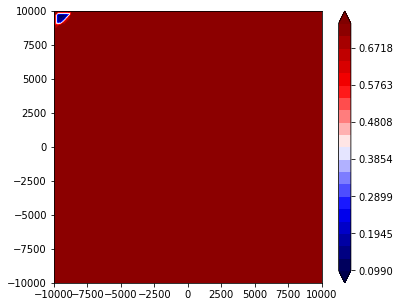

5201 2.61609239763
5202 2.61609239763
5203 2.61609239763
5204 2.61609239763
5205 2.61609239763
5206 2.61609239763
5207 2.61609239763
5208 2.61609239763
5209 2.61609239763
5210 2.61609239763
5211 2.61609239763
5212 2.61609239763
5213 2.61609239763
5214 2.61609239763
5215 2.61609239763
5216 2.61609239763
5217 2.61609239764
5218 2.61609239764
5219 2.61609239764
5220 2.61609239764
5221 2.61609239764
5222 2.61609239764
5223 2.61609239764
5224 2.61609239764
5225 2.61609239764
5226 2.61609239764
5227 2.61609239764
5228 2.61609239764
5229 2.61609239764
5230 2.61609239764
5231 2.61609239764
5232 2.61609239764
5233 2.61609239764
5234 2.61609239764
5235 2.61609239764
5236 2.61609239764
5237 2.61609239764
5238 2.61609239764
5239 2.61609239764
5240 2.61609239764
5241 2.61609239764
5242 2.61609239764
5243 2.61609239764
5244 2.61609239764
5245 2.61609239764
5246 2.61609239764
5247 2.61609239764
5248 2.61609239764
5249 2.61609239764
5250 2.61609239764
5251 2.61609239764
5252 2.61609239764
5253 2.61609

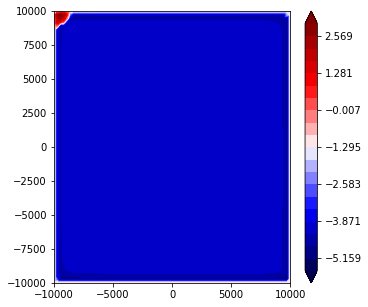

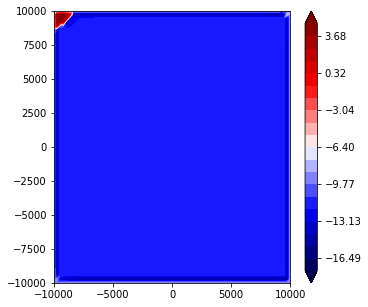

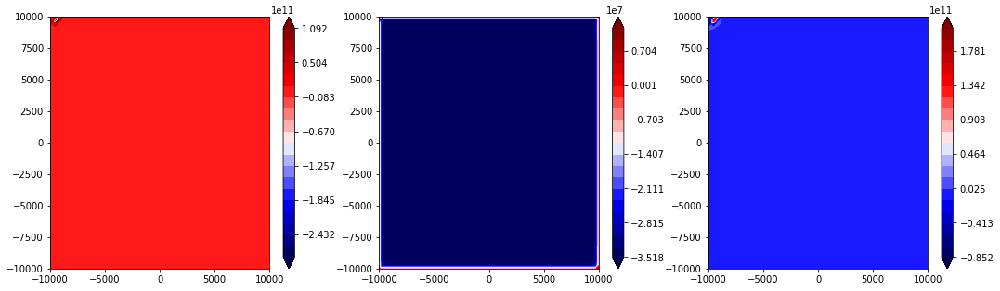

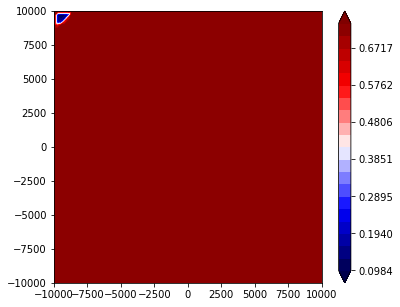

5301 2.61609239765
5302 2.61609239765
5303 2.61609239765
5304 2.61609239765
5305 2.61609239765
5306 2.61609239765
5307 2.61609239765
5308 2.61609239765
5309 2.61609239765
5310 2.61609239765
5311 2.61609239765
5312 2.61609239765
5313 2.61609239765
5314 2.61609239765
5315 2.61609239765
5316 2.61609239765
5317 2.61609239765
5318 2.61609239765
5319 2.61609239765
5320 2.61609239765
5321 2.61609239765
5322 2.61609239765
5323 2.61609239765
5324 2.61609239765
5325 2.61609239765
5326 2.61609239765
5327 2.61609239765
5328 2.61609239765
5329 2.61609239765
5330 2.61609239765
5331 2.61609239765
5332 2.61609239765
5333 2.61609239765
5334 2.61609239765
5335 2.61609239765
5336 2.61609239765
5337 2.61609239765
5338 2.61609239765
5339 2.61609239765
5340 2.61609239765
5341 2.61609239765
5342 2.61609239765
5343 2.61609239765
5344 2.61609239765
5345 2.61609239765
5346 2.61609239765
5347 2.61609239765
5348 2.61609239765
5349 2.61609239765
5350 2.61609239765
5351 2.61609239765
5352 2.61609239765
5353 2.61609

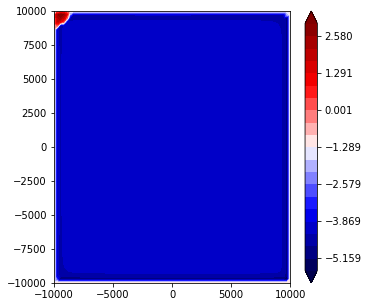

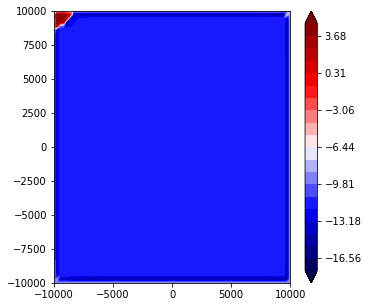

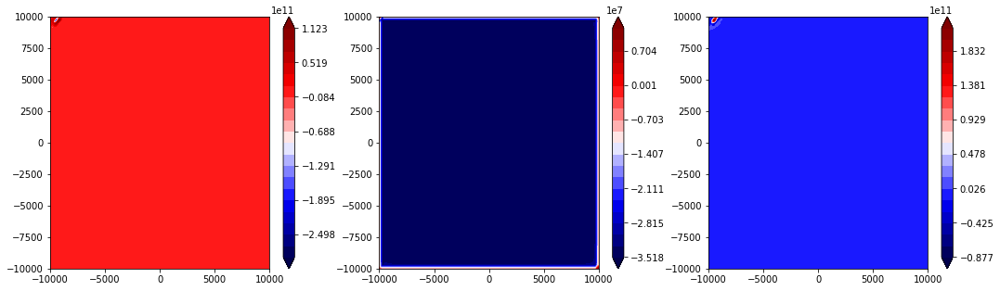

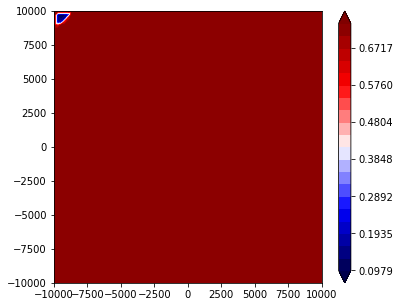

5401 2.61609239766
5402 2.61609239766
5403 2.61609239766
5404 2.61609239766
5405 2.61609239766
5406 2.61609239766
5407 2.61609239766
5408 2.61609239766
5409 2.61609239766
5410 2.61609239766
5411 2.61609239766
5412 2.61609239766
5413 2.61609239766
5414 2.61609239766
5415 2.61609239766
5416 2.61609239766
5417 2.61609239766
5418 2.61609239766
5419 2.61609239766
5420 2.61609239766
5421 2.61609239766
5422 2.61609239766
5423 2.61609239766
5424 2.61609239766
5425 2.61609239766
5426 2.61609239766
5427 2.61609239766
5428 2.61609239766
5429 2.61609239766
5430 2.61609239766
5431 2.61609239766
5432 2.61609239766
5433 2.61609239766
5434 2.61609239766
5435 2.61609239766
5436 2.61609239766
5437 2.61609239767
5438 2.61609239767
5439 2.61609239767
5440 2.61609239767
5441 2.61609239767
5442 2.61609239767
5443 2.61609239767
5444 2.61609239767
5445 2.61609239767
5446 2.61609239767
5447 2.61609239767
5448 2.61609239767
5449 2.61609239767
5450 2.61609239767
5451 2.61609239767
5452 2.61609239767
5453 2.61609

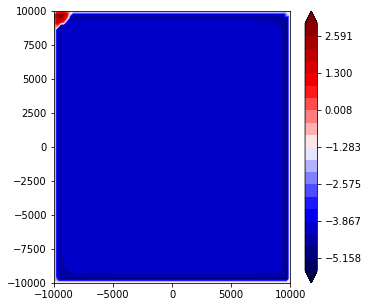

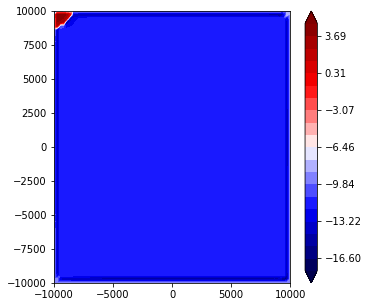

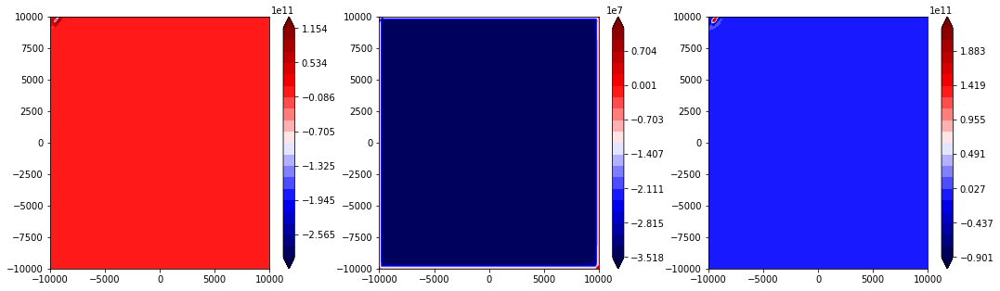

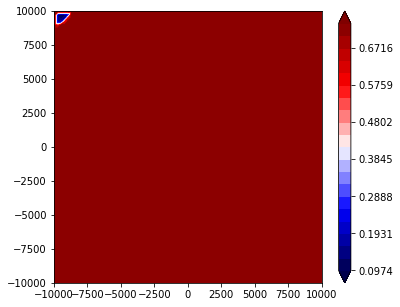

5501 2.61609239767
5502 2.61609239767
5503 2.61609239767
5504 2.61609239767
5505 2.61609239767
5506 2.61609239767
5507 2.61609239767
5508 2.61609239767
5509 2.61609239767
5510 2.61609239767
5511 2.61609239767
5512 2.61609239767
5513 2.61609239767
5514 2.61609239768
5515 2.61609239768
5516 2.61609239768
5517 2.61609239768
5518 2.61609239768
5519 2.61609239768
5520 2.61609239768
5521 2.61609239768
5522 2.61609239768
5523 2.61609239768
5524 2.61609239768
5525 2.61609239768
5526 2.61609239768
5527 2.61609239768
5528 2.61609239768
5529 2.61609239768
5530 2.61609239768
5531 2.61609239768
5532 2.61609239768
5533 2.61609239768
5534 2.61609239768
5535 2.61609239768
5536 2.61609239768
5537 2.61609239768
5538 2.61609239768
5539 2.61609239768
5540 2.61609239768
5541 2.61609239768
5542 2.61609239768
5543 2.61609239768
5544 2.61609239768
5545 2.61609239768
5546 2.61609239768
5547 2.61609239768
5548 2.61609239768
5549 2.61609239768
5550 2.61609239768
5551 2.61609239768
5552 2.61609239768
5553 2.61609

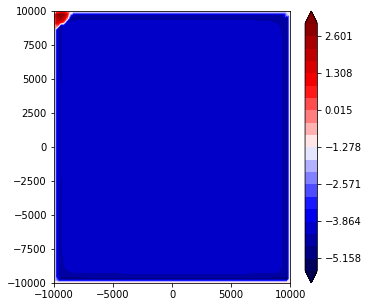

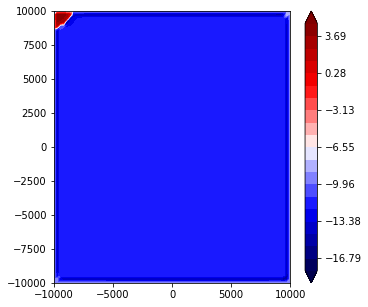

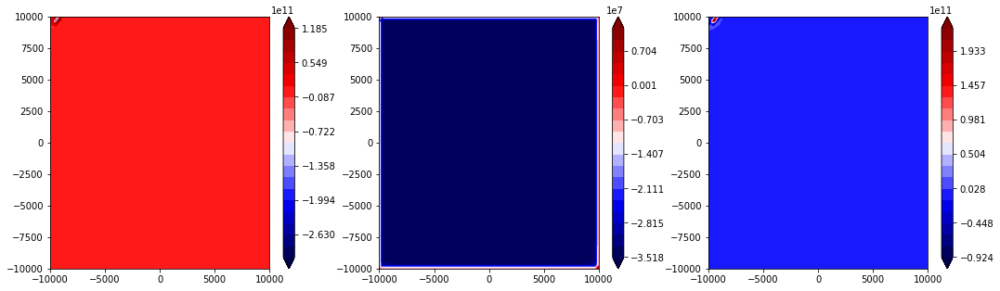

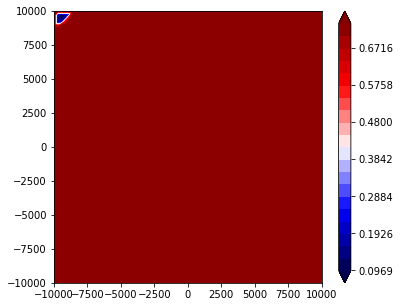

5601 2.61609239769
5602 2.61609239769
5603 2.61609239769
5604 2.61609239769
5605 2.61609239769
5606 2.61609239769
5607 2.61609239769
5608 2.61609239769
5609 2.61609239769
5610 2.61609239769
5611 2.61609239769
5612 2.61609239769
5613 2.61609239769
5614 2.61609239769
5615 2.61609239769
5616 2.61609239769
5617 2.61609239769
5618 2.61609239769
5619 2.61609239769
5620 2.61609239769
5621 2.61609239769
5622 2.61609239769
5623 2.61609239769
5624 2.61609239769
5625 2.61609239769
5626 2.61609239769
5627 2.61609239769
5628 2.61609239769
5629 2.61609239769
5630 2.61609239769
5631 2.61609239769
5632 2.61609239769
5633 2.61609239769
5634 2.61609239769
5635 2.61609239769
5636 2.61609239769
5637 2.61609239769
5638 2.61609239769
5639 2.61609239769
5640 2.61609239769
5641 2.61609239769
5642 2.61609239769
5643 2.61609239769
5644 2.61609239769
5645 2.61609239769
5646 2.61609239769
5647 2.61609239769
5648 2.61609239769
5649 2.61609239769
5650 2.61609239769
5651 2.61609239769
5652 2.61609239769
5653 2.61609

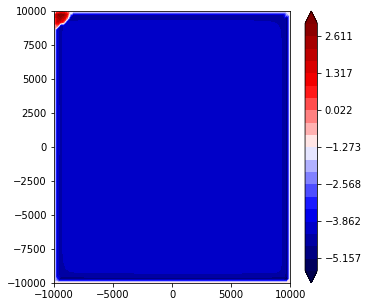

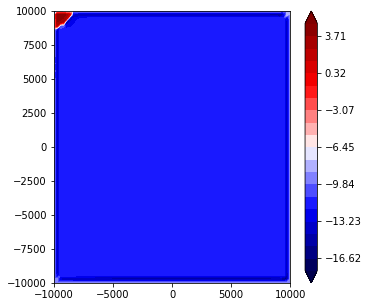

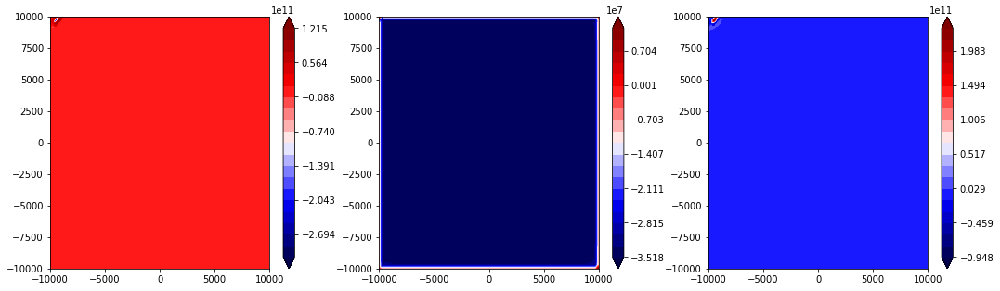

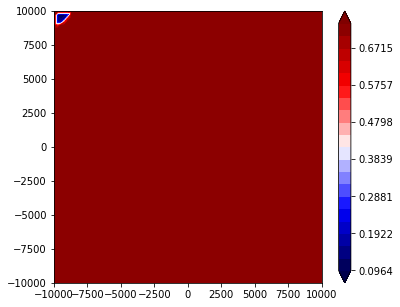

5701 2.6160923977
5702 2.6160923977
5703 2.6160923977
5704 2.6160923977
5705 2.6160923977
5706 2.6160923977
5707 2.6160923977
5708 2.6160923977
5709 2.6160923977
5710 2.6160923977
5711 2.6160923977
5712 2.6160923977
5713 2.6160923977
5714 2.6160923977
5715 2.6160923977
5716 2.6160923977
5717 2.6160923977
5718 2.6160923977
5719 2.6160923977
5720 2.6160923977
5721 2.6160923977
5722 2.6160923977
5723 2.6160923977
5724 2.6160923977
5725 2.6160923977
5726 2.6160923977
5727 2.6160923977
5728 2.6160923977
5729 2.6160923977
5730 2.6160923977
5731 2.6160923977
5732 2.6160923977
5733 2.6160923977
5734 2.6160923977
5735 2.6160923977
5736 2.6160923977
5737 2.6160923977
5738 2.6160923977
5739 2.6160923977
5740 2.6160923977
5741 2.6160923977
5742 2.6160923977
5743 2.6160923977
5744 2.6160923977
5745 2.6160923977
5746 2.6160923977
5747 2.6160923977
5748 2.6160923977
5749 2.6160923977
5750 2.6160923977
5751 2.6160923977
5752 2.6160923977
5753 2.6160923977
5754 2.6160923977
5755 2.6160923977
5756 2.616

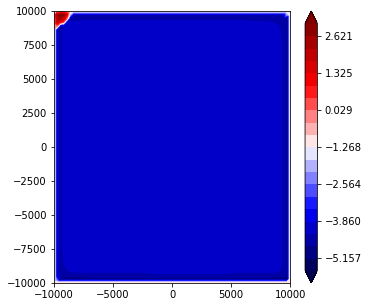

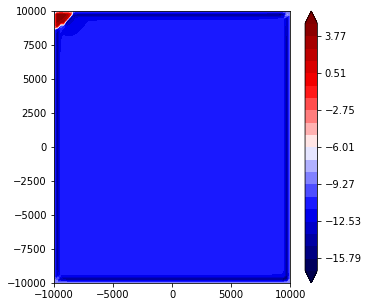

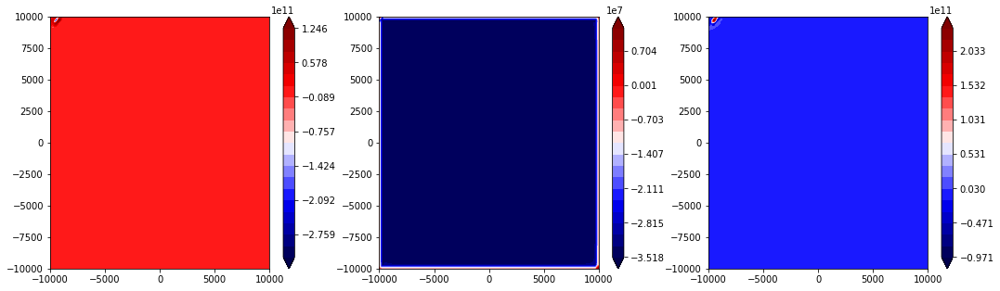

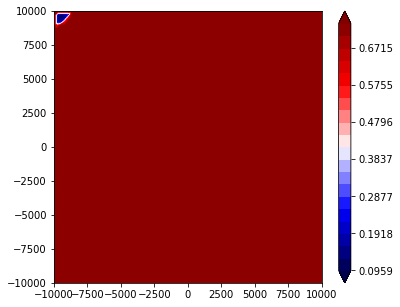

5801 2.61609239771
5802 2.61609239771
5803 2.61609239771
5804 2.61609239771
5805 2.61609239771
5806 2.61609239771
5807 2.61609239771
5808 2.61609239771
5809 2.61609239771
5810 2.61609239771
5811 2.61609239771
5812 2.61609239771
5813 2.61609239771
5814 2.61609239771
5815 2.61609239771
5816 2.61609239771
5817 2.61609239771
5818 2.61609239771
5819 2.61609239771
5820 2.61609239771
5821 2.61609239771
5822 2.61609239771
5823 2.61609239771
5824 2.61609239771
5825 2.61609239771
5826 2.61609239771
5827 2.61609239771
5828 2.61609239771
5829 2.61609239771
5830 2.61609239771
5831 2.61609239771
5832 2.61609239771
5833 2.61609239771
5834 2.61609239771
5835 2.61609239771
5836 2.61609239771
5837 2.61609239771
5838 2.61609239771
5839 2.61609239771
5840 2.61609239771
5841 2.61609239771
5842 2.61609239771
5843 2.61609239771
5844 2.61609239772
5845 2.61609239772
5846 2.61609239772
5847 2.61609239772
5848 2.61609239772
5849 2.61609239772
5850 2.61609239772
5851 2.61609239772
5852 2.61609239772
5853 2.61609

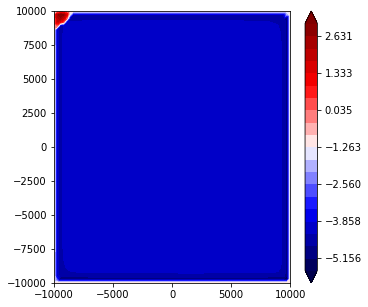

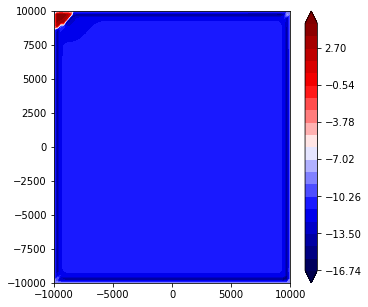

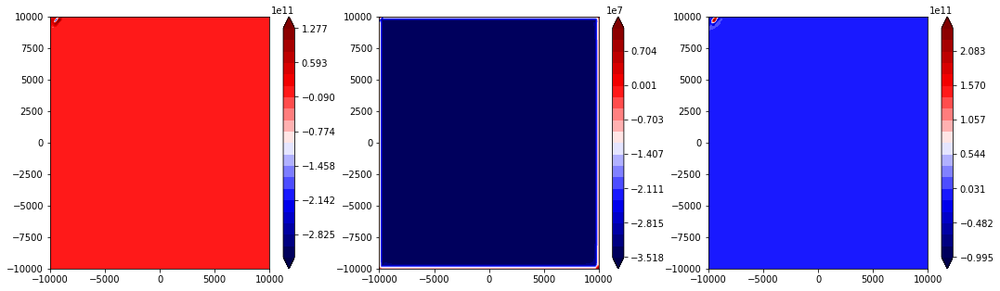

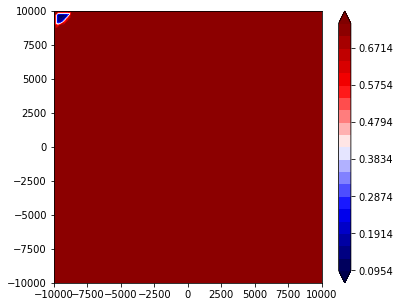

5901 2.61609239772
5902 2.61609239772
5903 2.61609239772
5904 2.61609239772
5905 2.61609239772
5906 2.61609239772
5907 2.61609239772
5908 2.61609239772
5909 2.61609239772
5910 2.61609239772
5911 2.61609239772
5912 2.61609239772
5913 2.61609239772
5914 2.61609239772
5915 2.61609239772
5916 2.61609239772
5917 2.61609239772
5918 2.61609239772
5919 2.61609239772
5920 2.61609239772
5921 2.61609239772
5922 2.61609239772
5923 2.61609239772
5924 2.61609239772
5925 2.61609239772
5926 2.61609239772
5927 2.61609239772
5928 2.61609239772
5929 2.61609239773
5930 2.61609239773
5931 2.61609239773
5932 2.61609239773
5933 2.61609239773
5934 2.61609239773
5935 2.61609239773
5936 2.61609239773
5937 2.61609239773
5938 2.61609239773
5939 2.61609239773
5940 2.61609239773
5941 2.61609239773
5942 2.61609239773
5943 2.61609239773
5944 2.61609239773
5945 2.61609239773
5946 2.61609239773
5947 2.61609239773
5948 2.61609239773
5949 2.61609239773
5950 2.61609239773
5951 2.61609239773
5952 2.61609239773
5953 2.61609

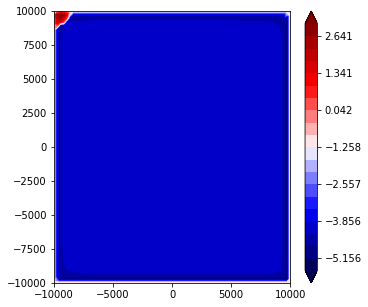

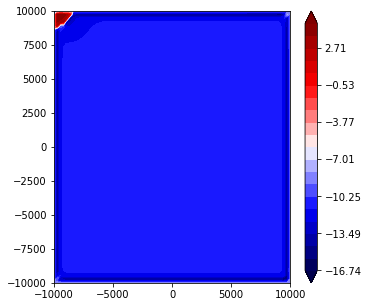

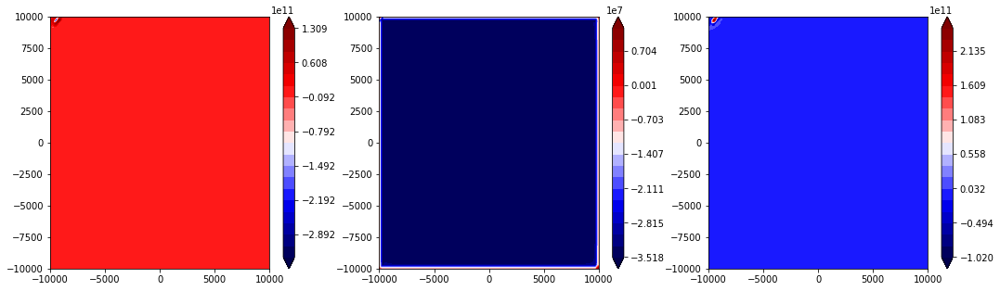

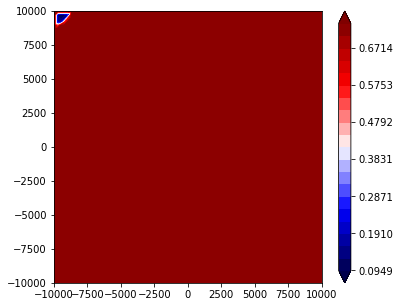

6001 2.61609239773
6002 2.61609239773
6003 2.61609239773
6004 2.61609239773
6005 2.61609239773
6006 2.61609239773
6007 2.61609239773
6008 2.61609239773
6009 2.61609239773
6010 2.61609239773
6011 2.61609239773
6012 2.61609239773
6013 2.61609239773
6014 2.61609239773
6015 2.61609239774
6016 2.61609239774
6017 2.61609239774
6018 2.61609239774
6019 2.61609239774
6020 2.61609239774
6021 2.61609239774
6022 2.61609239774
6023 2.61609239774
6024 2.61609239774
6025 2.61609239774
6026 2.61609239774
6027 2.61609239774
6028 2.61609239774
6029 2.61609239774
6030 2.61609239774
6031 2.61609239774
6032 2.61609239774
6033 2.61609239774
6034 2.61609239774
6035 2.61609239774
6036 2.61609239774
6037 2.61609239774
6038 2.61609239774
6039 2.61609239774
6040 2.61609239774
6041 2.61609239774
6042 2.61609239774
6043 2.61609239774
6044 2.61609239774
6045 2.61609239774
6046 2.61609239774
6047 2.61609239774
6048 2.61609239774
6049 2.61609239774
6050 2.61609239774
6051 2.61609239774
6052 2.61609239774
6053 2.61609

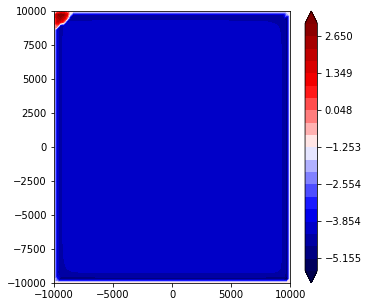

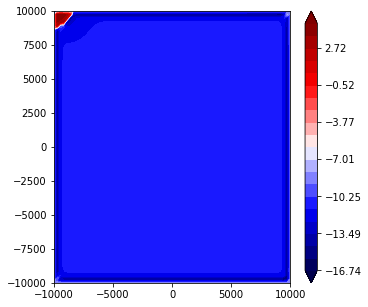

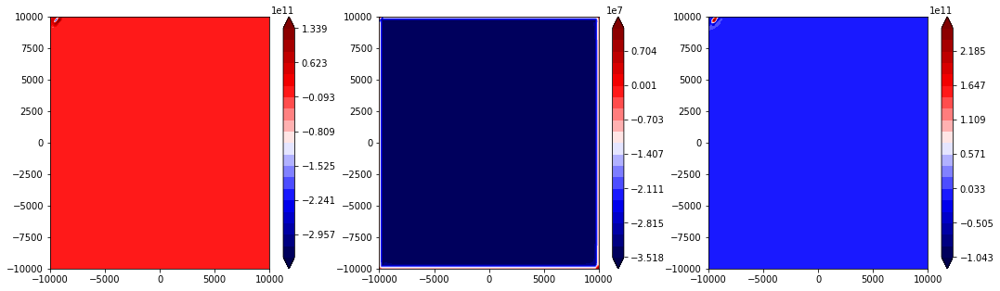

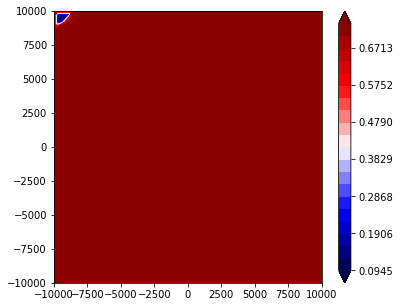

6101 2.61609239774
6102 2.61609239774
6103 2.61609239774
6104 2.61609239774
6105 2.61609239775
6106 2.61609239775
6107 2.61609239775
6108 2.61609239775
6109 2.61609239775
6110 2.61609239775
6111 2.61609239775
6112 2.61609239775
6113 2.61609239775
6114 2.61609239775
6115 2.61609239775
6116 2.61609239775
6117 2.61609239775
6118 2.61609239775
6119 2.61609239775
6120 2.61609239775
6121 2.61609239775
6122 2.61609239775
6123 2.61609239775
6124 2.61609239775
6125 2.61609239775
6126 2.61609239775
6127 2.61609239775
6128 2.61609239775
6129 2.61609239775
6130 2.61609239775
6131 2.61609239775
6132 2.61609239775
6133 2.61609239775
6134 2.61609239775
6135 2.61609239775
6136 2.61609239775
6137 2.61609239775
6138 2.61609239775
6139 2.61609239775
6140 2.61609239775
6141 2.61609239775
6142 2.61609239775
6143 2.61609239775
6144 2.61609239775
6145 2.61609239775
6146 2.61609239775
6147 2.61609239775
6148 2.61609239775
6149 2.61609239775
6150 2.61609239775
6151 2.61609239775
6152 2.61609239775
6153 2.61609

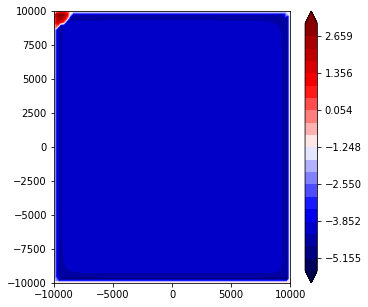

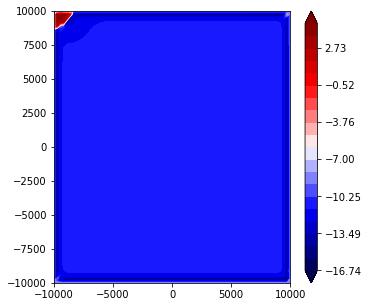

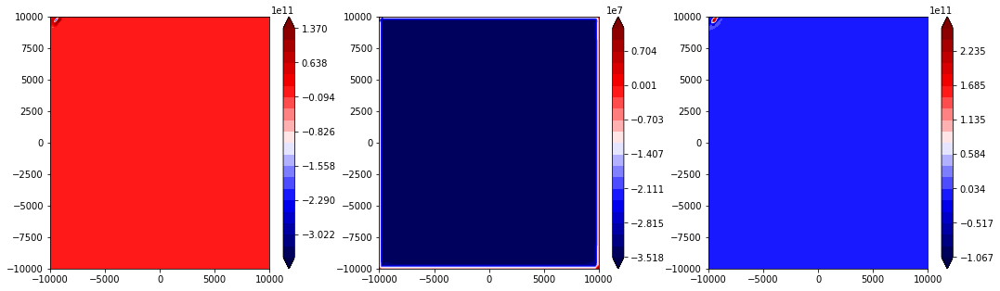

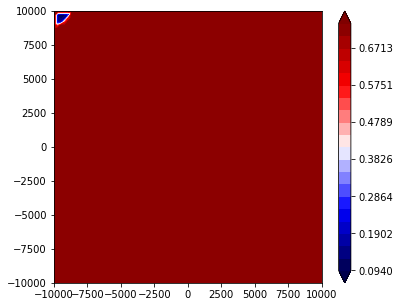

6201 2.61609239776
6202 2.61609239776
6203 2.61609239776
6204 2.61609239776
6205 2.61609239776
6206 2.61609239776
6207 2.61609239776
6208 2.61609239776
6209 2.61609239776
6210 2.61609239776
6211 2.61609239776
6212 2.61609239776
6213 2.61609239776
6214 2.61609239776
6215 2.61609239776
6216 2.61609239776
6217 2.61609239776
6218 2.61609239776
6219 2.61609239776
6220 2.61609239776
6221 2.61609239776
6222 2.61609239776
6223 2.61609239776
6224 2.61609239776
6225 2.61609239776
6226 2.61609239776
6227 2.61609239776
6228 2.61609239776
6229 2.61609239776
6230 2.61609239776
6231 2.61609239776
6232 2.61609239776
6233 2.61609239776
6234 2.61609239776
6235 2.61609239776
6236 2.61609239776
6237 2.61609239776
6238 2.61609239776
6239 2.61609239776
6240 2.61609239776
6241 2.61609239776
6242 2.61609239776
6243 2.61609239776
6244 2.61609239776
6245 2.61609239776
6246 2.61609239776
6247 2.61609239776
6248 2.61609239776
6249 2.61609239776
6250 2.61609239776
6251 2.61609239776
6252 2.61609239776
6253 2.61609

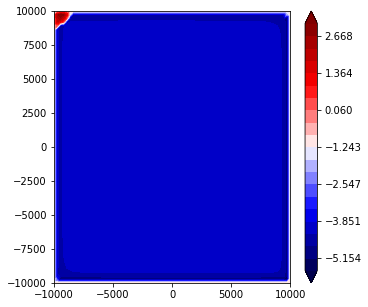

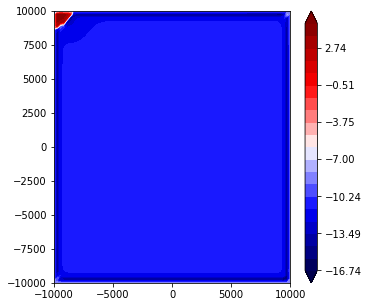

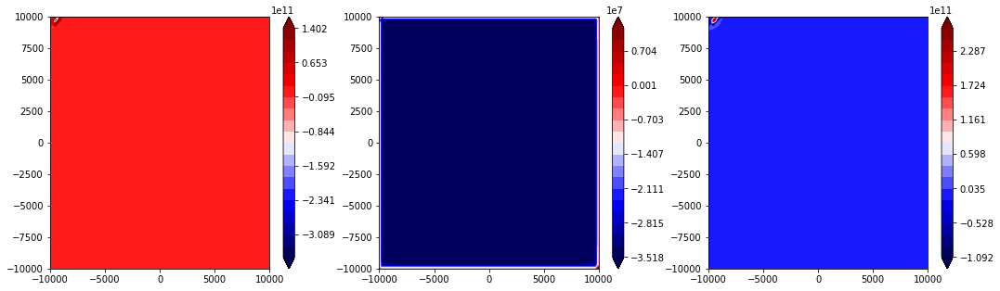

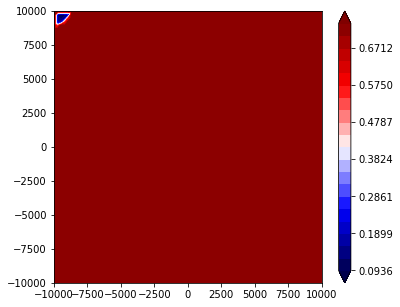

6301 2.61609239777
6302 2.61609239777
6303 2.61609239777
6304 2.61609239777
6305 2.61609239777
6306 2.61609239777
6307 2.61609239777
6308 2.61609239777
6309 2.61609239777
6310 2.61609239777
6311 2.61609239777
6312 2.61609239777
6313 2.61609239777
6314 2.61609239777
6315 2.61609239777
6316 2.61609239777
6317 2.61609239777
6318 2.61609239777
6319 2.61609239777
6320 2.61609239777
6321 2.61609239777
6322 2.61609239777
6323 2.61609239777
6324 2.61609239777
6325 2.61609239777
6326 2.61609239777
6327 2.61609239777
6328 2.61609239777
6329 2.61609239777
6330 2.61609239777
6331 2.61609239777
6332 2.61609239777
6333 2.61609239777
6334 2.61609239777
6335 2.61609239777
6336 2.61609239777
6337 2.61609239777
6338 2.61609239777
6339 2.61609239777
6340 2.61609239777
6341 2.61609239777
6342 2.61609239777
6343 2.61609239777
6344 2.61609239777
6345 2.61609239777
6346 2.61609239777
6347 2.61609239777
6348 2.61609239777
6349 2.61609239777
6350 2.61609239777
6351 2.61609239777
6352 2.61609239777
6353 2.61609

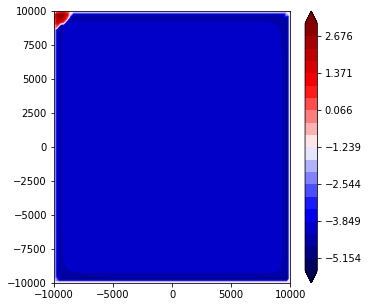

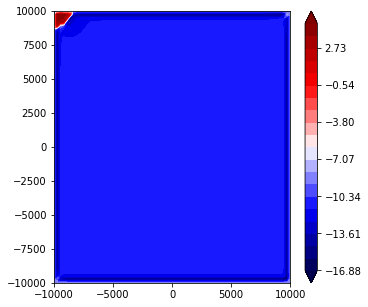

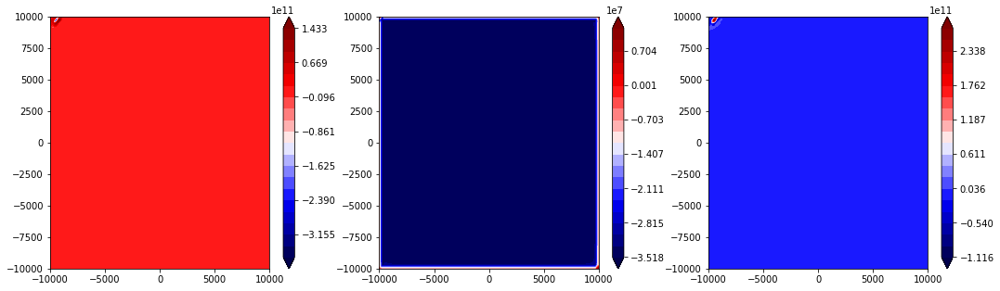

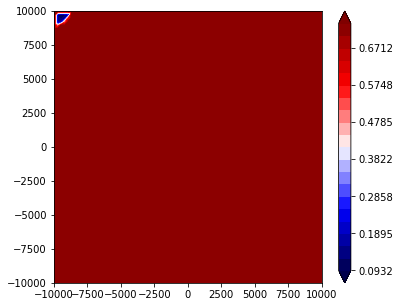

6401 2.61609239778
6402 2.61609239778
6403 2.61609239778
6404 2.61609239778
6405 2.61609239778
6406 2.61609239778
6407 2.61609239778
6408 2.61609239778
6409 2.61609239778
6410 2.61609239778
6411 2.61609239778
6412 2.61609239778
6413 2.61609239778
6414 2.61609239778
6415 2.61609239778
6416 2.61609239778
6417 2.61609239778
6418 2.61609239778
6419 2.61609239778
6420 2.61609239778
6421 2.61609239778
6422 2.61609239778
6423 2.61609239778
6424 2.61609239778
6425 2.61609239778
6426 2.61609239778
6427 2.61609239778
6428 2.61609239778
6429 2.61609239778
6430 2.61609239778
6431 2.61609239778
6432 2.61609239778
6433 2.61609239778
6434 2.61609239778
6435 2.61609239778
6436 2.61609239778
6437 2.61609239778
6438 2.61609239778
6439 2.61609239778
6440 2.61609239778
6441 2.61609239778
6442 2.61609239778
6443 2.61609239778
6444 2.61609239778
6445 2.61609239778
6446 2.61609239778
6447 2.61609239778
6448 2.61609239778
6449 2.61609239778
6450 2.61609239778
6451 2.61609239778
6452 2.61609239778
6453 2.61609

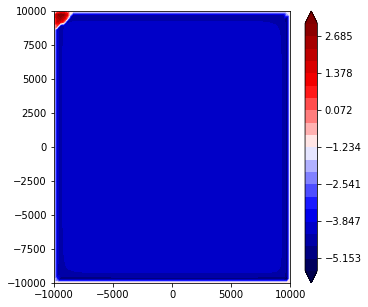

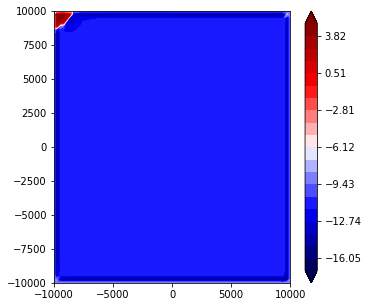

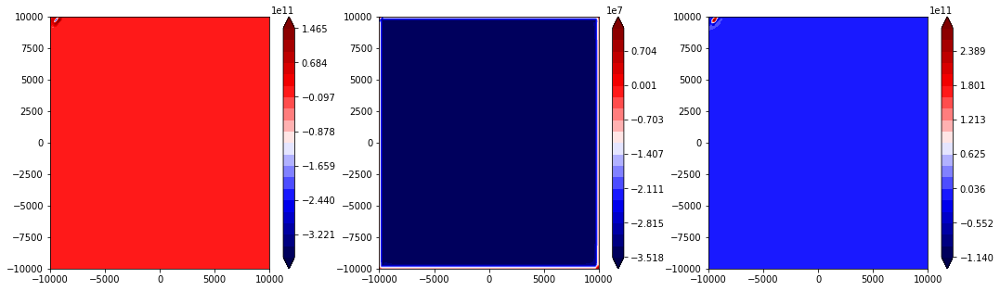

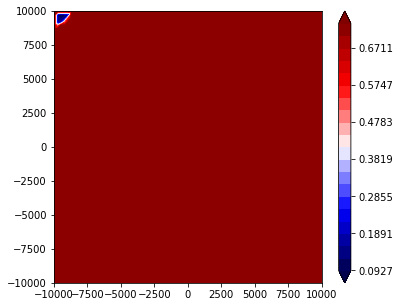

6501 2.61609239779
6502 2.61609239779
6503 2.61609239779
6504 2.61609239779
6505 2.61609239779
6506 2.61609239779
6507 2.61609239779
6508 2.61609239779
6509 2.61609239779
6510 2.61609239779
6511 2.61609239779
6512 2.61609239779
6513 2.61609239779
6514 2.61609239779
6515 2.61609239779
6516 2.61609239779
6517 2.61609239779
6518 2.61609239779
6519 2.61609239779
6520 2.61609239779
6521 2.61609239779
6522 2.61609239779
6523 2.61609239779
6524 2.61609239779
6525 2.61609239779
6526 2.61609239779
6527 2.61609239779
6528 2.61609239779
6529 2.61609239779
6530 2.61609239779
6531 2.61609239779
6532 2.61609239779
6533 2.61609239779
6534 2.61609239779
6535 2.61609239779
6536 2.61609239779
6537 2.61609239779
6538 2.61609239779
6539 2.61609239779
6540 2.61609239779
6541 2.61609239779
6542 2.61609239779
6543 2.61609239779
6544 2.61609239779
6545 2.61609239779
6546 2.61609239779
6547 2.61609239779
6548 2.61609239779
6549 2.61609239779
6550 2.61609239779
6551 2.61609239779
6552 2.61609239779
6553 2.61609

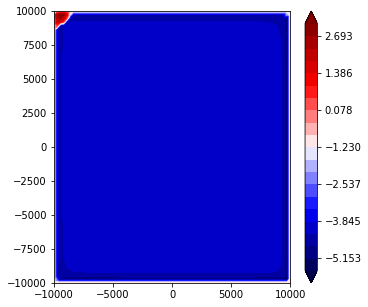

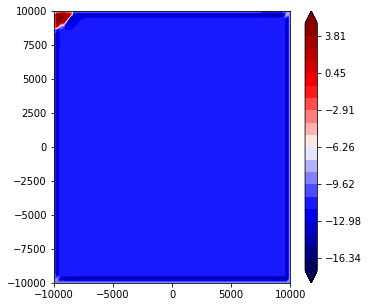

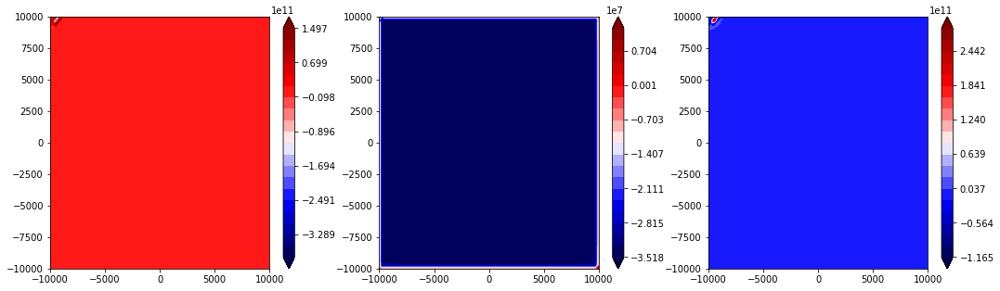

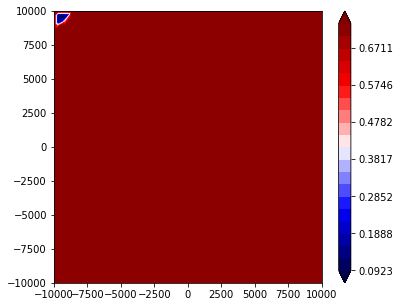

6601 2.6160923978
6602 2.6160923978
6603 2.6160923978
6604 2.6160923978
6605 2.6160923978
6606 2.6160923978
6607 2.6160923978
6608 2.6160923978
6609 2.6160923978
6610 2.6160923978
6611 2.6160923978
6612 2.6160923978
6613 2.6160923978
6614 2.6160923978
6615 2.6160923978
6616 2.6160923978
6617 2.6160923978
6618 2.6160923978
6619 2.6160923978
6620 2.6160923978
6621 2.6160923978
6622 2.6160923978
6623 2.6160923978
6624 2.6160923978
6625 2.6160923978
6626 2.6160923978
6627 2.6160923978
6628 2.6160923978
6629 2.6160923978
6630 2.6160923978
6631 2.6160923978
6632 2.6160923978
6633 2.6160923978
6634 2.6160923978
6635 2.6160923978
6636 2.6160923978
6637 2.6160923978
6638 2.6160923978
6639 2.6160923978
6640 2.6160923978
6641 2.6160923978
6642 2.6160923978
6643 2.6160923978
6644 2.6160923978
6645 2.6160923978
6646 2.6160923978
6647 2.6160923978
6648 2.6160923978
6649 2.6160923978
6650 2.6160923978
6651 2.6160923978
6652 2.6160923978
6653 2.6160923978
6654 2.6160923978
6655 2.6160923978
6656 2.616

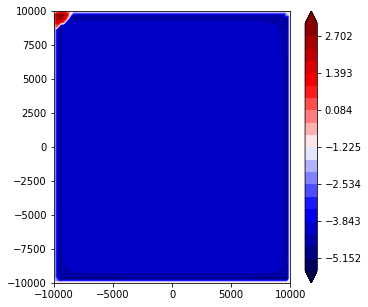

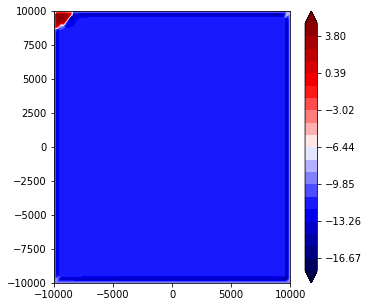

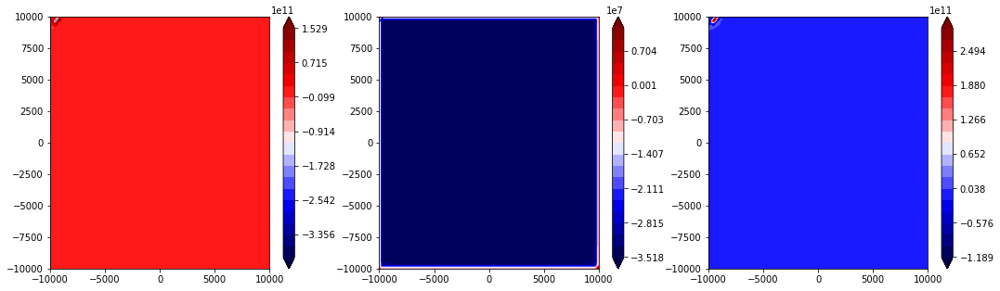

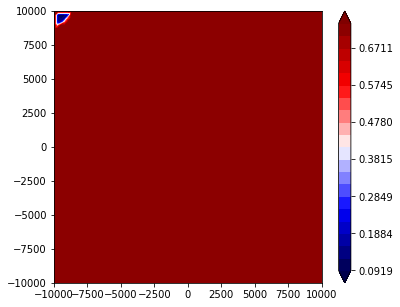

6701 2.61609239781
6702 2.61609239781
6703 2.61609239781
6704 2.61609239781
6705 2.61609239781
6706 2.61609239781
6707 2.61609239781
6708 2.61609239781
6709 2.61609239781
6710 2.61609239781
6711 2.61609239781
6712 2.61609239781
6713 2.61609239781
6714 2.61609239781
6715 2.61609239781
6716 2.61609239781
6717 2.61609239781
6718 2.61609239781
6719 2.61609239781
6720 2.61609239781
6721 2.61609239781
6722 2.61609239781
6723 2.61609239781
6724 2.61609239781
6725 2.61609239781
6726 2.61609239781
6727 2.61609239781
6728 2.61609239781
6729 2.61609239781
6730 2.61609239781
6731 2.61609239781
6732 2.61609239781
6733 2.61609239781
6734 2.61609239781
6735 2.61609239781
6736 2.61609239781
6737 2.61609239781
6738 2.61609239781
6739 2.61609239781
6740 2.61609239781
6741 2.61609239781
6742 2.61609239781
6743 2.61609239781
6744 2.61609239781
6745 2.61609239781
6746 2.61609239781
6747 2.61609239781
6748 2.61609239781
6749 2.61609239781
6750 2.61609239781
6751 2.61609239781
6752 2.61609239781
6753 2.61609

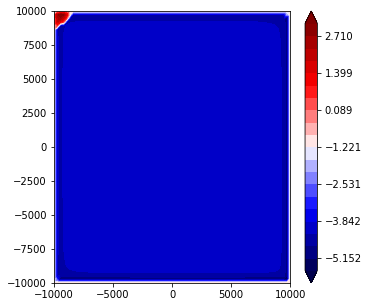

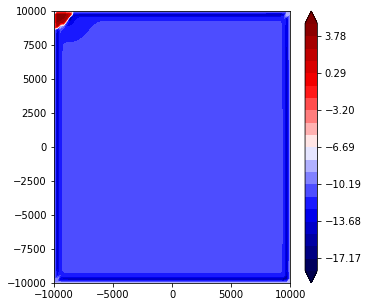

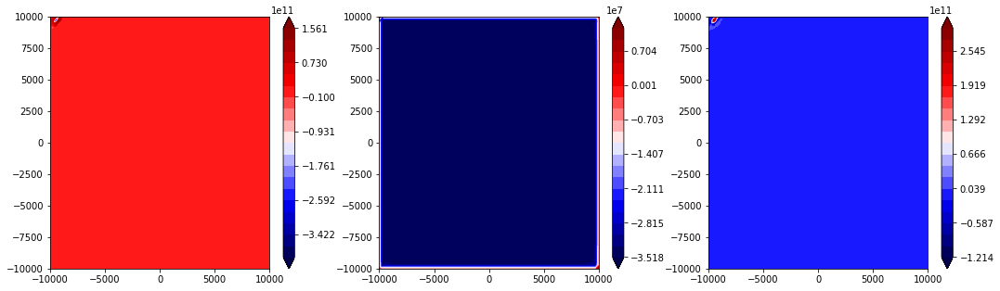

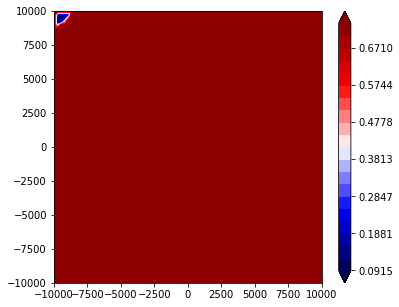

6801 2.61609239782
6802 2.61609239782
6803 2.61609239782
6804 2.61609239782
6805 2.61609239782
6806 2.61609239782
6807 2.61609239782
6808 2.61609239782
6809 2.61609239782
6810 2.61609239782
6811 2.61609239782
6812 2.61609239782
6813 2.61609239782
6814 2.61609239782
6815 2.61609239782
6816 2.61609239782
6817 2.61609239782
6818 2.61609239782
6819 2.61609239782
6820 2.61609239782
6821 2.61609239782
6822 2.61609239782
6823 2.61609239782
6824 2.61609239782
6825 2.61609239782
6826 2.61609239782
6827 2.61609239782
6828 2.61609239782
6829 2.61609239782
6830 2.61609239782
6831 2.61609239782
6832 2.61609239782
6833 2.61609239782
6834 2.61609239782
6835 2.61609239782
6836 2.61609239782
6837 2.61609239782
6838 2.61609239782
6839 2.61609239782
6840 2.61609239782
6841 2.61609239782
6842 2.61609239782
6843 2.61609239782
6844 2.61609239782
6845 2.61609239782
6846 2.61609239782
6847 2.61609239782
6848 2.61609239782
6849 2.61609239782
6850 2.61609239782
6851 2.61609239782
6852 2.61609239782
6853 2.61609

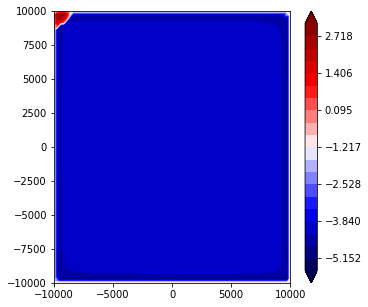

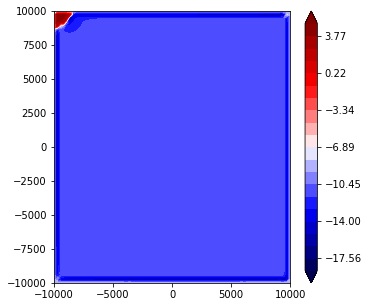

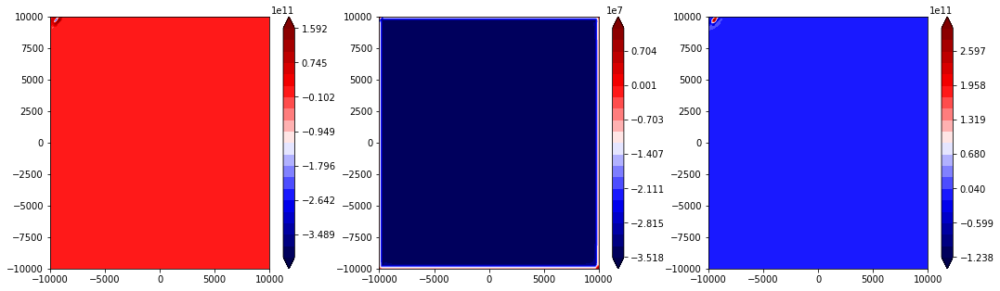

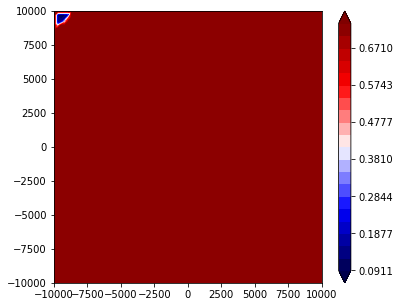

6901 2.61609239783
6902 2.61609239783
6903 2.61609239783
6904 2.61609239783
6905 2.61609239783
6906 2.61609239783
6907 2.61609239783
6908 2.61609239783
6909 2.61609239783
6910 2.61609239783
6911 2.61609239783
6912 2.61609239783
6913 2.61609239783
6914 2.61609239783
6915 2.61609239783
6916 2.61609239783
6917 2.61609239783
6918 2.61609239783
6919 2.61609239783
6920 2.61609239783
6921 2.61609239783
6922 2.61609239783
6923 2.61609239783
6924 2.61609239783
6925 2.61609239783
6926 2.61609239783
6927 2.61609239783
6928 2.61609239783
6929 2.61609239783
6930 2.61609239783
6931 2.61609239783
6932 2.61609239783
6933 2.61609239783
6934 2.61609239783
6935 2.61609239783
6936 2.61609239783
6937 2.61609239783
6938 2.61609239783
6939 2.61609239783
6940 2.61609239783
6941 2.61609239783
6942 2.61609239783
6943 2.61609239783
6944 2.61609239783
6945 2.61609239783
6946 2.61609239783
6947 2.61609239783
6948 2.61609239783
6949 2.61609239783
6950 2.61609239783
6951 2.61609239783
6952 2.61609239783
6953 2.61609

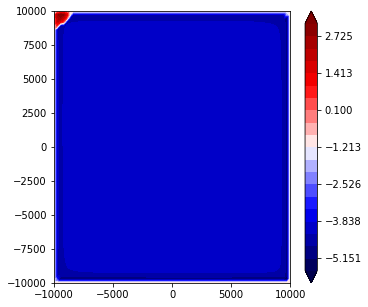

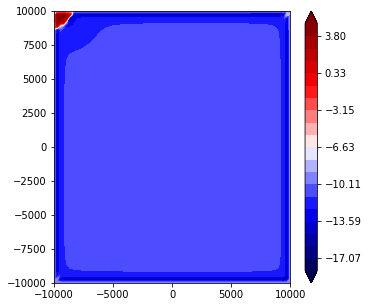

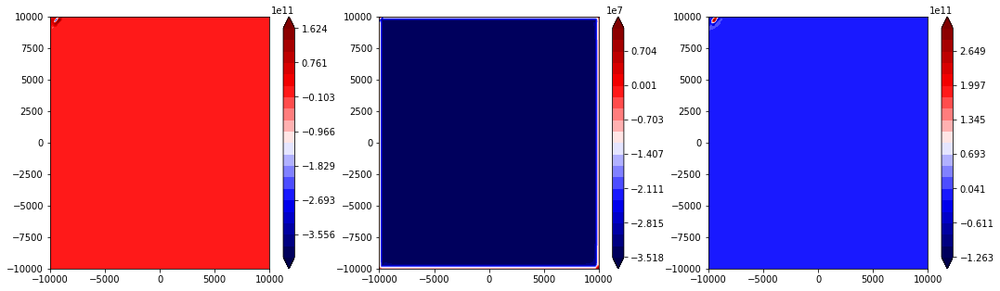

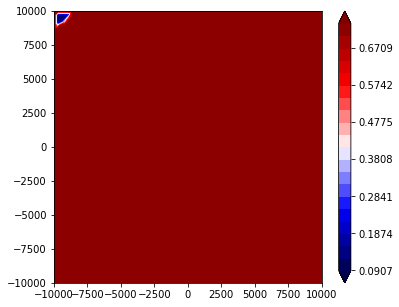

7001 2.61609239784
7002 2.61609239784
7003 2.61609239784
7004 2.61609239784
7005 2.61609239784
7006 2.61609239784
7007 2.61609239784
7008 2.61609239784
7009 2.61609239784
7010 2.61609239784
7011 2.61609239784
7012 2.61609239784
7013 2.61609239784
7014 2.61609239784
7015 2.61609239784
7016 2.61609239784
7017 2.61609239784
7018 2.61609239784
7019 2.61609239784
7020 2.61609239784
7021 2.61609239784
7022 2.61609239784
7023 2.61609239784
7024 2.61609239784
7025 2.61609239784
7026 2.61609239784
7027 2.61609239784
7028 2.61609239784
7029 2.61609239784
7030 2.61609239784
7031 2.61609239784
7032 2.61609239784
7033 2.61609239784
7034 2.61609239784
7035 2.61609239784
7036 2.61609239784
7037 2.61609239784
7038 2.61609239784
7039 2.61609239784
7040 2.61609239784
7041 2.61609239784
7042 2.61609239784
7043 2.61609239784
7044 2.61609239784
7045 2.61609239784
7046 2.61609239784
7047 2.61609239784
7048 2.61609239784
7049 2.61609239784
7050 2.61609239784
7051 2.61609239784
7052 2.61609239784
7053 2.61609

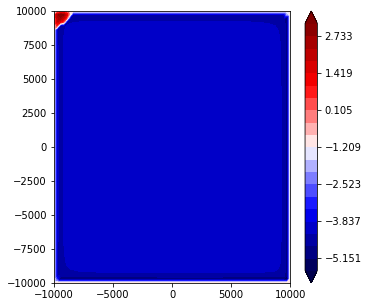

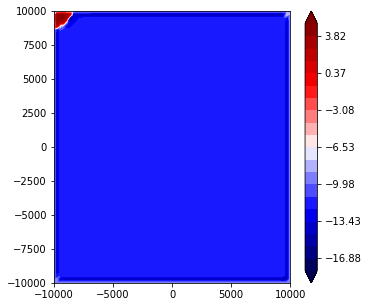

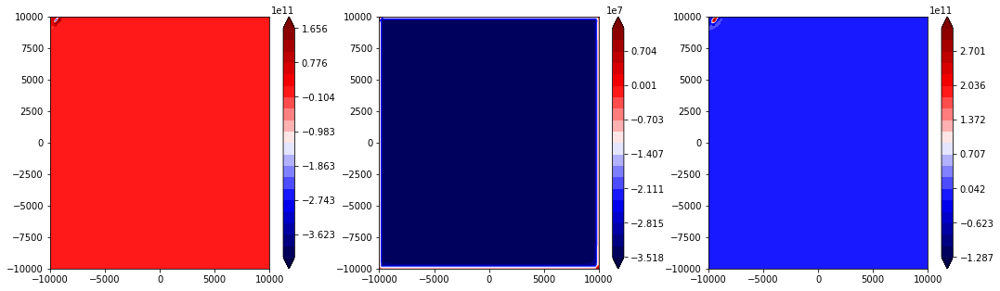

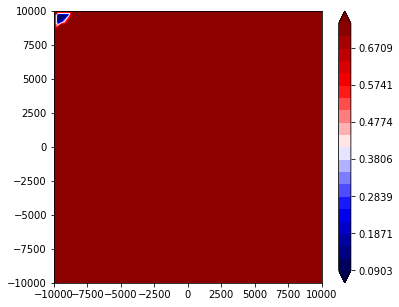

7101 2.61609239785
7102 2.61609239785
7103 2.61609239785
7104 2.61609239785
7105 2.61609239785
7106 2.61609239785
7107 2.61609239785
7108 2.61609239785
7109 2.61609239785
7110 2.61609239785
7111 2.61609239785
7112 2.61609239785
7113 2.61609239785
7114 2.61609239785
7115 2.61609239785
7116 2.61609239785
7117 2.61609239785
7118 2.61609239785
7119 2.61609239785
7120 2.61609239785
7121 2.61609239785
7122 2.61609239785
7123 2.61609239785
7124 2.61609239785
7125 2.61609239785
7126 2.61609239785
7127 2.61609239785
7128 2.61609239785
7129 2.61609239785
7130 2.61609239785
7131 2.61609239785
7132 2.61609239785
7133 2.61609239785
7134 2.61609239785
7135 2.61609239785
7136 2.61609239785
7137 2.61609239785
7138 2.61609239785
7139 2.61609239785
7140 2.61609239785
7141 2.61609239785
7142 2.61609239785
7143 2.61609239785
7144 2.61609239785
7145 2.61609239785
7146 2.61609239785
7147 2.61609239785
7148 2.61609239785
7149 2.61609239785
7150 2.61609239785
7151 2.61609239785
7152 2.61609239785
7153 2.61609

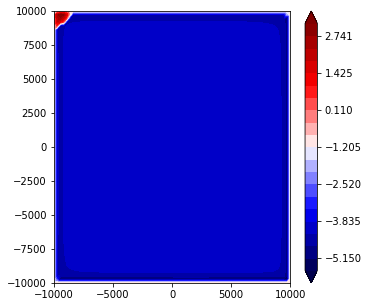

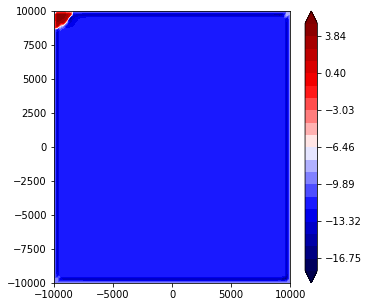

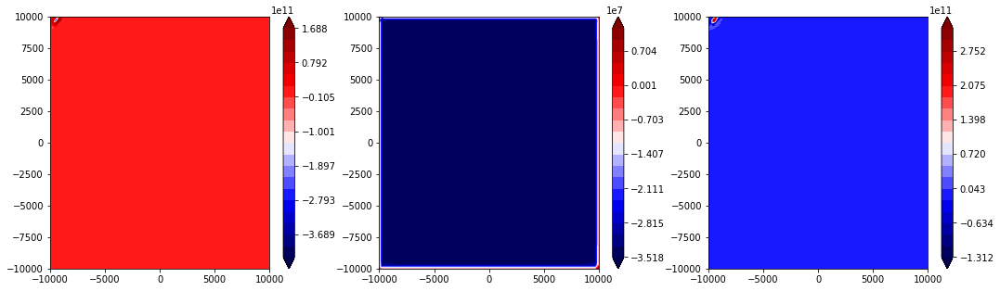

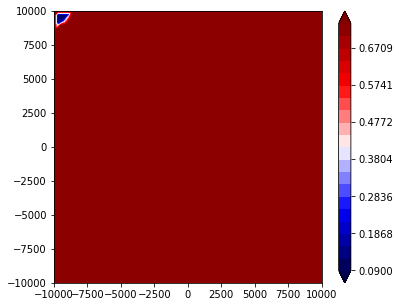

7201 2.61609239786
7202 2.61609239786
7203 2.61609239786
7204 2.61609239786
7205 2.61609239786
7206 2.61609239786
7207 2.61609239786
7208 2.61609239786
7209 2.61609239786
7210 2.61609239786
7211 2.61609239786
7212 2.61609239786
7213 2.61609239786
7214 2.61609239786
7215 2.61609239786
7216 2.61609239786
7217 2.61609239786
7218 2.61609239786
7219 2.61609239786
7220 2.61609239786
7221 2.61609239786
7222 2.61609239786
7223 2.61609239786
7224 2.61609239786
7225 2.61609239786
7226 2.61609239786
7227 2.61609239786
7228 2.61609239786
7229 2.61609239786
7230 2.61609239786
7231 2.61609239786
7232 2.61609239786
7233 2.61609239786
7234 2.61609239786
7235 2.61609239786
7236 2.61609239786
7237 2.61609239786
7238 2.61609239786
7239 2.61609239786
7240 2.61609239786
7241 2.61609239786
7242 2.61609239786
7243 2.61609239786
7244 2.61609239786
7245 2.61609239786
7246 2.61609239786
7247 2.61609239786
7248 2.61609239786
7249 2.61609239786
7250 2.61609239786
7251 2.61609239786
7252 2.61609239786
7253 2.61609

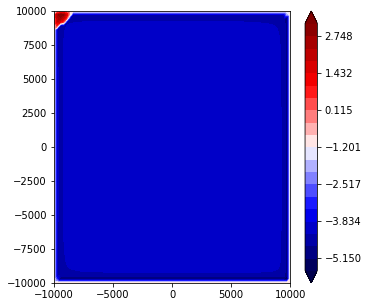

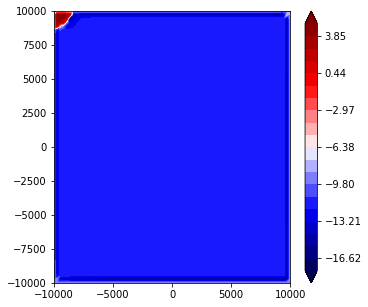

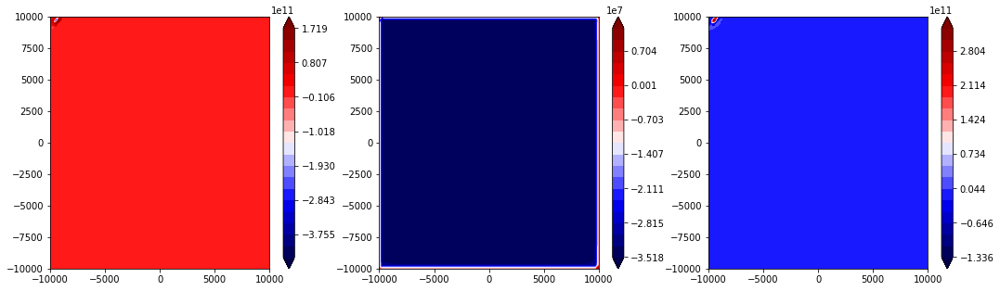

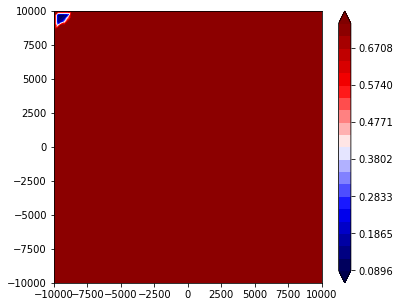

7301 2.61609239786
7302 2.61609239786
7303 2.61609239786
7304 2.61609239786
7305 2.61609239786
7306 2.61609239786
7307 2.61609239786
7308 2.61609239786
7309 2.61609239786
7310 2.61609239787
7311 2.61609239787
7312 2.61609239787
7313 2.61609239787
7314 2.61609239787
7315 2.61609239787
7316 2.61609239787
7317 2.61609239787
7318 2.61609239787
7319 2.61609239787
7320 2.61609239787
7321 2.61609239787
7322 2.61609239787
7323 2.61609239787
7324 2.61609239787
7325 2.61609239787
7326 2.61609239787
7327 2.61609239787
7328 2.61609239787
7329 2.61609239787
7330 2.61609239787
7331 2.61609239787
7332 2.61609239787
7333 2.61609239787
7334 2.61609239787
7335 2.61609239787
7336 2.61609239787
7337 2.61609239787
7338 2.61609239787
7339 2.61609239787
7340 2.61609239787
7341 2.61609239787
7342 2.61609239787
7343 2.61609239787
7344 2.61609239787
7345 2.61609239787
7346 2.61609239787
7347 2.61609239787
7348 2.61609239787
7349 2.61609239787
7350 2.61609239787
7351 2.61609239787
7352 2.61609239787
7353 2.61609

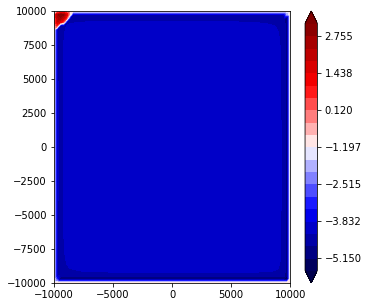

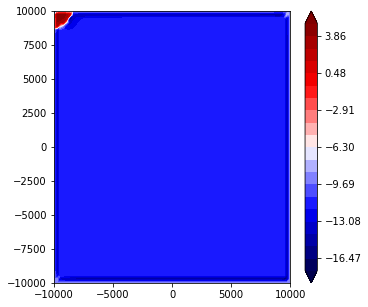

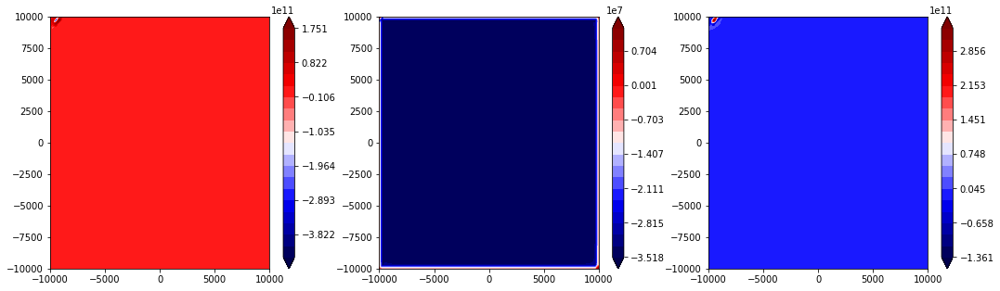

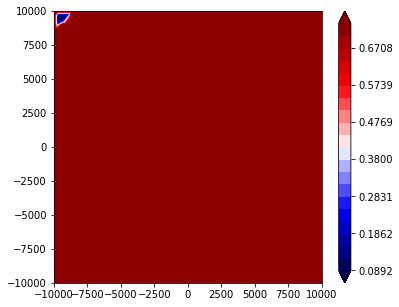

7401 2.61609239787
7402 2.61609239787
7403 2.61609239787
7404 2.61609239787
7405 2.61609239787
7406 2.61609239787
7407 2.61609239787
7408 2.61609239787
7409 2.61609239787
7410 2.61609239787
7411 2.61609239787
7412 2.61609239787
7413 2.61609239787
7414 2.61609239787
7415 2.61609239787
7416 2.61609239787
7417 2.61609239787
7418 2.61609239787
7419 2.61609239787
7420 2.61609239787
7421 2.61609239787
7422 2.61609239787
7423 2.61609239788
7424 2.61609239788
7425 2.61609239788
7426 2.61609239788
7427 2.61609239788
7428 2.61609239788
7429 2.61609239788
7430 2.61609239788
7431 2.61609239788
7432 2.61609239788
7433 2.61609239788
7434 2.61609239788
7435 2.61609239788
7436 2.61609239788
7437 2.61609239788
7438 2.61609239788
7439 2.61609239788
7440 2.61609239788
7441 2.61609239788
7442 2.61609239788
7443 2.61609239788
7444 2.61609239788
7445 2.61609239788
7446 2.61609239788
7447 2.61609239788
7448 2.61609239788
7449 2.61609239788
7450 2.61609239788
7451 2.61609239788
7452 2.61609239788
7453 2.61609

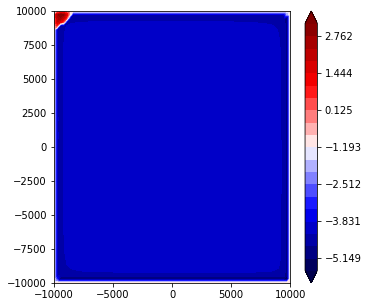

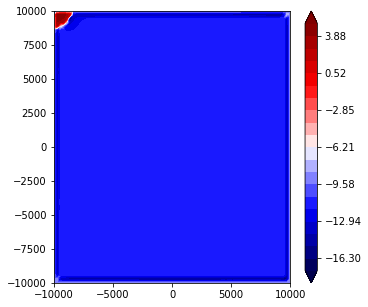

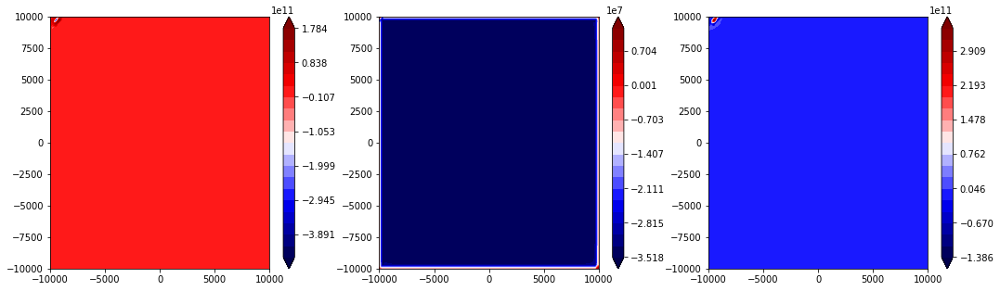

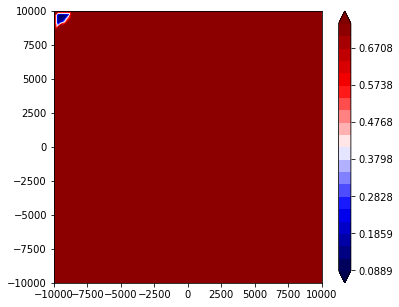

7501 2.61609239788
7502 2.61609239788
7503 2.61609239788
7504 2.61609239788
7505 2.61609239788
7506 2.61609239788
7507 2.61609239788
7508 2.61609239788
7509 2.61609239788
7510 2.61609239788
7511 2.61609239788
7512 2.61609239788
7513 2.61609239788
7514 2.61609239788
7515 2.61609239788
7516 2.61609239788
7517 2.61609239788
7518 2.61609239788
7519 2.61609239788
7520 2.61609239788
7521 2.61609239788
7522 2.61609239788
7523 2.61609239788
7524 2.61609239788
7525 2.61609239788
7526 2.61609239788
7527 2.61609239788
7528 2.61609239788
7529 2.61609239788
7530 2.61609239788
7531 2.61609239788
7532 2.61609239788
7533 2.61609239788
7534 2.61609239788
7535 2.61609239788
7536 2.61609239788
7537 2.61609239788
7538 2.61609239788
7539 2.61609239789
7540 2.61609239789
7541 2.61609239789
7542 2.61609239789
7543 2.61609239789
7544 2.61609239789
7545 2.61609239789
7546 2.61609239789
7547 2.61609239789
7548 2.61609239789
7549 2.61609239789
7550 2.61609239789
7551 2.61609239789
7552 2.61609239789
7553 2.61609

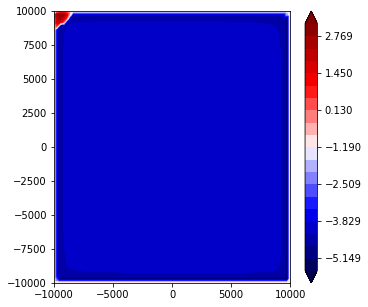

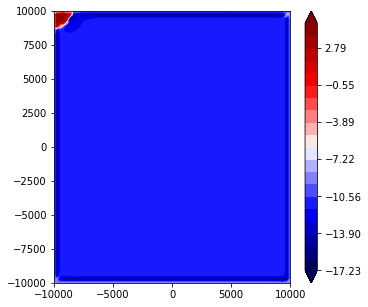

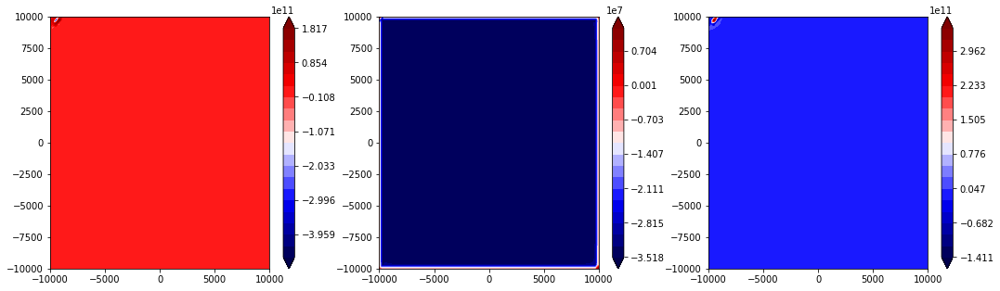

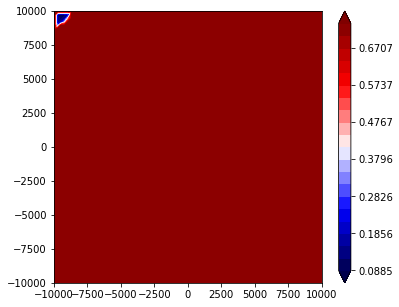

7601 2.61609239789
7602 2.61609239789
7603 2.61609239789
7604 2.61609239789
7605 2.61609239789
7606 2.61609239789
7607 2.61609239789
7608 2.61609239789
7609 2.61609239789
7610 2.61609239789
7611 2.61609239789
7612 2.61609239789
7613 2.61609239789
7614 2.61609239789
7615 2.61609239789
7616 2.61609239789
7617 2.61609239789
7618 2.61609239789
7619 2.61609239789
7620 2.61609239789
7621 2.61609239789
7622 2.61609239789
7623 2.61609239789
7624 2.61609239789
7625 2.61609239789
7626 2.61609239789
7627 2.61609239789
7628 2.61609239789
7629 2.61609239789
7630 2.61609239789
7631 2.61609239789
7632 2.61609239789
7633 2.61609239789
7634 2.61609239789
7635 2.61609239789
7636 2.61609239789
7637 2.61609239789
7638 2.61609239789
7639 2.61609239789
7640 2.61609239789
7641 2.61609239789
7642 2.61609239789
7643 2.61609239789
7644 2.61609239789
7645 2.61609239789
7646 2.61609239789
7647 2.61609239789
7648 2.61609239789
7649 2.61609239789
7650 2.61609239789
7651 2.61609239789
7652 2.61609239789
7653 2.61609

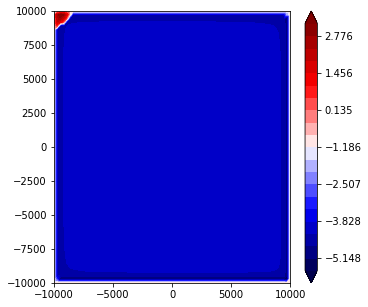

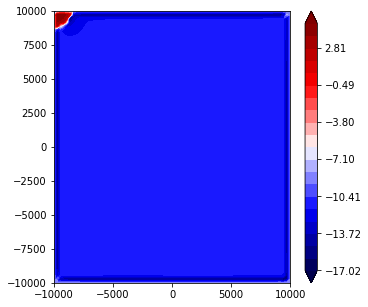

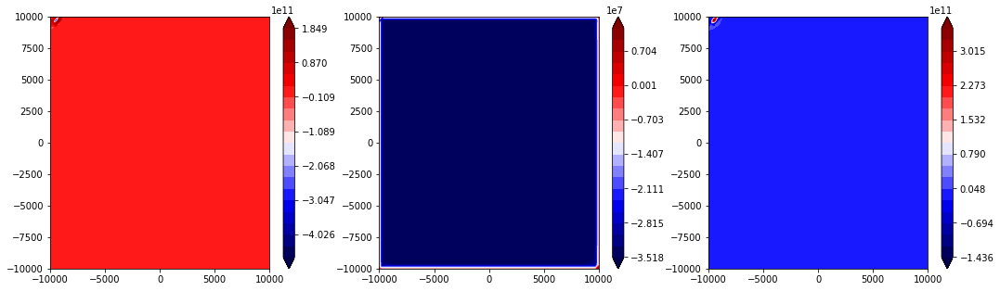

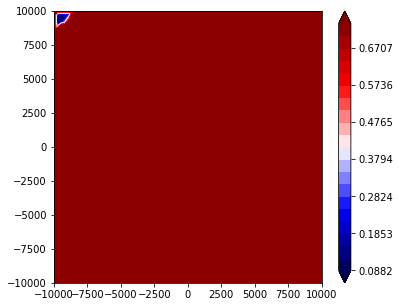

7701 2.6160923979
7702 2.6160923979
7703 2.6160923979
7704 2.6160923979
7705 2.6160923979
7706 2.6160923979
7707 2.6160923979
7708 2.6160923979
7709 2.6160923979
7710 2.6160923979
7711 2.6160923979
7712 2.6160923979
7713 2.6160923979
7714 2.6160923979
7715 2.6160923979
7716 2.6160923979
7717 2.6160923979
7718 2.6160923979
7719 2.6160923979
7720 2.6160923979
7721 2.6160923979
7722 2.6160923979
7723 2.6160923979
7724 2.6160923979
7725 2.6160923979
7726 2.6160923979
7727 2.6160923979
7728 2.6160923979
7729 2.6160923979
7730 2.6160923979
7731 2.6160923979
7732 2.6160923979
7733 2.6160923979
7734 2.6160923979
7735 2.6160923979
7736 2.6160923979
7737 2.6160923979
7738 2.6160923979
7739 2.6160923979
7740 2.6160923979
7741 2.6160923979
7742 2.6160923979
7743 2.6160923979
7744 2.6160923979
7745 2.6160923979
7746 2.6160923979
7747 2.6160923979
7748 2.6160923979
7749 2.6160923979
7750 2.6160923979
7751 2.6160923979
7752 2.6160923979
7753 2.6160923979
7754 2.6160923979
7755 2.6160923979
7756 2.616

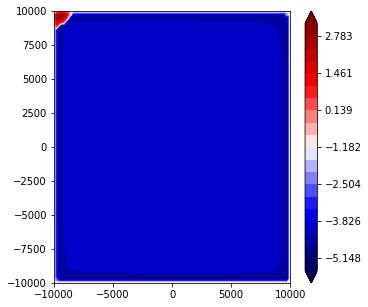

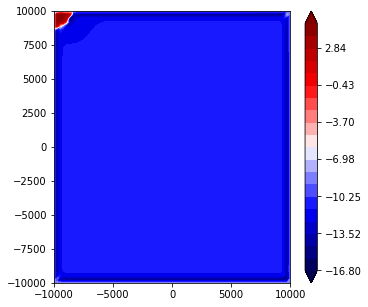

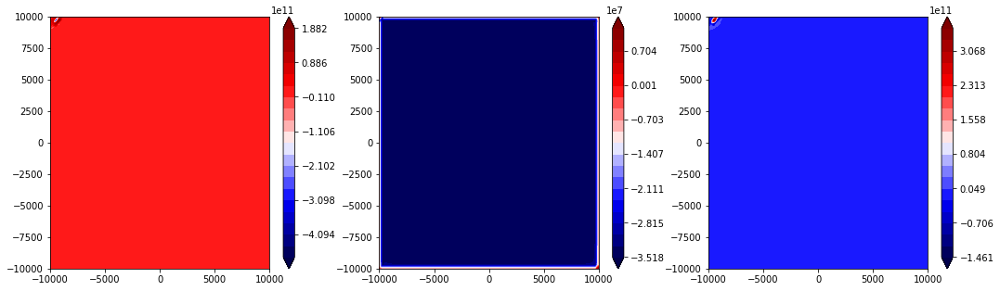

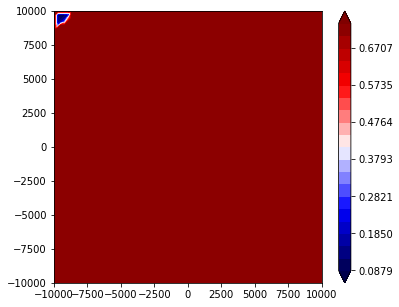

7801 2.61609239791
7802 2.61609239791
7803 2.61609239791
7804 2.61609239791
7805 2.61609239791
7806 2.61609239791
7807 2.61609239791
7808 2.61609239791
7809 2.61609239791
7810 2.61609239791
7811 2.61609239791
7812 2.61609239791
7813 2.61609239791
7814 2.61609239791
7815 2.61609239791
7816 2.61609239791
7817 2.61609239791
7818 2.61609239791
7819 2.61609239791
7820 2.61609239791
7821 2.61609239791
7822 2.61609239791
7823 2.61609239791
7824 2.61609239791
7825 2.61609239791
7826 2.61609239791
7827 2.61609239791
7828 2.61609239791
7829 2.61609239791
7830 2.61609239791
7831 2.61609239791
7832 2.61609239791
7833 2.61609239791
7834 2.61609239791
7835 2.61609239791
7836 2.61609239791
7837 2.61609239791
7838 2.61609239791
7839 2.61609239791
7840 2.61609239791
7841 2.61609239791
7842 2.61609239791
7843 2.61609239791
7844 2.61609239791
7845 2.61609239791
7846 2.61609239791
7847 2.61609239791
7848 2.61609239791
7849 2.61609239791
7850 2.61609239791
7851 2.61609239791
7852 2.61609239791
7853 2.61609

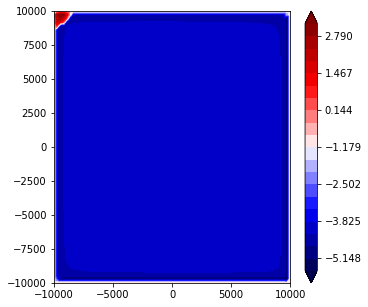

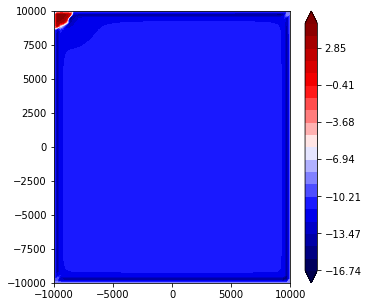

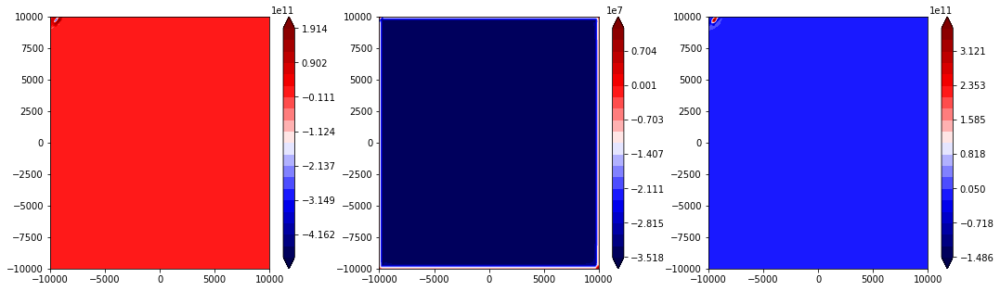

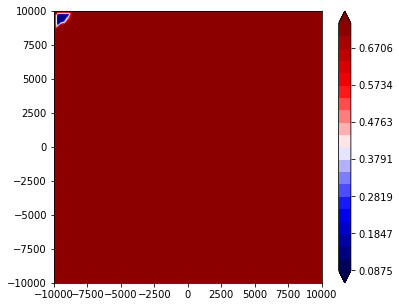

7901 2.61609239792
7902 2.61609239792
7903 2.61609239792
7904 2.61609239792
7905 2.61609239792
7906 2.61609239792
7907 2.61609239792
7908 2.61609239792
7909 2.61609239792
7910 2.61609239792
7911 2.61609239792
7912 2.61609239792
7913 2.61609239792
7914 2.61609239792
7915 2.61609239792
7916 2.61609239792
7917 2.61609239792
7918 2.61609239792
7919 2.61609239792
7920 2.61609239792
7921 2.61609239792
7922 2.61609239792
7923 2.61609239792
7924 2.61609239792
7925 2.61609239792
7926 2.61609239792
7927 2.61609239792
7928 2.61609239792
7929 2.61609239792
7930 2.61609239792
7931 2.61609239792
7932 2.61609239792
7933 2.61609239792
7934 2.61609239792
7935 2.61609239792
7936 2.61609239792
7937 2.61609239792
7938 2.61609239792
7939 2.61609239792
7940 2.61609239792
7941 2.61609239792
7942 2.61609239792
7943 2.61609239792
7944 2.61609239792
7945 2.61609239792
7946 2.61609239792
7947 2.61609239792
7948 2.61609239792
7949 2.61609239792
7950 2.61609239792
7951 2.61609239792
7952 2.61609239792
7953 2.61609

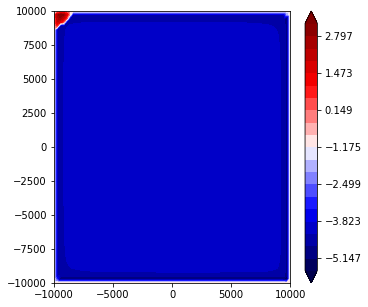

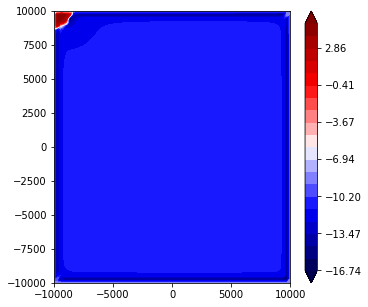

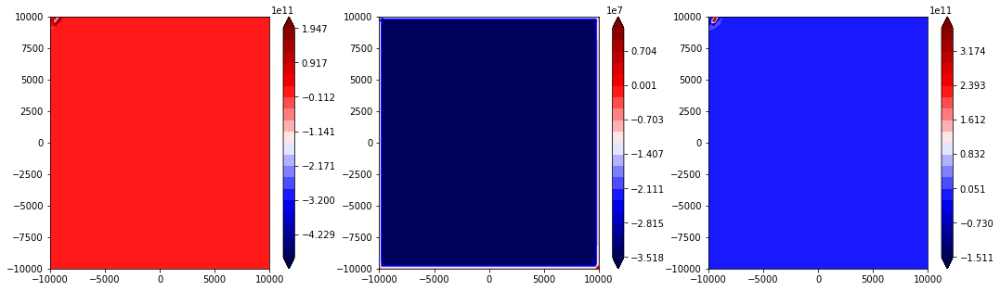

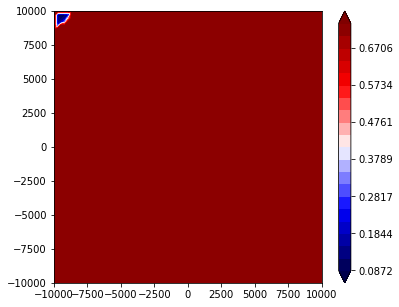

8001 2.61609239792
8002 2.61609239792
8003 2.61609239792
8004 2.61609239792
8005 2.61609239792
8006 2.61609239792
8007 2.61609239792
8008 2.61609239792
8009 2.61609239792
8010 2.61609239792
8011 2.61609239792
8012 2.61609239792
8013 2.61609239792
8014 2.61609239792
8015 2.61609239792
8016 2.61609239792
8017 2.61609239792
8018 2.61609239792
8019 2.61609239792
8020 2.61609239793
8021 2.61609239793
8022 2.61609239793
8023 2.61609239793
8024 2.61609239793
8025 2.61609239793
8026 2.61609239793
8027 2.61609239793
8028 2.61609239793
8029 2.61609239793
8030 2.61609239793
8031 2.61609239793
8032 2.61609239793
8033 2.61609239793
8034 2.61609239793
8035 2.61609239793
8036 2.61609239793
8037 2.61609239793
8038 2.61609239793
8039 2.61609239793
8040 2.61609239793
8041 2.61609239793
8042 2.61609239793
8043 2.61609239793
8044 2.61609239793
8045 2.61609239793
8046 2.61609239793
8047 2.61609239793
8048 2.61609239793
8049 2.61609239793
8050 2.61609239793
8051 2.61609239793
8052 2.61609239793
8053 2.61609

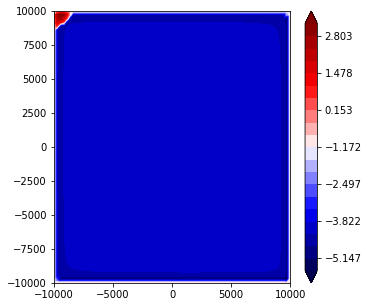

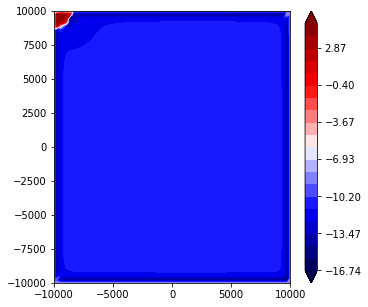

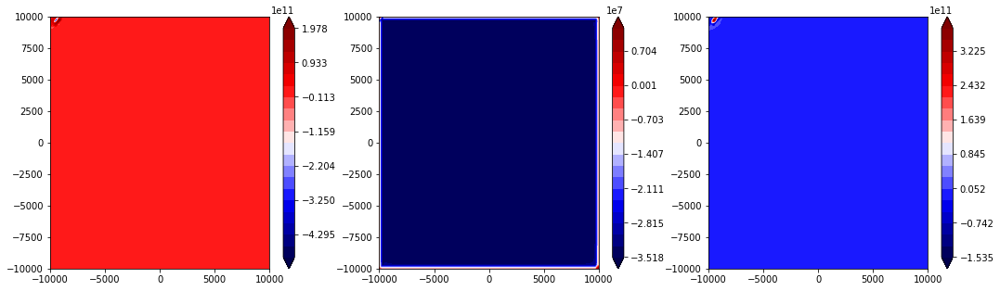

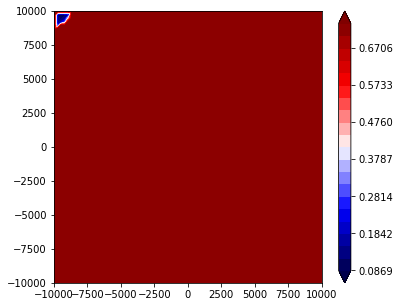

8101 2.61609239793
8102 2.61609239793
8103 2.61609239793
8104 2.61609239793
8105 2.61609239793
8106 2.61609239793
8107 2.61609239793
8108 2.61609239793
8109 2.61609239793
8110 2.61609239793
8111 2.61609239793
8112 2.61609239793
8113 2.61609239793
8114 2.61609239793
8115 2.61609239793
8116 2.61609239793
8117 2.61609239793
8118 2.61609239793
8119 2.61609239793
8120 2.61609239793
8121 2.61609239793
8122 2.61609239793
8123 2.61609239793
8124 2.61609239793
8125 2.61609239793
8126 2.61609239793
8127 2.61609239793
8128 2.61609239793
8129 2.61609239793
8130 2.61609239793
8131 2.61609239793
8132 2.61609239793
8133 2.61609239793
8134 2.61609239793
8135 2.61609239793
8136 2.61609239793
8137 2.61609239793
8138 2.61609239793
8139 2.61609239793
8140 2.61609239793
8141 2.61609239793
8142 2.61609239793
8143 2.61609239793
8144 2.61609239793
8145 2.61609239793
8146 2.61609239793
8147 2.61609239793
8148 2.61609239794
8149 2.61609239794
8150 2.61609239794
8151 2.61609239794
8152 2.61609239794
8153 2.61609

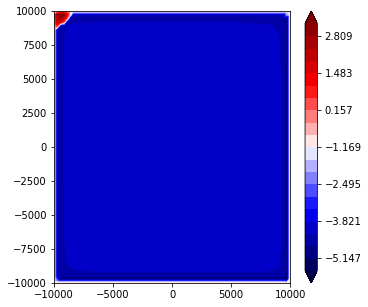

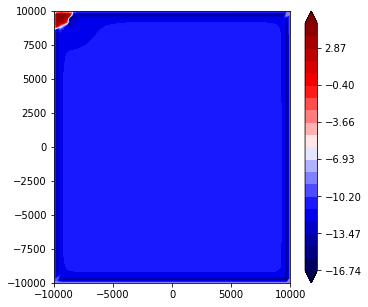

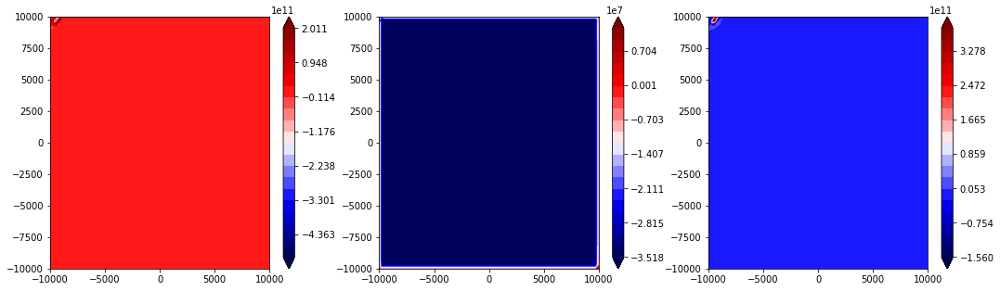

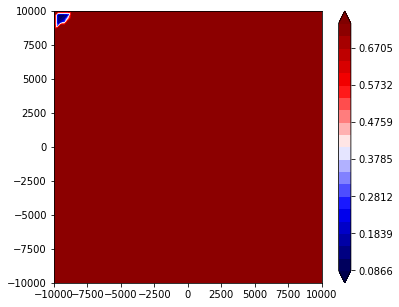

8201 2.61609239794
8202 2.61609239794
8203 2.61609239794
8204 2.61609239794
8205 2.61609239794
8206 2.61609239794
8207 2.61609239794
8208 2.61609239794
8209 2.61609239794
8210 2.61609239794
8211 2.61609239794
8212 2.61609239794
8213 2.61609239794
8214 2.61609239794
8215 2.61609239794
8216 2.61609239794
8217 2.61609239794
8218 2.61609239794
8219 2.61609239794
8220 2.61609239794
8221 2.61609239794
8222 2.61609239794
8223 2.61609239794
8224 2.61609239794
8225 2.61609239794
8226 2.61609239794
8227 2.61609239794
8228 2.61609239794
8229 2.61609239794
8230 2.61609239794
8231 2.61609239794
8232 2.61609239794
8233 2.61609239794
8234 2.61609239794
8235 2.61609239794
8236 2.61609239794
8237 2.61609239794
8238 2.61609239794
8239 2.61609239794
8240 2.61609239794
8241 2.61609239794
8242 2.61609239794
8243 2.61609239794
8244 2.61609239794
8245 2.61609239794
8246 2.61609239794
8247 2.61609239794
8248 2.61609239794
8249 2.61609239794
8250 2.61609239794
8251 2.61609239794
8252 2.61609239794
8253 2.61609

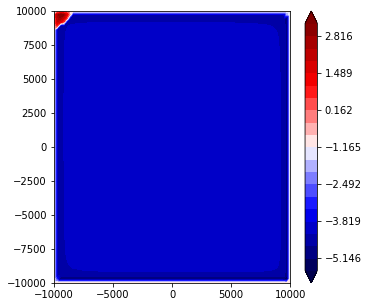

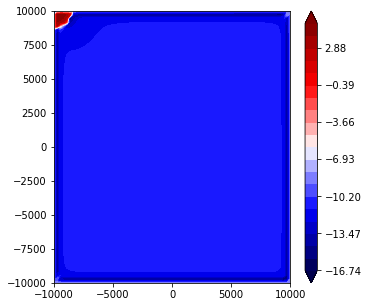

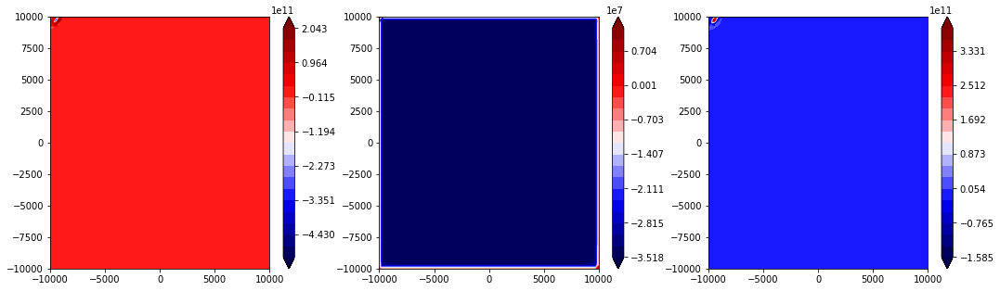

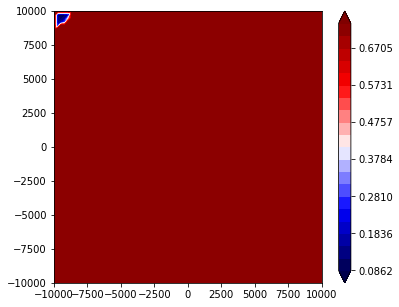

8301 2.61609239795
8302 2.61609239795
8303 2.61609239795
8304 2.61609239795
8305 2.61609239795
8306 2.61609239795
8307 2.61609239795
8308 2.61609239795
8309 2.61609239795
8310 2.61609239795
8311 2.61609239795
8312 2.61609239795
8313 2.61609239795
8314 2.61609239795
8315 2.61609239795
8316 2.61609239795
8317 2.61609239795
8318 2.61609239795
8319 2.61609239795
8320 2.61609239795
8321 2.61609239795
8322 2.61609239795
8323 2.61609239795
8324 2.61609239795
8325 2.61609239795
8326 2.61609239795
8327 2.61609239795
8328 2.61609239795
8329 2.61609239795
8330 2.61609239795
8331 2.61609239795
8332 2.61609239795
8333 2.61609239795
8334 2.61609239795
8335 2.61609239795
8336 2.61609239795
8337 2.61609239795
8338 2.61609239795
8339 2.61609239795
8340 2.61609239795
8341 2.61609239795
8342 2.61609239795
8343 2.61609239795
8344 2.61609239795
8345 2.61609239795
8346 2.61609239795
8347 2.61609239795
8348 2.61609239795
8349 2.61609239795
8350 2.61609239795
8351 2.61609239795
8352 2.61609239795
8353 2.61609

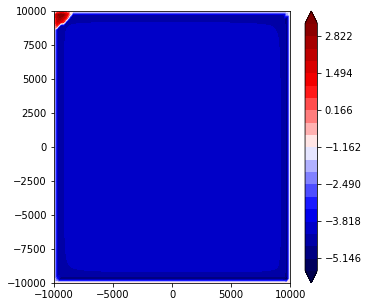

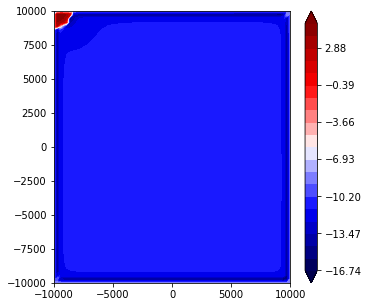

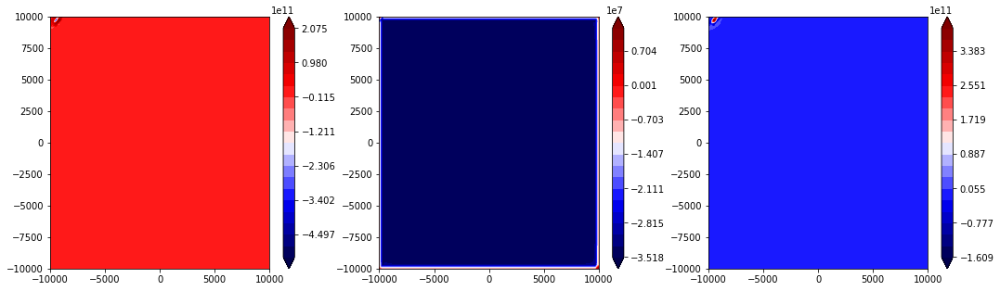

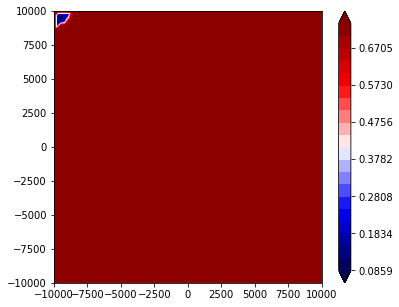

8401 2.61609239795
8402 2.61609239795
8403 2.61609239795
8404 2.61609239795
8405 2.61609239795
8406 2.61609239795
8407 2.61609239795
8408 2.61609239795
8409 2.61609239795
8410 2.61609239795
8411 2.61609239795
8412 2.61609239796
8413 2.61609239796
8414 2.61609239796
8415 2.61609239796
8416 2.61609239796
8417 2.61609239796
8418 2.61609239796
8419 2.61609239796
8420 2.61609239796
8421 2.61609239796
8422 2.61609239796
8423 2.61609239796
8424 2.61609239796
8425 2.61609239796
8426 2.61609239796
8427 2.61609239796
8428 2.61609239796
8429 2.61609239796
8430 2.61609239796
8431 2.61609239796
8432 2.61609239796
8433 2.61609239796
8434 2.61609239796
8435 2.61609239796
8436 2.61609239796
8437 2.61609239796
8438 2.61609239796
8439 2.61609239796
8440 2.61609239796
8441 2.61609239796
8442 2.61609239796
8443 2.61609239796
8444 2.61609239796
8445 2.61609239796
8446 2.61609239796
8447 2.61609239796
8448 2.61609239796
8449 2.61609239796
8450 2.61609239796
8451 2.61609239796
8452 2.61609239796
8453 2.61609

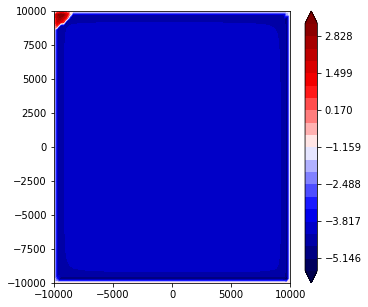

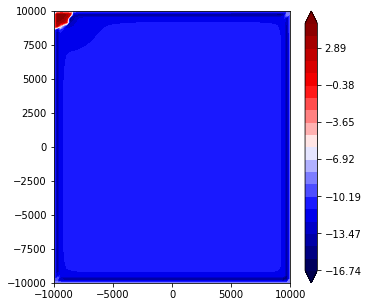

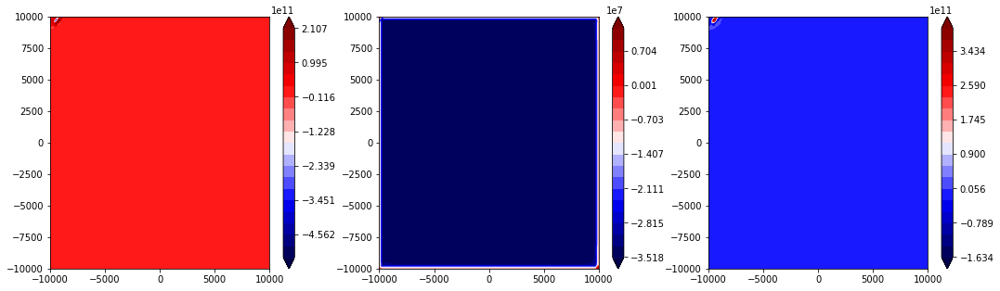

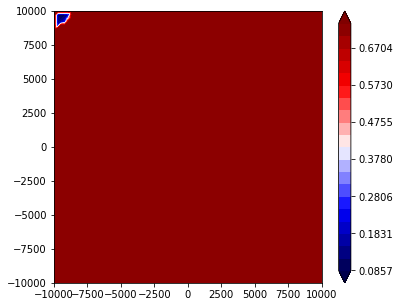

8501 2.61609239796
8502 2.61609239796
8503 2.61609239796
8504 2.61609239796
8505 2.61609239796
8506 2.61609239796
8507 2.61609239796
8508 2.61609239796
8509 2.61609239796
8510 2.61609239796
8511 2.61609239796
8512 2.61609239796
8513 2.61609239796
8514 2.61609239796
8515 2.61609239796
8516 2.61609239796
8517 2.61609239796
8518 2.61609239796
8519 2.61609239796
8520 2.61609239796
8521 2.61609239796
8522 2.61609239796
8523 2.61609239796
8524 2.61609239796
8525 2.61609239796
8526 2.61609239796
8527 2.61609239796
8528 2.61609239796
8529 2.61609239796
8530 2.61609239796
8531 2.61609239796
8532 2.61609239796
8533 2.61609239796
8534 2.61609239796
8535 2.61609239796
8536 2.61609239796
8537 2.61609239796
8538 2.61609239796
8539 2.61609239796
8540 2.61609239796
8541 2.61609239796
8542 2.61609239796
8543 2.61609239796
8544 2.61609239796
8545 2.61609239796
8546 2.61609239796
8547 2.61609239796
8548 2.61609239796
8549 2.61609239796
8550 2.61609239796
8551 2.61609239797
8552 2.61609239797
8553 2.61609

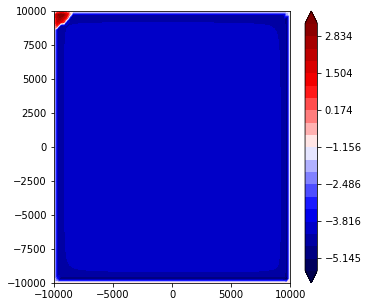

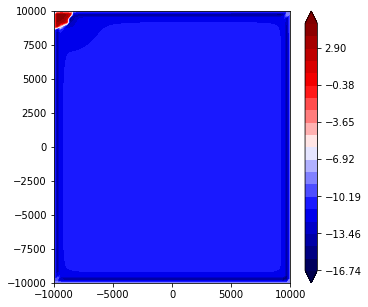

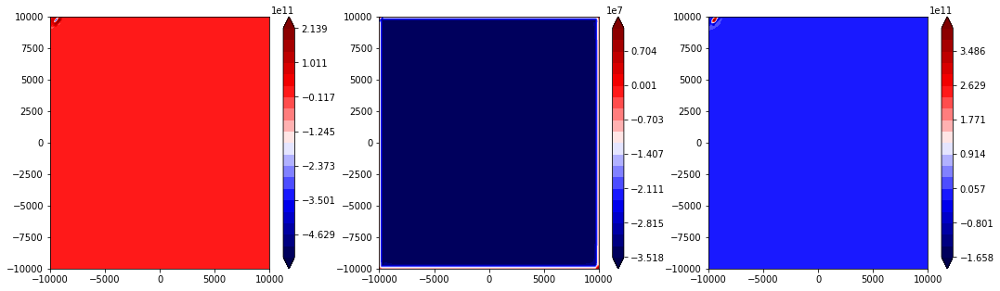

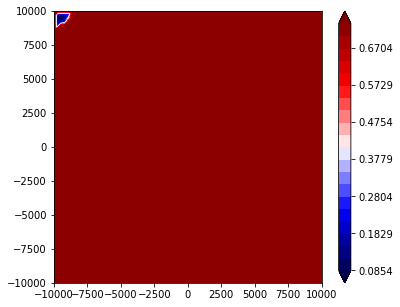

8601 2.61609239797
8602 2.61609239797
8603 2.61609239797
8604 2.61609239797
8605 2.61609239797
8606 2.61609239797
8607 2.61609239797
8608 2.61609239797
8609 2.61609239797
8610 2.61609239797
8611 2.61609239797
8612 2.61609239797
8613 2.61609239797
8614 2.61609239797
8615 2.61609239797
8616 2.61609239797
8617 2.61609239797
8618 2.61609239797
8619 2.61609239797
8620 2.61609239797
8621 2.61609239797
8622 2.61609239797
8623 2.61609239797
8624 2.61609239797
8625 2.61609239797
8626 2.61609239797
8627 2.61609239797
8628 2.61609239797
8629 2.61609239797
8630 2.61609239797
8631 2.61609239797
8632 2.61609239797
8633 2.61609239797
8634 2.61609239797
8635 2.61609239797
8636 2.61609239797
8637 2.61609239797
8638 2.61609239797
8639 2.61609239797
8640 2.61609239797
8641 2.61609239797
8642 2.61609239797
8643 2.61609239797
8644 2.61609239797
8645 2.61609239797
8646 2.61609239797
8647 2.61609239797
8648 2.61609239797
8649 2.61609239797
8650 2.61609239797
8651 2.61609239797
8652 2.61609239797
8653 2.61609

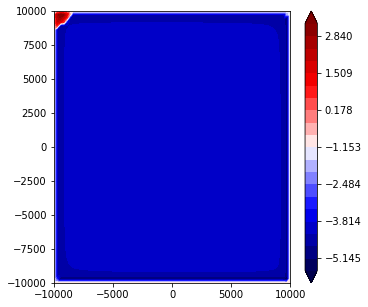

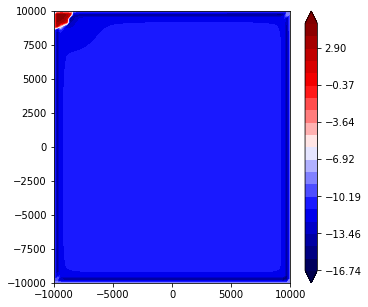

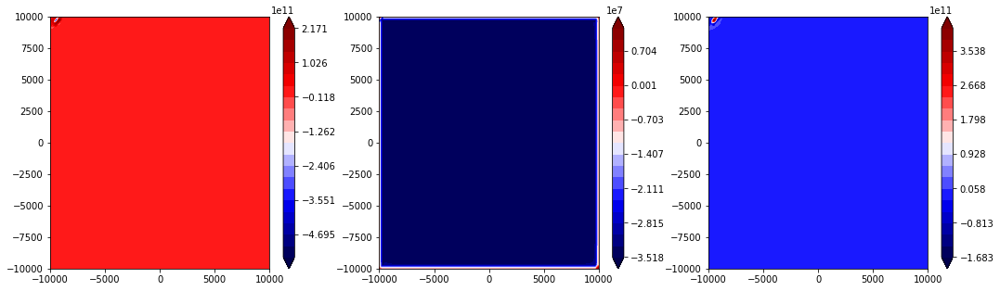

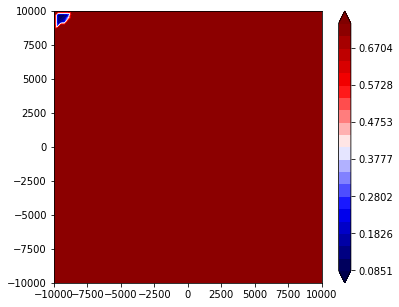

8701 2.61609239798
8702 2.61609239798
8703 2.61609239798
8704 2.61609239798
8705 2.61609239798
8706 2.61609239798
8707 2.61609239798
8708 2.61609239798
8709 2.61609239798
8710 2.61609239798
8711 2.61609239798
8712 2.61609239798
8713 2.61609239798
8714 2.61609239798
8715 2.61609239798
8716 2.61609239798
8717 2.61609239798
8718 2.61609239798
8719 2.61609239798
8720 2.61609239798
8721 2.61609239798
8722 2.61609239798
8723 2.61609239798
8724 2.61609239798
8725 2.61609239798
8726 2.61609239798
8727 2.61609239798
8728 2.61609239798
8729 2.61609239798
8730 2.61609239798
8731 2.61609239798
8732 2.61609239798
8733 2.61609239798
8734 2.61609239798
8735 2.61609239798
8736 2.61609239798
8737 2.61609239798
8738 2.61609239798
8739 2.61609239798
8740 2.61609239798
8741 2.61609239798
8742 2.61609239798
8743 2.61609239798
8744 2.61609239798
8745 2.61609239798
8746 2.61609239798
8747 2.61609239798
8748 2.61609239798
8749 2.61609239798
8750 2.61609239798
8751 2.61609239798
8752 2.61609239798
8753 2.61609

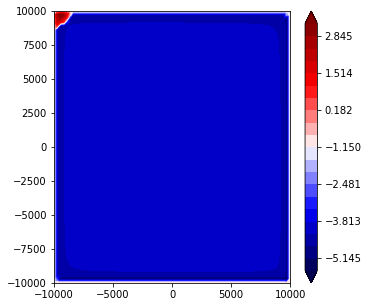

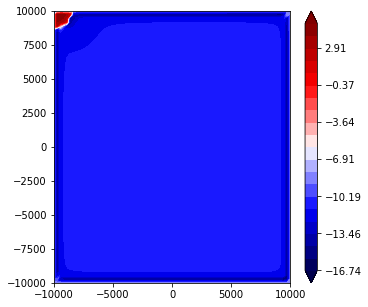

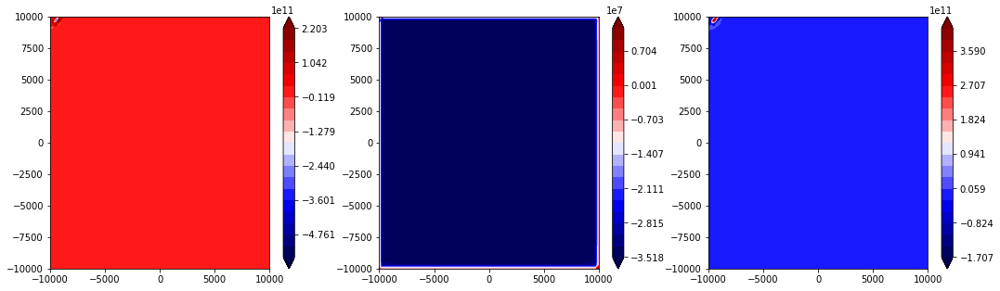

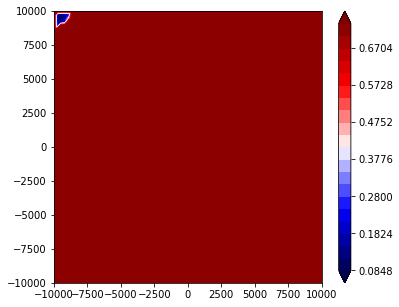

8801 2.61609239798
8802 2.61609239798
8803 2.61609239798
8804 2.61609239798
8805 2.61609239798
8806 2.61609239798
8807 2.61609239798
8808 2.61609239798
8809 2.61609239798
8810 2.61609239798
8811 2.61609239798
8812 2.61609239798
8813 2.61609239798
8814 2.61609239798
8815 2.61609239798
8816 2.61609239798
8817 2.61609239798
8818 2.61609239798
8819 2.61609239798
8820 2.61609239798
8821 2.61609239798
8822 2.61609239798
8823 2.61609239798
8824 2.61609239798
8825 2.61609239798
8826 2.61609239798
8827 2.61609239798
8828 2.61609239798
8829 2.61609239798
8830 2.61609239798
8831 2.61609239798
8832 2.61609239798
8833 2.61609239798
8834 2.61609239799
8835 2.61609239799
8836 2.61609239799
8837 2.61609239799
8838 2.61609239799
8839 2.61609239799
8840 2.61609239799
8841 2.61609239799
8842 2.61609239799
8843 2.61609239799
8844 2.61609239799
8845 2.61609239799
8846 2.61609239799
8847 2.61609239799
8848 2.61609239799
8849 2.61609239799
8850 2.61609239799
8851 2.61609239799
8852 2.61609239799
8853 2.61609

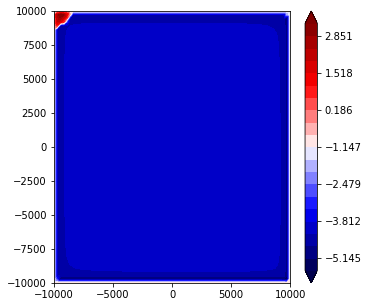

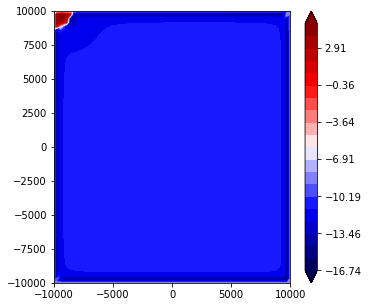

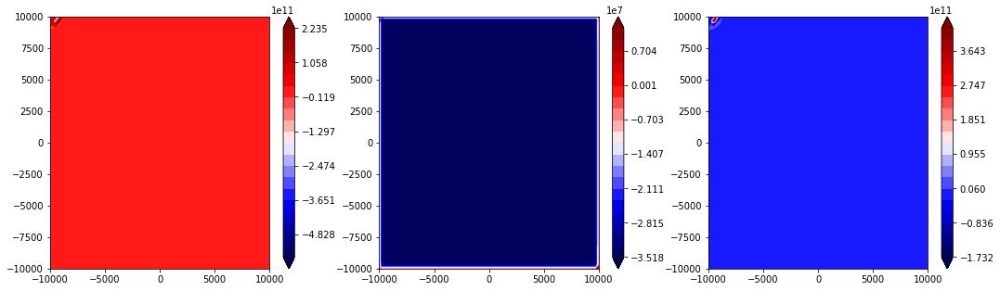

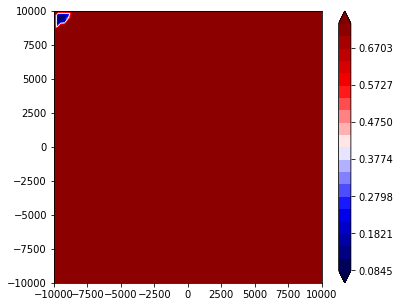

8901 2.61609239799
8902 2.61609239799
8903 2.61609239799
8904 2.61609239799
8905 2.61609239799
8906 2.61609239799
8907 2.61609239799
8908 2.61609239799
8909 2.61609239799
8910 2.61609239799
8911 2.61609239799
8912 2.61609239799
8913 2.61609239799
8914 2.61609239799
8915 2.61609239799
8916 2.61609239799
8917 2.61609239799
8918 2.61609239799
8919 2.61609239799
8920 2.61609239799
8921 2.61609239799
8922 2.61609239799
8923 2.61609239799
8924 2.61609239799
8925 2.61609239799
8926 2.61609239799
8927 2.61609239799
8928 2.61609239799
8929 2.61609239799
8930 2.61609239799
8931 2.61609239799
8932 2.61609239799
8933 2.61609239799
8934 2.61609239799
8935 2.61609239799
8936 2.61609239799
8937 2.61609239799
8938 2.61609239799
8939 2.61609239799
8940 2.61609239799
8941 2.61609239799
8942 2.61609239799
8943 2.61609239799
8944 2.61609239799
8945 2.61609239799
8946 2.61609239799
8947 2.61609239799
8948 2.61609239799
8949 2.61609239799
8950 2.61609239799
8951 2.61609239799
8952 2.61609239799
8953 2.61609

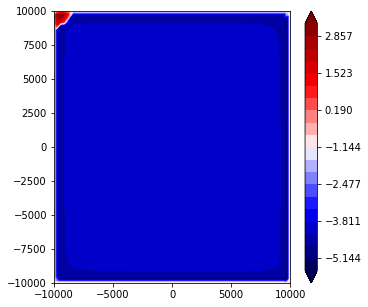

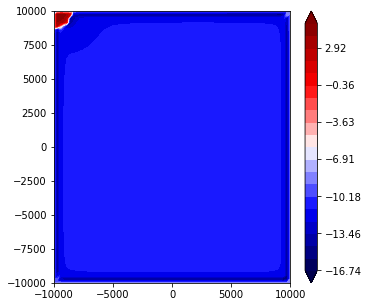

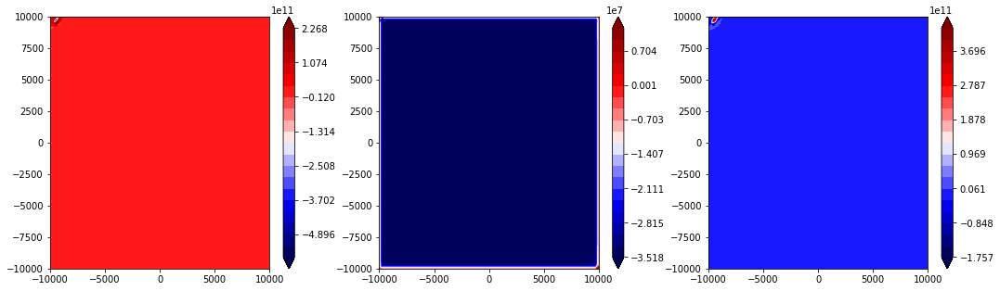

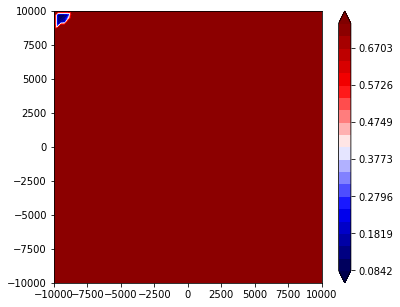

9001 2.616092398
9002 2.616092398
9003 2.616092398
9004 2.616092398
9005 2.616092398
9006 2.616092398
9007 2.616092398
9008 2.616092398
9009 2.616092398
9010 2.616092398
9011 2.616092398
9012 2.616092398
9013 2.616092398
9014 2.616092398
9015 2.616092398
9016 2.616092398
9017 2.616092398
9018 2.616092398
9019 2.616092398
9020 2.616092398
9021 2.616092398
9022 2.616092398
9023 2.616092398
9024 2.616092398
9025 2.616092398
9026 2.616092398
9027 2.616092398
9028 2.616092398
9029 2.616092398
9030 2.616092398
9031 2.616092398
9032 2.616092398
9033 2.616092398
9034 2.616092398
9035 2.616092398
9036 2.616092398
9037 2.616092398
9038 2.616092398
9039 2.616092398
9040 2.616092398
9041 2.616092398
9042 2.616092398
9043 2.616092398
9044 2.616092398
9045 2.616092398
9046 2.616092398
9047 2.616092398
9048 2.616092398
9049 2.616092398
9050 2.616092398
9051 2.616092398
9052 2.616092398
9053 2.616092398
9054 2.616092398
9055 2.616092398
9056 2.616092398
9057 2.616092398
9058 2.616092398
9059 2.6160923

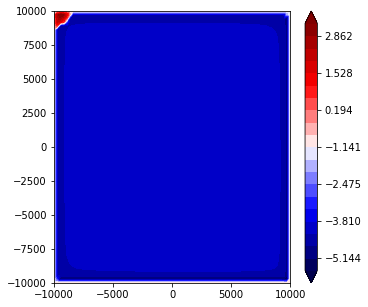

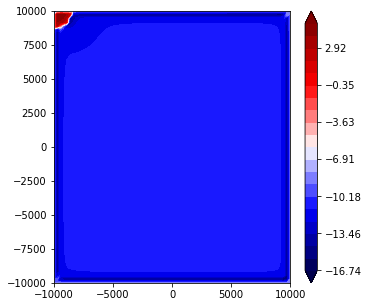

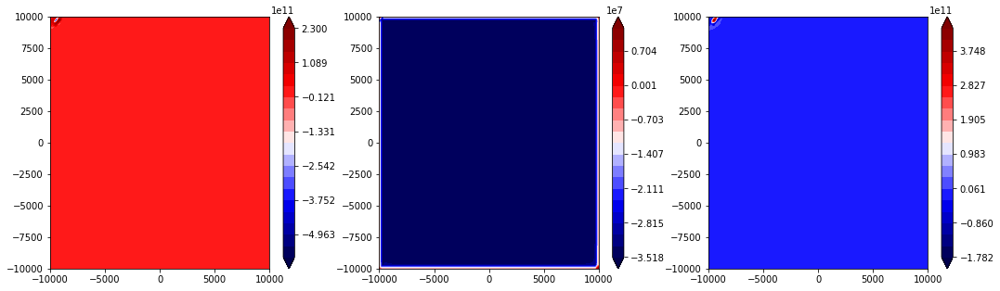

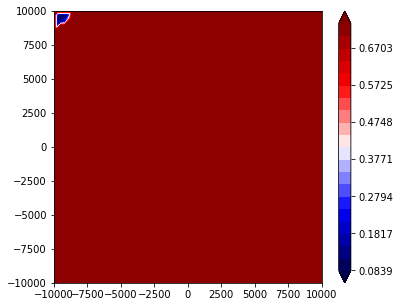

9101 2.616092398
9102 2.616092398
9103 2.616092398
9104 2.616092398
9105 2.616092398
9106 2.616092398
9107 2.616092398
9108 2.616092398
9109 2.616092398
9110 2.616092398
9111 2.616092398
9112 2.616092398
9113 2.616092398
9114 2.616092398
9115 2.616092398
9116 2.616092398
9117 2.616092398
9118 2.616092398
9119 2.616092398
9120 2.616092398
9121 2.616092398
9122 2.616092398
9123 2.616092398
9124 2.616092398
9125 2.616092398
9126 2.61609239801
9127 2.61609239801
9128 2.61609239801
9129 2.61609239801
9130 2.61609239801
9131 2.61609239801
9132 2.61609239801
9133 2.61609239801
9134 2.61609239801
9135 2.61609239801
9136 2.61609239801
9137 2.61609239801
9138 2.61609239801
9139 2.61609239801
9140 2.61609239801
9141 2.61609239801
9142 2.61609239801
9143 2.61609239801
9144 2.61609239801
9145 2.61609239801
9146 2.61609239801
9147 2.61609239801
9148 2.61609239801
9149 2.61609239801
9150 2.61609239801
9151 2.61609239801
9152 2.61609239801
9153 2.61609239801
9154 2.61609239801
9155 2.61609239801
9156 

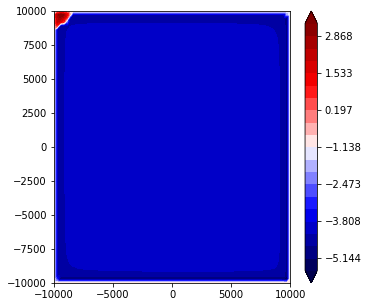

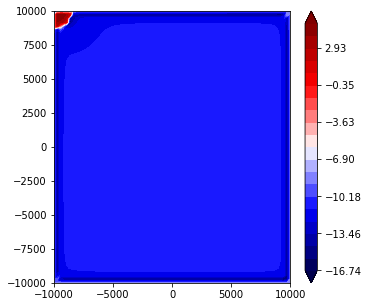

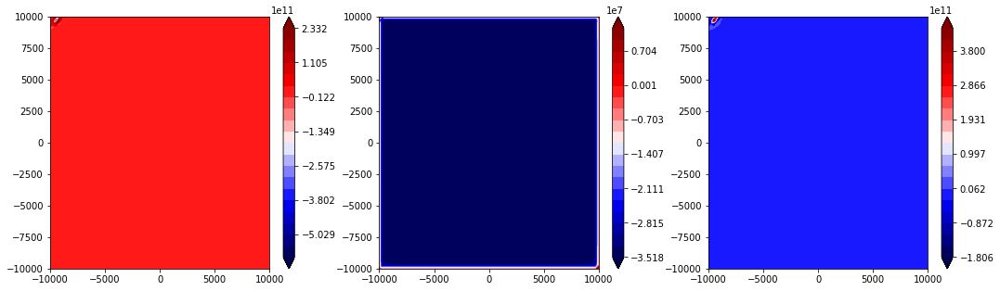

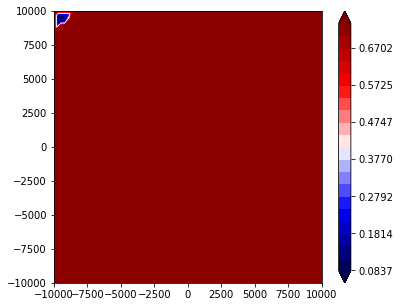

9201 2.61609239801
9202 2.61609239801
9203 2.61609239801
9204 2.61609239801
9205 2.61609239801
9206 2.61609239801
9207 2.61609239801
9208 2.61609239801
9209 2.61609239801
9210 2.61609239801
9211 2.61609239801
9212 2.61609239801
9213 2.61609239801
9214 2.61609239801
9215 2.61609239801
9216 2.61609239801
9217 2.61609239801
9218 2.61609239801
9219 2.61609239801
9220 2.61609239801
9221 2.61609239801
9222 2.61609239801
9223 2.61609239801
9224 2.61609239801
9225 2.61609239801
9226 2.61609239801
9227 2.61609239801
9228 2.61609239801
9229 2.61609239801
9230 2.61609239801
9231 2.61609239801
9232 2.61609239801
9233 2.61609239801
9234 2.61609239801
9235 2.61609239801
9236 2.61609239801
9237 2.61609239801
9238 2.61609239801
9239 2.61609239801
9240 2.61609239801
9241 2.61609239801
9242 2.61609239801
9243 2.61609239801
9244 2.61609239801
9245 2.61609239801
9246 2.61609239801
9247 2.61609239801
9248 2.61609239801
9249 2.61609239801
9250 2.61609239801
9251 2.61609239801
9252 2.61609239801
9253 2.61609

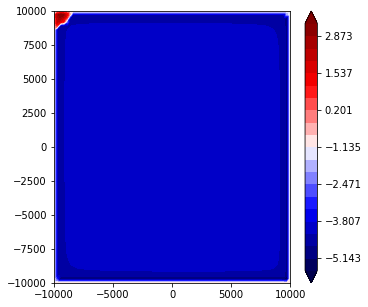

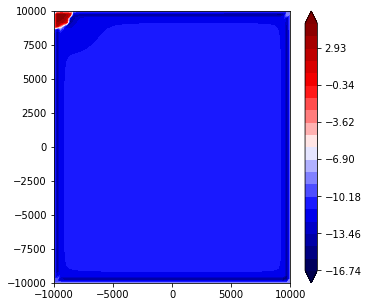

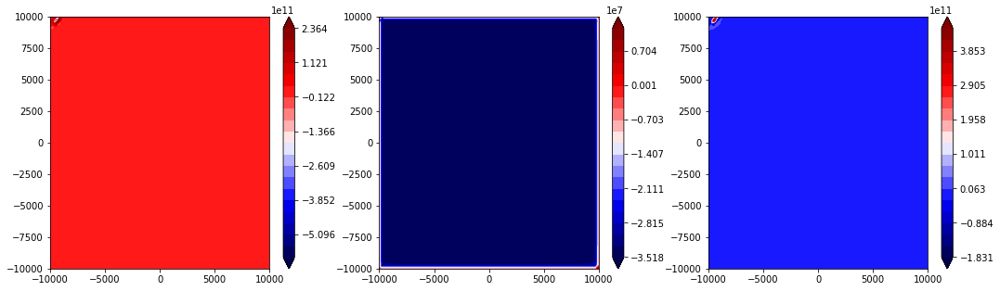

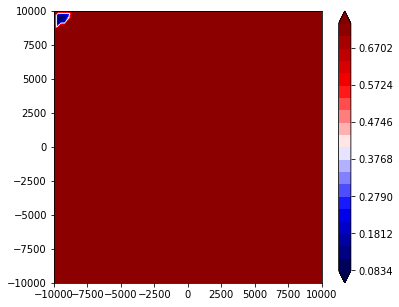

9301 2.61609239802
9302 2.61609239802
9303 2.61609239802
9304 2.61609239802
9305 2.61609239802
9306 2.61609239802
9307 2.61609239802
9308 2.61609239802
9309 2.61609239802
9310 2.61609239802
9311 2.61609239802
9312 2.61609239802
9313 2.61609239802
9314 2.61609239802
9315 2.61609239802
9316 2.61609239802
9317 2.61609239802
9318 2.61609239802
9319 2.61609239802
9320 2.61609239802
9321 2.61609239802
9322 2.61609239802
9323 2.61609239802
9324 2.61609239802
9325 2.61609239802
9326 2.61609239802
9327 2.61609239802
9328 2.61609239802
9329 2.61609239802
9330 2.61609239802
9331 2.61609239802
9332 2.61609239802
9333 2.61609239802
9334 2.61609239802
9335 2.61609239802
9336 2.61609239802
9337 2.61609239802
9338 2.61609239802
9339 2.61609239802
9340 2.61609239802
9341 2.61609239802
9342 2.61609239802
9343 2.61609239802
9344 2.61609239802
9345 2.61609239802
9346 2.61609239802
9347 2.61609239802
9348 2.61609239802
9349 2.61609239802
9350 2.61609239802
9351 2.61609239802
9352 2.61609239802
9353 2.61609

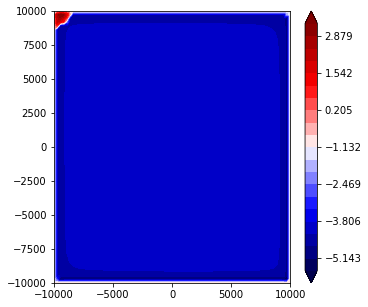

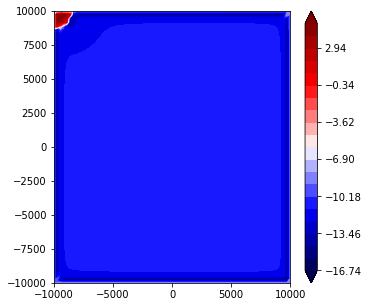

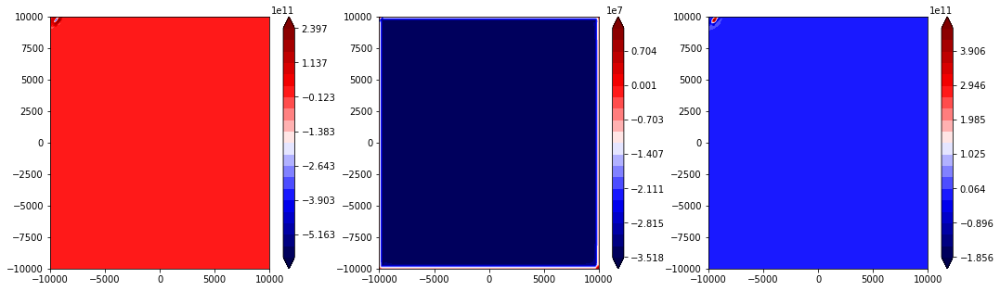

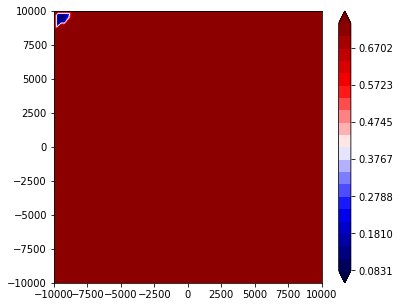

9401 2.61609239802
9402 2.61609239802
9403 2.61609239802
9404 2.61609239802
9405 2.61609239802
9406 2.61609239802
9407 2.61609239802
9408 2.61609239802
9409 2.61609239802
9410 2.61609239802
9411 2.61609239802
9412 2.61609239802
9413 2.61609239802
9414 2.61609239802
9415 2.61609239802
9416 2.61609239802
9417 2.61609239802
9418 2.61609239802
9419 2.61609239802
9420 2.61609239802
9421 2.61609239802
9422 2.61609239802
9423 2.61609239802
9424 2.61609239802
9425 2.61609239802
9426 2.61609239802
9427 2.61609239802
9428 2.61609239802
9429 2.61609239802
9430 2.61609239803
9431 2.61609239803
9432 2.61609239803
9433 2.61609239803
9434 2.61609239803
9435 2.61609239803
9436 2.61609239803
9437 2.61609239803
9438 2.61609239803
9439 2.61609239803
9440 2.61609239803
9441 2.61609239803
9442 2.61609239803
9443 2.61609239803
9444 2.61609239803
9445 2.61609239803
9446 2.61609239803
9447 2.61609239803
9448 2.61609239803
9449 2.61609239803
9450 2.61609239803
9451 2.61609239803
9452 2.61609239803
9453 2.61609

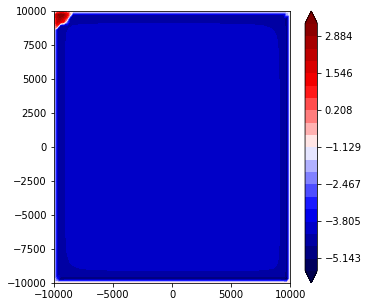

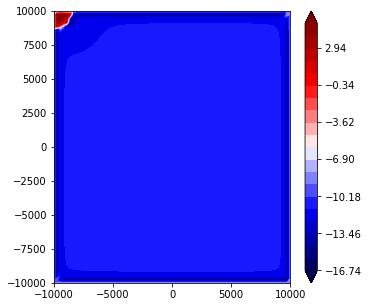

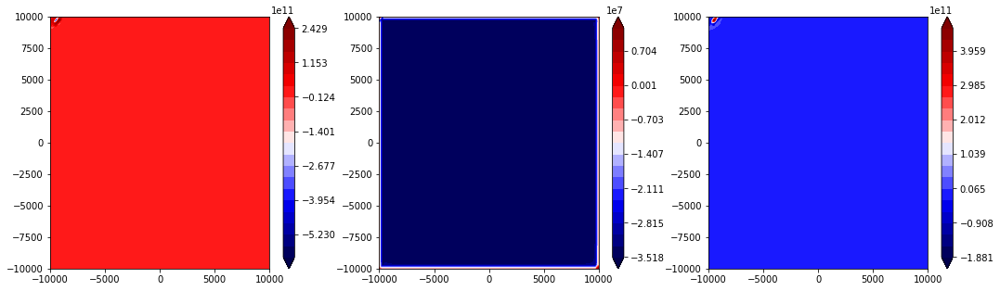

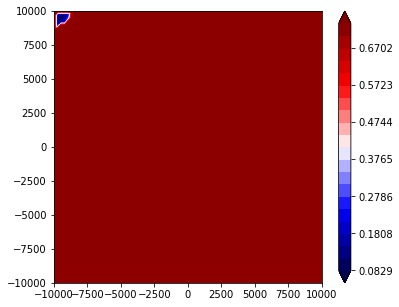

9501 2.61609239803
9502 2.61609239803
9503 2.61609239803
9504 2.61609239803
9505 2.61609239803
9506 2.61609239803
9507 2.61609239803
9508 2.61609239803
9509 2.61609239803
9510 2.61609239803
9511 2.61609239803
9512 2.61609239803
9513 2.61609239803
9514 2.61609239803
9515 2.61609239803
9516 2.61609239803
9517 2.61609239803
9518 2.61609239803
9519 2.61609239803
9520 2.61609239803
9521 2.61609239803
9522 2.61609239803
9523 2.61609239803
9524 2.61609239803
9525 2.61609239803
9526 2.61609239803
9527 2.61609239803
9528 2.61609239803
9529 2.61609239803
9530 2.61609239803
9531 2.61609239803
9532 2.61609239803
9533 2.61609239803
9534 2.61609239803
9535 2.61609239803
9536 2.61609239803
9537 2.61609239803
9538 2.61609239803
9539 2.61609239803
9540 2.61609239803
9541 2.61609239803
9542 2.61609239803
9543 2.61609239803
9544 2.61609239803
9545 2.61609239803
9546 2.61609239803
9547 2.61609239803
9548 2.61609239803
9549 2.61609239803
9550 2.61609239803
9551 2.61609239803
9552 2.61609239803
9553 2.61609

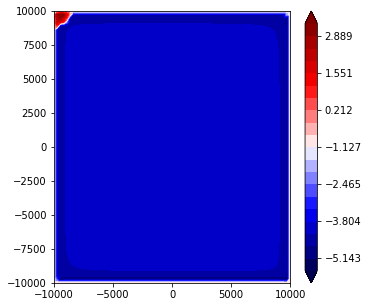

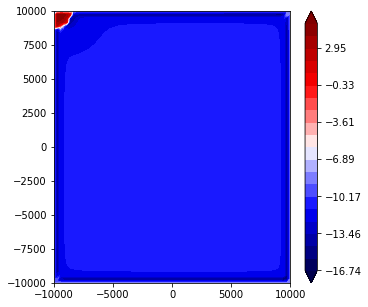

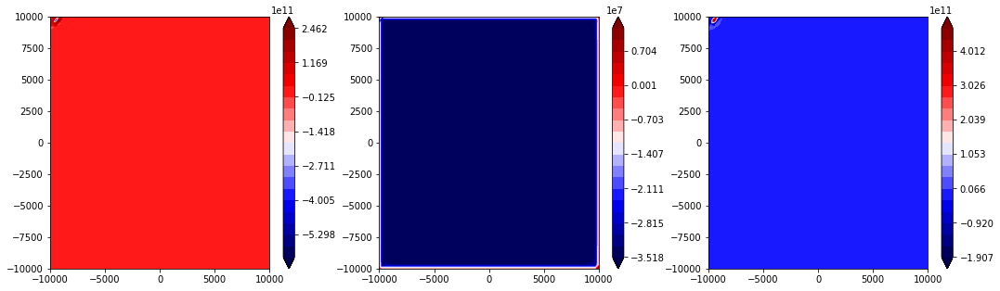

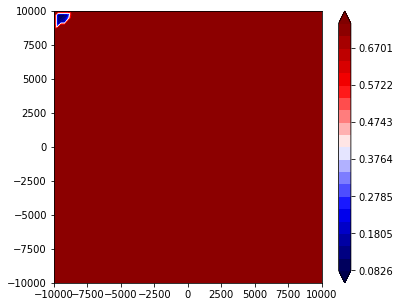

9601 2.61609239804
9602 2.61609239804
9603 2.61609239804
9604 2.61609239804
9605 2.61609239804
9606 2.61609239804
9607 2.61609239804
9608 2.61609239804
9609 2.61609239804
9610 2.61609239804
9611 2.61609239804
9612 2.61609239804
9613 2.61609239804
9614 2.61609239804
9615 2.61609239804
9616 2.61609239804
9617 2.61609239804
9618 2.61609239804
9619 2.61609239804
9620 2.61609239804
9621 2.61609239804
9622 2.61609239804
9623 2.61609239804
9624 2.61609239804
9625 2.61609239804
9626 2.61609239804
9627 2.61609239804
9628 2.61609239804
9629 2.61609239804
9630 2.61609239804
9631 2.61609239804
9632 2.61609239804
9633 2.61609239804
9634 2.61609239804
9635 2.61609239804
9636 2.61609239804
9637 2.61609239804
9638 2.61609239804
9639 2.61609239804
9640 2.61609239804
9641 2.61609239804
9642 2.61609239804
9643 2.61609239804
9644 2.61609239804
9645 2.61609239804
9646 2.61609239804
9647 2.61609239804
9648 2.61609239804
9649 2.61609239804
9650 2.61609239804
9651 2.61609239804
9652 2.61609239804
9653 2.61609

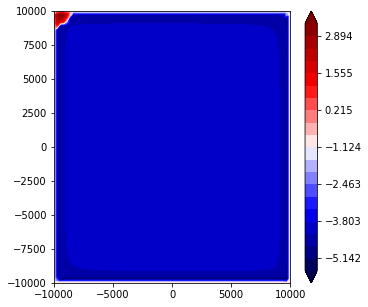

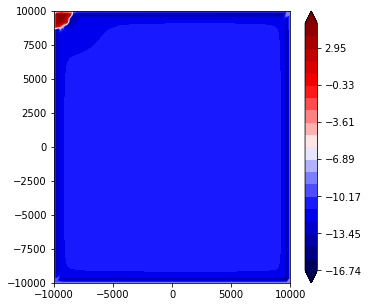

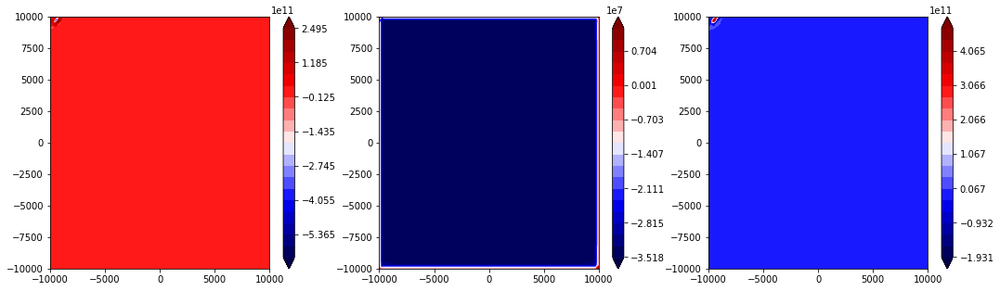

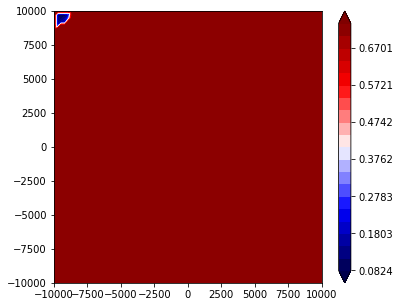

9701 2.61609239804
9702 2.61609239804
9703 2.61609239804
9704 2.61609239804
9705 2.61609239804
9706 2.61609239804
9707 2.61609239804
9708 2.61609239804
9709 2.61609239804
9710 2.61609239804
9711 2.61609239804
9712 2.61609239804
9713 2.61609239804
9714 2.61609239804
9715 2.61609239804
9716 2.61609239804
9717 2.61609239804
9718 2.61609239804
9719 2.61609239804
9720 2.61609239804
9721 2.61609239804
9722 2.61609239804
9723 2.61609239804
9724 2.61609239804
9725 2.61609239804
9726 2.61609239804
9727 2.61609239804
9728 2.61609239804
9729 2.61609239804
9730 2.61609239804
9731 2.61609239804
9732 2.61609239804
9733 2.61609239804
9734 2.61609239804
9735 2.61609239804
9736 2.61609239804
9737 2.61609239804
9738 2.61609239804
9739 2.61609239804
9740 2.61609239804
9741 2.61609239804
9742 2.61609239804
9743 2.61609239804
9744 2.61609239804
9745 2.61609239804
9746 2.61609239805
9747 2.61609239805
9748 2.61609239805
9749 2.61609239805
9750 2.61609239805
9751 2.61609239805
9752 2.61609239805
9753 2.61609

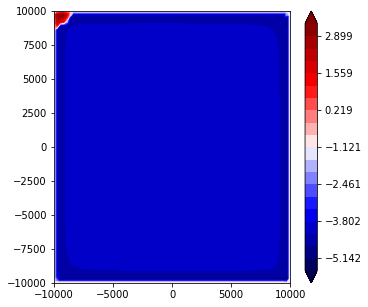

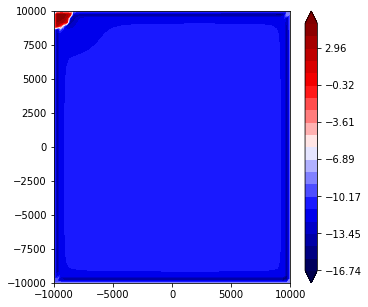

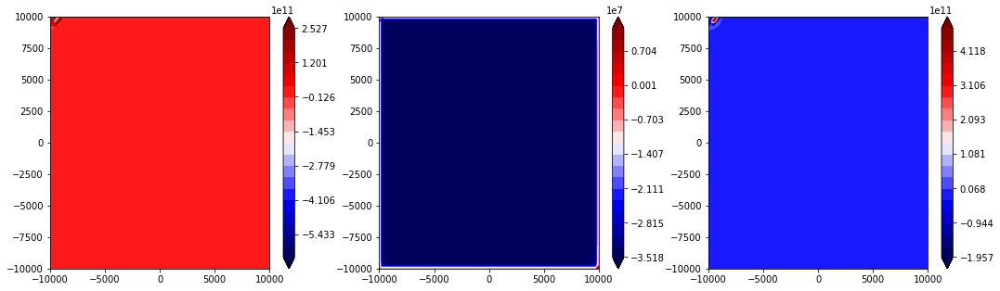

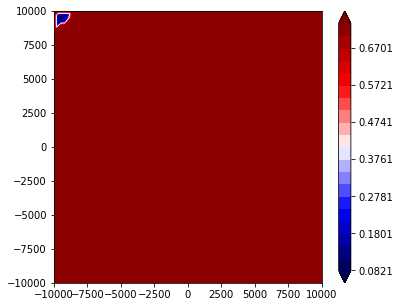

9801 2.61609239805
9802 2.61609239805
9803 2.61609239805
9804 2.61609239805
9805 2.61609239805
9806 2.61609239805
9807 2.61609239805
9808 2.61609239805
9809 2.61609239805
9810 2.61609239805
9811 2.61609239805
9812 2.61609239805
9813 2.61609239805
9814 2.61609239805
9815 2.61609239805
9816 2.61609239805
9817 2.61609239805
9818 2.61609239805
9819 2.61609239805
9820 2.61609239805
9821 2.61609239805
9822 2.61609239805
9823 2.61609239805
9824 2.61609239805
9825 2.61609239805
9826 2.61609239805
9827 2.61609239805
9828 2.61609239805
9829 2.61609239805
9830 2.61609239805
9831 2.61609239805
9832 2.61609239805
9833 2.61609239805
9834 2.61609239805
9835 2.61609239805
9836 2.61609239805
9837 2.61609239805
9838 2.61609239805
9839 2.61609239805
9840 2.61609239805
9841 2.61609239805
9842 2.61609239805
9843 2.61609239805
9844 2.61609239805
9845 2.61609239805
9846 2.61609239805
9847 2.61609239805
9848 2.61609239805
9849 2.61609239805
9850 2.61609239805
9851 2.61609239805
9852 2.61609239805
9853 2.61609

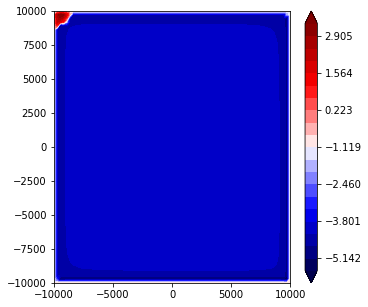

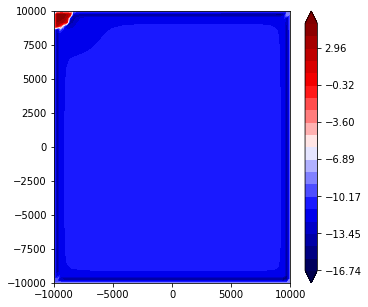

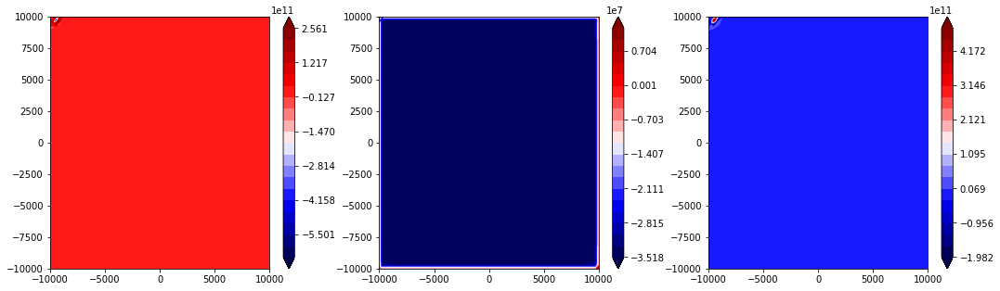

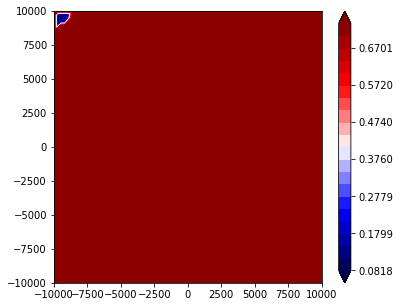

9901 2.61609239805
9902 2.61609239805
9903 2.61609239805
9904 2.61609239805
9905 2.61609239806
9906 2.61609239806
9907 2.61609239806
9908 2.61609239806
9909 2.61609239806
9910 2.61609239806
9911 2.61609239806
9912 2.61609239806
9913 2.61609239806
9914 2.61609239806
9915 2.61609239806
9916 2.61609239806
9917 2.61609239806
9918 2.61609239806
9919 2.61609239806
9920 2.61609239806
9921 2.61609239806
9922 2.61609239806
9923 2.61609239806
9924 2.61609239806
9925 2.61609239806
9926 2.61609239806
9927 2.61609239806
9928 2.61609239806
9929 2.61609239806
9930 2.61609239806
9931 2.61609239806
9932 2.61609239806
9933 2.61609239806
9934 2.61609239806
9935 2.61609239806
9936 2.61609239806
9937 2.61609239806
9938 2.61609239806
9939 2.61609239806
9940 2.61609239806
9941 2.61609239806
9942 2.61609239806
9943 2.61609239806
9944 2.61609239806
9945 2.61609239806
9946 2.61609239806
9947 2.61609239806
9948 2.61609239806
9949 2.61609239806
9950 2.61609239806
9951 2.61609239806
9952 2.61609239806
9953 2.61609

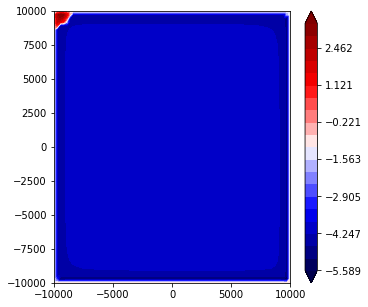

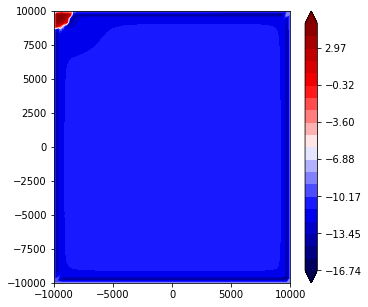

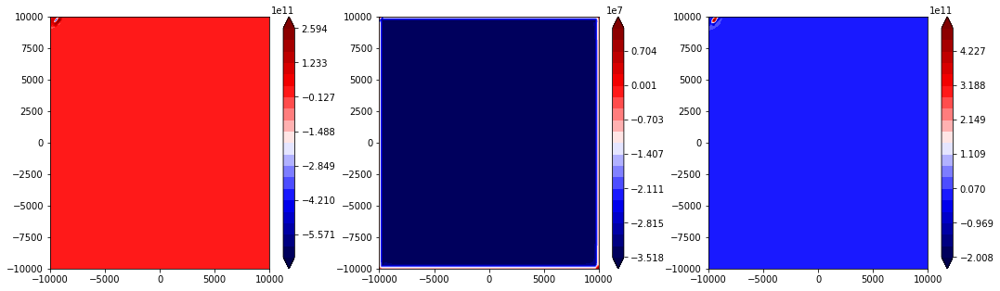

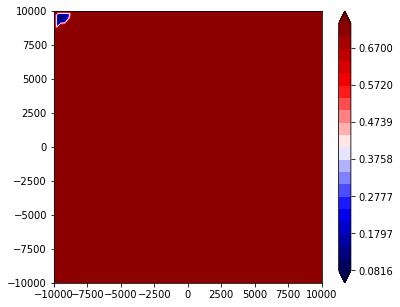

10001 2.61609239806
10002 2.61609239806
10003 2.61609239806
10004 2.61609239806
10005 2.61609239806
10006 2.61609239806
10007 2.61609239806
10008 2.61609239806
10009 2.61609239806
10010 2.61609239806
10011 2.61609239806
10012 2.61609239806
10013 2.61609239806
10014 2.61609239806
10015 2.61609239806
10016 2.61609239806
10017 2.61609239806
10018 2.61609239806
10019 2.61609239806
10020 2.61609239806
10021 2.61609239806
10022 2.61609239806
10023 2.61609239806
10024 2.61609239806
10025 2.61609239806
10026 2.61609239806
10027 2.61609239806
10028 2.61609239806
10029 2.61609239806
10030 2.61609239806
10031 2.61609239806
10032 2.61609239806
10033 2.61609239806
10034 2.61609239806
10035 2.61609239806
10036 2.61609239806
10037 2.61609239806
10038 2.61609239806
10039 2.61609239806
10040 2.61609239806
10041 2.61609239806
10042 2.61609239806
10043 2.61609239806
10044 2.61609239806
10045 2.61609239806
10046 2.61609239806
10047 2.61609239806
10048 2.61609239806
10049 2.61609239806
10050 2.61609239806


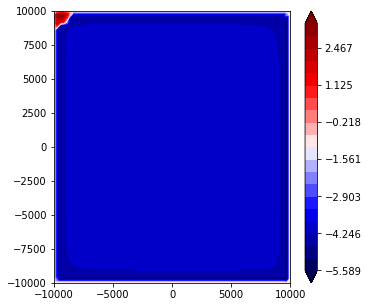

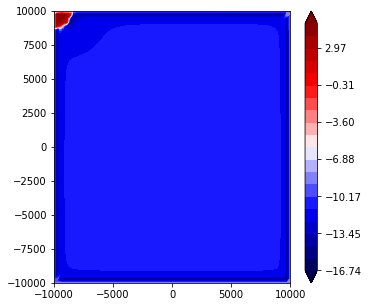

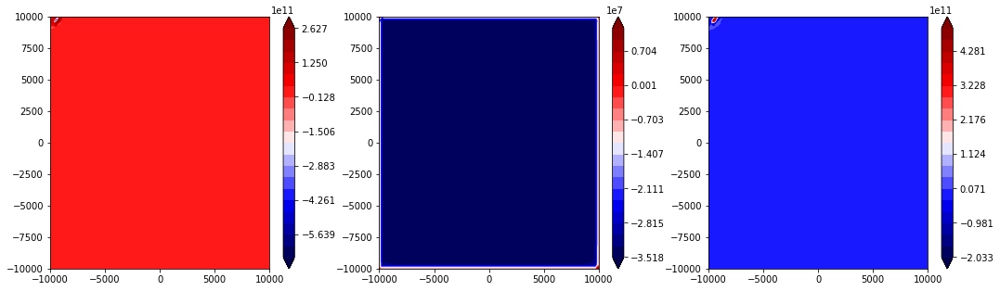

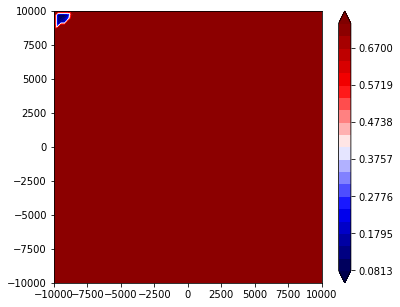

10101 2.61609239807
10102 2.61609239807
10103 2.61609239807
10104 2.61609239807
10105 2.61609239807
10106 2.61609239807
10107 2.61609239807
10108 2.61609239807
10109 2.61609239807
10110 2.61609239807
10111 2.61609239807
10112 2.61609239807
10113 2.61609239807
10114 2.61609239807
10115 2.61609239807
10116 2.61609239807
10117 2.61609239807
10118 2.61609239807
10119 2.61609239807
10120 2.61609239807
10121 2.61609239807
10122 2.61609239807
10123 2.61609239807
10124 2.61609239807
10125 2.61609239807
10126 2.61609239807
10127 2.61609239807
10128 2.61609239807
10129 2.61609239807
10130 2.61609239807
10131 2.61609239807
10132 2.61609239807
10133 2.61609239807
10134 2.61609239807
10135 2.61609239807
10136 2.61609239807
10137 2.61609239807
10138 2.61609239807
10139 2.61609239807
10140 2.61609239807
10141 2.61609239807
10142 2.61609239807
10143 2.61609239807
10144 2.61609239807
10145 2.61609239807
10146 2.61609239807
10147 2.61609239807
10148 2.61609239807
10149 2.61609239807
10150 2.61609239807


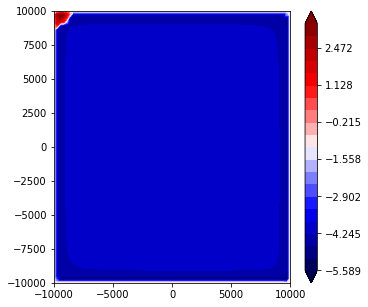

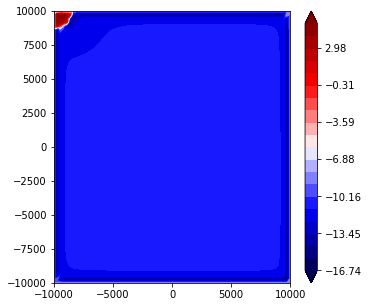

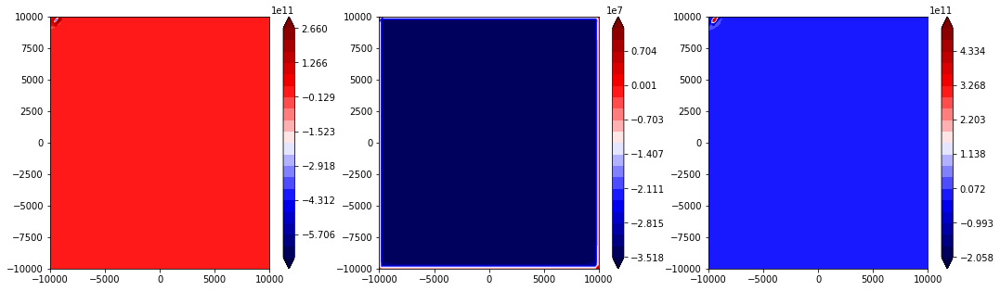

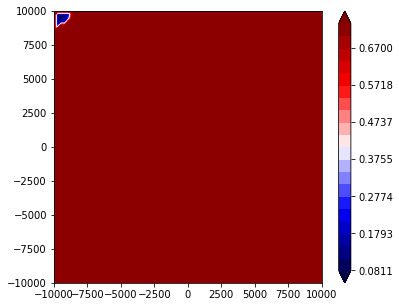

10201 2.61609239807
10202 2.61609239807
10203 2.61609239807
10204 2.61609239807
10205 2.61609239807
10206 2.61609239807
10207 2.61609239807
10208 2.61609239807
10209 2.61609239807
10210 2.61609239807
10211 2.61609239807
10212 2.61609239807
10213 2.61609239807
10214 2.61609239807
10215 2.61609239807
10216 2.61609239807
10217 2.61609239807
10218 2.61609239807
10219 2.61609239807
10220 2.61609239807
10221 2.61609239807
10222 2.61609239807
10223 2.61609239807
10224 2.61609239807
10225 2.61609239807
10226 2.61609239807
10227 2.61609239807
10228 2.61609239807
10229 2.61609239807
10230 2.61609239807
10231 2.61609239807
10232 2.61609239807
10233 2.61609239807
10234 2.61609239807
10235 2.61609239808
10236 2.61609239808
10237 2.61609239808
10238 2.61609239808
10239 2.61609239808
10240 2.61609239808
10241 2.61609239808
10242 2.61609239808
10243 2.61609239808
10244 2.61609239808
10245 2.61609239808
10246 2.61609239808
10247 2.61609239808
10248 2.61609239808
10249 2.61609239808
10250 2.61609239808


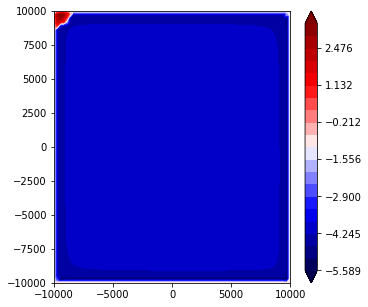

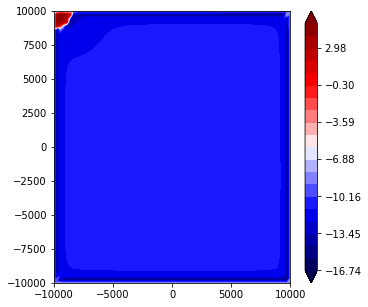

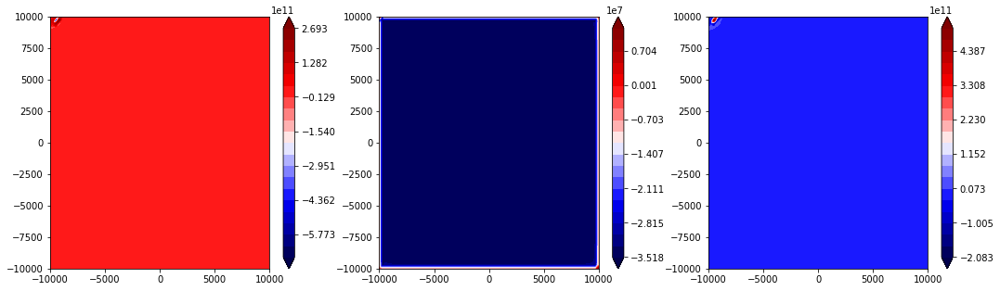

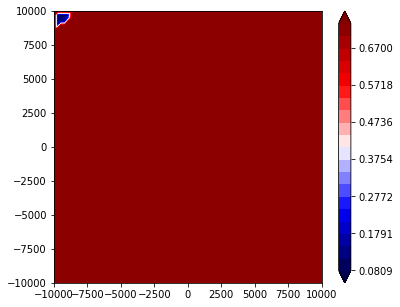

10301 2.61609239808
10302 2.61609239808
10303 2.61609239808
10304 2.61609239808
10305 2.61609239808
10306 2.61609239808
10307 2.61609239808
10308 2.61609239808
10309 2.61609239808
10310 2.61609239808
10311 2.61609239808
10312 2.61609239808
10313 2.61609239808
10314 2.61609239808
10315 2.61609239808
10316 2.61609239808
10317 2.61609239808
10318 2.61609239808
10319 2.61609239808
10320 2.61609239808
10321 2.61609239808
10322 2.61609239808
10323 2.61609239808
10324 2.61609239808
10325 2.61609239808
10326 2.61609239808
10327 2.61609239808
10328 2.61609239808
10329 2.61609239808
10330 2.61609239808
10331 2.61609239808
10332 2.61609239808
10333 2.61609239808
10334 2.61609239808
10335 2.61609239808
10336 2.61609239808
10337 2.61609239808
10338 2.61609239808
10339 2.61609239808
10340 2.61609239808
10341 2.61609239808
10342 2.61609239808
10343 2.61609239808
10344 2.61609239808
10345 2.61609239808
10346 2.61609239808
10347 2.61609239808
10348 2.61609239808
10349 2.61609239808
10350 2.61609239808


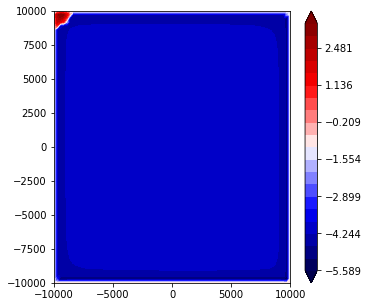

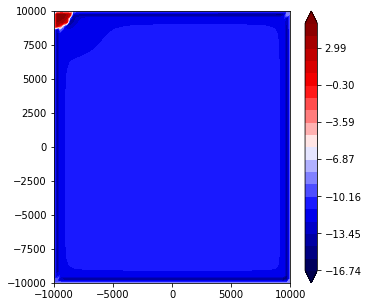

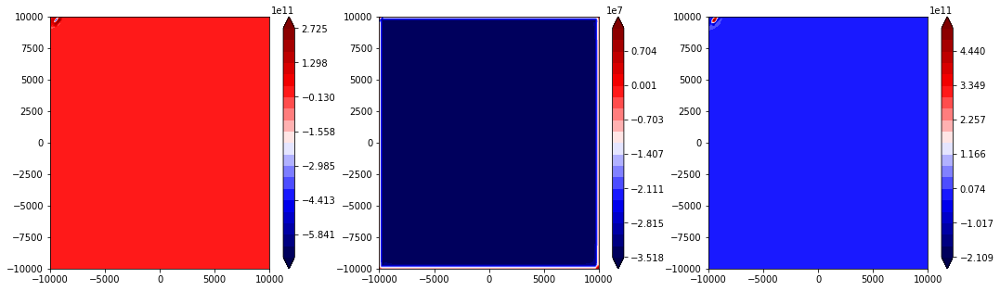

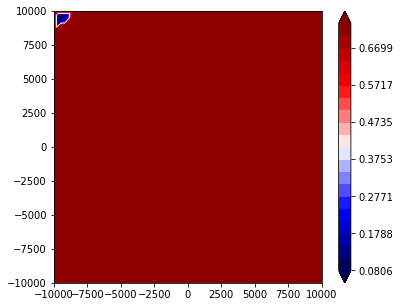

10401 2.61609239808
10402 2.61609239808
10403 2.61609239808
10404 2.61609239808
10405 2.61609239808
10406 2.61609239808
10407 2.61609239808
10408 2.61609239809
10409 2.61609239809
10410 2.61609239809
10411 2.61609239809
10412 2.61609239809
10413 2.61609239809
10414 2.61609239809
10415 2.61609239809
10416 2.61609239809
10417 2.61609239809
10418 2.61609239809
10419 2.61609239809
10420 2.61609239809
10421 2.61609239809
10422 2.61609239809
10423 2.61609239809
10424 2.61609239809
10425 2.61609239809
10426 2.61609239809
10427 2.61609239809
10428 2.61609239809
10429 2.61609239809
10430 2.61609239809
10431 2.61609239809
10432 2.61609239809
10433 2.61609239809
10434 2.61609239809
10435 2.61609239809
10436 2.61609239809
10437 2.61609239809
10438 2.61609239809
10439 2.61609239809
10440 2.61609239809
10441 2.61609239809
10442 2.61609239809
10443 2.61609239809
10444 2.61609239809
10445 2.61609239809
10446 2.61609239809
10447 2.61609239809
10448 2.61609239809
10449 2.61609239809
10450 2.61609239809


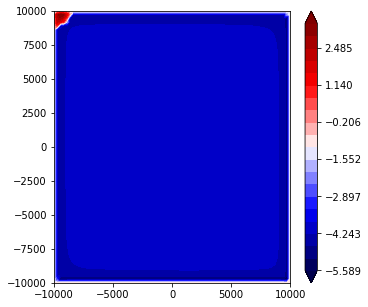

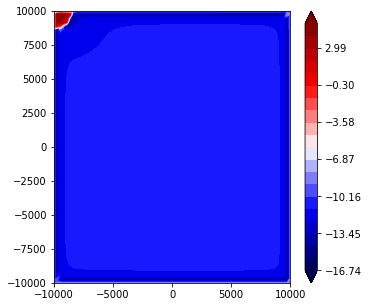

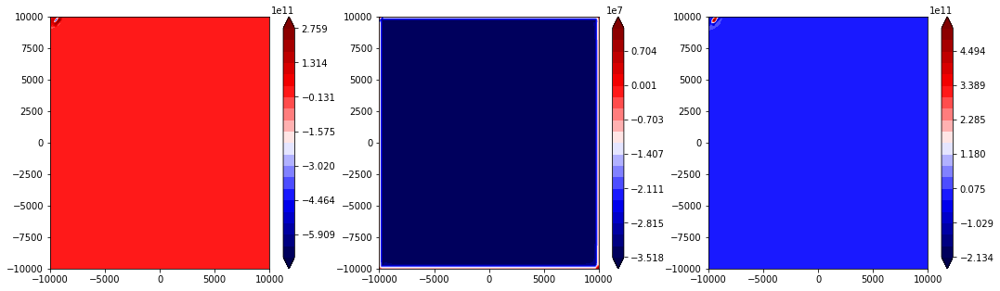

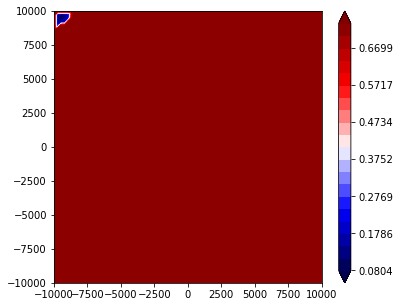

10501 2.61609239809
10502 2.61609239809
10503 2.61609239809
10504 2.61609239809
10505 2.61609239809
10506 2.61609239809
10507 2.61609239809
10508 2.61609239809
10509 2.61609239809
10510 2.61609239809
10511 2.61609239809
10512 2.61609239809
10513 2.61609239809
10514 2.61609239809
10515 2.61609239809
10516 2.61609239809
10517 2.61609239809
10518 2.61609239809
10519 2.61609239809
10520 2.61609239809
10521 2.61609239809
10522 2.61609239809
10523 2.61609239809
10524 2.61609239809
10525 2.61609239809
10526 2.61609239809
10527 2.61609239809
10528 2.61609239809
10529 2.61609239809
10530 2.61609239809
10531 2.61609239809
10532 2.61609239809
10533 2.61609239809
10534 2.61609239809
10535 2.61609239809
10536 2.61609239809
10537 2.61609239809
10538 2.61609239809
10539 2.61609239809
10540 2.61609239809
10541 2.61609239809
10542 2.61609239809
10543 2.61609239809
10544 2.61609239809
10545 2.61609239809
10546 2.61609239809
10547 2.61609239809
10548 2.61609239809
10549 2.61609239809
10550 2.61609239809


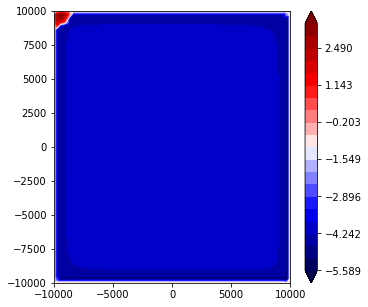

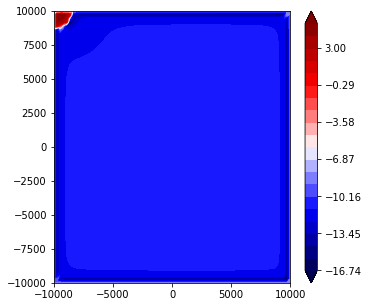

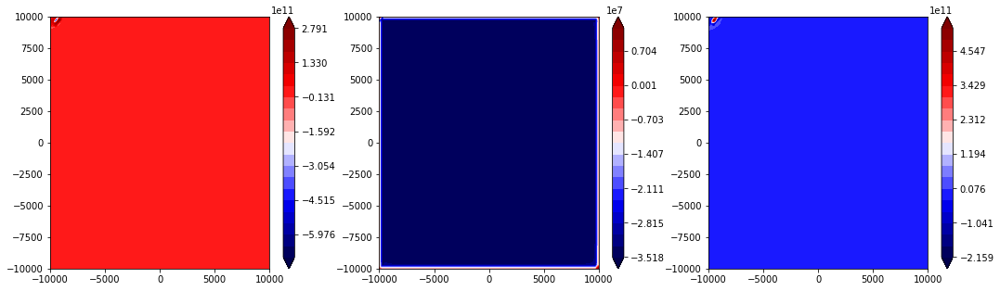

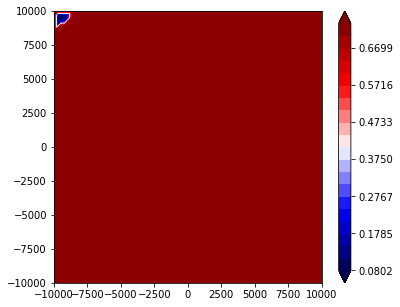

10601 2.6160923981
10602 2.6160923981
10603 2.6160923981
10604 2.6160923981
10605 2.6160923981
10606 2.6160923981
10607 2.6160923981
10608 2.6160923981
10609 2.6160923981
10610 2.6160923981
10611 2.6160923981
10612 2.6160923981
10613 2.6160923981
10614 2.6160923981
10615 2.6160923981
10616 2.6160923981
10617 2.6160923981
10618 2.6160923981
10619 2.6160923981
10620 2.6160923981
10621 2.6160923981
10622 2.6160923981
10623 2.6160923981
10624 2.6160923981
10625 2.6160923981
10626 2.6160923981
10627 2.6160923981
10628 2.6160923981
10629 2.6160923981
10630 2.6160923981
10631 2.6160923981
10632 2.6160923981
10633 2.6160923981
10634 2.6160923981
10635 2.6160923981
10636 2.6160923981
10637 2.6160923981
10638 2.6160923981
10639 2.6160923981
10640 2.6160923981
10641 2.6160923981
10642 2.6160923981
10643 2.6160923981
10644 2.6160923981
10645 2.6160923981
10646 2.6160923981
10647 2.6160923981
10648 2.6160923981
10649 2.6160923981
10650 2.6160923981
10651 2.6160923981
10652 2.6160923981
10653 2.6160

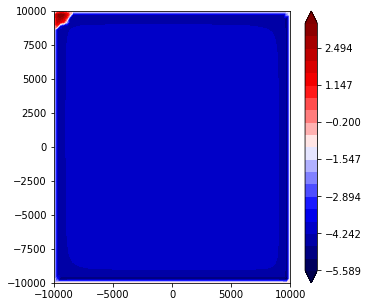

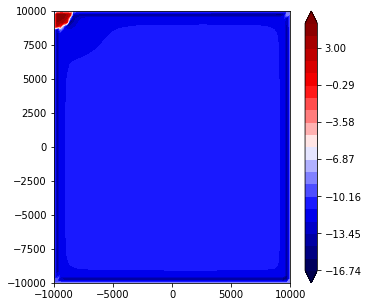

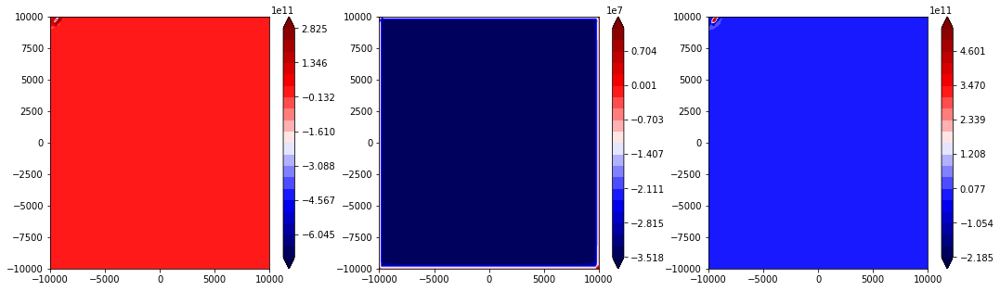

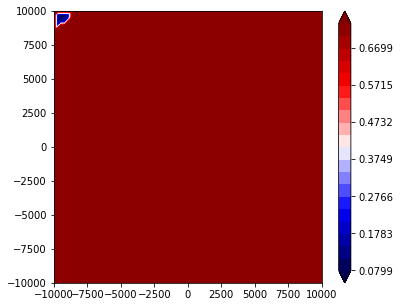

10701 2.6160923981
10702 2.6160923981
10703 2.6160923981
10704 2.6160923981
10705 2.6160923981
10706 2.6160923981
10707 2.6160923981
10708 2.6160923981
10709 2.6160923981
10710 2.6160923981
10711 2.6160923981
10712 2.6160923981
10713 2.6160923981
10714 2.6160923981
10715 2.6160923981
10716 2.6160923981
10717 2.6160923981
10718 2.6160923981
10719 2.6160923981
10720 2.6160923981
10721 2.6160923981
10722 2.6160923981
10723 2.6160923981
10724 2.6160923981
10725 2.6160923981
10726 2.6160923981
10727 2.6160923981
10728 2.6160923981
10729 2.6160923981
10730 2.6160923981
10731 2.6160923981
10732 2.6160923981
10733 2.6160923981
10734 2.6160923981
10735 2.6160923981
10736 2.6160923981
10737 2.6160923981
10738 2.6160923981
10739 2.6160923981
10740 2.6160923981
10741 2.6160923981
10742 2.6160923981
10743 2.6160923981
10744 2.6160923981
10745 2.6160923981
10746 2.6160923981
10747 2.6160923981
10748 2.6160923981
10749 2.6160923981
10750 2.6160923981
10751 2.6160923981
10752 2.6160923981
10753 2.6160

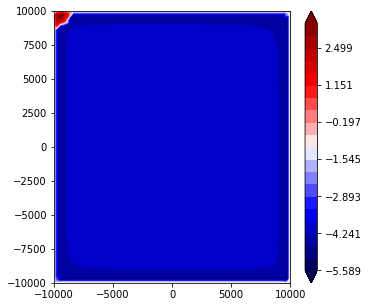

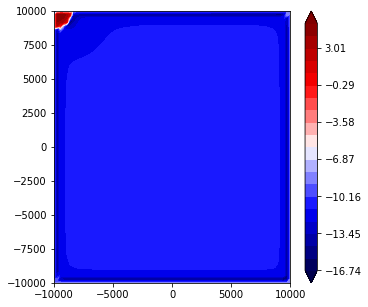

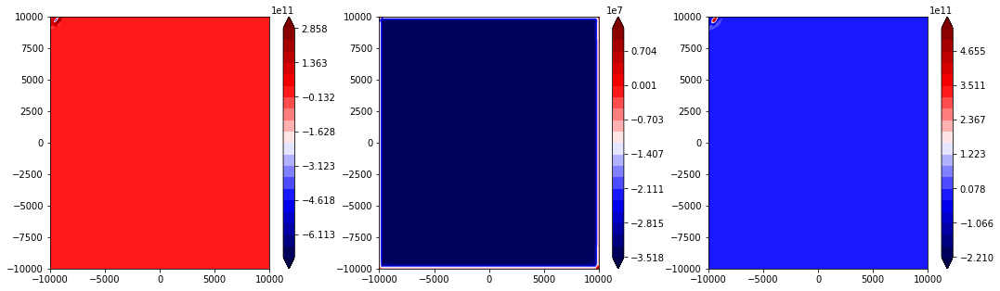

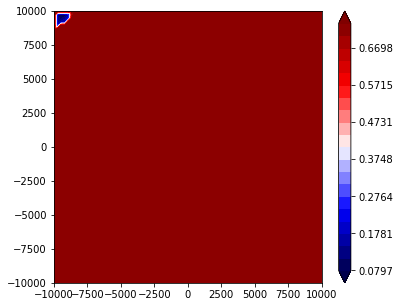

10801 2.61609239811
10802 2.61609239811
10803 2.61609239811
10804 2.61609239811
10805 2.61609239811
10806 2.61609239811
10807 2.61609239811
10808 2.61609239811
10809 2.61609239811
10810 2.61609239811
10811 2.61609239811
10812 2.61609239811
10813 2.61609239811
10814 2.61609239811
10815 2.61609239811
10816 2.61609239811
10817 2.61609239811
10818 2.61609239811
10819 2.61609239811
10820 2.61609239811
10821 2.61609239811
10822 2.61609239811
10823 2.61609239811
10824 2.61609239811
10825 2.61609239811
10826 2.61609239811
10827 2.61609239811
10828 2.61609239811
10829 2.61609239811
10830 2.61609239811
10831 2.61609239811
10832 2.61609239811
10833 2.61609239811
10834 2.61609239811
10835 2.61609239811
10836 2.61609239811
10837 2.61609239811
10838 2.61609239811
10839 2.61609239811
10840 2.61609239811
10841 2.61609239811
10842 2.61609239811
10843 2.61609239811
10844 2.61609239811
10845 2.61609239811
10846 2.61609239811
10847 2.61609239811
10848 2.61609239811
10849 2.61609239811
10850 2.61609239811


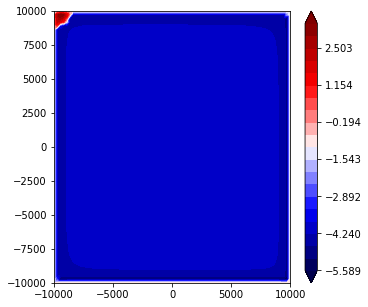

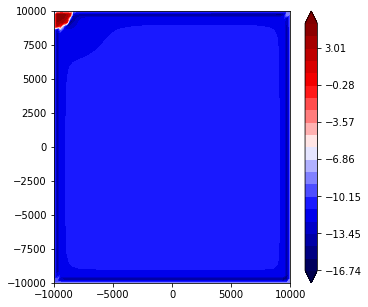

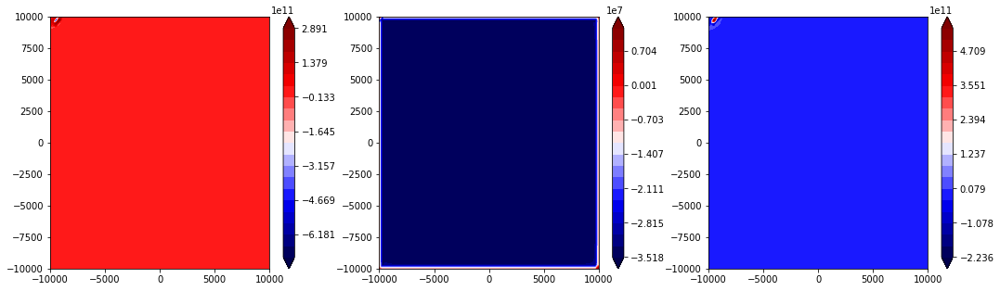

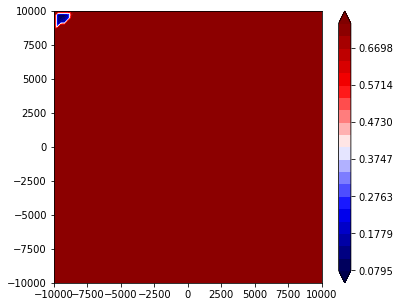

10901 2.61609239811
10902 2.61609239811
10903 2.61609239811
10904 2.61609239811
10905 2.61609239811
10906 2.61609239811
10907 2.61609239811
10908 2.61609239811
10909 2.61609239811
10910 2.61609239811
10911 2.61609239811
10912 2.61609239811
10913 2.61609239811
10914 2.61609239811
10915 2.61609239811
10916 2.61609239811
10917 2.61609239811
10918 2.61609239811
10919 2.61609239811
10920 2.61609239811
10921 2.61609239811
10922 2.61609239811
10923 2.61609239811
10924 2.61609239811
10925 2.61609239811
10926 2.61609239811
10927 2.61609239811
10928 2.61609239811
10929 2.61609239811
10930 2.61609239811
10931 2.61609239811
10932 2.61609239811
10933 2.61609239811
10934 2.61609239811
10935 2.61609239811
10936 2.61609239811
10937 2.61609239811
10938 2.61609239811
10939 2.61609239811
10940 2.61609239811
10941 2.61609239811
10942 2.61609239812
10943 2.61609239812
10944 2.61609239812
10945 2.61609239812
10946 2.61609239812
10947 2.61609239812
10948 2.61609239812
10949 2.61609239812
10950 2.61609239812


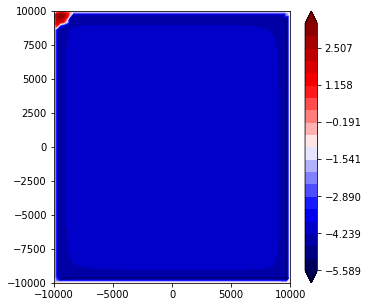

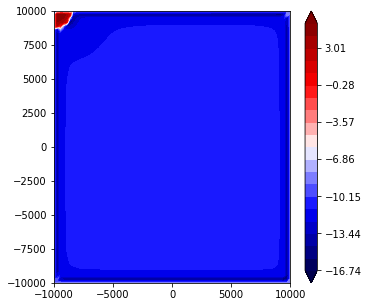

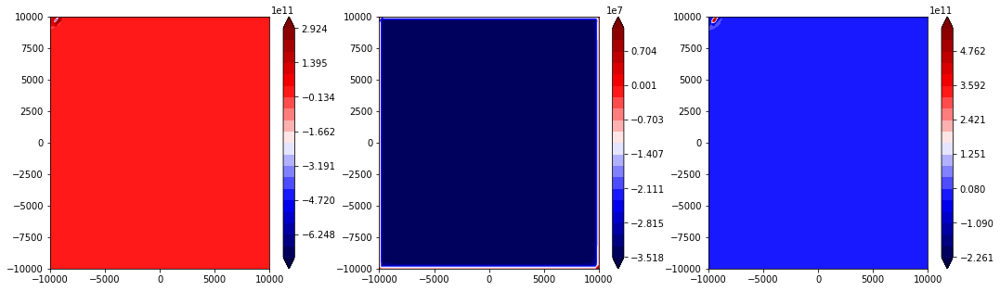

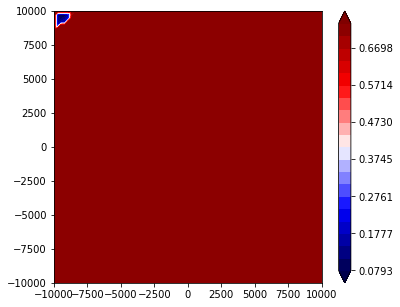

11001 2.61609239812
11002 2.61609239812
11003 2.61609239812
11004 2.61609239812
11005 2.61609239812
11006 2.61609239812
11007 2.61609239812
11008 2.61609239812
11009 2.61609239812
11010 2.61609239812
11011 2.61609239812
11012 2.61609239812
11013 2.61609239812
11014 2.61609239812
11015 2.61609239812
11016 2.61609239812
11017 2.61609239812
11018 2.61609239812
11019 2.61609239812
11020 2.61609239812
11021 2.61609239812
11022 2.61609239812
11023 2.61609239812
11024 2.61609239812
11025 2.61609239812
11026 2.61609239812
11027 2.61609239812
11028 2.61609239812
11029 2.61609239812
11030 2.61609239812
11031 2.61609239812
11032 2.61609239812
11033 2.61609239812
11034 2.61609239812
11035 2.61609239812
11036 2.61609239812
11037 2.61609239812
11038 2.61609239812
11039 2.61609239812
11040 2.61609239812
11041 2.61609239812
11042 2.61609239812
11043 2.61609239812
11044 2.61609239812
11045 2.61609239812
11046 2.61609239812
11047 2.61609239812
11048 2.61609239812
11049 2.61609239812
11050 2.61609239812


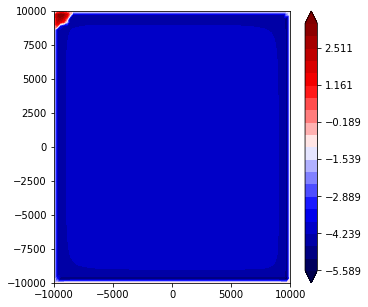

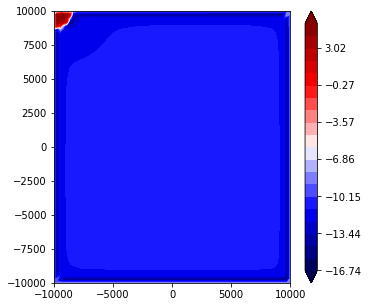

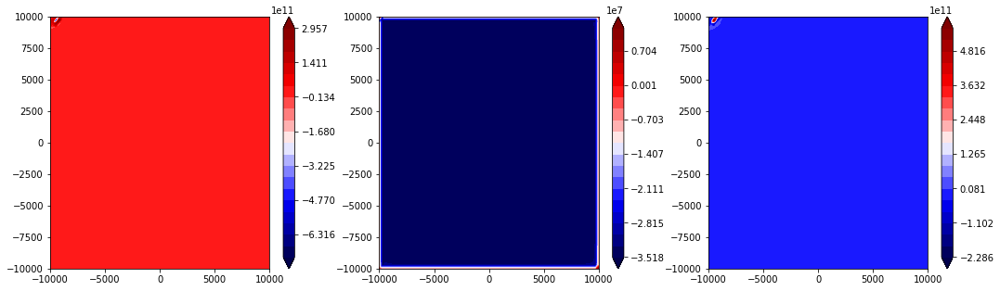

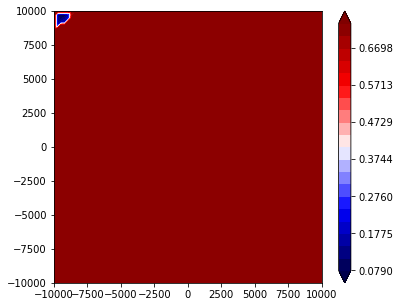

11101 2.61609239812
11102 2.61609239812
11103 2.61609239812
11104 2.61609239812
11105 2.61609239812
11106 2.61609239812
11107 2.61609239812
11108 2.61609239812
11109 2.61609239812
11110 2.61609239812
11111 2.61609239812
11112 2.61609239812
11113 2.61609239812
11114 2.61609239812
11115 2.61609239812
11116 2.61609239812
11117 2.61609239812
11118 2.61609239812
11119 2.61609239812
11120 2.61609239812
11121 2.61609239812
11122 2.61609239812
11123 2.61609239812
11124 2.61609239812
11125 2.61609239812
11126 2.61609239812
11127 2.61609239812
11128 2.61609239813
11129 2.61609239813
11130 2.61609239813
11131 2.61609239813
11132 2.61609239813
11133 2.61609239813
11134 2.61609239813
11135 2.61609239813
11136 2.61609239813
11137 2.61609239813
11138 2.61609239813
11139 2.61609239813
11140 2.61609239813
11141 2.61609239813
11142 2.61609239813
11143 2.61609239813
11144 2.61609239813
11145 2.61609239813
11146 2.61609239813
11147 2.61609239813
11148 2.61609239813
11149 2.61609239813
11150 2.61609239813


In [ ]:
i = 0
while integrator.t / siay < 20:
    i += 1
    assert(integrator.step() == None)
    # integrator.status, integrator.n, integrator.t, integrator.y, integrator.t_old, integrator.step_size, integrator.nfev
    print(i, integrator.t / siay)
    if i % 100 == 0:
        slip, state = get_slip_state(integrator.y)
        slip_deficit = get_slip_deficit(integrator.t, slip)
        traction = elastic_solve(slip_deficit)
        V = rate_state_solve(traction, state)
        plot_fields(np.log10(np.abs(slip)), ds = [0])
        plot_fields(np.log10(np.abs(V) + 1e-40), ds = [0])
        plot_fields(traction)
        plot_fields(state)

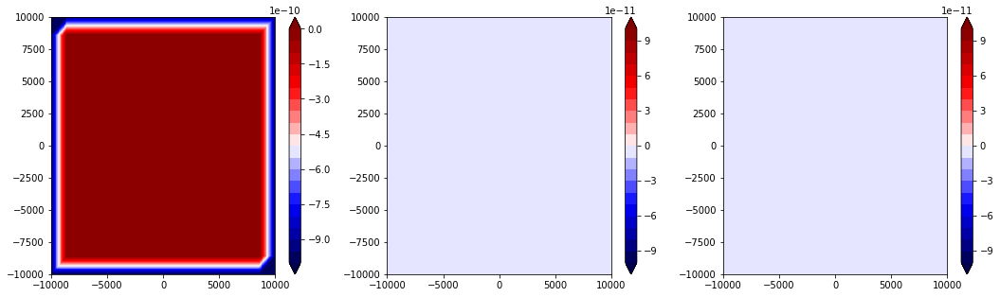

0 0.01


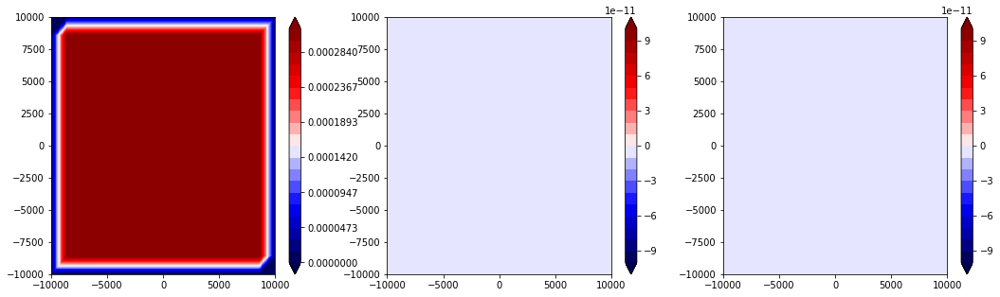

/home/tthompson/tools/pyenv/versions/miniconda3-4.3.11/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log10
  


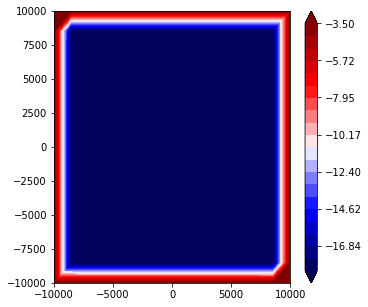

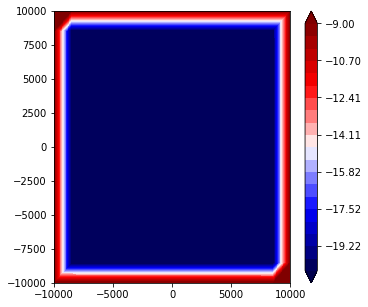

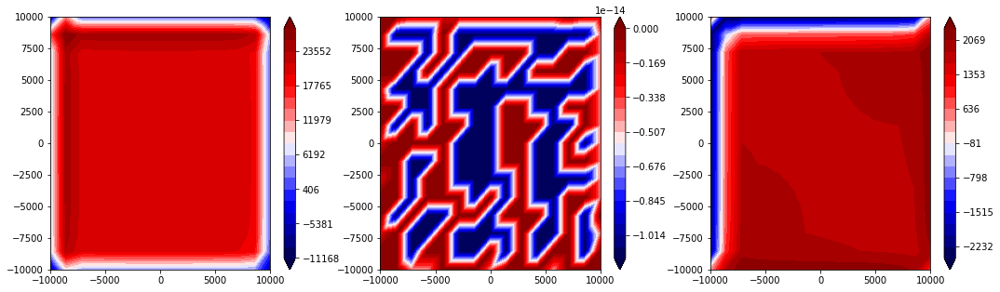

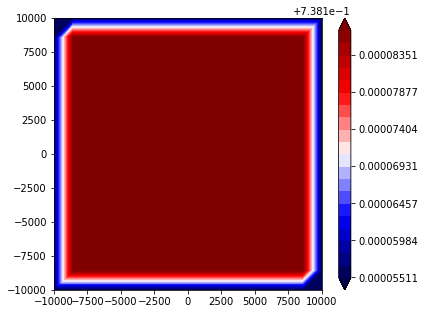

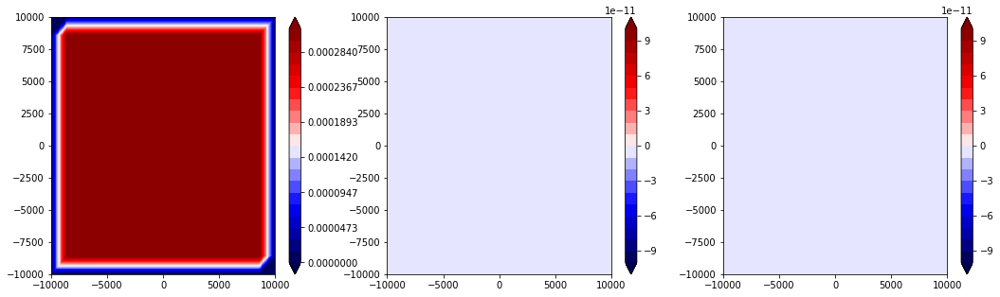

1 0.02


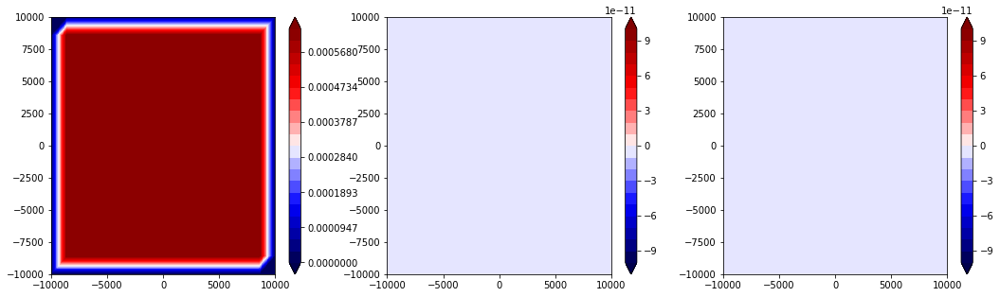

2 0.03


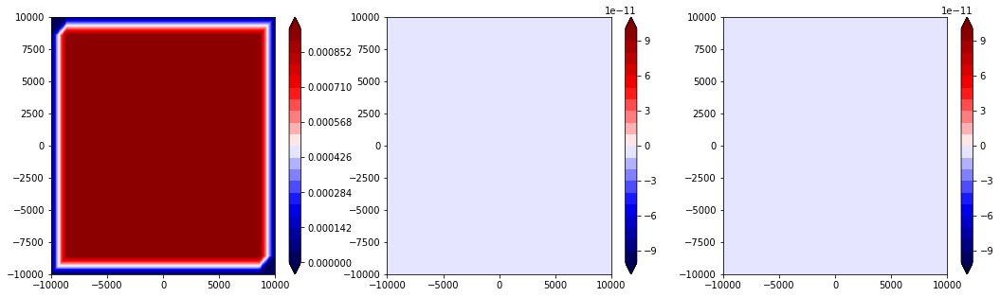

3 0.04


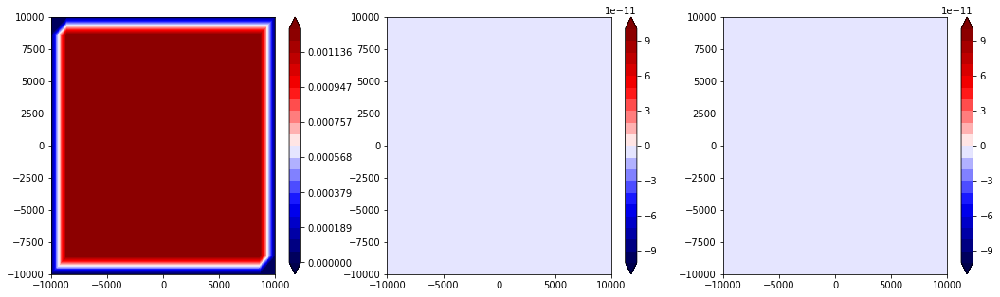

4 0.05


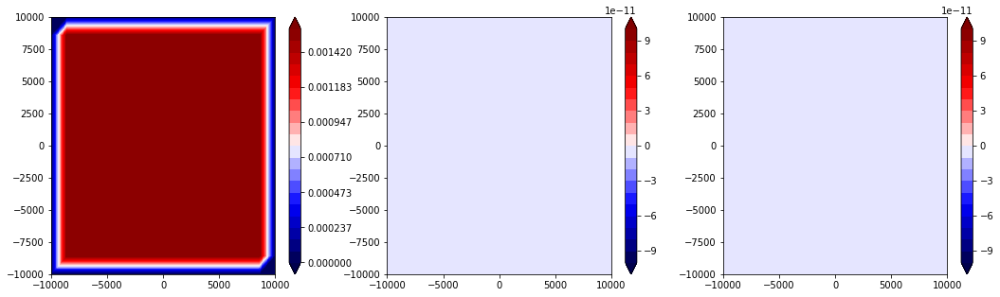

5 0.06


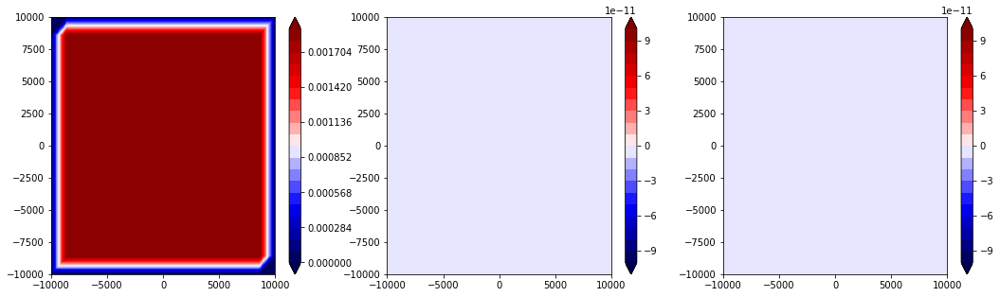

6 0.07


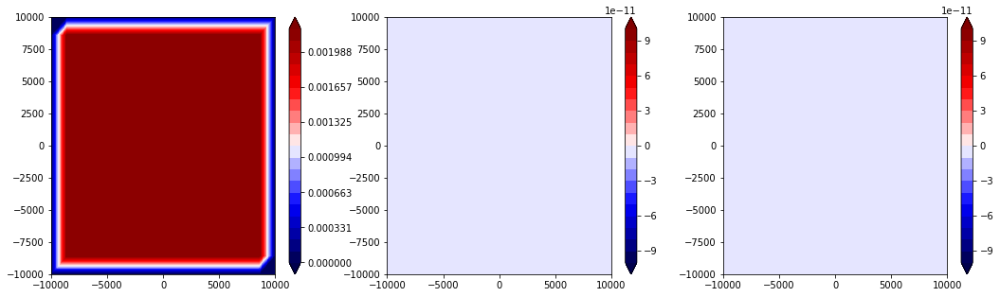

7 0.08


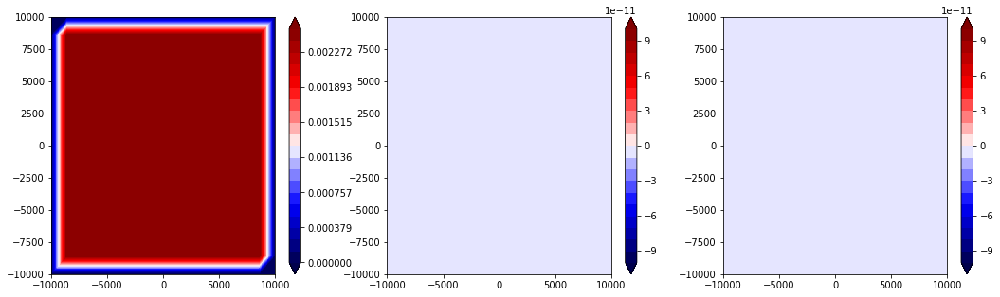

8 0.09


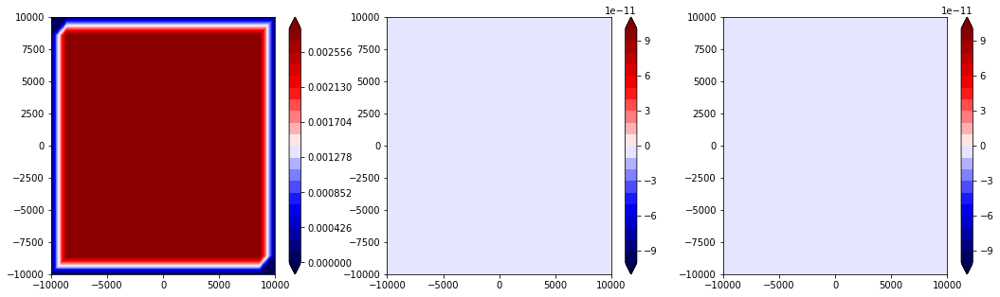

9 0.1


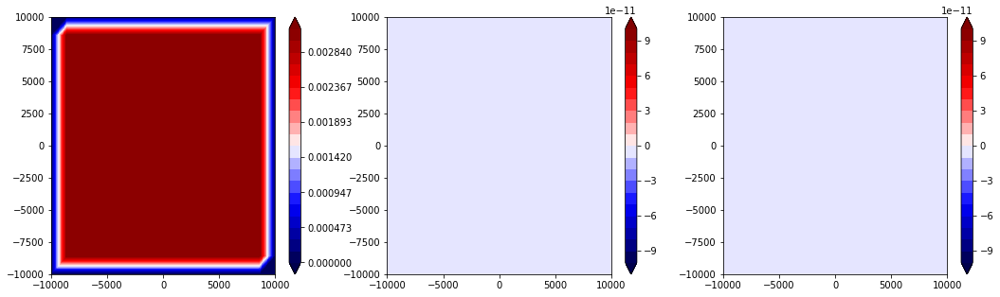

10 0.11


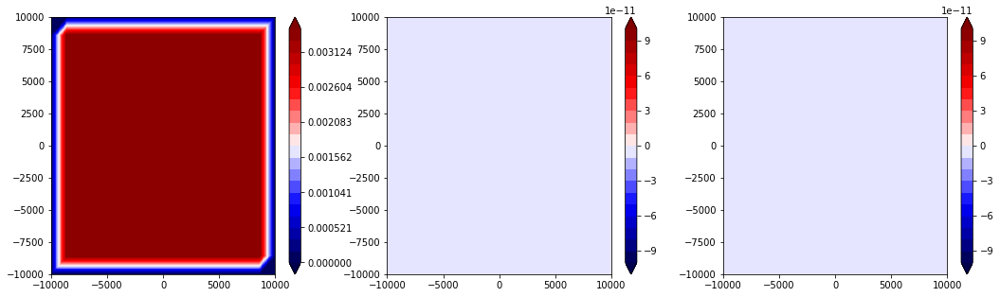

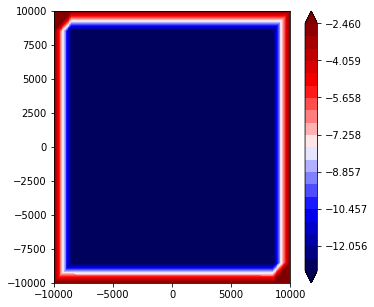

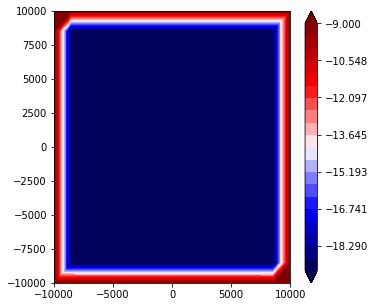

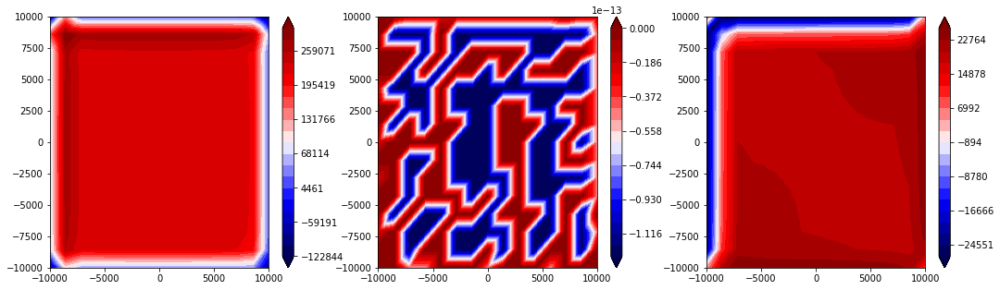

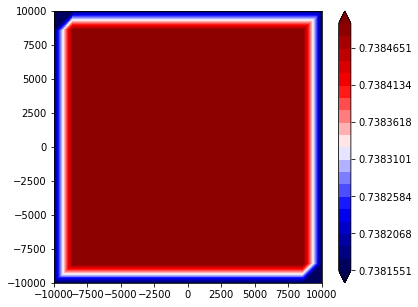

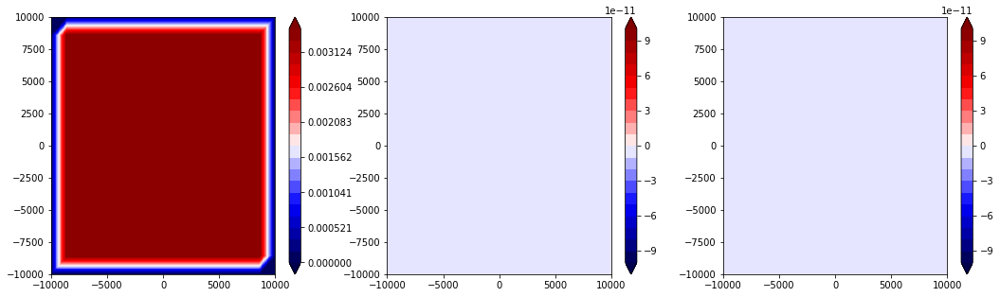

11 0.12


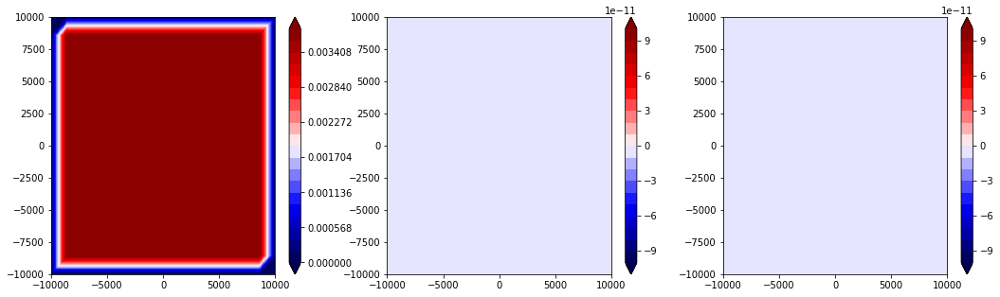

12 0.13


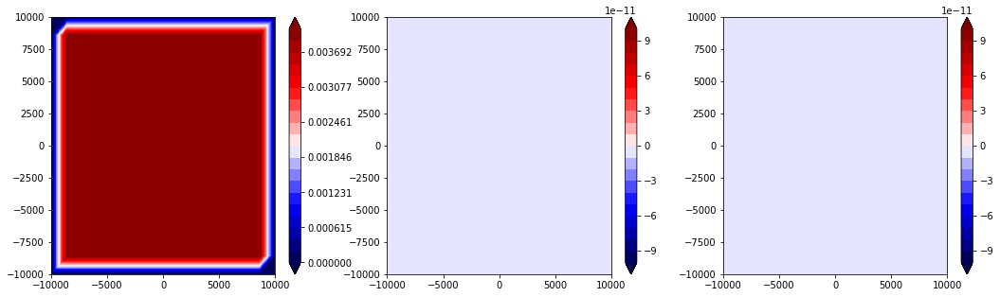

13 0.14


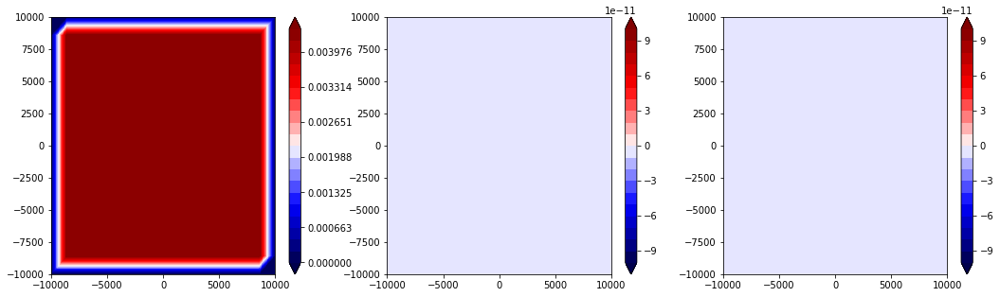

14 0.15


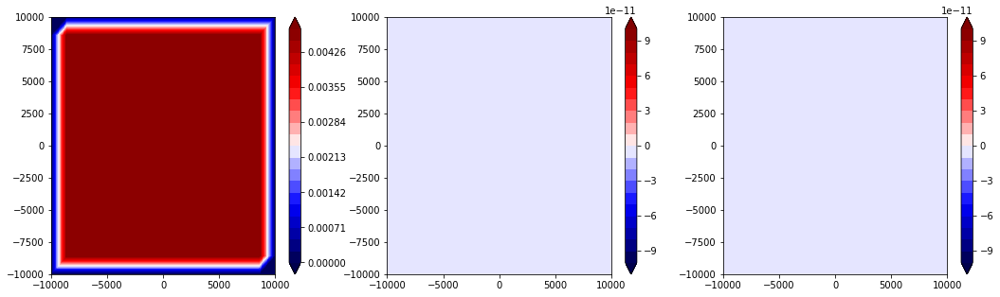

15 0.16


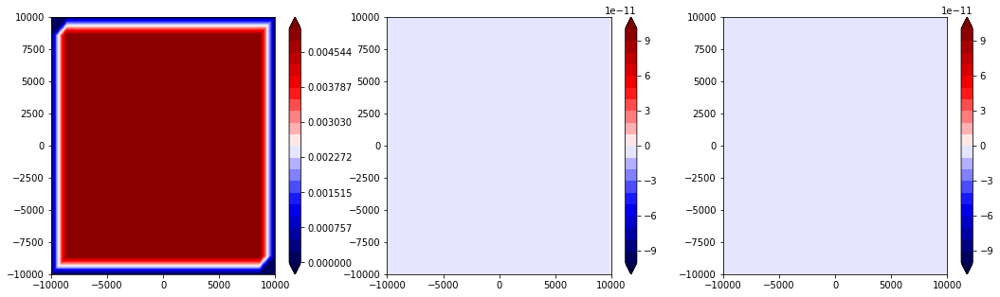

16 0.17


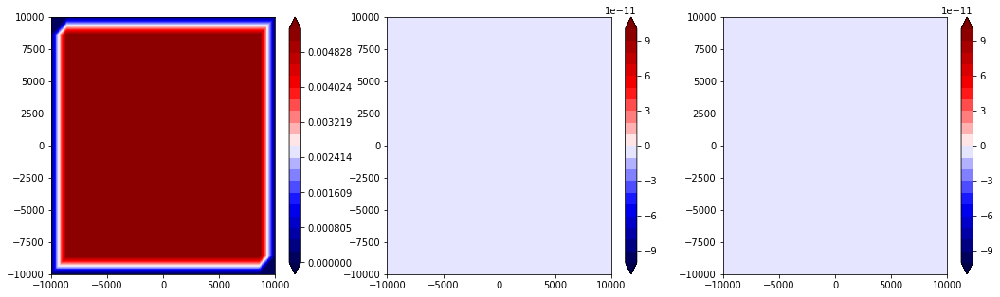

17 0.18


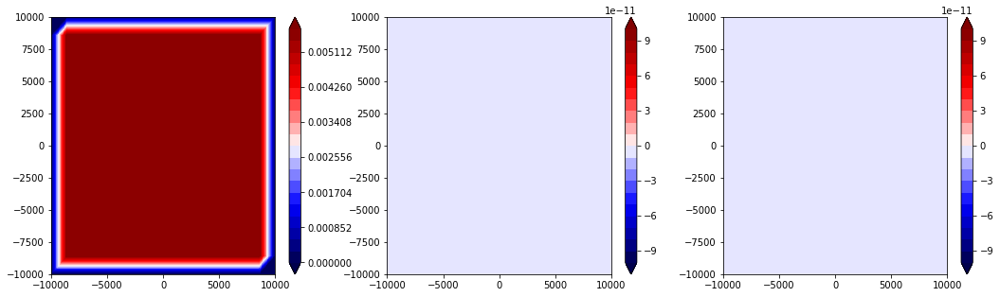

18 0.19


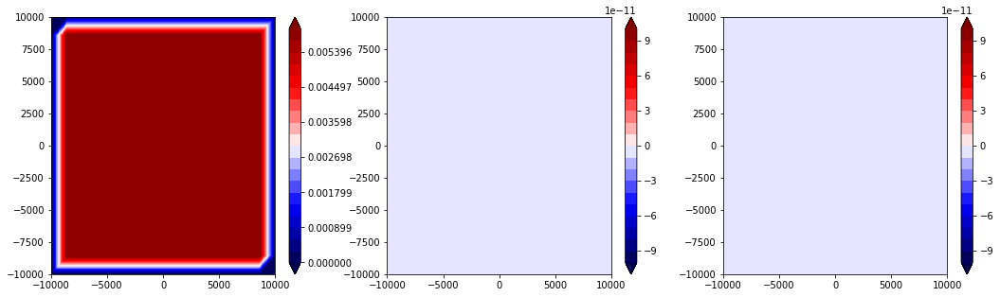

19 0.2


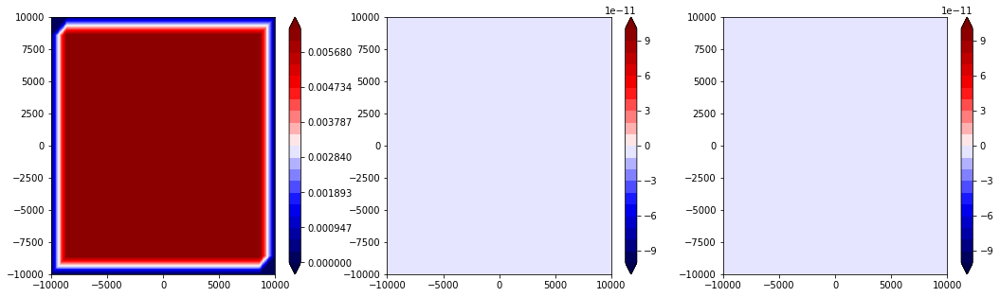

20 0.21


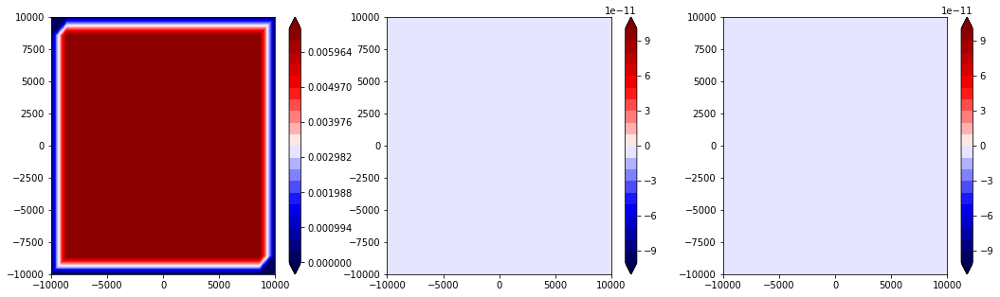

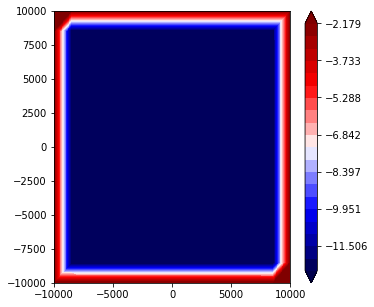

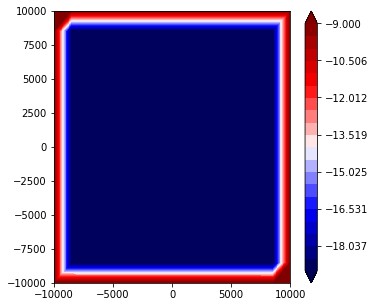

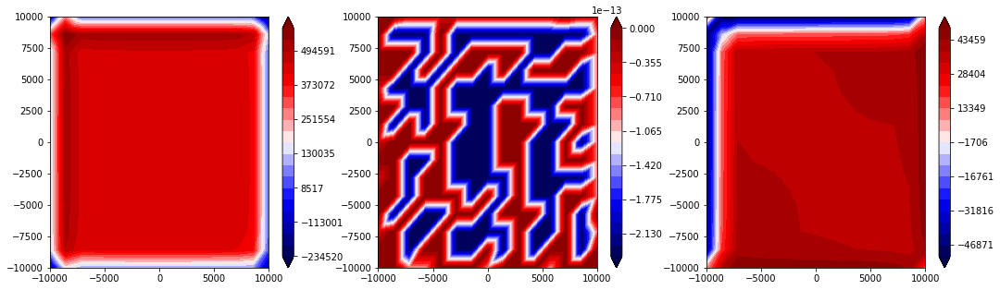

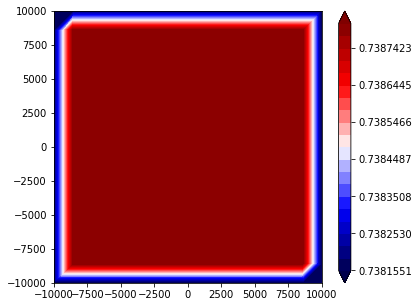

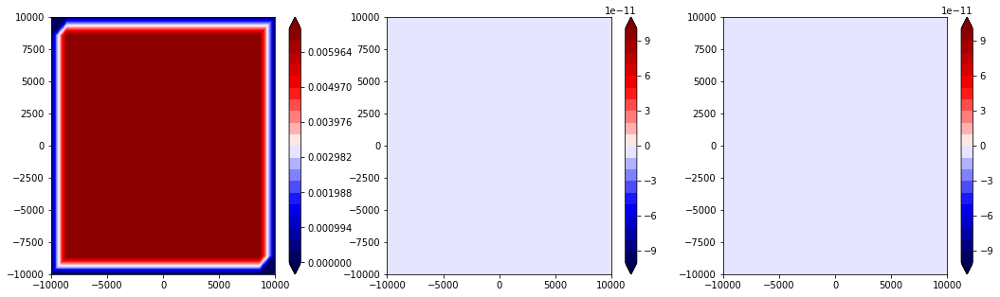

21 0.22


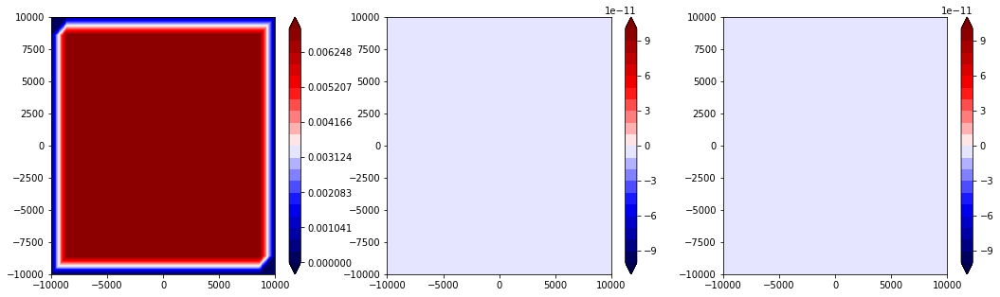

22 0.23


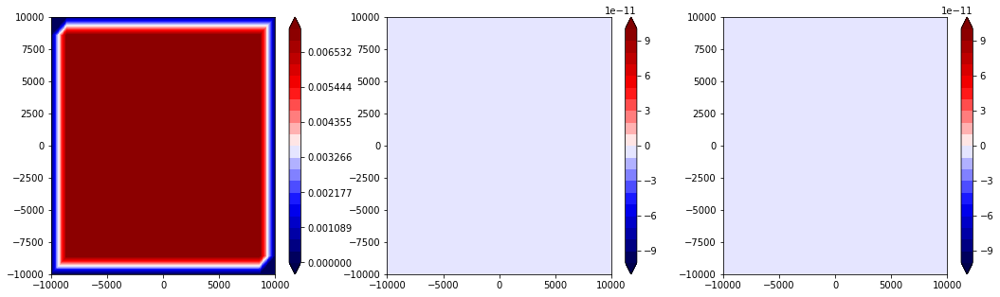

23 0.24


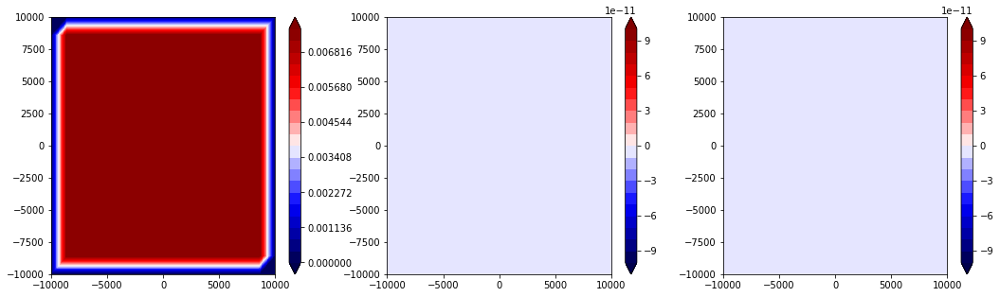

24 0.25


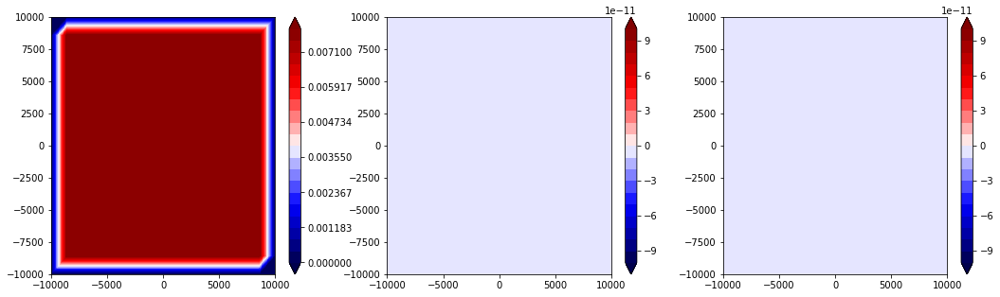

25 0.26


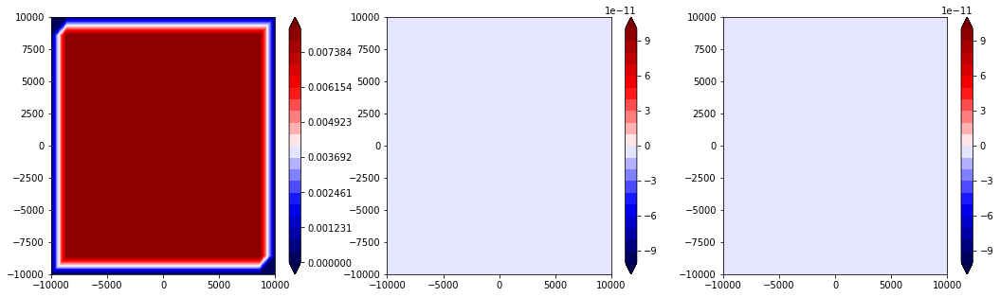

26 0.27


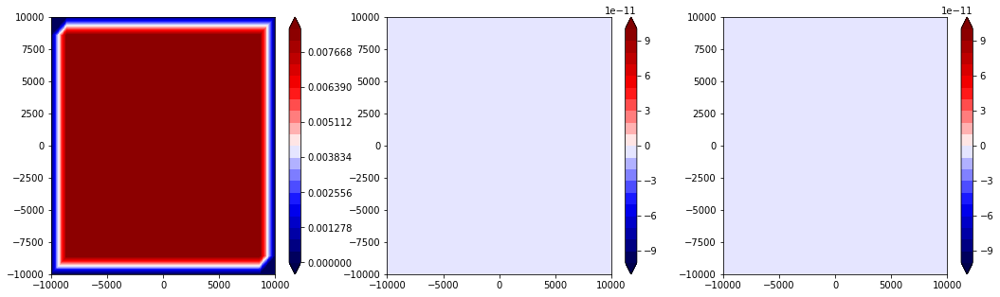

27 0.28


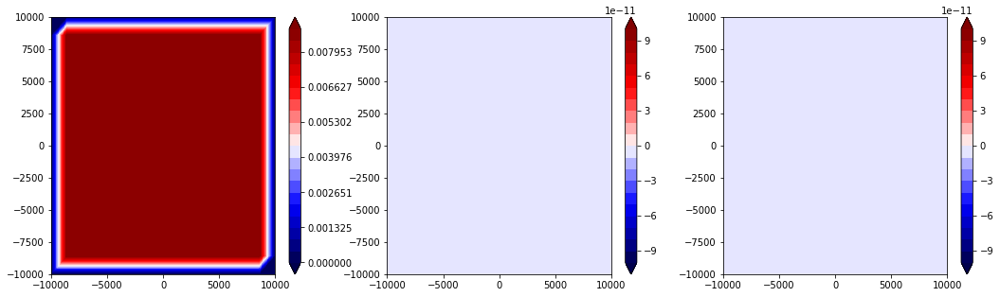

28 0.29


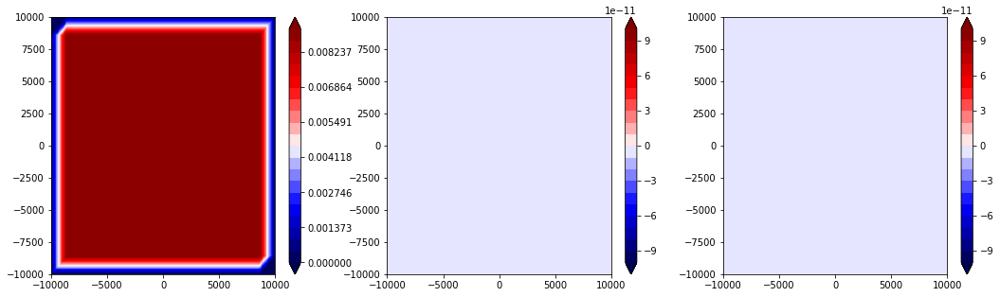

29 0.3


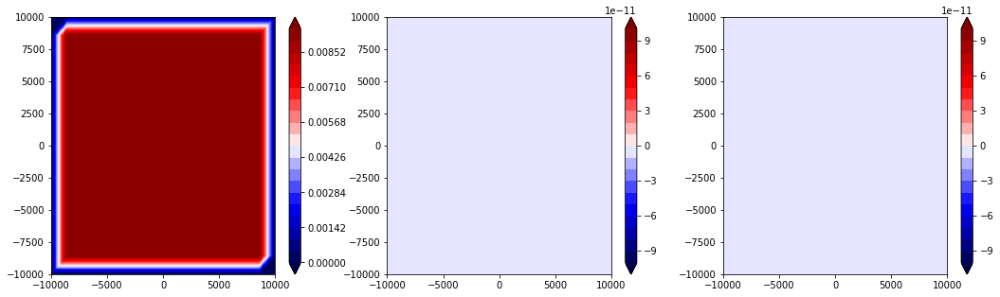

30 0.31


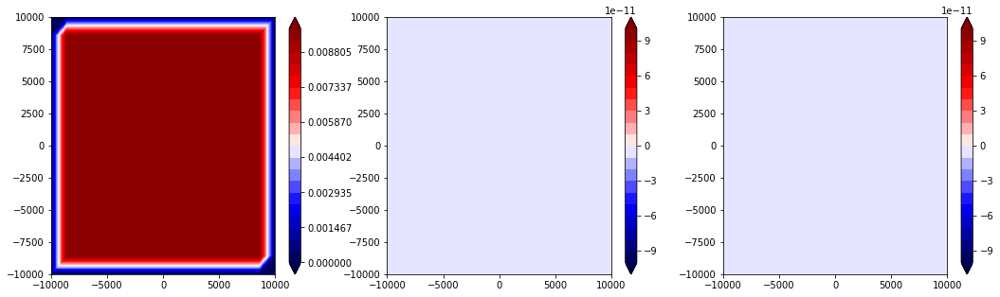

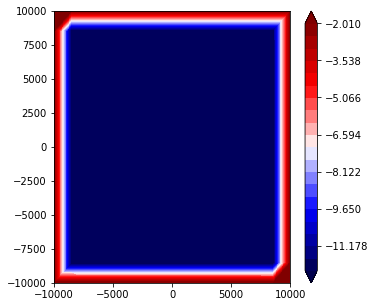

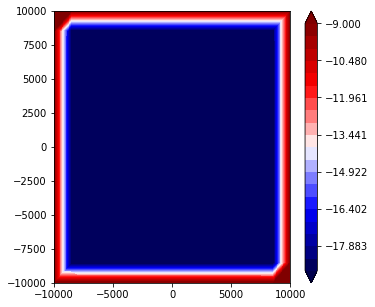

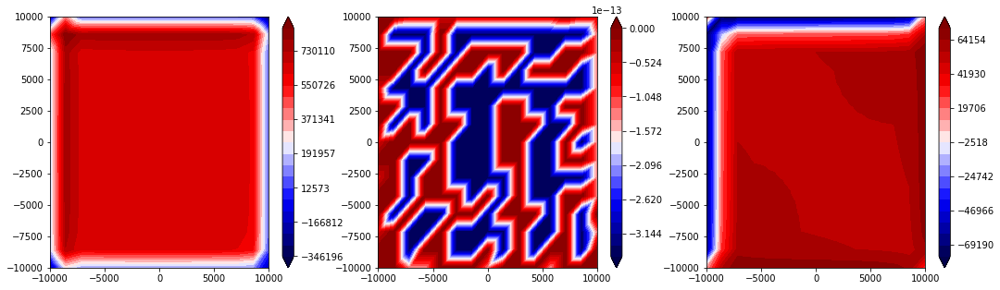

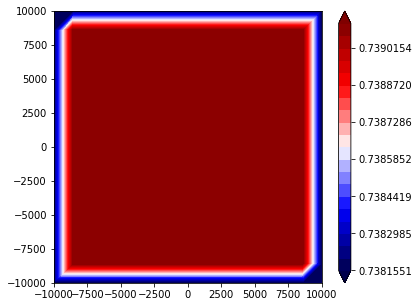

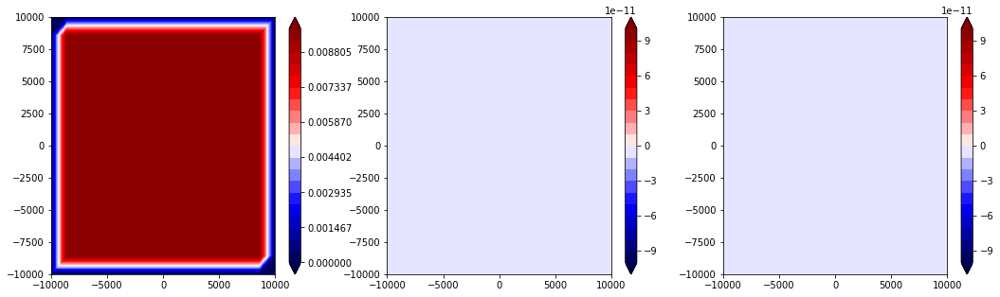

31 0.32


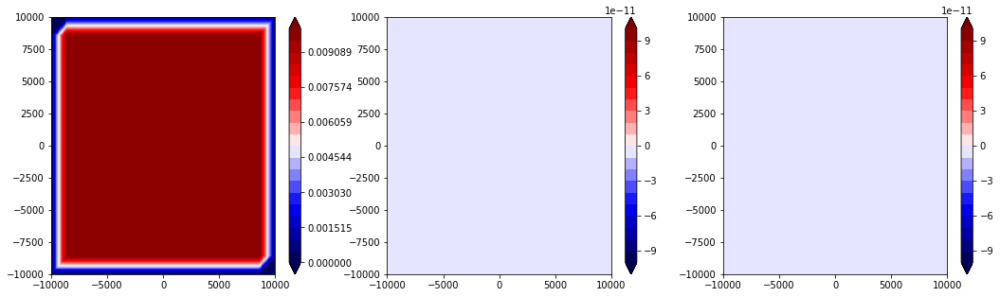

32 0.33


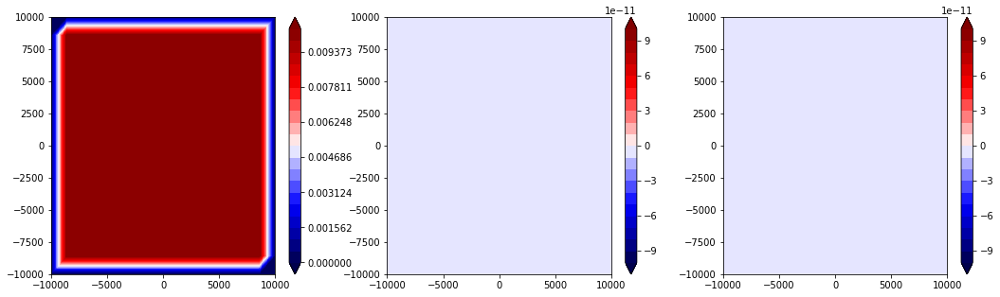

33 0.34


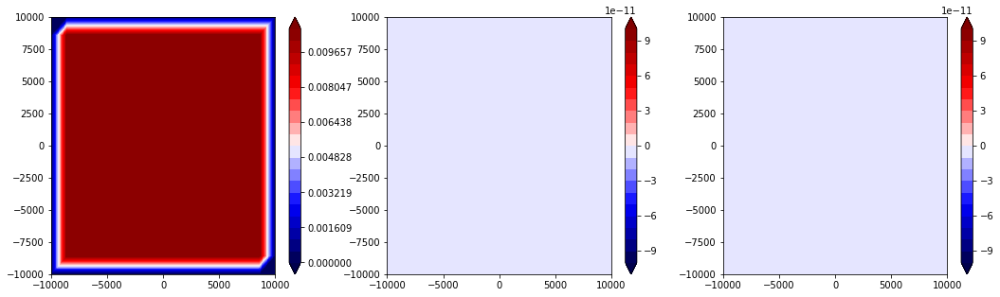

34 0.35


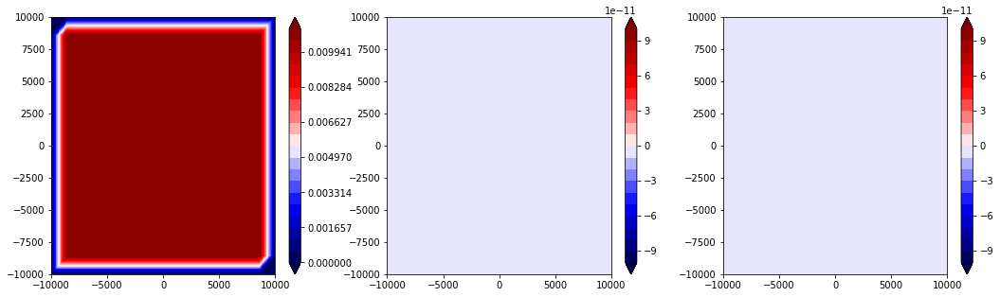

35 0.36


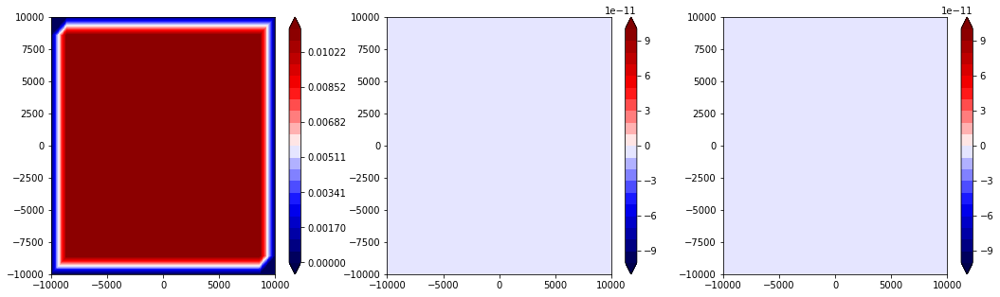

36 0.37


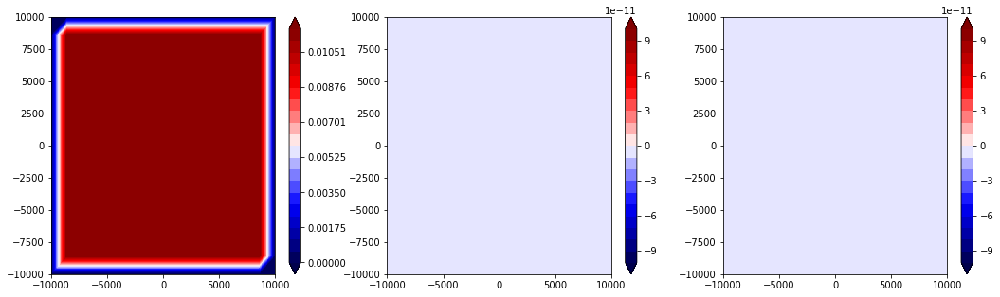

37 0.38


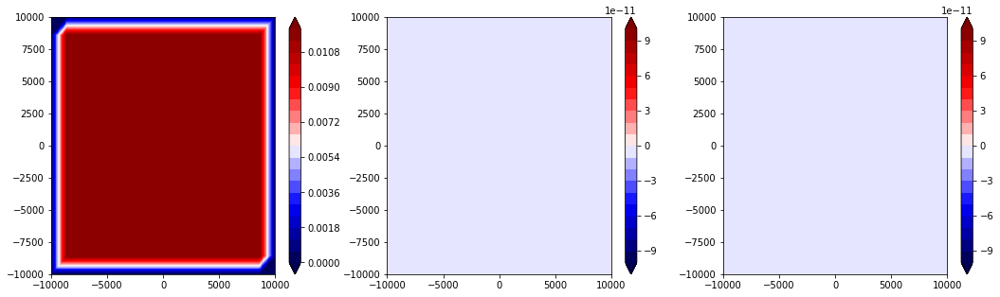

38 0.39


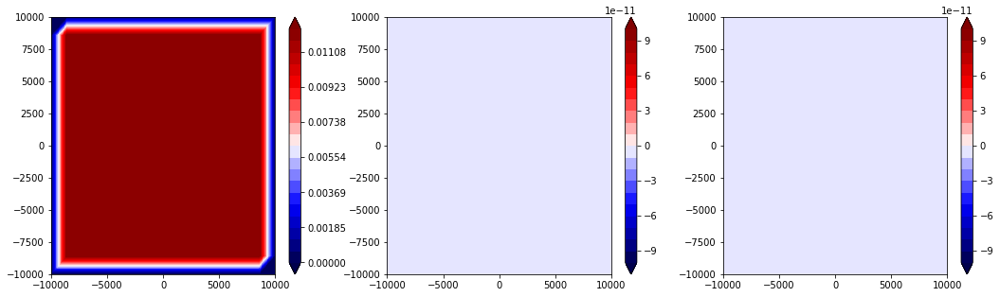

39 0.4


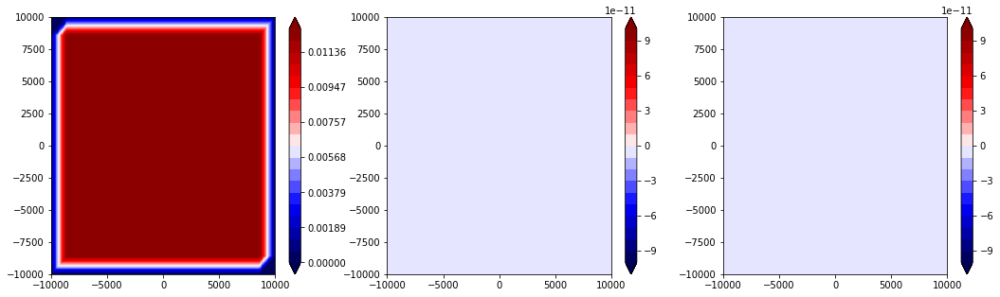

40 0.41


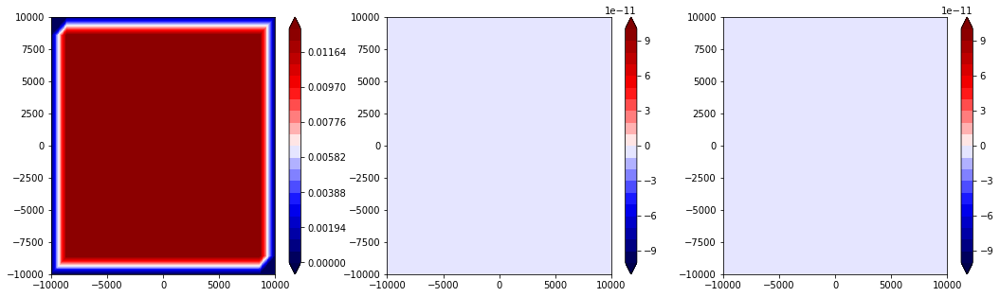

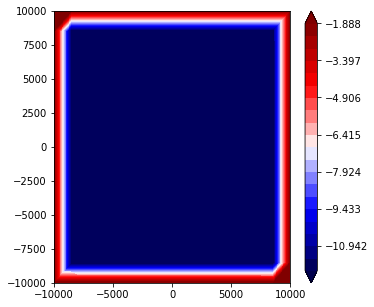

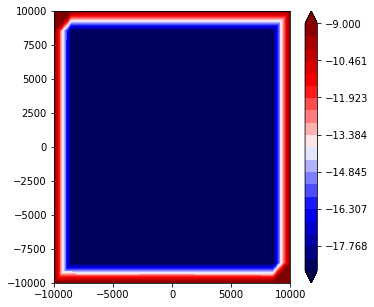

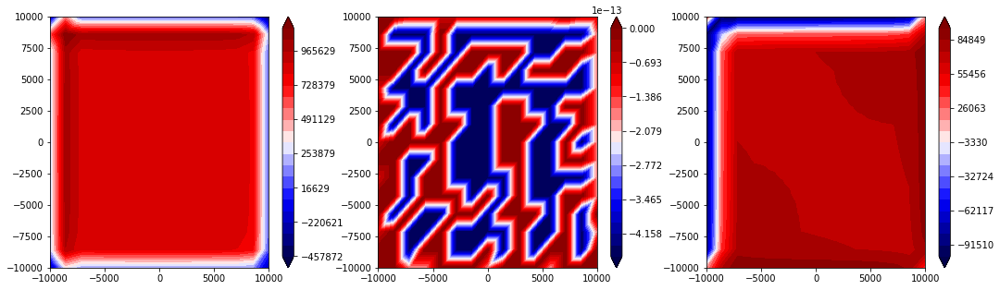

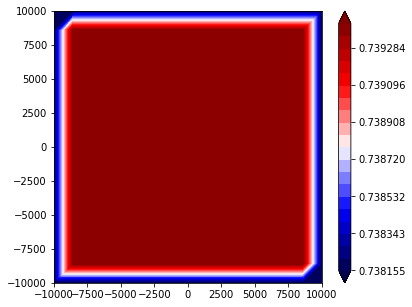

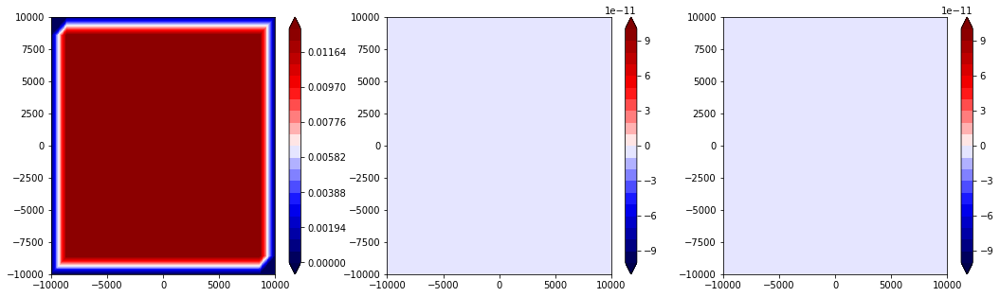

41 0.42


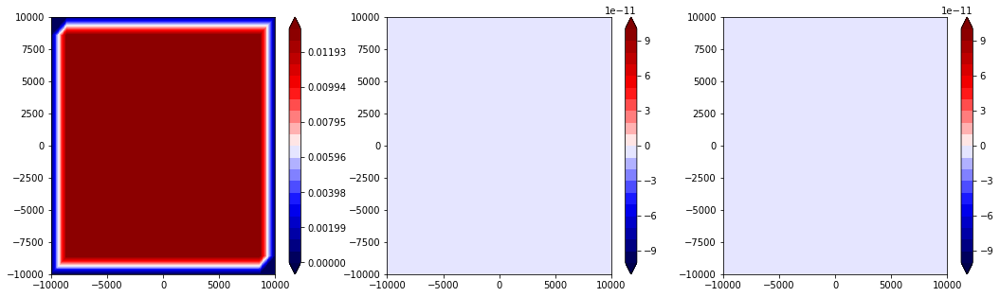

42 0.43


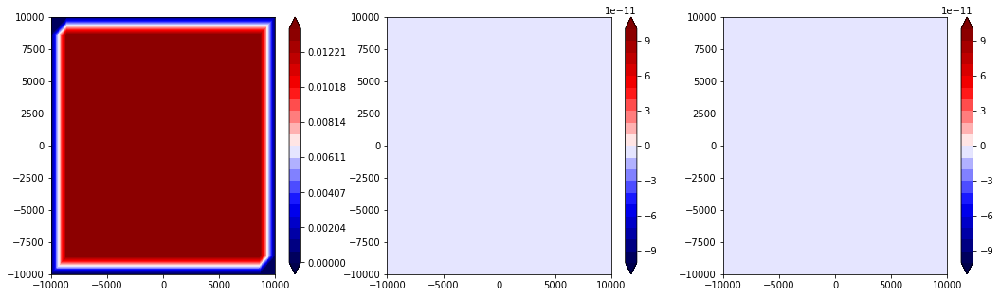

43 0.44


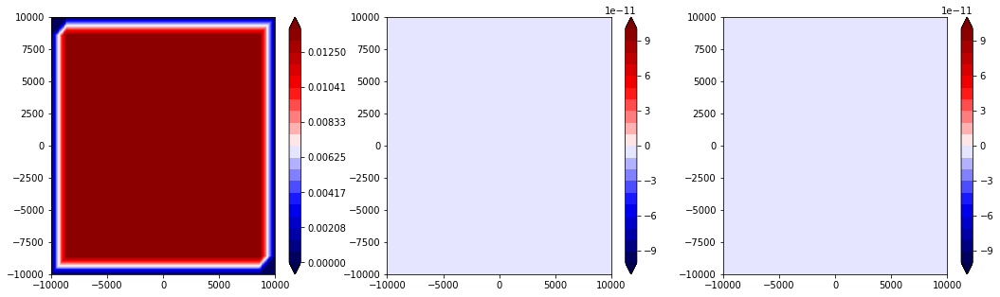

44 0.45


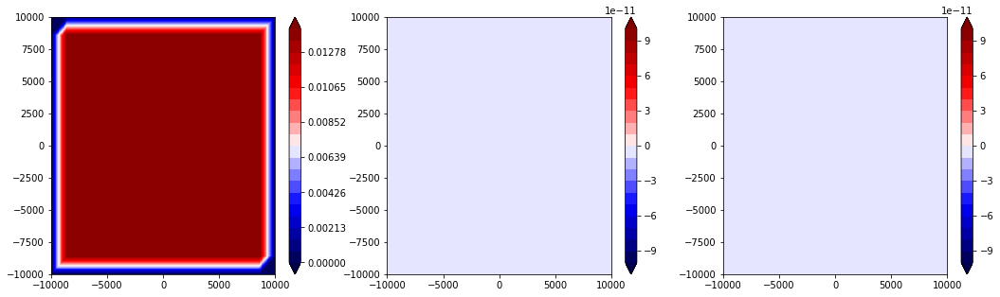

45 0.46


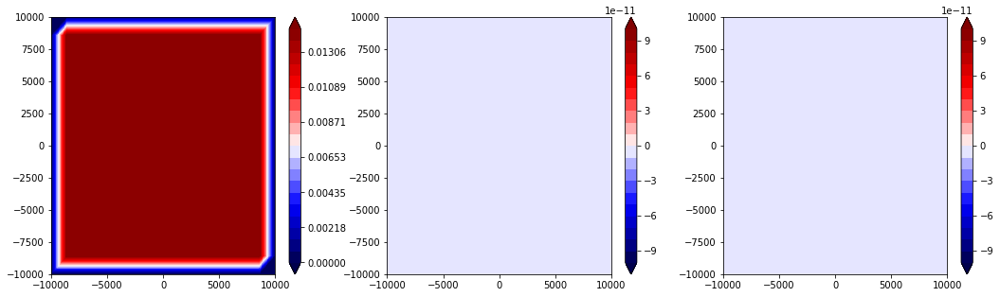

46 0.47


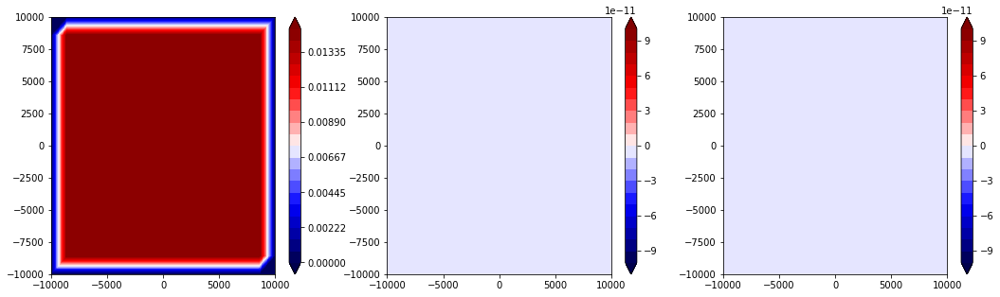

47 0.48


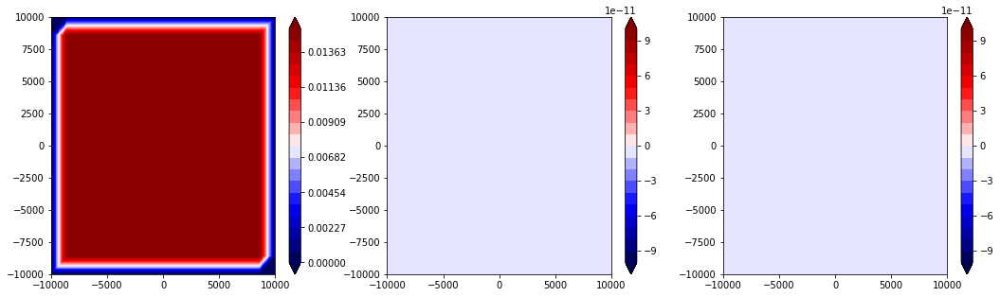

48 0.49


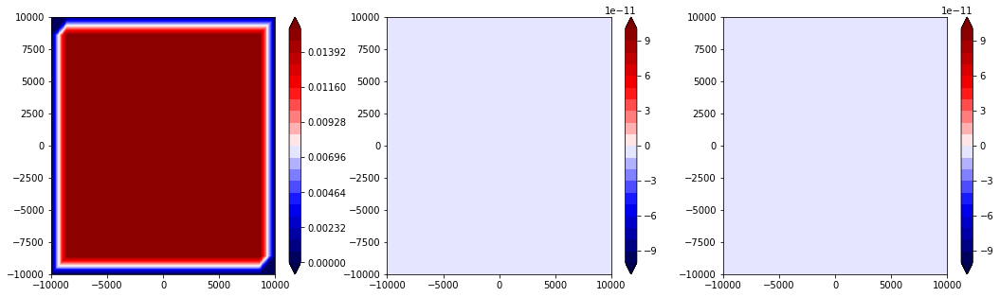

49 0.5


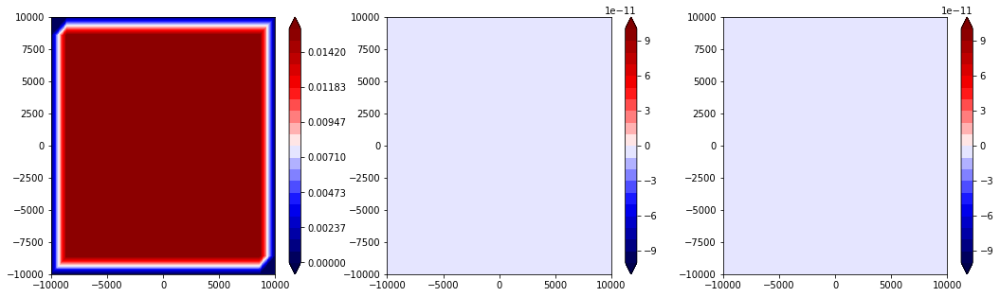

50 0.51


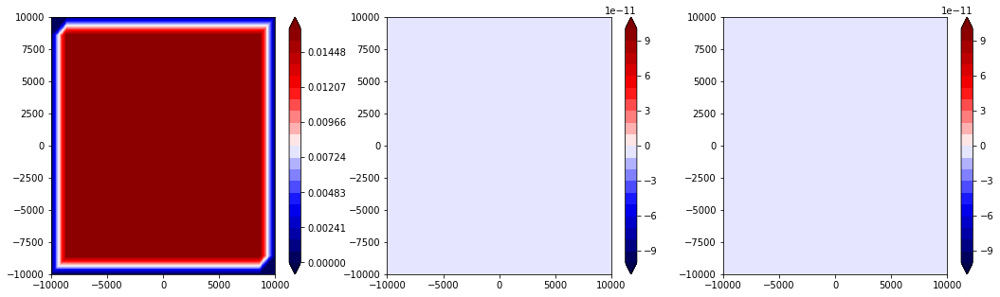

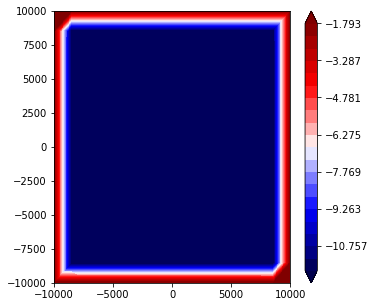

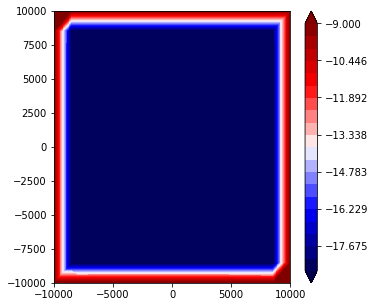

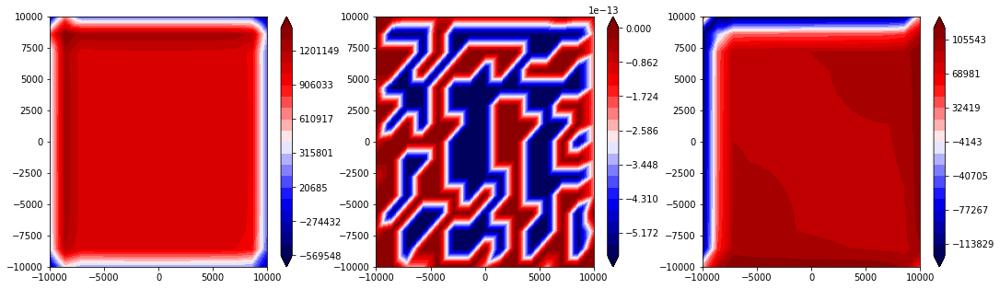

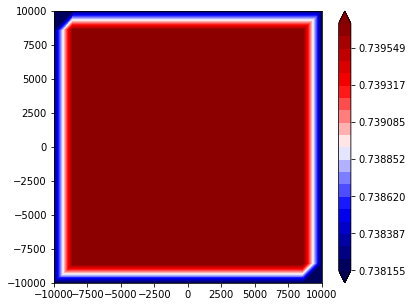

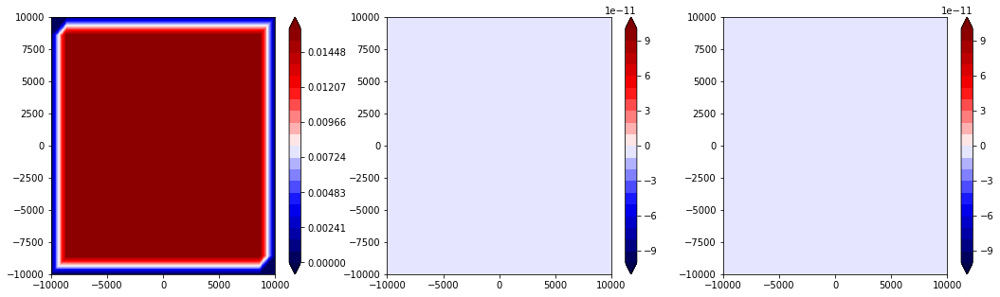

51 0.52


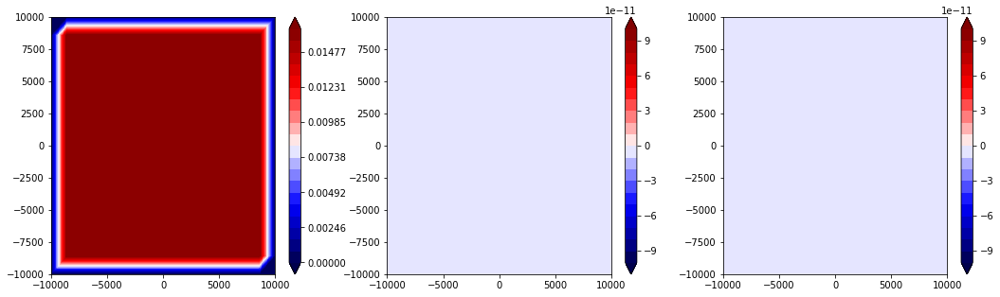

52 0.53


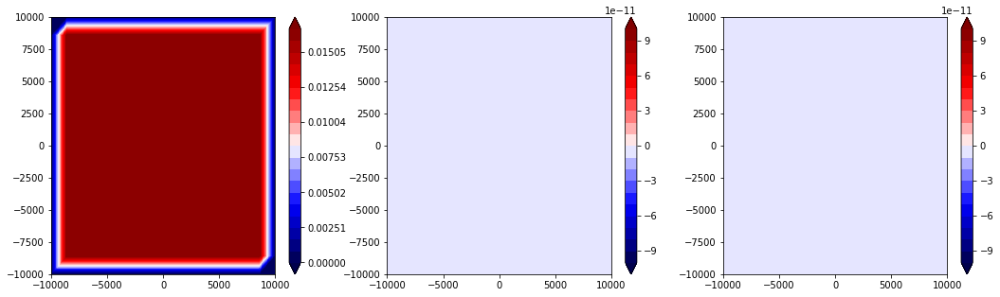

53 0.54


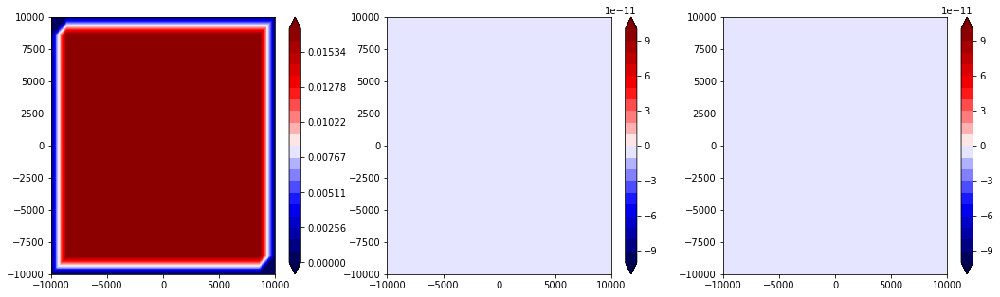

54 0.55


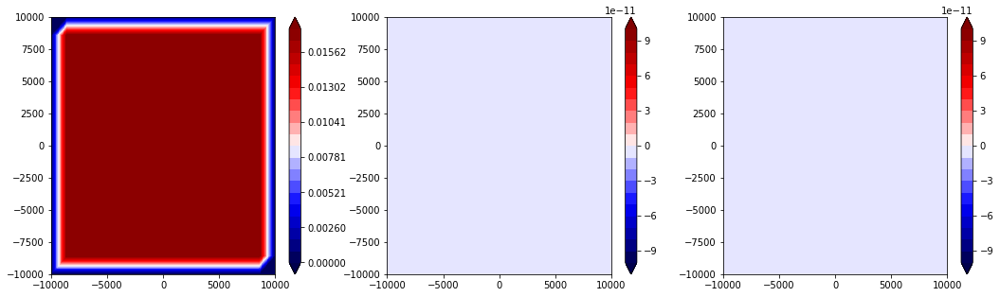

55 0.56


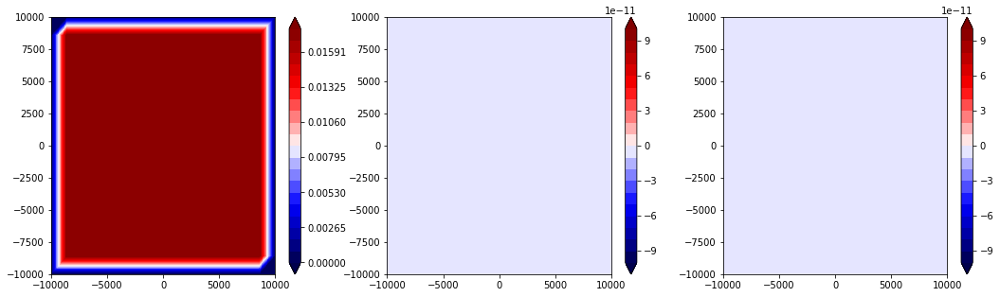

56 0.57


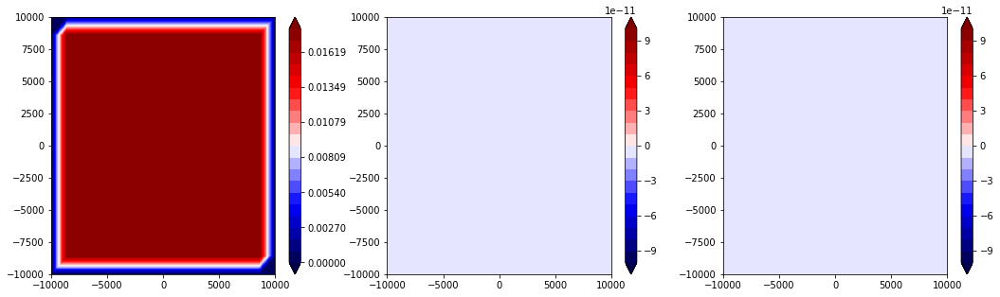

57 0.58


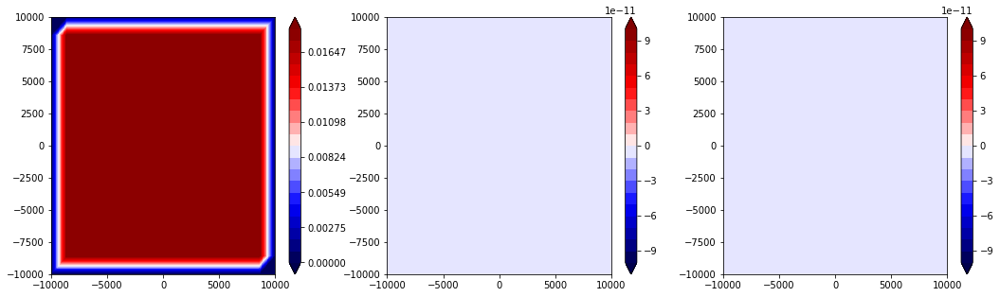

58 0.59


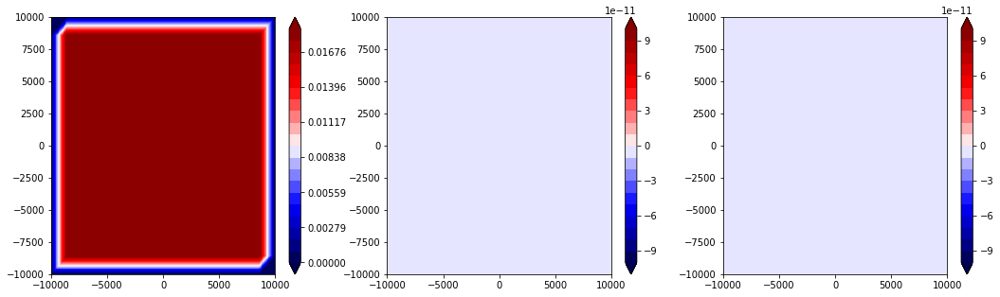

59 0.6


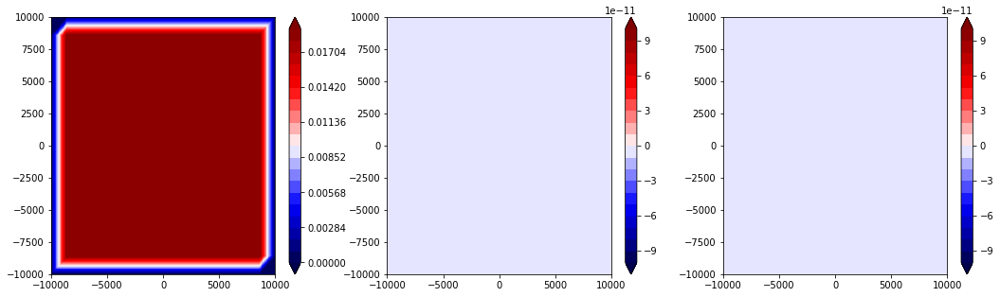

60 0.61


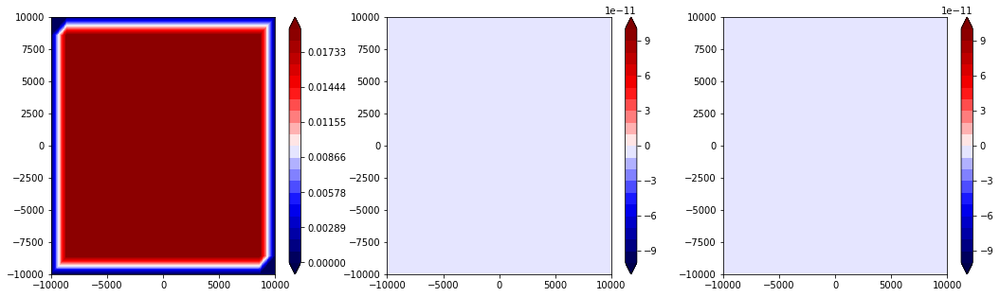

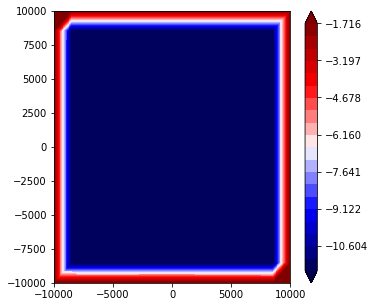

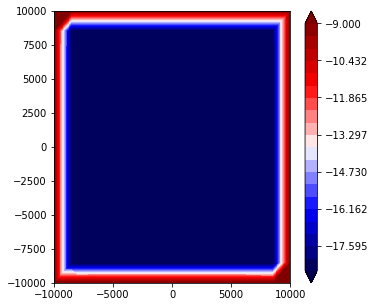

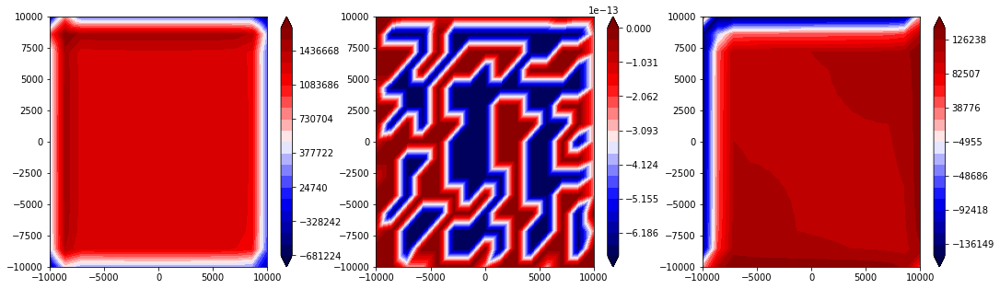

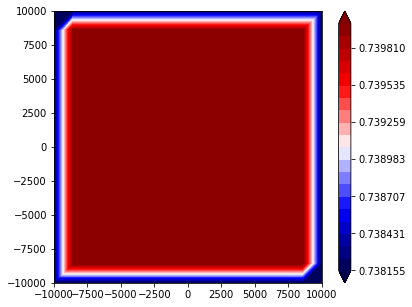

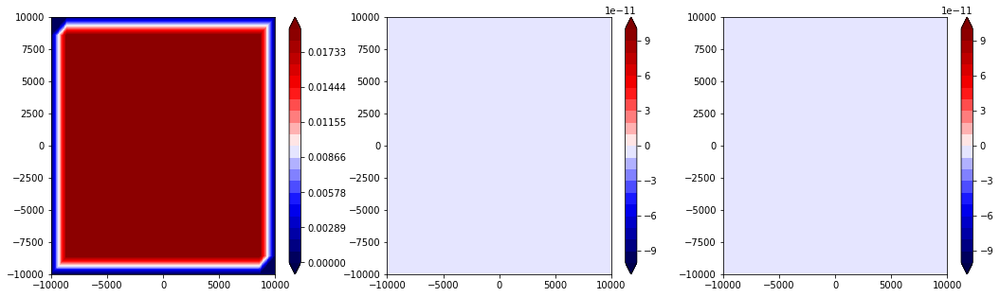

61 0.62


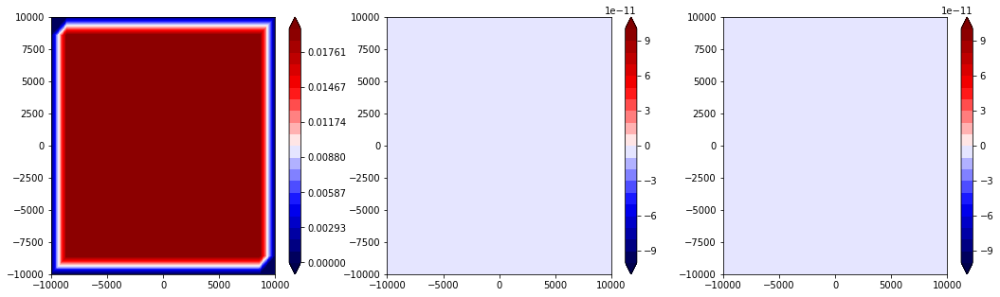

62 0.63


KeyboardInterrupt: 

In [15]:
t = 0
dt = siay / 100
y = initial_conditions.copy()
for i in range(100):
    derivs = f(t, y)
    t += dt
    y += derivs * dt
    print(i, t / siay)
    if i % 10 == 0:
        slip, state = get_slip_state(y)
        slip_deficit = get_slip_deficit(t, slip)
        traction = elastic_solve(slip_deficit)
        V = rate_state_solve(traction, state)
        plot_fields(np.log10(np.abs(slip)), ds = [0])
        plot_fields(np.log10(np.abs(V) + 1e-40), ds = [0])
        plot_fields(traction)
        plot_fields(state)